In [26]:
import numpy as np
import time
from math import sqrt, pi, exp
import functools
import scipy
import matplotlib.pylab as pl


from preconditioners.preconditioners import *
from eki_code.grad_inference import *

In [15]:
np.random.seed(1)

### Test case "banana"


In [16]:
# test case "banana"
y = 0
sigNoise = 0.5
sigPrior = 2

xmin = -2
xmax = 7
ymin= -1
ymax= 5

G = lambda u: ((u[1]-2)**2-(u[0]-3.5) -1)
Phi = lambda u: 0.5/(sigNoise**2)*(G(u)-y)**2 #likelihood


Text(0.5, 1.0, 'Posterior distribution')

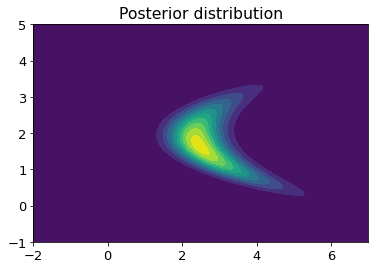

In [17]:
# potential function
I = lambda u: Phi(u) + 0.5/(sigPrior**2)*np.linalg.norm(u,axis=0)**2


# Plot test case
u0s = np.linspace(xmin,xmax,150)
u1s = np.linspace(ymin,ymax,150)
U0, U1 = np.meshgrid(u0s,u1s)
U = np.stack((U0,U1))


plt.figure()
plt.contourf(U0, U1, np.exp(-I(U)), 10)
plt.title("Posterior distribution")


In [18]:
# method for computing all gradients at once
def compute_gradients(points):
    vs = np.zeros_like(points)
    d, J = points.shape
    H = np.zeros((points.shape[0],points.shape[0],points.shape[1]))
    for i in range(J):
        return_dict= inferGradientAndHess(points, I(points), hessian = True, ind=i, additionalvariance=0.0)
        vs[:,i], H[:,:,i] = return_dict['grad'], return_dict['H']
    return vs, H


### Try algorithms 

In [ ]:
# parameters of all the algorithms

J = 20  # number of particles 
N_sim = 20000 # number of iterations
d = 2 # dimension
tau = 0.01 # step size
u0 = np.random.normal(0,1.0,(2,J)) # initial position of the particles

# parameters of our algorithm
const = 1.5 


In [39]:
# EKS (ALDI)
"""
start_time = time.time()
us_list_ALDI = np.zeros((d,J,N_sim))
us_list_ALDI[:,:,0] = u0
total_acc = 0
tau_ALDI = tau


y_algo = np.array([[y]])
for n in range(N_sim-1):   
    us = us_list_ALDI[:,:,n]
    m_us = np.mean(us, axis=1)[:,np.newaxis]
    G_us_unprocessed = G(us)
    #if G_us_unprocessed.ndim == 1: # this is just to catch an annoying thing when G has higher dimension
    G_us = G_us_unprocessed[np.newaxis,:]
    m_G_us = np.mean(G_us, axis=1)[np.newaxis, :]
    #else:
    #    G_us = G_us_unprocessed.T
    #    m_G_us = np.mean(G_us, axis=1)[:,np.newaxis]
    #m_G_us =  np.mean(G(us)[np.newaxis,:], axis=1)[np.newaxis, :]
    u_c = us-m_us 
    g_c = G_us- m_G_us
    D = 1/J*np.einsum('ij,lj->il', u_c, g_c) 
    C = np.cov(us)*(J-1)/J 
    E = np.cov(G_us)*(J-1)/J
    Csqrt = 1/sqrt(J)*u_c

    drift = -1/(sigNoise**2+ tau_ALDI*E)*D@(G_us-y_algo) - 1/sigPrior**2*C@us + (d+1)*1/J*(us-m_us)
    noise = np.random.normal(0,1,(J,J))
    diff = sqrt(2)*Csqrt@noise

    us_list_ALDI[:,:,n+1] = us+tau_ALDI*drift  + sqrt(tau_ALDI)*diff
    
print(f"ALDI without gradient: {time.time()-start_time} seconds")
"""

'\nstart_time = time.time()\nus_list_ALDI = np.zeros((d,J,N_sim))\nus_list_ALDI[:,:,0] = u0\ntotal_acc = 0\ntau_ALDI = tau\n\n\ny_algo = np.array([[y]])\nfor n in range(N_sim-1):   \n    us = us_list_ALDI[:,:,n]\n    m_us = np.mean(us, axis=1)[:,np.newaxis]\n    G_us_unprocessed = G(us)\n    #if G_us_unprocessed.ndim == 1: # this is just to catch an annoying thing when G has higher dimension\n    G_us = G_us_unprocessed[np.newaxis,:]\n    m_G_us = np.mean(G_us, axis=1)[np.newaxis, :]\n    #else:\n    #    G_us = G_us_unprocessed.T\n    #    m_G_us = np.mean(G_us, axis=1)[:,np.newaxis]\n    #m_G_us =  np.mean(G(us)[np.newaxis,:], axis=1)[np.newaxis, :]\n    u_c = us-m_us \n    g_c = G_us- m_G_us\n    D = 1/J*np.einsum(\'ij,lj->il\', u_c, g_c) \n    C = np.cov(us)*(J-1)/J \n    E = np.cov(G_us)*(J-1)/J\n    Csqrt = 1/sqrt(J)*u_c\n\n    drift = -1/(sigNoise**2+ tau_ALDI*E)*D@(G_us-y_algo) - 1/sigPrior**2*C@us + (d+1)*1/J*(us-m_us)\n    noise = np.random.normal(0,1,(J,J))\n    diff = sqrt(

In [19]:
"""
# EKS 2 (ALDI with gradient)

start_time = time.time()
us_list_ALDI2 = np.zeros((d,J,N_sim))
us_list_ALDI2[:,:,0] = u0
total_acc = 0
tau_ALDI2 = tau

y_algo = np.array([[y]])
for n in range(N_sim-1):   
    us = us_list_ALDI2[:,:,n]
    m_us = np.mean(us, axis=1)[:,np.newaxis]
    G_us_unprocessed = G(us)
    #if G_us_unprocessed.ndim == 1: # this is just to catch an annoying thing when G has higher dimension
    G_us = G_us_unprocessed[np.newaxis,:]
    m_G_us = np.mean(G_us, axis=1)[np.newaxis, :]
    #else:
    #    G_us = G_us_unprocessed.T
    #    m_G_us = np.mean(G_us, axis=1)[:,np.newaxis]
    #m_G_us =  np.mean(G(us)[np.newaxis,:], axis=1)[np.newaxis, :]
    u_c = us-m_us 
    g_c = G_us- m_G_us
    D = 1/J*np.einsum('ij,lj->il', u_c, g_c) 
    C = np.cov(us)*(J-1)/J 
    E = np.cov(G_us)*(J-1)/J
    Csqrt = 1/sqrt(J)*u_c
    
    vs, H = compute_gradients(us_list_ALDI2[:,:,n])
    
    #drift = -1/(sigNoise**2 + tau_ALDI*E)*D@(G_us-y_algo) - 1/sigPrior**2*C@us + (d+1)*1/J*(us-m_us) # original line
    drift = - np.dot(C,vs) + (d+1)*1/J*(us-m_us) 
    noise = np.random.normal(0,1,(J,J))
    diff = sqrt(2)*Csqrt@noise
    
    #print(Csqrt.shape)
    #print(noise.shape)
    
    us_list_ALDI2[:,:,n+1] = us+tau_ALDI2*drift  + sqrt(tau_ALDI2)*diff
print(f"ALDI with gradient: {time.time()-start_time} seconds")
"""


ALDI with gradient: 180.31277108192444 seconds


In [21]:
# Non reversible EKS (our algorithm) v2


start_time = time.time()
us_list_ALDINR = np.zeros((d,J,N_sim))
us_list_ALDINR[:,:,0] = u0
total_acc = 0
tau_ALDINR = tau
tol = 1e-3

#N_max= 90

y_algo = np.array([[y]])
for n in range(N_sim-1):   
    us = us_list_ALDINR[:,:,n] # shape (d, J)
    m_us = np.mean(us, axis=1)[:,np.newaxis] # shape (2, 1)
    G_us_unprocessed = G(us)   
    G_us = G_us_unprocessed[np.newaxis,:] # shape (dim_G, 20)
    m_G_us = np.mean(G_us, axis=1)[np.newaxis, :] # shape (dim_G, dim_G)
    u_c = us - m_us # shape (2, 20) 
    g_c = G_us- m_G_us # shape (dim_G, 20)
    D = 1/J*np.einsum('ij,lj->il', u_c, g_c) # shape (2, 1) = (d, dim_G)
    C = np.cov(us)*(J-1)/J # shape (2,2)
    Csqrt = 1/sqrt(J)*u_c # shape (2, 20)
    
    # compute sqrt C
    print("C: ")
    print(C)
    print()
    evaluesC, evectorsC = np.linalg.eig(C)
    # Ensuring square root matrix exists
    print("eigenvalues of C :")
    print(evaluesC)
    print()
    assert (evaluesC >= 0).all()
    sqrtC = evectorsC * np.sqrt(evaluesC) @ evectorsC.T 
    
    D_opt_tilde, test_v, lambda_min = construct_D_opt_tilde(C,2)
    D_opt = lambda_min *D_opt_tilde
    print('d opt')
    print(D_opt)
    
    # compute sqrt D
    evaluesD, evectorsD = np.linalg.eig(D_opt)
    evaluesD = evaluesD.round(decimals = 4, out = None)
    print('evalues of dopt')
    print(evaluesD)
    # Ensuring square root matrix exists
    assert (evaluesD >= -tol).all()
    sqrtD = evectorsD * np.sqrt(evaluesD) @ evectorsD.T 
    print('sqrt d')
    print(sqrtD)
       
    psis = construct_onb(d,test_v)
    
    
    #test jopt bis
    J_opt_tilde = construct_J_opt_tilde(psis, test_v, lambda_min, const, d) # shape (2, 2)
    J_opt = functools.reduce(np.dot, [sqrtC, J_opt_tilde, sqrtC])
    
    T = D_opt + J_opt
    print("T")
    print(T)
    evaluesT, evectorsT = np.linalg.eig(T)
    evaluesT = evaluesT.round(decimals = 4, out = None)
    print('evalues of topt')
    print(evaluesT)
    # Ensuring square root matrix exists
    assert (evaluesT >= -tol).all()
    
    vs, H = compute_gradients(us)
    
    #drift = - np.dot(D_opt,vs) - Csqrt.T@J_optbis@Csqrt + (d+1)*1/J*(us-m_us) # shape (2,20)
    drift = - np.dot(T,vs) + (d+1)*1/J*(us-m_us)
    #noise = np.random.normal(0,1,(2,J))
    #print(noise.shape)
    #diff = sqrt(2)*np.dot(sqrtD,noise) # CHANGE TO SQRT D
    #print(str('diff'))
    #print(diff)
    
    us_list_ALDINR[:,:,n+1] = us+tau_ALDINR*drift  #+ sqrt(tau_ALDINR)*diff
    #print(us_list_ALDINR[:,:,n+1])
    if np.mod(n,500)==0:
        print(n)
    #print(C)
    
print(f"ALDI: {time.time()-start_time} seconds")


C: 
[[ 1.20957205 -0.04488609]
 [-0.04488609  0.64749842]]

eigenvalues of C :
[1.21313399 0.64393647]

d opt
[[0.01251566 0.15771708]
 [0.15771708 1.98748434]]
evalues of dopt
[-0.  2.]
sqrt d
[[0.00884991 0.11152282]
 [0.11152282 1.40536365]]
T
[[ 0.01251566  3.72638569]
 [-3.41095153  1.98748434]]
evalues of topt
[1.+3.4257j 1.-3.4257j]
0
C: 
[[12.6529322   2.41061147]
 [ 2.41061147  0.58929754]]

eigenvalues of C :
[13.11679558  0.12543415]

d opt
[[ 0.07141105 -0.37110991]
 [-0.37110991  1.92858895]]
evalues of dopt
[-0.  2.]
sqrt d
[[ 0.05049524 -0.26241433]
 [-0.26241433  1.36371832]]
T
[[  0.07141105  26.21650158]
 [-26.9587214    1.92858895]]
evalues of topt
[1.+26.5688j 1.-26.5688j]
C: 
[[50.23357579 28.05383043]
 [28.05383043 26.29259416]]

eigenvalues of C :
[68.76406942  7.76210053]

d opt
[[ 0.60753756 -0.91976803]
 [-0.91976803  1.39246244]]
evalues of dopt
[0. 2.]
sqrt d
[[ 0.42959393 -0.65037421]
 [-0.65037421  0.98461963]]
T
[[ 0.60753756  6.81886943]
 [-8.65840549  1

C: 
[[ 81325024.05781662 -16971316.22559907]
 [-16971316.22559907  88870138.99625361]]

eigenvalues of C :
[6.77120196e+07 1.02483143e+08]

d opt
[[1.2169937 0.976173 ]
 [0.976173  0.7830063]]
evalues of dopt
[2. 0.]
sqrt d
[[0.8605445  0.69025855]
 [0.69025855 0.55366906]]
T
[[ 1.2169937   4.17482272]
 [-2.22247671  0.7830063 ]]
evalues of topt
[1.+3.0383j 1.-3.0383j]
C: 
[[ 81575745.4991293  -17027223.70534297]
 [-17027223.70534297  89129628.85852756]]

eigenvalues of C :
[6.79115967e+07 1.02793778e+08]

d opt
[[1.21655422 0.97627059]
 [0.97627059 0.78344578]]
evalues of dopt
[2. 0.]
sqrt d
[[0.86023374 0.69032756]
 [0.69032756 0.55397983]]
T
[[ 1.21655422  4.17505367]
 [-2.22251249  0.78344578]]
evalues of topt
[1.+3.0385j 1.-3.0385j]
C: 
[[ 81827217.98971847 -17083294.05468477]
 [-17083294.05468477  89389899.4745946 ]]

eigenvalues of C :
[6.81117741e+07 1.03105343e+08]

d opt
[[1.21611632 0.97636762]
 [0.97636762 0.78388368]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.8599241  0.6903961

C: 
[[ 90008009.34942406 -18905106.28738096]
 [-18905106.28738096  97858585.76259032]]

eigenvalues of C :
[7.46249851e+07 1.13241610e+08]

d opt
[[1.20329525 0.97911748]
 [0.97911748 0.79670475]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.85085823 0.69234061]
 [0.69234061 0.56335533]]
T
[[ 1.20329525  4.18195006]
 [-2.2237151   0.79670475]]
evalues of topt
[1.+3.0427j 1.-3.0427j]
C: 
[[ 90284747.54204151 -18966666.28175019]
 [-18966666.28175019  98145113.69305511]]

eigenvalues of C :
[7.48453470e+07 1.13584514e+08]

d opt
[[1.20290488 0.97919845]
 [0.97919845 0.79709512]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.8505822  0.69239787]
 [0.69239787 0.56363136]]
T
[[ 1.20290488  4.18215102]
 [-2.22375412  0.79709512]]
evalues of topt
[1.+3.0428j 1.-3.0428j]
C: 
[[ 90562315.11529954 -19028406.78744904]
 [-19028406.78744904  98432503.33337477]]

eigenvalues of C :
[7.50663714e+07 1.13928447e+08]

d opt
[[1.2025159  0.97927897]
 [0.97927897 0.7974841 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.85030715 0.6

C: 
[[ 9.95922125e+07 -2.10350197e+07]
 [-2.10350197e+07  1.07783396e+08]]

eigenvalues of C :
[8.22577803e+07 1.25117828e+08]

d opt
[[1.19111466 0.98156772]
 [0.98156772 0.80888534]]
evalues of dopt
[2. 0.]
sqrt d
[[0.84224526 0.69407319]
 [0.69407319 0.57196831]]
T
[[ 1.19111466  4.18816525]
 [-2.22502981  0.80888534]]
evalues of topt
[1.+3.0467j 1.-3.0467j]
C: 
[[ 9.98976798e+07 -2.11028413e+07]
 [-2.11028413e+07  1.08099767e+08]]

eigenvalues of C :
[8.25010845e+07 1.25496362e+08]

d opt
[[1.19076716 0.98163532]
 [0.98163532 0.80923284]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.84199953 0.69412099]
 [0.69412099 0.57221403]]
T
[[ 1.19076716  4.18834089]
 [-2.22507026  0.80923284]]
evalues of topt
[1.+3.0468j 1.-3.0468j]
C: 
[[ 1.00204063e+08 -2.11708628e+07]
 [-2.11708628e+07  1.08417088e+08]]

eigenvalues of C :
[8.27451200e+07 1.25876031e+08]

d opt
[[1.19042086 0.98170255]
 [0.98170255 0.80957914]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.84175466 0.69416853]
 [0.69416853 0.5724589 ]]
T

C: 
[[ 1.11186168e+08 -2.36070178e+07]
 [-2.36070178e+07  1.19792807e+08]]

eigenvalues of C :
[9.14934497e+07 1.39485526e+08]

d opt
[[1.17933459 0.98378814]
 [0.98378814 0.82066541]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.83391548 0.69564327]
 [0.69564327 0.58029808]]
T
[[ 1.17933459  4.19406818]
 [-2.2264919   0.82066541]]
evalues of topt
[1.+3.0506j 1.-3.0506j]
C: 
[[ 1.11526401e+08 -2.36824355e+07]
 [-2.36824355e+07  1.20145277e+08]]

eigenvalues of C :
[9.17645073e+07 1.39907171e+08]

d opt
[[1.17902782 0.98384401]
 [0.98384401 0.82097218]]
evalues of dopt
[2. 0.]
sqrt d
[[0.83369856 0.69568277]
 [0.69568277 0.580515  ]]
T
[[ 1.17902782  4.1942205 ]
 [-2.22653248  0.82097218]]
evalues of topt
[1.+3.0507j 1.-3.0507j]
C: 
[[ 1.11867654e+08 -2.37580764e+07]
 [-2.37580764e+07  1.20498806e+08]]

eigenvalues of C :
[9.20363793e+07 1.40330080e+08]

d opt
[[1.1787221  0.98389959]
 [0.98389959 0.8212779 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.83348239 0.69572208]
 [0.69572208 0.58073117]]
T

C: 
[[ 1.22969721e+08 -2.62174542e+07]
 [-2.62174542e+07  1.32001347e+08]]

eigenvalues of C :
[1.00882010e+08 1.54089058e+08]

d opt
[[1.16974492 0.98548803]
 [0.98548803 0.83025508]]
evalues of dopt
[2. 0.]
sqrt d
[[0.82713456 0.69684527]
 [0.69684527 0.587079  ]]
T
[[ 1.16974492  4.19879624]
 [-2.22782018  0.83025508]]
evalues of topt
[1.+3.0537j 1.-3.0537j]
C: 
[[ 1.23345297e+08 -2.63006088e+07]
 [-2.63006088e+07  1.32390505e+08]]

eigenvalues of C :
[1.01181275e+08 1.54554526e+08]

d opt
[[1.1694708  0.98553521]
 [0.98553521 0.8305292 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.82694073 0.69687863]
 [0.69687863 0.58727283]]
T
[[ 1.1694708   4.19893038]
 [-2.22785996  0.8305292 ]]
evalues of topt
[1.+3.0538j 1.-3.0538j]
C: 
[[ 1.23721999e+08 -2.63840102e+07]
 [-2.63840102e+07  1.32780831e+08]]

eigenvalues of C :
[1.01481440e+08 1.55021391e+08]

d opt
[[1.16919761 0.98558215]
 [0.98558215 0.83080239]]
evalues of dopt
[2. 0.]
sqrt d
[[0.82674756 0.69691182]
 [0.69691182 0.587466  ]]
T
[

C: 
[[ 1.37225001e+08 -2.93720117e+07]
 [-2.93720117e+07  1.46773369e+08]]

eigenvalues of C :
[1.1224170e+08 1.7175667e+08]

d opt
[[1.16043641 0.98704618]
 [0.98704618 0.83956359]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.82055245 0.69794705]
 [0.69794705 0.59366111]]
T
[[ 1.16043641  4.20332014]
 [-2.22922779  0.83956359]]
evalues of topt
[1.+3.0569j 1.-3.0569j]
C: 
[[ 1.37643342e+08 -2.94645414e+07]
 [-2.94645414e+07  1.47206909e+08]]

eigenvalues of C :
[1.12575090e+08 1.72275162e+08]

d opt
[[1.16019355 0.98708562]
 [0.98708562 0.83980645]]
evalues of dopt
[2. 0.]
sqrt d
[[0.82038073 0.69797494]
 [0.69797494 0.59383283]]
T
[[ 1.16019355  4.20343731]
 [-2.22926607  0.83980645]]
evalues of topt
[1.+3.0569j 1.-3.0569j]
C: 
[[ 1.38062939e+08 -2.95573464e+07]
 [-2.95573464e+07  1.47641752e+08]]

eigenvalues of C :
[1.12909481e+08 1.72795210e+08]

d opt
[[1.15995151 0.98712487]
 [0.98712487 0.84004849]]
evalues of dopt
[2. 0.]
sqrt d
[[0.82020958 0.69800269]
 [0.69800269 0.59400398]]
T
[[ 

C: 
[[ 1.51253584e+08 -3.24737578e+07]
 [-3.24737578e+07  1.61312482e+08]]

eigenvalues of C :
[1.23422109e+08 1.89143956e+08]

d opt
[[1.15305257 0.98821805]
 [0.98821805 0.84694743]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.81533129 0.69877568]
 [0.69877568 0.59888227]]
T
[[ 1.15305257  4.20686321]
 [-2.23042711  0.84694743]]
evalues of topt
[1.+3.0594j 1.-3.0594j]
C: 
[[ 1.51714017e+08 -3.25755249e+07]
 [-3.25755249e+07  1.61789698e+08]]

eigenvalues of C :
[1.23789081e+08 1.89714634e+08]

d opt
[[1.15283422 0.98825184]
 [0.98825184 0.84716578]]
evalues of dopt
[2. 0.]
sqrt d
[[0.81517689 0.69879958]
 [0.69879958 0.59903667]]
T
[[ 1.15283422  4.20696737]
 [-2.23046369  0.84716578]]
evalues of topt
[1.+3.0594j 1.-3.0594j]
C: 
[[ 1.52175832e+08 -3.26775954e+07]
 [-3.26775954e+07  1.62268348e+08]]

eigenvalues of C :
[1.24157154e+08 1.90287025e+08]

d opt
[[1.15261659 0.98828547]
 [0.98828547 0.84738341]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.81502301 0.69882336]
 [0.69882336 0.59919055]]
T

 [-2.23163776  0.85398209]]
evalues of topt
[1.+3.0618j 1.-3.0618j]
C: 
[[ 1.68218625e+08 -3.62222509e+07]
 [-3.62222509e+07  1.78896818e+08]]

eigenvalues of C :
[1.36944098e+08 2.10171345e+08]

d opt
[[1.14582267 0.98931074]
 [0.98931074 0.85417733]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.81021898 0.69954834]
 [0.69954834 0.60399458]]
T
[[ 1.14582267  4.21029379]
 [-2.2316723   0.85417733]]
evalues of topt
[1.+3.0618j 1.-3.0618j]
C: 
[[ 1.68729967e+08 -3.63351998e+07]
 [-3.63351998e+07  1.79426852e+08]]

eigenvalues of C :
[1.37351681e+08 2.10805138e+08]

d opt
[[1.14562806 0.98933941]
 [0.98933941 0.85437194]]
evalues of dopt
[2. 0.]
sqrt d
[[0.81008137 0.69956861]
 [0.69956861 0.60413219]]
T
[[ 1.14562806  4.21038561]
 [-2.23170679  0.85437194]]
evalues of topt
[1.+3.0619j 1.-3.0619j]
C: 
[[ 1.69242844e+08 -3.64484858e+07]
 [-3.64484858e+07  1.79958478e+08]]

eigenvalues of C :
[1.37760488e+08 2.11440834e+08]

d opt
[[1.14543409 0.98936794]
 [0.98936794 0.85456591]]
evalues of dopt
[

C: 
[[ 1.86493360e+08 -4.02579058e+07]
 [-4.02579058e+07  1.97840338e+08]]

eigenvalues of C :
[1.51511130e+08 2.32822568e+08]

d opt
[[1.13954959 0.99021508]
 [0.99021508 0.86045041]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.80578324 0.7001878 ]
 [0.7001878  0.60843032]]
T
[[ 1.13954959  4.21323965]
 [-2.23280948  0.86045041]]
evalues of topt
[1.+3.064j 1.-3.064j]
C: 
[[ 1.87059547e+08 -4.03829088e+07]
 [-4.03829088e+07  1.98427267e+08]]

eigenvalues of C :
[1.51962460e+08 2.33524353e+08]

d opt
[[1.13937538 0.99023962]
 [0.99023962 0.86062462]]
evalues of dopt
[2. 0.]
sqrt d
[[0.80566006 0.70020515]
 [0.70020515 0.6085535 ]]
T
[[ 1.13937538  4.21332105]
 [-2.23284182  0.86062462]]
evalues of topt
[1.+3.064j 1.-3.064j]
C: 
[[ 1.87627433e+08 -4.05082854e+07]
 [-4.05082854e+07  1.99015958e+08]]

eigenvalues of C :
[1.52415146e+08 2.34228245e+08]

d opt
[[1.13920174 0.99026404]
 [0.99026404 0.86079826]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.80553728 0.70022242]
 [0.70022242 0.60867629]]
T
[[ 

d opt
[[1.13377547 0.99101167]
 [0.99101167 0.86622453]]
evalues of dopt
[2. 0.]
sqrt d
[[0.80170032 0.70075107]
 [0.70075107 0.61251324]]
T
[[ 1.13377547  4.21592615]
 [-2.23390281  0.86622453]]
evalues of topt
[1.+3.066j 1.-3.066j]
C: 
[[ 2.07983967e+08 -4.50016233e+07]
 [-4.50016233e+07  2.20119009e+08]]

eigenvalues of C :
[1.68642668e+08 2.59460308e+08]

d opt
[[1.13361988 0.99103266]
 [0.99103266 0.86638012]]
evalues of dopt
[2. 0.]
sqrt d
[[0.8015903  0.70076591]
 [0.70076591 0.61262326]]
T
[[ 1.13361988  4.21599821]
 [-2.23393289  0.86638012]]
evalues of topt
[1.+3.066j 1.-3.066j]
C: 
[[ 2.08614654e+08 -4.51408103e+07]
 [-4.51408103e+07  2.20772844e+08]]

eigenvalues of C :
[1.69145444e+08 2.60242055e+08]

d opt
[[1.13346479 0.99105356]
 [0.99105356 0.86653521]]
evalues of dopt
[2. 0.]
sqrt d
[[0.80148064 0.70078069]
 [0.70078069 0.61273292]]
T
[[ 1.13346479  4.21607002]
 [-2.23396291  0.86653521]]
evalues of topt
[1.+3.0661j 1.-3.0661j]
C: 
[[ 2.09247235e+08 -4.52804136e+07]
 

C: 
[[ 2.30524117e+08 -4.99752528e+07]
 [-4.99752528e+07  2.43487033e+08]]

eigenvalues of C :
[1.86611774e+08 2.87399376e+08]

d opt
[[1.12861618 0.99169445]
 [0.99169445 0.87138382]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.79805215 0.70123387]
 [0.70123387 0.61616141]]
T
[[ 1.12861618  4.2183064 ]
 [-2.2349175   0.87138382]]
evalues of topt
[1.+3.0677j 1.-3.0677j]
C: 
[[ 2.31222459e+08 -5.01293236e+07]
 [-5.01293236e+07  2.44211042e+08]]

eigenvalues of C :
[1.87168507e+08 2.88264994e+08]

d opt
[[1.1284771  0.99171248]
 [0.99171248 0.8715229 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.79795381 0.70124662]
 [0.70124662 0.61625976]]
T
[[ 1.1284771   4.2183703 ]
 [-2.23494535  0.8715229 ]]
evalues of topt
[1.+3.0678j 1.-3.0678j]
C: 
[[ 2.31922898e+08 -5.02838555e+07]
 [-5.02838555e+07  2.44937225e+08]]

eigenvalues of C :
[1.87726912e+08 2.89133210e+08]

d opt
[[1.12833845 0.99173043]
 [0.99173043 0.87166155]]
evalues of dopt
[2. 0.]
sqrt d
[[0.79785577 0.70125931]
 [0.70125931 0.61635779]]
T

C: 
[[ 2.55482253e+08 -5.54809143e+07]
 [-5.54809143e+07  2.69362987e+08]]

eigenvalues of C :
[2.06509289e+08 3.18335951e+08]

d opt
[[1.12412723 0.99226631]
 [0.99226631 0.87587277]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.79487799 0.70163824]
 [0.70163824 0.61933557]]
T
[[ 1.12412723  4.22036197]
 [-2.23582935  0.87587277]]
evalues of topt
[1.+3.0693j 1.-3.0693j]
C: 
[[ 2.56255511e+08 -5.56514715e+07]
 [-5.56514715e+07  2.70164697e+08]]

eigenvalues of C :
[2.07125769e+08 3.19294439e+08]

d opt
[[1.12400241 0.99228192]
 [0.99228192 0.87599759]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.79478973 0.70164927]
 [0.70164927 0.61942384]]
T
[[ 1.12400241  4.22041892]
 [-2.23585509  0.87599759]]
evalues of topt
[1.+3.0693j 1.-3.0693j]
C: 
[[ 2.57031091e+08 -5.58225396e+07]
 [-5.58225396e+07  2.70968814e+08]]

eigenvalues of C :
[2.07744100e+08 3.20255805e+08]

d opt
[[1.12387798 0.99229746]
 [0.99229746 0.87612202]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.79470174 0.70166026]
 [0.70166026 0.61951182]]

[1.+3.0708j 1.-3.0708j]
C: 
[[ 2.85694247e+08 -6.21440266e+07]
 [-6.21440266e+07  3.00687146e+08]]

eigenvalues of C :
[2.30596154e+08 3.55785240e+08]

d opt
[[1.11976203 0.99280263]
 [0.99280263 0.88023797]]
evalues of dopt
[2. 0.]
sqrt d
[[0.79179132 0.70201747]
 [0.70201747 0.62242224]]
T
[[ 1.11976203  4.22234719]
 [-2.23674194  0.88023797]]
evalues of topt
[1.+3.0708j 1.-3.0708j]
C: 
[[ 2.86558196e+08 -6.23345467e+07]
 [-6.23345467e+07  3.01582913e+08]]

eigenvalues of C :
[2.31284957e+08 3.56856152e+08]

d opt
[[1.11965098 0.99281602]
 [0.99281602 0.88034902]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7917128  0.70202694]
 [0.70202694 0.62250076]]
T
[[ 1.11965098  4.22239752]
 [-2.23676548  0.88034902]]
evalues of topt
[1.+3.0709j 1.-3.0709j]
C: 
[[ 2.87424738e+08 -6.25256378e+07]
 [-6.25256378e+07  3.02481370e+08]]

eigenvalues of C :
[2.31975829e+08 3.57930279e+08]

d opt
[[1.11954029 0.99282935]
 [0.99282935 0.88045971]]
evalues of dopt
[2. 0.]
sqrt d
[[0.79163453 0.70203637]
 [0.702

C: 
[[ 3.18487276e+08 -6.93750174e+07]
 [-6.93750174e+07  3.34688356e+08]]

eigenvalues of C :
[2.56741472e+08 3.96434160e+08]

d opt
[[1.11597658 0.99325195]
 [0.99325195 0.88402342]]
evalues of dopt
[2. 0.]
sqrt d
[[0.78911461 0.70233519]
 [0.70233519 0.62509895]]
T
[[ 1.11597658  4.22405787]
 [-2.23755397  0.88402342]]
evalues of topt
[1.+3.0722j 1.-3.0722j]
C: 
[[ 3.19449665e+08 -6.95872112e+07]
 [-6.95872112e+07  3.35686215e+08]]

eigenvalues of C :
[2.57508777e+08 3.97627104e+08]

d opt
[[1.11587742 0.99326352]
 [0.99326352 0.88412258]]
evalues of dopt
[2. 0.]
sqrt d
[[0.78904449 0.70234337]
 [0.70234337 0.62516907]]
T
[[ 1.11587742  4.22410254]
 [-2.2375755   0.88412258]]
evalues of topt
[1.+3.0722j 1.-3.0722j]
C: 
[[ 3.20414944e+08 -6.98000411e+07]
 [-6.98000411e+07  3.36687071e+08]]

eigenvalues of C :
[2.58278387e+08 3.98823629e+08]

d opt
[[1.11577857 0.99327505]
 [0.99327505 0.88422143]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.78897459 0.70235152]
 [0.70235152 0.62523897]]
T
[

C: 
[[ 3.52882415e+08 -7.69581932e+07]
 [-7.69581932e+07  3.70351502e+08]]

eigenvalues of C :
[2.84164678e+08 4.39069239e+08]

d opt
[[1.11277323 0.99362075]
 [0.99362075 0.88722677]]
evalues of dopt
[2. 0.]
sqrt d
[[0.78684949 0.70259597]
 [0.70259597 0.62736407]]
T
[[ 1.11277323  4.22549763]
 [-2.23825612  0.88722677]]
evalues of topt
[1.+3.0733j 1.-3.0733j]
C: 
[[ 3.53948058e+08 -7.71931237e+07]
 [-7.71931237e+07  3.71456441e+08]]

eigenvalues of C :
[2.85014321e+08 4.40390178e+08]

d opt
[[1.11268407 0.99363087]
 [0.99363087 0.88731593]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.78678645 0.70260312]
 [0.70260312 0.62742711]]
T
[[ 1.11268407  4.2255376 ]
 [-2.23827586  0.88731593]]
evalues of topt
[1.+3.0733j 1.-3.0733j]
C: 
[[ 3.55016900e+08 -7.74287587e+07]
 [-7.74287587e+07  3.72564698e+08]]

eigenvalues of C :
[2.85866515e+08 4.41715083e+08]

d opt
[[1.11259518 0.99364094]
 [0.99364094 0.88740482]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7867236  0.70261025]
 [0.70261025 0.62748996]]
T
[

C: 
[[ 3.89791340e+08 -8.50946902e+07]
 [-8.50946902e+07  4.08621761e+08]]

eigenvalues of C :
[3.13592577e+08 4.84820524e+08]

d opt
[[1.10997283 0.99393459]
 [0.99393459 0.89002717]]
evalues of dopt
[2. 0.]
sqrt d
[[0.78486931 0.70281789]
 [0.70281789 0.62934425]]
T
[[ 1.10997283  4.22675039]
 [-2.2388812   0.89002717]]
evalues of topt
[1.+3.0743j 1.-3.0743j]
C: 
[[ 3.90967784e+08 -8.53540226e+07]
 [-8.53540226e+07  4.09841606e+08]]

eigenvalues of C :
[3.14530575e+08 4.86278815e+08]

d opt
[[1.10989237 0.99394349]
 [0.99394349 0.89010763]]
evalues of dopt
[2. 0.]
sqrt d
[[0.78481242 0.70282418]
 [0.70282418 0.62940114]]
T
[[ 1.10989237  4.2267863 ]
 [-2.23889932  0.89010763]]
evalues of topt
[1.+3.0743j 1.-3.0743j]
C: 
[[ 3.92147760e+08 -8.56141328e+07]
 [-8.56141328e+07  4.11065113e+08]]

eigenvalues of C :
[3.15471390e+08 4.87741484e+08]

d opt
[[1.10981217 0.99395236]
 [0.99395236 0.89018783]]
evalues of dopt
[2. 0.]
sqrt d
[[0.78475571 0.70283045]
 [0.70283045 0.62945785]]
T
[[ 

C: 
[[ 4.30537942e+08 -9.40764024e+07]
 [-9.40764024e+07  4.50871818e+08]]

eigenvalues of C :
[3.46080696e+08 5.35329063e+08]

d opt
[[1.10744545 0.99421098]
 [0.99421098 0.89255455]]
evalues of dopt
[2. 0.]
sqrt d
[[0.78308219 0.70301333]
 [0.70301333 0.63113137]]
T
[[ 1.10744545  4.22787632]
 [-2.23945435  0.89255455]]
evalues of topt
[1.+3.0752j 1.-3.0752j]
C: 
[[ 4.31836710e+08 -9.43626768e+07]
 [-9.43626768e+07  4.52218515e+08]]

eigenvalues of C :
[3.47116237e+08 5.36938989e+08]

d opt
[[1.10737283 0.99421883]
 [0.99421883 0.89262717]]
evalues of dopt
[2. 0.]
sqrt d
[[0.78303084 0.70301887]
 [0.70301887 0.63118273]]
T
[[ 1.10737283  4.2279086 ]
 [-2.23947095  0.89262717]]
evalues of topt
[1.+3.0752j 1.-3.0752j]
C: 
[[ 4.33139377e+08 -9.46498100e+07]
 [-9.46498100e+07  4.53569257e+08]]

eigenvalues of C :
[3.48154887e+08 5.38553747e+08]

d opt
[[1.10730043 0.99422664]
 [0.99422664 0.89269957]]
evalues of dopt
[2. 0.]
sqrt d
[[0.78297964 0.7030244 ]
 [0.7030244  0.63123392]]
T
[[ 

C: 
[[ 4.76955123e+08 -1.04307327e+08]
 [-1.04307327e+08  4.99002217e+08]]

eigenvalues of C :
[3.83090457e+08 5.92866882e+08]

d opt
[[1.10509805 0.99446186]
 [0.99446186 0.89490195]]
evalues of dopt
[2. 0.]
sqrt d
[[0.78142233 0.70319073]
 [0.70319073 0.63279123]]
T
[[ 1.10509805  4.22891808]
 [-2.23999435  0.89490195]]
evalues of topt
[1.+3.076j 1.-3.076j]
C: 
[[ 4.78393240e+08 -1.04624296e+08]
 [-1.04624296e+08  5.00493421e+08]]

eigenvalues of C :
[3.84237115e+08 5.94649546e+08]

d opt
[[1.10503268 0.99446877]
 [0.99446877 0.89496732]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7813761  0.70319561]
 [0.70319561 0.63283746]]
T
[[ 1.10503268  4.22894704]
 [-2.2400095   0.89496732]]
evalues of topt
[1.+3.076j 1.-3.076j]
C: 
[[ 4.79835675e+08 -1.04942216e+08]
 [-1.04942216e+08  5.01989103e+08]]

eigenvalues of C :
[3.85387215e+08 5.96437562e+08]

d opt
[[1.1049675  0.99447565]
 [0.99447565 0.8950325 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.78133001 0.70320048]
 [0.70320048 0.63288355]]
T
[[ 1.10

C: 
[[ 5.28352583e+08 -1.15635290e+08]
 [-1.15635290e+08  5.52297192e+08]]

eigenvalues of C :
[4.24071473e+08 6.56578302e+08]

d opt
[[1.10298454 0.99468296]
 [0.99468296 0.89701546]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.77992785 0.70334706]
 [0.70334706 0.63428571]]
T
[[ 1.10298454  4.22985277]
 [-2.24048686  0.89701546]]
evalues of topt
[1.+3.0767j 1.-3.0767j]
C: 
[[ 5.29945003e+08 -1.15986249e+08]
 [-1.15986249e+08  5.53948408e+08]]

eigenvalues of C :
[4.2534117e+08 6.5855224e+08]

d opt
[[1.10292567 0.99468905]
 [0.99468905 0.89707433]]
evalues of dopt
[2. 0.]
sqrt d
[[0.77988622 0.70335137]
 [0.70335137 0.63432734]]
T
[[ 1.10292567  4.22987876]
 [-2.24050066  0.89707433]]
evalues of topt
[1.+3.0768j 1.-3.0768j]
C: 
[[ 5.31542203e+08 -1.16338261e+08]
 [-1.16338261e+08  5.55604581e+08]]

eigenvalues of C :
[4.26614679e+08 6.60532105e+08]

d opt
[[1.10286697 0.99469512]
 [0.99469512 0.89713303]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.77984472 0.70335567]
 [0.70335567 0.63436885]]
T
[

C: 
[[ 5.87028007e+08 -1.28566677e+08]
 [-1.28566677e+08  6.13139264e+08]]

eigenvalues of C :
[4.70855776e+08 7.29311495e+08]

d opt
[[1.10102797 0.99488359]
 [0.99488359 0.89897203]]
evalues of dopt
[2. 0.]
sqrt d
[[0.77854435 0.70348893]
 [0.70348893 0.63566922]]
T
[[ 1.10102797  4.23071529]
 [-2.24094812  0.89897203]]
evalues of topt
[1.+3.0774j 1.-3.0774j]
C: 
[[ 5.88796579e+08 -1.28956441e+08]
 [-1.28956441e+08  6.14973149e+08]]

eigenvalues of C :
[4.72265934e+08 7.31503793e+08]

d opt
[[1.1009751  0.99488895]
 [0.99488895 0.8990249 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.77850696 0.70349273]
 [0.70349273 0.6357066 ]]
T
[[ 1.1009751   4.23073856]
 [-2.24096066  0.8990249 ]]
evalues of topt
[1.+3.0775j 1.-3.0775j]
C: 
[[ 5.90570461e+08 -1.29347375e+08]
 [-1.29347375e+08  6.16812539e+08]]

eigenvalues of C :
[4.73680327e+08 7.33702673e+08]

d opt
[[1.1009224 0.9948943]
 [0.9948943 0.8990776]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.77846969 0.70349651]
 [0.70349651 0.63574387]]
T
[[ 

C: 
[[ 6.50235771e+08 -1.42496387e+08]
 [-1.42496387e+08  6.78681418e+08]]

eigenvalues of C :
[5.21254164e+08 8.07663026e+08]

d opt
[[1.09931832 0.99505571]
 [0.99505571 0.90068168]]
evalues of dopt
[2. 0.]
sqrt d
[[0.77733544 0.70361064]
 [0.70361064 0.63687812]]
T
[[ 1.09931832  4.2314668 ]
 [-2.24135537  0.90068168]]
evalues of topt
[1.+3.078j 1.-3.078j]
C: 
[[ 6.52194104e+08 -1.42927957e+08]
 [-1.42927957e+08  6.80712082e+08]]

eigenvalues of C :
[5.22815634e+08 8.10090552e+08]

d opt
[[1.09927068 0.99506047]
 [0.99506047 0.90072932]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.77730175 0.703614  ]
 [0.703614   0.63691181]]
T
[[ 1.09927068  4.23148771]
 [-2.24136678  0.90072932]]
evalues of topt
[1.+3.0781j 1.-3.0781j]
C: 
[[ 6.54158317e+08 -1.43360822e+08]
 [-1.43360822e+08  6.82748842e+08]]

eigenvalues of C :
[5.24381793e+08 8.12525366e+08]

d opt
[[1.09922319 0.9950652 ]
 [0.9950652  0.90077681]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.77726817 0.70361735]
 [0.70361735 0.63694539]]
T
[

C: 
[[ 7.18063532e+08 -1.57443786e+08]
 [-1.57443786e+08  7.49014510e+08]]

eigenvalues of C :
[5.75336504e+08 8.91741539e+08]

d opt
[[1.09782075 0.99520405]
 [0.99520405 0.90217925]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7762765  0.70371553]
 [0.70371553 0.63793707]]
T
[[ 1.09782075  4.23212342]
 [-2.24171532  0.90217925]]
evalues of topt
[1.+3.0786j 1.-3.0786j]
C: 
[[ 7.20225497e+08 -1.57920218e+08]
 [-1.57920218e+08  7.51256335e+08]]

eigenvalues of C :
[5.77060345e+08 8.94421487e+08]

d opt
[[1.09777769 0.99520828]
 [0.99520828 0.90222231]]
evalues of dopt
[2. 0.]
sqrt d
[[0.77624605 0.70371852]
 [0.70371852 0.63796752]]
T
[[ 1.09777769  4.23214228]
 [-2.24172572  0.90222231]]
evalues of topt
[1.+3.0786j 1.-3.0786j]
C: 
[[ 7.22393953e+08 -1.58398080e+08]
 [-1.58398080e+08  7.53504891e+08]]

eigenvalues of C :
[5.78789363e+08 8.97109481e+08]

d opt
[[1.09773475 0.9952125 ]
 [0.9952125  0.90226525]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.77621569 0.70372151]
 [0.70372151 0.63799787]]
T
[

C: 
[[ 8.00126024e+08 -1.75527664e+08]
 [-1.75527664e+08  8.34108430e+08]]

eigenvalues of C :
[6.40769100e+08 9.93465353e+08]

d opt
[[1.09635034 0.99534748]
 [0.99534748 0.90364966]]
evalues of dopt
[2. 0.]
sqrt d
[[0.77523676 0.70381695]
 [0.70381695 0.6389768 ]]
T
[[ 1.09635034  4.23276663]
 [-2.24207166  0.90364966]]
evalues of topt
[1.+3.0791j 1.-3.0791j]
C: 
[[ 8.02534357e+08 -1.76058375e+08]
 [-1.76058375e+08  8.36605732e+08]]

eigenvalues of C :
[6.42689389e+08 9.96450699e+08]

d opt
[[1.09631176 0.99535122]
 [0.99535122 0.90368824]]
evalues of dopt
[2. 0.]
sqrt d
[[0.77520948 0.7038196 ]
 [0.7038196  0.63900408]]
T
[[ 1.09631176  4.23278349]
 [-2.24208105  0.90368824]]
evalues of topt
[1.+3.0791j 1.-3.0791j]
C: 
[[ 8.04949920e+08 -1.76590679e+08]
 [-1.76590679e+08  8.39110532e+08]]

eigenvalues of C :
[6.44615444e+08 9.99445008e+08]

d opt
[[1.09627329 0.99535494]
 [0.99535494 0.90372671]]
evalues of dopt
[2. 0.]
sqrt d
[[0.77518228 0.70382223]
 [0.70382223 0.63903128]]
T
[[ 

C: 
[[ 8.86198533e+08 -1.94494815e+08]
 [-1.94494815e+08  9.23360763e+08]]

eigenvalues of C :
[7.09399273e+08 1.10016002e+09]

d opt
[[1.09510226 0.99546751]
 [0.99546751 0.90489774]]
evalues of dopt
[2. 0.]
sqrt d
[[0.77435423 0.70390183]
 [0.70390183 0.63985933]]
T
[[ 1.09510226  4.23331142]
 [-2.2423764   0.90489774]]
evalues of topt
[1.+3.0796j 1.-3.0796j]
C: 
[[ 8.88865274e+08 -1.95082459e+08]
 [-1.95082459e+08  9.26126026e+08]]

eigenvalues of C :
[7.11525610e+08 1.10346569e+09]

d opt
[[1.09506747 0.99547083]
 [0.99547083 0.90493253]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.77432963 0.70390418]
 [0.70390418 0.63988393]]
T
[[ 1.09506747  4.23332659]
 [-2.24238492  0.90493253]]
evalues of topt
[1.+3.0796j 1.-3.0796j]
C: 
[[ 8.91540021e+08 -1.95671867e+08]
 [-1.95671867e+08  9.28899592e+08]]

eigenvalues of C :
[7.13658330e+08 1.10678128e+09]

d opt
[[1.09503279 0.99547414]
 [0.99547414 0.90496721]]
evalues of dopt
[2. 0.]
sqrt d
[[0.77430511 0.70390652]
 [0.70390652 0.63990845]]
T
[

C: 
[[ 9.78562377e+08 -2.14848004e+08]
 [-2.14848004e+08  1.01913707e+09]]

eigenvalues of C :
[7.83046014e+08 1.21465343e+09]

d opt
[[1.09400833 0.99557141]
 [0.99557141 0.90599167]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.77358071 0.7039753 ]
 [0.7039753  0.64063285]]
T
[[ 1.09400833  4.23378803]
 [-2.24264521  0.90599167]]
evalues of topt
[1.+3.0799j 1.-3.0799j]
C: 
[[ 9.81506415e+08 -2.15496744e+08]
 [-2.15496744e+08  1.02218988e+09]]

eigenvalues of C :
[7.85393458e+08 1.21830284e+09]

d opt
[[1.09397687 0.99557438]
 [0.99557438 0.90602313]]
evalues of dopt
[2. 0.]
sqrt d
[[0.77355846 0.7039774 ]
 [0.7039774  0.6406551 ]]
T
[[ 1.09397687  4.23380173]
 [-2.24265297  0.90602313]]
evalues of topt
[1.+3.08j 1.-3.08j]
C: 
[[ 9.84459291e+08 -2.16147432e+08]
 [-2.16147432e+08  1.02525186e+09]]

eigenvalues of C :
[7.8774795e+08 1.2219632e+09]

d opt
[[1.09394549 0.99557734]
 [0.99557734 0.90605451]]
evalues of dopt
[2. 0.]
sqrt d
[[0.77353628 0.70397949]
 [0.70397949 0.64067729]]
T
[[ 1.09

C: 
[[ 1.08704063e+09 -2.38751821e+08]
 [-2.38751821e+08  1.13162335e+09]]

eigenvalues of C :
[8.69541794e+08 1.34912218e+09]

d opt
[[1.09296194 0.99566966]
 [0.99566966 0.90703806]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7728408  0.70404477]
 [0.70404477 0.64137276]]
T
[[ 1.09296194  4.23424317]
 [-2.24290384  0.90703806]]
evalues of topt
[1.+3.0803j 1.-3.0803j]
C: 
[[ 1.09031034e+09 -2.39472317e+08]
 [-2.39472317e+08  1.13501387e+09]]

eigenvalues of C :
[8.72148922e+08 1.35317529e+09]

d opt
[[1.09293364 0.9956723 ]
 [0.9956723  0.90706636]]
evalues of dopt
[2. 0.]
sqrt d
[[0.77282079 0.70404664]
 [0.70404664 0.64139277]]
T
[[ 1.09293364  4.23425546]
 [-2.24291086  0.90706636]]
evalues of topt
[1.+3.0803j 1.-3.0803j]
C: 
[[ 1.09358987e+09 -2.40194976e+08]
 [-2.40194976e+08  1.13841458e+09]]

eigenvalues of C :
[8.74763877e+08 1.35724057e+09]

d opt
[[1.09290544 0.99567494]
 [0.99567494 0.90709456]]
evalues of dopt
[2. 0.]
sqrt d
[[0.77280085 0.7040485 ]
 [0.7040485  0.64141272]]
T
[

C: 
[[ 1.20028874e+09 -2.63706430e+08]
 [-2.63706430e+08  1.24905590e+09]]

eigenvalues of C :
[9.59840977e+08 1.48950366e+09]

d opt
[[1.0920721  0.99575234]
 [0.99575234 0.9079279 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.77221159 0.70410323]
 [0.70410323 0.64200197]]
T
[[ 1.0920721   4.23462962]
 [-2.24312493  0.9079279 ]]
evalues of topt
[1.+3.0806j 1.-3.0806j]
C: 
[[ 1.20389845e+09 -2.64501839e+08]
 [-2.64501839e+08  1.25279899e+09]]

eigenvalues of C :
[9.62719207e+08 1.49397823e+09]

d opt
[[1.0920465  0.99575471]
 [0.99575471 0.9079535 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.77219349 0.70410491]
 [0.70410491 0.64202008]]
T
[[ 1.0920465   4.23464073]
 [-2.24313131  0.9079535 ]]
evalues of topt
[1.+3.0806j 1.-3.0806j]
C: 
[[ 1.20751900e+09 -2.65299635e+08]
 [-2.65299635e+08  1.25655331e+09]]

eigenvalues of C :
[9.65606078e+08 1.49846624e+09]

d opt
[[1.09202098 0.99575707]
 [0.99575707 0.90797902]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.77217544 0.70410658]
 [0.70410658 0.64203812]]

C: 
[[ 1.33730394e+09 -2.93897925e+08]
 [-2.93897925e+08  1.39113387e+09]]

eigenvalues of C :
[1.06909113e+09 1.65934669e+09]

d opt
[[1.09119767 0.99583281]
 [0.99583281 0.90880233]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.77159327 0.70416013]
 [0.70416013 0.64262029]]
T
[[ 1.09119767  4.23500885]
 [-2.24334323  0.90880233]]
evalues of topt
[1.+3.081j 1.-3.081j]
C: 
[[ 1.34132501e+09 -2.94783968e+08]
 [-2.94783968e+08  1.39530352e+09]]

eigenvalues of C :
[1.07229736e+09 1.66433117e+09]

d opt
[[1.09117471 0.99583491]
 [0.99583491 0.90882529]]
evalues of dopt
[2. 0.]
sqrt d
[[0.77157704 0.70416162]
 [0.70416162 0.64263652]]
T
[[ 1.09117471  4.2350188 ]
 [-2.24334897  0.90882529]]
evalues of topt
[1.+3.081j 1.-3.081j]
C: 
[[ 1.34535814e+09 -2.95672672e+08]
 [-2.95672672e+08  1.39948568e+09]]

eigenvalues of C :
[1.07551321e+09 1.66933061e+09]

d opt
[[1.09115183 0.99583701]
 [0.99583701 0.90884817]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.77156086 0.7041631 ]
 [0.7041631  0.64265271]]
T
[[ 

T
[[ 1.09043416  4.23533954]
 [-2.24353467  0.90956584]]
evalues of topt
[1.+3.0812j 1.-3.0812j]
C: 
[[ 1.48993299e+09 -3.27529699e+08]
 [-3.27529699e+08  1.54940279e+09]]

eigenvalues of C :
[1.19079121e+09 1.84854457e+09]

d opt
[[1.09041351 0.99590431]
 [0.99590431 0.90958649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.77103879 0.70421069]
 [0.70421069 0.64317477]]
T
[[ 1.09041351  4.23534848]
 [-2.24353986  0.90958649]]
evalues of topt
[1.+3.0812j 1.-3.0812j]
C: 
[[ 1.49441229e+09 -3.28516706e+08]
 [-3.28516706e+08  1.55404760e+09]]

eigenvalues of C :
[1.19436282e+09 1.85409706e+09]

d opt
[[1.09039293 0.99590618]
 [0.99590618 0.90960707]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.77102423 0.70421201]
 [0.70421201 0.64318933]]
T
[[ 1.09039293  4.23535739]
 [-2.24354503  0.90960707]]
evalues of topt
[1.+3.0812j 1.-3.0812j]
C: 
[[ 1.49890503e+09 -3.29506677e+08]
 [-3.29506677e+08  1.55870635e+09]]

eigenvalues of C :
[1.19794514e+09 1.85966623e+09]

d opt
[[1.0903724  0.99590804]
 [0.99590804

C: 
[[ 1.64507544e+09 -3.61715098e+08]
 [-3.61715098e+08  1.71027808e+09]]

eigenvalues of C :
[1.31449546e+09 2.04085806e+09]

d opt
[[1.08976597 0.99596289]
 [0.99596289 0.91023403]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7705809  0.70425211]
 [0.70425211 0.64363266]]
T
[[ 1.08976597  4.23562863]
 [-2.24370286  0.91023403]]
evalues of topt
[1.+3.0815j 1.-3.0815j]
C: 
[[ 1.65002051e+09 -3.62804733e+08]
 [-3.62804733e+08  1.71540588e+09]]

eigenvalues of C :
[1.31843845e+09 2.04698793e+09]

d opt
[[1.08974733 0.99596457]
 [0.99596457 0.91025267]]
evalues of dopt
[2. 0.]
sqrt d
[[0.77056773 0.7042533 ]
 [0.7042533  0.64364583]]
T
[[ 1.08974733  4.23563669]
 [-2.24370755  0.91025267]]
evalues of topt
[1.+3.0815j 1.-3.0815j]
C: 
[[ 1.65498042e+09 -3.63897639e+08]
 [-3.63897639e+08  1.72054907e+09]]

eigenvalues of C :
[1.32239329e+09 2.05313621e+09]

d opt
[[1.08972876 0.99596624]
 [0.99596624 0.91027124]]
evalues of dopt
[2. 0.]
sqrt d
[[0.77055459 0.70425448]
 [0.70425448 0.64365897]]
T
[

T
[[ 1.08916299  4.23588923]
 [-2.24385514  0.91083701]]
evalues of topt
[1.+3.0817j 1.-3.0817j]
C: 
[[ 1.82728518e+09 -4.01864544e+08]
 [-4.01864544e+08  1.89922096e+09]]

eigenvalues of C :
[1.45978213e+09 2.26672401e+09]

d opt
[[1.08914618 0.99601855]
 [0.99601855 0.91085382]]
evalues of dopt
[2. 0.]
sqrt d
[[0.77014265 0.70429147]
 [0.70429147 0.64407091]]
T
[[ 1.08914618  4.2358965 ]
 [-2.24385939  0.91085382]]
evalues of topt
[1.+3.0817j 1.-3.0817j]
C: 
[[ 1.83277728e+09 -4.03074713e+08]
 [-4.03074713e+08  1.90491602e+09]]

eigenvalues of C :
[1.46416131e+09 2.27353199e+09]

d opt
[[1.08912942 0.99602005]
 [0.99602005 0.91087058]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7701308  0.70429253]
 [0.70429253 0.64408277]]
T
[[ 1.08912942  4.23590374]
 [-2.24386363  0.91087058]]
evalues of topt
[1.+3.0817j 1.-3.0817j]
C: 
[[ 1.83828588e+09 -4.04288514e+08]
 [-4.04288514e+08  1.91062817e+09]]

eigenvalues of C :
[1.46855364e+09 2.28036040e+09]

d opt
[[1.0891127  0.99602155]
 [0.99602155 0

C: 
[[ 2.01750690e+09 -4.43779253e+08]
 [-4.43779253e+08  2.09647199e+09]]

eigenvalues of C :
[1.61145730e+09 2.50252159e+09]

d opt
[[1.08861884 0.99606561]
 [0.99606561 0.91138116]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76976976 0.70432475]
 [0.70432475 0.6444438 ]]
T
[[ 1.08861884  4.23612421]
 [-2.24399298  0.91138116]]
evalues of topt
[1.+3.0819j 1.-3.0819j]
C: 
[[ 2.02357010e+09 -4.45115255e+08]
 [-4.45115255e+08  2.10275924e+09]]

eigenvalues of C :
[1.61629185e+09 2.51003749e+09]

d opt
[[1.08860366 0.99606696]
 [0.99606696 0.91139634]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76975903 0.7043257 ]
 [0.7043257  0.64445453]]
T
[[ 1.08860366  4.23613076]
 [-2.24399683  0.91139634]]
evalues of topt
[1.+3.0819j 1.-3.0819j]
C: 
[[ 2.02965150e+09 -4.46455268e+08]
 [-4.46455268e+08  2.10906537e+09]]

eigenvalues of C :
[1.62114091e+09 2.51757596e+09]

d opt
[[1.08858853 0.99606831]
 [0.99606831 0.91141147]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76974833 0.70432665]
 [0.70432665 0.64446523]]
T

C: 
[[ 2.22083505e+09 -4.88581784e+08]
 [-4.88581784e+08  2.30731382e+09]]

eigenvalues of C :
[1.77358305e+09 2.75456583e+09]

d opt
[[1.08815524 0.99610675]
 [0.99610675 0.91184476]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76944195 0.70435384]
 [0.70435384 0.64477162]]
T
[[ 1.08815524  4.23632423]
 [-2.24411074  0.91184476]]
evalues of topt
[1.+3.082j 1.-3.082j]
C: 
[[ 2.22750869e+09 -4.90052291e+08]
 [-4.90052291e+08  2.31423407e+09]]

eigenvalues of C :
[1.77890434e+09 2.76283842e+09]

d opt
[[1.08814146 0.99610797]
 [0.99610797 0.91185854]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7694322  0.7043547 ]
 [0.7043547  0.64478136]]
T
[[ 1.08814146  4.23633018]
 [-2.24411424  0.91185854]]
evalues of topt
[1.+3.0821j 1.-3.0821j]
C: 
[[ 2.23420236e+09 -4.91527212e+08]
 [-4.91527212e+08  2.32117510e+09]]

eigenvalues of C :
[1.78424161e+09 2.77113586e+09]

d opt
[[1.08812772 0.99610918]
 [0.99610918 0.91187228]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76942249 0.70435556]
 [0.70435556 0.64479107]]
T
[[ 

C: 
[[ 2.47414896e+09 -5.44398334e+08]
 [-5.44398334e+08  2.56998863e+09]]

eigenvalues of C :
[1.9755655e+09 3.0685721e+09]

d opt
[[1.08768444 0.9961483 ]
 [0.9961483  0.91231556]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76910904 0.70438322]
 [0.70438322 0.64510452]]
T
[[ 1.08768444  4.23652721]
 [-2.24423061  0.91231556]]
evalues of topt
[1.+3.0822j 1.-3.0822j]
C: 
[[ 2.48158311e+09 -5.46036412e+08]
 [-5.46036412e+08  2.57769750e+09]]

eigenvalues of C :
[1.98149319e+09 3.07778742e+09]

d opt
[[1.08767208 0.99614939]
 [0.99614939 0.91232792]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7691003  0.70438399]
 [0.70438399 0.64511326]]
T
[[ 1.08767208  4.23653254]
 [-2.24423376  0.91232792]]
evalues of topt
[1.+3.0822j 1.-3.0822j]
C: 
[[ 2.48903958e+09 -5.47679408e+08]
 [-5.47679408e+08  2.58542952e+09]]

eigenvalues of C :
[1.98743869e+09 3.08703041e+09]

d opt
[[1.08765975 0.99615047]
 [0.99615047 0.91234025]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76909159 0.70438476]
 [0.70438476 0.64512198]]
T
[[ 

C: 
[[ 2.74807335e+09 -6.04756179e+08]
 [-6.04756179e+08  2.85403562e+09]]

eigenvalues of C :
[2.19398197e+09 3.40812700e+09]

d opt
[[1.08727316 0.99618442]
 [0.99618442 0.91272684]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76881822 0.70440876]
 [0.70440876 0.64539534]]
T
[[ 1.08727316  4.23670441]
 [-2.24433558  0.91272684]]
evalues of topt
[1.+3.0824j 1.-3.0824j]
C: 
[[ 2.75632989e+09 -6.06575463e+08]
 [-6.06575463e+08  2.86259727e+09]]

eigenvalues of C :
[2.20056541e+09 3.41836175e+09]

d opt
[[1.08726203 0.99618539]
 [0.99618539 0.91273797]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76881035 0.70440945]
 [0.70440945 0.64540321]]
T
[[ 1.08726203  4.23670921]
 [-2.24433842  0.91273797]]
evalues of topt
[1.+3.0824j 1.-3.0824j]
C: 
[[ 2.76461122e+09 -6.08400210e+08]
 [-6.08400210e+08  2.87118462e+09]]

eigenvalues of C :
[2.20716861e+09 3.42862723e+09]

d opt
[[1.08725094 0.99618637]
 [0.99618637 0.91274906]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76880251 0.70441013]
 [0.70441013 0.64541105]]

C: 
[[ 2.99785425e+09 -6.59794043e+08]
 [-6.59794043e+08  3.11304695e+09]]

eigenvalues of C :
[2.39314741e+09 3.71775379e+09]

d opt
[[1.08696372 0.99621148]
 [0.99621148 0.91303628]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76859942 0.70442789]
 [0.70442789 0.64561414]]
T
[[ 1.08696372  4.23683765]
 [-2.2444147   0.91303628]]
evalues of topt
[1.+3.0825j 1.-3.0825j]
C: 
[[ 3.00686069e+09 -6.61778562e+08]
 [-6.61778562e+08  3.12238622e+09]]

eigenvalues of C :
[2.40032879e+09 3.72891812e+09]

d opt
[[1.08695353 0.99621237]
 [0.99621237 0.91304647]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76859221 0.70442852]
 [0.70442852 0.64562135]]
T
[[ 1.08695353  4.23684204]
 [-2.24441731  0.91304647]]
evalues of topt
[1.+3.0825j 1.-3.0825j]
C: 
[[ 3.01589417e+09 -6.63769039e+08]
 [-6.63769039e+08  3.13175353e+09]]

eigenvalues of C :
[2.40753173e+09 3.74011597e+09]

d opt
[[1.08694336 0.99621326]
 [0.99621326 0.91305664]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76858502 0.70442915]
 [0.70442915 0.64562854]]
T
[

C: 
[[ 3.29988357e+09 -7.26344482e+08]
 [-7.26344482e+08  3.42623754e+09]]

eigenvalues of C :
[2.63397370e+09 4.09214741e+09]

d opt
[[1.08665221 0.99623862]
 [0.99623862 0.91334779]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76837914 0.70444709]
 [0.70444709 0.64583442]]
T
[[ 1.08665221  4.23697173]
 [-2.24449448  0.91334779]]
evalues of topt
[1.+3.0826j 1.-3.0826j]
C: 
[[ 3.30979678e+09 -7.28528799e+08]
 [-7.28528799e+08  3.43651708e+09]]

eigenvalues of C :
[2.64187811e+09 4.10443576e+09]

d opt
[[1.08664295 0.99623943]
 [0.99623943 0.91335705]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7683726  0.70444766]
 [0.70444766 0.64584097]]
T
[[ 1.08664295  4.23697571]
 [-2.24449685  0.91335705]]
evalues of topt
[1.+3.0826j 1.-3.0826j]
C: 
[[ 3.31973975e+09 -7.30719675e+08]
 [-7.30719675e+08  3.44682749e+09]]

eigenvalues of C :
[2.64980624e+09 4.11676100e+09]

d opt
[[1.08663371 0.99624023]
 [0.99624023 0.91336629]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76836607 0.70444822]
 [0.70444822 0.64584749]]
T
[

C: 
[[ 3.64323242e+09 -8.01999362e+08]
 [-8.01999362e+08  3.78227462e+09]]

eigenvalues of C :
[2.90774659e+09 4.51776045e+09]

d opt
[[1.08636087 0.99626392]
 [0.99626392 0.91363913]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76817314 0.70446497]
 [0.70446497 0.64604042]]
T
[[ 1.08636087  4.23709705]
 [-2.24456921  0.91363913]]
evalues of topt
[1.+3.0827j 1.-3.0827j]
C: 
[[ 3.65417645e+09 -8.04410813e+08]
 [-8.04410813e+08  3.79362308e+09]]

eigenvalues of C :
[2.91647293e+09 4.53132660e+09]

d opt
[[1.08635249 0.99626465]
 [0.99626465 0.91364751]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76816721 0.70446549]
 [0.70446549 0.64604635]]
T
[[ 1.08635249  4.23710066]
 [-2.24457136  0.91364751]]
evalues of topt
[1.+3.0827j 1.-3.0827j]
C: 
[[ 3.66515333e+09 -8.06829503e+08]
 [-8.06829503e+08  3.80500560e+09]]

eigenvalues of C :
[2.92522546e+09 4.54493347e+09]

d opt
[[1.08634413 0.99626537]
 [0.99626537 0.91365587]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7681613  0.704466  ]
 [0.704466   0.64605226]]
T
[

C: 
[[ 4.02228419e+09 -8.85521094e+08]
 [-8.85521094e+08  4.17533402e+09]]

eigenvalues of C :
[3.20998760e+09 4.98763061e+09]

d opt
[[1.08609706 0.99628675]
 [0.99628675 0.91390294]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76798659 0.70448112]
 [0.70448112 0.64622697]]
T
[[ 1.08609706  4.23721049]
 [-2.24463698  0.91390294]]
evalues of topt
[1.+3.0828j 1.-3.0828j]
C: 
[[ 4.03436622e+09 -8.88183295e+08]
 [-8.88183295e+08  4.18786254e+09]]

eigenvalues of C :
[3.21962134e+09 5.00260742e+09]

d opt
[[1.08608946 0.99628741]
 [0.99628741 0.91391054]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76798122 0.70448158]
 [0.70448158 0.64623234]]
T
[[ 1.08608946  4.23721376]
 [-2.24463893  0.91391054]]
evalues of topt
[1.+3.0828j 1.-3.0828j]
C: 
[[ 4.04648453e+09 -8.90853489e+08]
 [-8.90853489e+08  4.20042867e+09]]

eigenvalues of C :
[3.2292840e+09 5.0176292e+09]

d opt
[[1.08608189 0.99628806]
 [0.99628806 0.91391811]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76797587 0.70448205]
 [0.70448205 0.64623769]]
T

C: 
[[ 4.48088681e+09 -9.86571291e+08]
 [-9.86571291e+08  4.65088405e+09]]

eigenvalues of C :
[3.57565935e+09 5.55611150e+09]

d opt
[[1.08583759 0.99630914]
 [0.99630914 0.91416241]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76780312 0.70449695]
 [0.70449695 0.64641044]]
T
[[ 1.08583759  4.23732201]
 [-2.24470373  0.91416241]]
evalues of topt
[1.+3.0829j 1.-3.0829j]
C: 
[[ 4.49434568e+09 -9.89536868e+08]
 [-9.89536868e+08  4.66484029e+09]]

eigenvalues of C :
[3.58639093e+09 5.57279504e+09]

d opt
[[1.08583078 0.99630973]
 [0.99630973 0.91416922]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76779831 0.70449737]
 [0.70449737 0.64641526]]
T
[[ 1.08583078  4.23732494]
 [-2.24470548  0.91416922]]
evalues of topt
[1.+3.0829j 1.-3.0829j]
C: 
[[ 4.50784496e+09 -9.92511348e+08]
 [-9.92511348e+08  4.67883843e+09]]

eigenvalues of C :
[3.59715473e+09 5.58952866e+09]

d opt
[[1.08582398 0.99631032]
 [0.99631032 0.91417602]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7677935  0.70449778]
 [0.70449778 0.64642006]]
T

C: 
[[ 5.00674328e+09 -1.10244038e+09]
 [-1.10244038e+09  5.19617329e+09]]

eigenvalues of C :
[3.99495672e+09 6.20795985e+09]

d opt
[[1.08559862 0.9963297 ]
 [0.9963297  0.91440138]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76763414 0.70451149]
 [0.70451149 0.64657942]]
T
[[ 1.08559862  4.23742469]
 [-2.24476528  0.91440138]]
evalues of topt
[1.+3.083j 1.-3.083j]
C: 
[[ 5.02178091e+09 -1.10575382e+09]
 [-1.10575382e+09  5.21176662e+09]]

eigenvalues of C :
[4.00694713e+09 6.22660040e+09]

d opt
[[1.08559252 0.99633023]
 [0.99633023 0.91440748]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76762983 0.70451186]
 [0.70451186 0.64658373]]
T
[[ 1.08559252  4.2374273 ]
 [-2.24476685  0.91440748]]
evalues of topt
[1.+3.083j 1.-3.083j]
C: 
[[ 5.03686368e+09 -1.10907721e+09]
 [-1.10907721e+09  5.22740677e+09]]

eigenvalues of C :
[4.01897355e+09 6.24529691e+09]

d opt
[[1.08558644 0.99633075]
 [0.99633075 0.91441356]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76762553 0.70451223]
 [0.70451223 0.64658803]]
T
[[ 1.

C: 
[[ 5.52757889e+09 -1.21720309e+09]
 [-1.21720309e+09  5.73625613e+09]]

eigenvalues of C :
[4.41025065e+09 6.85358437e+09]

d opt
[[1.08540677 0.99634617]
 [0.99634617 0.91459323]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76749849 0.70452313]
 [0.70452313 0.64671507]]
T
[[ 1.08540677  4.23750708]
 [-2.24481475  0.91459323]]
evalues of topt
[1.+3.083j 1.-3.083j]
C: 
[[ 5.54418019e+09 -1.22086108e+09]
 [-1.22086108e+09  5.75347093e+09]]

eigenvalues of C :
[4.42348788e+09 6.87416324e+09]

d opt
[[1.08540125 0.99634664]
 [0.99634664 0.91459875]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76749458 0.70452347]
 [0.70452347 0.64671898]]
T
[[ 1.08540125  4.23750945]
 [-2.24481617  0.91459875]]
evalues of topt
[1.+3.083j 1.-3.083j]
C: 
[[ 5.56083134e+09 -1.22453005e+09]
 [-1.22453005e+09  5.77073741e+09]]

eigenvalues of C :
[4.43676486e+09 6.89480390e+09]

d opt
[[1.08539574 0.99634711]
 [0.99634711 0.91460426]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76749069 0.7045238 ]
 [0.7045238  0.64672287]]
T
[[ 

T
[[ 1.08522803  4.23758383]
 [-2.24486088  0.91477197]]
evalues of topt
[1.+3.0831j 1.-3.0831j]
C: 
[[ 6.13928346e+09 -1.35198813e+09]
 [-1.35198813e+09  6.37056597e+09]]

eigenvalues of C :
[4.89799995e+09 7.61184948e+09]

d opt
[[1.08522304 0.9963619 ]
 [0.9963619  0.91477696]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76736857 0.70453426]
 [0.70453426 0.64684499]]
T
[[ 1.08522304  4.23758597]
 [-2.24486217  0.91477696]]
evalues of topt
[1.+3.0831j 1.-3.0831j]
C: 
[[ 6.15772126e+09 -1.35605078e+09]
 [-1.35605078e+09  6.38968512e+09]]

eigenvalues of C :
[4.91270153e+09 7.63470485e+09]

d opt
[[1.08521807 0.99636232]
 [0.99636232 0.91478193]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76736506 0.70453456]
 [0.70453456 0.64684851]]
T
[[ 1.08521807  4.2375881 ]
 [-2.24486346  0.91478193]]
evalues of topt
[1.+3.0831j 1.-3.0831j]
C: 
[[ 6.17621441e+09 -1.36012562e+09]
 [-1.36012562e+09  6.40886168e+09]]

eigenvalues of C :
[4.92744724e+09 7.65762884e+09]

d opt
[[1.08521311 0.99636275]
 [0.99636275 0.9

C: 
[[ 6.77788558e+09 -1.49269983e+09]
 [-1.49269983e+09  7.03276734e+09]]

eigenvalues of C :
[5.40719631e+09 8.40345661e+09]

d opt
[[1.08506663 0.99637526]
 [0.99637526 0.91493337]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76725797 0.70454371]
 [0.70454371 0.64695559]]
T
[[ 1.08506663  4.23765311]
 [-2.24490258  0.91493337]]
evalues of topt
[1.+3.0832j 1.-3.0832j]
C: 
[[ 6.79824061e+09 -1.49718492e+09]
 [-1.49718492e+09  7.05387459e+09]]

eigenvalues of C :
[5.42342662e+09 8.42868859e+09]

d opt
[[1.08506213 0.99637565]
 [0.99637565 0.91493787]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76725479 0.70454398]
 [0.70454398 0.64695877]]
T
[[ 1.08506213  4.23765504]
 [-2.24490374  0.91493787]]
evalues of topt
[1.+3.0832j 1.-3.0832j]
C: 
[[ 6.81865676e+09 -1.50168348e+09]
 [-1.50168348e+09  7.07504521e+09]]

eigenvalues of C :
[5.43970566e+09 8.45399632e+09]

d opt
[[1.08505764 0.99637603]
 [0.99637603 0.91494236]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76725161 0.70454425]
 [0.70454425 0.64696195]]
T
[

d opt
[[1.08491683 0.99638804]
 [0.99638804 0.91508317]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76715205 0.70455274]
 [0.70455274 0.64706151]]
T
[[ 1.08491683  4.2377174 ]
 [-2.24494131  0.91508317]]
evalues of topt
[1.+3.0832j 1.-3.0832j]
C: 
[[ 7.55050989e+09 -1.66294237e+09]
 [-1.66294237e+09  7.83394365e+09]]

eigenvalues of C :
[6.02325673e+09 9.36119681e+09]

d opt
[[1.08491278 0.99638839]
 [0.99638839 0.91508722]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76714918 0.70455299]
 [0.70455299 0.64706438]]
T
[[ 1.08491278  4.23771913]
 [-2.24494236  0.91508722]]
evalues of topt
[1.+3.0832j 1.-3.0832j]
C: 
[[ 7.57318454e+09 -1.66793857e+09]
 [-1.66793857e+09  7.85745623e+09]]

eigenvalues of C :
[6.04133661e+09 9.38930416e+09]

d opt
[[1.08490874 0.99638873]
 [0.99638873 0.91509126]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76714632 0.70455323]
 [0.70455323 0.64706724]]
T
[[ 1.08490874  4.23772087]
 [-2.2449434   0.91509126]]
evalues of topt
[1.+3.0832j 1.-3.0832j]
C: 
[[ 7.59592726e+09 -1.6729497

C: 
[[ 8.33585754e+09 -1.83598838e+09]
 [-1.83598838e+09  8.64831349e+09]]

eigenvalues of C :
[6.64946225e+09 1.03347088e+10]

d opt
[[1.08478563 0.99639922]
 [0.99639922 0.91521437]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76705928 0.70456064]
 [0.70456064 0.64715429]]
T
[[ 1.08478563  4.23777369]
 [-2.24497526  0.91521437]]
evalues of topt
[1.+3.0833j 1.-3.0833j]
C: 
[[ 8.36089000e+09 -1.84150411e+09]
 [-1.84150411e+09  8.67427101e+09]]

eigenvalues of C :
[6.66942215e+09 1.03657389e+10]

d opt
[[1.08478197 0.99639953]
 [0.99639953 0.91521803]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76705669 0.70456086]
 [0.70456086 0.64715688]]
T
[[ 1.08478197  4.23777526]
 [-2.2449762   0.91521803]]
evalues of topt
[1.+3.0833j 1.-3.0833j]
C: 
[[ 8.38599761e+09 -1.84703640e+09]
 [-1.84703640e+09  8.70030647e+09]]

eigenvalues of C :
[6.68944198e+09 1.03968621e+10]

d opt
[[1.08477832 0.99639984]
 [0.99639984 0.91522168]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76705411 0.70456108]
 [0.70456108 0.64715946]]
T
[

C: 
[[ 9.23050455e+09 -2.03311773e+09]
 [-2.03311773e+09  9.57602180e+09]]

eigenvalues of C :
[7.36281881e+09 1.14437075e+10]

d opt
[[1.08466716 0.99640929]
 [0.99640929 0.91533284]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7669755  0.70456777]
 [0.70456777 0.64723806]]
T
[[ 1.08466716  4.23782451]
 [-2.24500593  0.91533284]]
evalues of topt
[1.+3.0833j 1.-3.0833j]
C: 
[[ 9.25822297e+09 -2.03922529e+09]
 [-2.03922529e+09  9.60476453e+09]]

eigenvalues of C :
[7.38492038e+09 1.14780671e+10]

d opt
[[1.08466385 0.99640957]
 [0.99640957 0.91533615]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76697317 0.70456796]
 [0.70456796 0.6472404 ]]
T
[[ 1.08466385  4.23782593]
 [-2.24500678  0.91533615]]
evalues of topt
[1.+3.0833j 1.-3.0833j]
C: 
[[ 9.28602460e+09 -2.04535119e+09]
 [-2.04535119e+09  9.63359356e+09]]

eigenvalues of C :
[7.40708832e+09 1.15125298e+10]

d opt
[[1.08466056 0.99640985]
 [0.99640985 0.91533944]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76697084 0.70456816]
 [0.70456816 0.64724273]]
T

C: 
[[ 1.02518387e+10 -2.25816169e+09]
 [-2.25816169e+09  1.06350989e+10]]

eigenvalues of C :
[8.17719075e+09 1.27097469e+10]

d opt
[[1.08455719 0.99641863]
 [0.99641863 0.91544281]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76689774 0.70457437]
 [0.70457437 0.64731582]]
T
[[ 1.08455719  4.23787167]
 [-2.24503442  0.91544281]]
evalues of topt
[1.+3.0833j 1.-3.0833j]
C: 
[[ 1.02826234e+10 -2.26494489e+09]
 [-2.26494489e+09  1.06670213e+10]]

eigenvalues of C :
[8.20173728e+09 1.27479074e+10]

d opt
[[1.08455422 0.99641888]
 [0.99641888 0.91544578]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76689564 0.70457455]
 [0.70457455 0.64731792]]
T
[[ 1.08455422  4.23787295]
 [-2.24503519  0.91544578]]
evalues of topt
[1.+3.0833j 1.-3.0833j]
C: 
[[ 1.03135006e+10 -2.27174845e+09]
 [-2.27174845e+09  1.06990395e+10]]

eigenvalues of C :
[8.22635750e+09 1.27861825e+10]

d opt
[[1.08455125 0.99641913]
 [0.99641913 0.91544875]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76689354 0.70457473]
 [0.70457473 0.64732002]]
T

C: 
[[ 1.14890351e+10 -2.53076937e+09]
 [-2.53076937e+09  1.19180154e+10]]

eigenvalues of C :
[9.16368278e+09 1.42433677e+10]

d opt
[[1.08445017 0.9964277 ]
 [0.9964277  0.91554983]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76682207 0.70458079]
 [0.70458079 0.64739149]]
T
[[ 1.08445017  4.23791756]
 [-2.24506215  0.91554983]]
evalues of topt
[1.+3.0834j 1.-3.0834j]
C: 
[[ 1.15235342e+10 -2.53837101e+09]
 [-2.53837101e+09  1.19537893e+10]]

eigenvalues of C :
[9.19119100e+09 1.42861325e+10]

d opt
[[1.08444752 0.99642793]
 [0.99642793 0.91555248]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76682019 0.70458095]
 [0.70458095 0.64739337]]
T
[[ 1.08444752  4.2379187 ]
 [-2.24506284  0.91555248]]
evalues of topt
[1.+3.0834j 1.-3.0834j]
C: 
[[ 1.15581368e+10 -2.54599547e+09]
 [-2.54599547e+09  1.19896707e+10]]

eigenvalues of C :
[9.21878181e+09 1.43290258e+10]

d opt
[[1.08444487 0.99642815]
 [0.99642815 0.91555513]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76681832 0.7045811 ]
 [0.7045811  0.64739524]]
T

C: 
[[ 1.26839279e+10 -2.79405575e+09]
 [-2.79405575e+09  1.31570650e+10]]

eigenvalues of C :
[1.01164436e+10 1.57245493e+10]

d opt
[[1.08436664 0.99643478]
 [0.99643478 0.91563336]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.766763   0.70458579]
 [0.70458579 0.64745056]]
T
[[ 1.08436664  4.23795338]
 [-2.24508382  0.91563336]]
evalues of topt
[1.+3.0834j 1.-3.0834j]
C: 
[[ 1.27220144e+10 -2.80244784e+09]
 [-2.80244784e+09  1.31965589e+10]]

eigenvalues of C :
[1.01468123e+10 1.57717610e+10]

d opt
[[1.08436423 0.99643498]
 [0.99643498 0.91563577]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7667613  0.70458593]
 [0.70458593 0.64745226]]
T
[[ 1.08436423  4.23795441]
 [-2.24508444  0.91563577]]
evalues of topt
[1.+3.0834j 1.-3.0834j]
C: 
[[ 1.27602152e+10 -2.81086512e+09]
 [-2.81086512e+09  1.32361714e+10]]

eigenvalues of C :
[1.01772721e+10 1.58191145e+10]

d opt
[[1.08436184 0.99643519]
 [0.99643519 0.91563816]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76675961 0.70458608]
 [0.70458608 0.64745395]]

C: 
[[ 1.42572533e+10 -3.14072707e+09]
 [-3.14072707e+09  1.47885318e+10]]

eigenvalues of C :
[1.13709518e+10 1.76748334e+10]

d opt
[[1.08427801 0.99644228]
 [0.99644228 0.91572199]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76670033 0.70459109]
 [0.70459109 0.64751323]]
T
[[ 1.08427801  4.23799137]
 [-2.24510681  0.91572199]]
evalues of topt
[1.+3.0834j 1.-3.0834j]
C: 
[[ 1.43000632e+10 -3.15015995e+09]
 [-3.15015995e+09  1.48329238e+10]]

eigenvalues of C :
[1.14050868e+10 1.77279003e+10]

d opt
[[1.08427587 0.99644246]
 [0.99644246 0.91572413]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76669882 0.70459122]
 [0.70459122 0.64751474]]
T
[[ 1.08427587  4.23799229]
 [-2.24510737  0.91572413]]
evalues of topt
[1.+3.0834j 1.-3.0834j]
C: 
[[ 1.43430017e+10 -3.15962115e+09]
 [-3.15962115e+09  1.48774491e+10]]

eigenvalues of C :
[1.14393242e+10 1.77811266e+10]

d opt
[[1.08427373 0.99644264]
 [0.99644264 0.91572627]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76669731 0.70459135]
 [0.70459135 0.64751625]]
T
[

C: 
[[ 1.57399977e+10 -3.46743950e+09]
 [-3.46743950e+09  1.63260704e+10]]

eigenvalues of C :
[1.25532342e+10 1.95128339e+10]

d opt
[[1.0842107  0.99644797]
 [0.99644797 0.9157893 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76665274 0.70459512]
 [0.70459512 0.64756083]]
T
[[ 1.0842107   4.23802022]
 [-2.24512428  0.9157893 ]]
evalues of topt
[1.+3.0835j 1.-3.0835j]
C: 
[[ 1.57872592e+10 -3.47785325e+09]
 [-3.47785325e+09  1.63750785e+10]]

eigenvalues of C :
[1.25909187e+10 1.95714190e+10]

d opt
[[1.08420876 0.99644813]
 [0.99644813 0.91579124]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76665137 0.70459523]
 [0.70459523 0.6475622 ]]
T
[[ 1.08420876  4.23802105]
 [-2.24512479  0.91579124]]
evalues of topt
[1.+3.0835j 1.-3.0835j]
C: 
[[ 1.58346626e+10 -3.48829827e+09]
 [-3.48829827e+09  1.64242337e+10]]

eigenvalues of C :
[1.26287163e+10 1.96301800e+10]

d opt
[[1.08420683 0.9964483 ]
 [0.9964483  0.91579317]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76665    0.70459535]
 [0.70459535 0.64756356]]
T

T
[[ 1.08414797  4.23804711]
 [-2.24514057  0.91585203]]
evalues of topt
[1.+3.0835j 1.-3.0835j]
C: 
[[ 1.74814330e+10 -3.85115267e+09]
 [-3.85115267e+09  1.81318597e+10]]

eigenvalues of C :
[1.39417867e+10 2.16715061e+10]

d opt
[[1.08414622 0.99645342]
 [0.99645342 0.91585378]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76660715 0.70459897]
 [0.70459897 0.64760642]]
T
[[ 1.08414622  4.23804786]
 [-2.24514102  0.91585378]]
evalues of topt
[1.+3.0835j 1.-3.0835j]
C: 
[[ 1.75339228e+10 -3.86271842e+09]
 [-3.86271842e+09  1.81862892e+10]]

eigenvalues of C :
[1.39836399e+10 2.17365721e+10]

d opt
[[1.08414448 0.99645356]
 [0.99645356 0.91585552]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76660591 0.70459907]
 [0.70459907 0.64760765]]
T
[[ 1.08414448  4.2380486 ]
 [-2.24514147  0.91585552]]
evalues of topt
[1.+3.0835j 1.-3.0835j]
C: 
[[ 1.75865701e+10 -3.87431890e+09]
 [-3.87431890e+09  1.82408821e+10]]

eigenvalues of C :
[1.40256189e+10 2.18018334e+10]

d opt
[[1.08414274 0.99645371]
 [0.99645371 0.9

C: 
[[ 1.93573897e+10 -4.26450666e+09]
 [-4.26450666e+09  2.00771416e+10]]

eigenvalues of C :
[1.54376012e+10 2.39969301e+10]

d opt
[[1.08408975 0.99645818]
 [0.99645818 0.91591025]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76656722 0.70460234]
 [0.70460234 0.64764635]]
T
[[ 1.08408975  4.23807206]
 [-2.24515569  0.91591025]]
evalues of topt
[1.+3.0835j 1.-3.0835j]
C: 
[[ 1.94155116e+10 -4.27731341e+09]
 [-4.27731341e+09  2.01374113e+10]]

eigenvalues of C :
[1.54839453e+10 2.40689776e+10]

d opt
[[1.08408818 0.99645832]
 [0.99645832 0.91591182]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7665661  0.70460243]
 [0.70460243 0.64764746]]
T
[[ 1.08408818  4.23807273]
 [-2.2451561   0.91591182]]
evalues of topt
[1.+3.0835j 1.-3.0835j]
C: 
[[ 1.94738079e+10 -4.29015861e+09]
 [-4.29015861e+09  2.01978620e+10]]

eigenvalues of C :
[1.55304285e+10 2.41412414e+10]

d opt
[[1.08408661 0.99645845]
 [0.99645845 0.91591339]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76656499 0.70460253]
 [0.70460253 0.64764857]]
T
[[ 

C: 
[[ 2.14989927e+10 -4.73639395e+09]
 [-4.73639395e+09  2.22978865e+10]]

eigenvalues of C :
[1.71452317e+10 2.66516475e+10]

d opt
[[1.08403733 0.99646261]
 [0.99646261 0.91596267]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76653015 0.70460547]
 [0.70460547 0.64768341]]
T
[[ 1.08403733  4.23809452]
 [-2.24516931  0.91596267]]
evalues of topt
[1.+3.0835j 1.-3.0835j]
C: 
[[ 2.15635442e+10 -4.75061742e+09]
 [-4.75061742e+09  2.23648235e+10]]

eigenvalues of C :
[1.71967025e+10 2.67316651e+10]

d opt
[[1.08403591 0.99646273]
 [0.99646273 0.91596409]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76652915 0.70460555]
 [0.70460555 0.64768442]]
T
[[ 1.08403591  4.23809513]
 [-2.24516968  0.91596409]]
evalues of topt
[1.+3.0835j 1.-3.0835j]
C: 
[[ 2.16282894e+10 -4.76488359e+09]
 [-4.76488359e+09  2.24319614e+10]]

eigenvalues of C :
[1.72483279e+10 2.68119230e+10]

d opt
[[1.0840345  0.99646285]
 [0.99646285 0.9159655 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76652815 0.70460564]
 [0.70460564 0.64768542]]
T
[

C: 
[[ 2.40932302e+10 -5.30801609e+09]
 [-5.30801609e+09  2.49879929e+10]]

eigenvalues of C :
[1.92137752e+10 2.98674478e+10]

d opt
[[1.08398631 0.99646691]
 [0.99646691 0.91601369]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76649407 0.70460851]
 [0.70460851 0.64771949]]
T
[[ 1.08398631  4.23811638]
 [-2.24518256  0.91601369]]
evalues of topt
[1.+3.0836j 1.-3.0836j]
C: 
[[ 2.41655702e+10 -5.32395571e+09]
 [-5.32395571e+09  2.50630062e+10]]

eigenvalues of C :
[1.92714563e+10 2.99571201e+10]

d opt
[[1.08398505 0.99646701]
 [0.99646701 0.91601495]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76649318 0.70460858]
 [0.70460858 0.64772038]]
T
[[ 1.08398505  4.23811692]
 [-2.24518289  0.91601495]]
evalues of topt
[1.+3.0836j 1.-3.0836j]
C: 
[[ 2.42381274e+10 -5.33994318e+09]
 [-5.33994318e+09  2.51382447e+10]]

eigenvalues of C :
[1.93293106e+10 3.00470615e+10]

d opt
[[1.08398379 0.99646712]
 [0.99646712 0.91601621]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76649229 0.70460866]
 [0.70460866 0.64772128]]
T

C: 
[[ 2.67587271e+10 -5.89533973e+09]
 [-5.89533973e+09  2.77519920e+10]]

eigenvalues of C :
[2.13391383e+10 3.31715809e+10]

d opt
[[1.0839442  0.99647046]
 [0.99647046 0.9160558 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76646429 0.70461102]
 [0.70461102 0.64774927]]
T
[[ 1.0839442   4.23813442]
 [-2.24519351  0.9160558 ]]
evalues of topt
[1.+3.0836j 1.-3.0836j]
C: 
[[ 2.68390696e+10 -5.91304265e+09]
 [-5.91304265e+09  2.78353036e+10]]

eigenvalues of C :
[2.14032003e+10 3.32711729e+10]

d opt
[[1.08394306 0.99647055]
 [0.99647055 0.91605694]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76646349 0.70461109]
 [0.70461109 0.64775007]]
T
[[ 1.08394306  4.23813491]
 [-2.24519381  0.91605694]]
evalues of topt
[1.+3.0836j 1.-3.0836j]
C: 
[[ 2.69196534e+10 -5.93079871e+09]
 [-5.93079871e+09  2.79188652e+10]]

eigenvalues of C :
[2.14674546e+10 3.33710640e+10]

d opt
[[1.08394192 0.99647065]
 [0.99647065 0.91605808]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76646268 0.70461115]
 [0.70461115 0.64775088]]
T
[[ 

C: 
[[ 2.97190900e+10 -6.54763501e+09]
 [-6.54763501e+09  3.08217537e+10]]

eigenvalues of C :
[2.36996159e+10 3.68412278e+10]

d opt
[[1.08390628 0.99647365]
 [0.99647365 0.91609372]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76643748 0.70461328]
 [0.70461328 0.64777608]]
T
[[ 1.08390628  4.23815067]
 [-2.24520337  0.91609372]]
evalues of topt
[1.+3.0836j 1.-3.0836j]
C: 
[[ 2.98083202e+10 -6.56729628e+09]
 [-6.56729628e+09  3.09142815e+10]]

eigenvalues of C :
[2.37707646e+10 3.69518371e+10]

d opt
[[1.08390525 0.99647374]
 [0.99647374 0.91609475]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76643675 0.70461334]
 [0.70461334 0.64777681]]
T
[[ 1.08390525  4.23815111]
 [-2.24520364  0.91609475]]
evalues of topt
[1.+3.0836j 1.-3.0836j]
C: 
[[ 2.98978184e+10 -6.58701658e+09]
 [-6.58701658e+09  3.10070870e+10]]

eigenvalues of C :
[2.38421269e+10 3.70627784e+10]

d opt
[[1.08390423 0.99647382]
 [0.99647382 0.91609577]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76643603 0.7046134 ]
 [0.7046134  0.64777753]]
T

T
[[ 1.08387306  4.2381649 ]
 [-2.24521201  0.91612694]]
evalues of topt
[1.+3.0836j 1.-3.0836j]
C: 
[[ 3.30069377e+10 -7.27208930e+09]
 [-7.27208930e+09  3.42311024e+10]]

eigenvalues of C :
[2.63212171e+10 4.09168230e+10]

d opt
[[1.08387214 0.99647652]
 [0.99647652 0.91612786]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76641334 0.70461531]
 [0.70461531 0.64780022]]
T
[[ 1.08387214  4.2381653 ]
 [-2.24521225  0.91612786]]
evalues of topt
[1.+3.0836j 1.-3.0836j]
C: 
[[ 3.31060389e+10 -7.29392556e+09]
 [-7.29392556e+09  3.43338658e+10]]

eigenvalues of C :
[2.64002365e+10 4.10396682e+10]

d opt
[[1.08387121 0.9964766 ]
 [0.9964766  0.91612879]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76641268 0.70461536]
 [0.70461536 0.64780088]]
T
[[ 1.08387121  4.23816569]
 [-2.24521249  0.91612879]]
evalues of topt
[1.+3.0836j 1.-3.0836j]
C: 
[[ 3.32054377e+10 -7.31582738e+09]
 [-7.31582738e+09  3.44369378e+10]]

eigenvalues of C :
[2.64794932e+10 4.11628822e+10]

d opt
[[1.08387029 0.99647668]
 [0.99647668 0

d opt
[[1.08384391 0.9964789 ]
 [0.9964789  0.91615609]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76639338 0.70461699]
 [0.70461699 0.64782019]]
T
[[ 1.08384391  4.23817739]
 [-2.24521959  0.91615609]]
evalues of topt
[1.+3.0836j 1.-3.0836j]
C: 
[[ 3.64393570e+10 -8.02839890e+09]
 [-8.02839890e+09  3.77903651e+10]]

eigenvalues of C :
[2.9058094e+10 4.5171628e+10]

d opt
[[1.08384307 0.99647897]
 [0.99647897 0.91615693]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76639278 0.70461704]
 [0.70461704 0.64782078]]
T
[[ 1.08384307  4.23817775]
 [-2.24521981  0.91615693]]
evalues of topt
[1.+3.0836j 1.-3.0836j]
C: 
[[ 3.65487632e+10 -8.05250579e+09]
 [-8.05250579e+09  3.79038143e+10]]

eigenvalues of C :
[2.91453302e+10 4.53072472e+10]

d opt
[[1.08384223 0.99647904]
 [0.99647904 0.91615777]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76639219 0.70461709]
 [0.70461709 0.64782137]]
T
[[ 1.08384223  4.23817811]
 [-2.24522002  0.91615777]]
evalues of topt
[1.+3.0836j 1.-3.0836j]
C: 
[[ 3.66584978e+10 -8.07668506e+0

C: 
[[ 4.01082731e+10 -8.83681893e+09]
 [-8.83681893e+09  4.15948643e+10]]

eigenvalues of C :
[3.19835443e+10 4.97195931e+10]

d opt
[[1.0838175  0.99648112]
 [0.99648112 0.9161825 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7663747  0.70461856]
 [0.70461856 0.64783886]]
T
[[ 1.0838175   4.2381887 ]
 [-2.24522646  0.9161825 ]]
evalues of topt
[1.+3.0836j 1.-3.0836j]
C: 
[[ 4.02286943e+10 -8.86335290e+09]
 [-8.86335290e+09  4.17197356e+10]]

eigenvalues of C :
[3.20795634e+10 4.98688665e+10]

d opt
[[1.08381673 0.99648119]
 [0.99648119 0.91618327]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76637416 0.7046186 ]
 [0.7046186  0.6478394 ]]
T
[[ 1.08381673  4.23818903]
 [-2.24522666  0.91618327]]
evalues of topt
[1.+3.0836j 1.-3.0836j]
C: 
[[ 4.03494770e+10 -8.88996653e+09]
 [-8.88996653e+09  4.18449818e+10]]

eigenvalues of C :
[3.21758709e+10 5.00185880e+10]

d opt
[[1.08381598 0.99648125]
 [0.99648125 0.91618402]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76637363 0.70461865]
 [0.70461865 0.64783994]]
T
[

C: 
[[ 4.41465753e+10 -9.72663060e+09]
 [-9.72663060e+09  4.57824001e+10]]

eigenvalues of C :
[3.52035286e+10 5.47254469e+10]

d opt
[[1.08379426 0.99648308]
 [0.99648308 0.91620574]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76635827 0.70461994]
 [0.70461994 0.64785529]]
T
[[ 1.08379426  4.23819865]
 [-2.2452325   0.91620574]]
evalues of topt
[1.+3.0836j 1.-3.0836j]
C: 
[[ 4.42791205e+10 -9.75583601e+09]
 [-9.75583601e+09  4.59198434e+10]]

eigenvalues of C :
[3.53092149e+10 5.48897490e+10]

d opt
[[1.08379357 0.99648313]
 [0.99648313 0.91620643]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76635778 0.70461998]
 [0.70461998 0.64785578]]
T
[[ 1.08379357  4.23819895]
 [-2.24523268  0.91620643]]
evalues of topt
[1.+3.0836j 1.-3.0836j]
C: 
[[ 4.44120636e+10 -9.78512910e+09]
 [-9.78512910e+09  4.60576994e+10]]

eigenvalues of C :
[3.54152186e+10 5.50545445e+10]

d opt
[[1.08379288 0.99648319]
 [0.99648319 0.91620712]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7663573  0.70462002]
 [0.70462002 0.64785627]]

C: 
[[ 4.91776459e+10 -1.08351918e+10]
 [-1.08351918e+10  5.09993915e+10]]

eigenvalues of C :
[3.92151075e+10 6.09619299e+10]

d opt
[[1.08377066 0.99648506]
 [0.99648506 0.91622934]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76634158 0.70462134]
 [0.70462134 0.64787198]]
T
[[ 1.08377066  4.23820877]
 [-2.24523864  0.91622934]]
evalues of topt
[1.+3.0836j 1.-3.0836j]
C: 
[[ 4.93252957e+10 -1.08677254e+10]
 [-1.08677254e+10  5.11524976e+10]]

eigenvalues of C :
[3.93328376e+10 6.11449556e+10]

d opt
[[1.08377004 0.99648511]
 [0.99648511 0.91622996]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76634114 0.70462138]
 [0.70462138 0.64787242]]
T
[[ 1.08377004  4.23820903]
 [-2.2452388   0.91622996]]
evalues of topt
[1.+3.0836j 1.-3.0836j]
C: 
[[ 4.94733887e+10 -1.09003567e+10]
 [-1.09003567e+10  5.13060633e+10]]

eigenvalues of C :
[3.94509212e+10 6.13285307e+10]

d opt
[[1.08376942 0.99648517]
 [0.99648517 0.91623058]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76634071 0.70462142]
 [0.70462142 0.64787286]]
T
[[ 

C: 
[[ 5.46180621e+10 -1.20339495e+10]
 [-1.20339495e+10  5.66408557e+10]]

eigenvalues of C :
[4.35530826e+10 6.77058352e+10]

d opt
[[1.08375002 0.9964868 ]
 [0.9964868  0.91624998]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76632699 0.70462257]
 [0.70462257 0.64788657]]
T
[[ 1.08375002  4.2382176 ]
 [-2.24524401  0.91624998]]
evalues of topt
[1.+3.0836j 1.-3.0836j]
C: 
[[ 5.47820453e+10 -1.20700821e+10]
 [-1.20700821e+10  5.68108988e+10]]

eigenvalues of C :
[4.36838364e+10 6.79091077e+10]

d opt
[[1.08374947 0.99648684]
 [0.99648684 0.91625053]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7663266  0.7046226 ]
 [0.7046226  0.64788697]]
T
[[ 1.08374947  4.23821784]
 [-2.24524416  0.91625053]]
evalues of topt
[1.+3.0836j 1.-3.0836j]
C: 
[[ 5.49465208e+10 -1.21063231e+10]
 [-1.21063231e+10  5.69814525e+10]]

eigenvalues of C :
[4.38149827e+10 6.81129905e+10]

d opt
[[1.08374891 0.99648689]
 [0.99648689 0.91625109]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7663262  0.70462264]
 [0.70462264 0.64788736]]

C: 
[[ 6.08424382e+10 -1.34054473e+10]
 [-1.34054473e+10  6.30952507e+10]]

eigenvalues of C :
[4.85161567e+10 7.54215322e+10]

d opt
[[1.08373094 0.9964884 ]
 [0.9964884  0.91626906]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7663135  0.7046237 ]
 [0.7046237  0.64790006]]
T
[[ 1.08373094  4.23822577]
 [-2.24524898  0.91626906]]
evalues of topt
[1.+3.0836j 1.-3.0836j]
C: 
[[ 6.10251085e+10 -1.34456974e+10]
 [-1.34456974e+10  6.32846715e+10]]

eigenvalues of C :
[4.86618109e+10 7.56479692e+10]

d opt
[[1.08373044 0.99648844]
 [0.99648844 0.91626956]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76631315 0.70462373]
 [0.70462373 0.64790042]]
T
[[ 1.08373044  4.23822599]
 [-2.24524911  0.91626956]]
evalues of topt
[1.+3.0836j 1.-3.0836j]
C: 
[[ 6.12083273e+10 -1.34860684e+10]
 [-1.34860684e+10  6.34746610e+10]]

eigenvalues of C :
[4.88079024e+10 7.58750860e+10]

d opt
[[1.08372994 0.99648848]
 [0.99648848 0.91627006]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76631279 0.70462376]
 [0.70462376 0.64790077]]
T

C: 
[[ 6.81837142e+10 -1.50230461e+10]
 [-1.50230461e+10  7.07078201e+10]]

eigenvalues of C :
[5.43698031e+10 8.45217312e+10]

d opt
[[1.08371292 0.99648991]
 [0.99648991 0.91628708]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76630075 0.70462478]
 [0.70462478 0.64791281]]
T
[[ 1.08371292  4.2382335 ]
 [-2.24525367  0.91628708]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.83884249e+10 -1.50681527e+10]
 [-1.50681527e+10  7.09200958e+10]]

eigenvalues of C :
[5.45330314e+10 8.47754893e+10]

d opt
[[1.08371247 0.99648995]
 [0.99648995 0.91628753]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76630044 0.7046248 ]
 [0.7046248  0.64791313]]
T
[[ 1.08371247  4.23823369]
 [-2.24525378  0.91628753]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.85937502e+10 -1.51133947e+10]
 [-1.51133947e+10  7.11330087e+10]]

eigenvalues of C :
[5.46967498e+10 8.50300092e+10]

d opt
[[1.08371202 0.99648999]
 [0.99648999 0.91628798]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76630012 0.70462483]
 [0.70462483 0.64791344]]
T
[

C: 
[[ 7.50486488e+10 -1.65356864e+10]
 [-1.65356864e+10  7.78264451e+10]]

eigenvalues of C :
[5.98436335e+10 9.30314604e+10]

d opt
[[1.08369925 0.99649106]
 [0.99649106 0.91630075]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76629109 0.70462559]
 [0.70462559 0.64792247]]
T
[[ 1.08369925  4.23823935]
 [-2.24525723  0.91630075]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.52739698e+10 -1.65853343e+10]
 [-1.65853343e+10  7.80600927e+10]]

eigenvalues of C :
[6.00232956e+10 9.33107668e+10]

d opt
[[1.08369884 0.9964911 ]
 [0.9964911  0.91630116]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7662908  0.70462561]
 [0.70462561 0.64792276]]
T
[[ 1.08369884  4.23823952]
 [-2.24525733  0.91630116]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.54999672e+10 -1.66351313e+10]
 [-1.66351313e+10  7.82944417e+10]]

eigenvalues of C :
[6.02034971e+10 9.35909118e+10]

d opt
[[1.08369844 0.99649113]
 [0.99649113 0.91630156]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76629052 0.70462564]
 [0.70462564 0.64792305]]
T

d opt
[[1.08368573 0.9964922 ]
 [0.9964922  0.91631427]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76628153 0.70462639]
 [0.70462639 0.64793203]]
T
[[ 1.08368573  4.23824514]
 [-2.24526074  0.91631427]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.36012456e+10 -1.84201913e+10]
 [-1.84201913e+10  8.66950990e+10]]

eigenvalues of C :
[6.66631397e+10 1.03633205e+11]

d opt
[[1.08368536 0.99649223]
 [0.99649223 0.91631464]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76628127 0.70462641]
 [0.70462641 0.64793229]]
T
[[ 1.08368536  4.23824529]
 [-2.24526084  0.91631464]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.38522436e+10 -1.84754970e+10]
 [-1.84754970e+10  8.69553725e+10]]

eigenvalues of C :
[6.68632757e+10 1.03944340e+11]

d opt
[[1.083685   0.99649226]
 [0.99649226 0.916315  ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76628101 0.70462643]
 [0.70462643 0.64793255]]
T
[[ 1.083685    4.23824545]
 [-2.24526093  0.916315  ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.41039951e+10 -1.85309687e

T
[[ 1.08367455  4.23824993]
 [-2.24526365  0.91632545]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.20184156e+10 -2.02748559e+10]
 [-2.02748559e+10  9.54233215e+10]]

eigenvalues of C :
[7.33746619e+10 1.14067075e+11]

d opt
[[1.08367422 0.99649316]
 [0.99649316 0.91632578]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76627339 0.70462707]
 [0.70462707 0.64794017]]
T
[[ 1.08367422  4.23825007]
 [-2.24526374  0.91632578]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.22946840e+10 -2.03357297e+10]
 [-2.03357297e+10  9.57097993e+10]]

eigenvalues of C :
[7.35949475e+10 1.14409536e+11]

d opt
[[1.08367389 0.99649319]
 [0.99649319 0.91632611]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76627315 0.70462709]
 [0.70462709 0.64794041]]
T
[[ 1.08367389  4.23825021]
 [-2.24526383  0.91632611]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.25717819e+10 -2.03967863e+10]
 [-2.03967863e+10  9.59971372e+10]]

eigenvalues of C :
[7.38158945e+10 1.14753025e+11]

d opt
[[1.08367356 0.99649322]
 [0.99649322 0

d opt
[[1.08366379 0.99649404]
 [0.99649404 0.91633621]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76626602 0.70462769]
 [0.70462769 0.64794755]]
T
[[ 1.08366379  4.23825453]
 [-2.24526646  0.91633621]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.01892105e+11 -2.24504542e+10]
 [-2.24504542e+10  1.05661888e+11]]

eigenvalues of C :
[8.12475553e+10 1.26306437e+11]

d opt
[[1.08366349 0.99649406]
 [0.99649406 0.91633651]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7662658  0.70462771]
 [0.70462771 0.64794776]]
T
[[ 1.08366349  4.23825466]
 [-2.24526653  0.91633651]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.02198016e+11 -2.25178597e+10]
 [-2.25178597e+10  1.05979104e+11]]

eigenvalues of C :
[8.14914773e+10 1.26685643e+11]

d opt
[[1.08366319 0.99649409]
 [0.99649409 0.91633681]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76626559 0.70462773]
 [0.70462773 0.64794797]]
T
[[ 1.08366319  4.23825479]
 [-2.24526661  0.91633681]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.02504846e+11 -2.25854675e

C: 
[[ 1.12825229e+11 -2.48594916e+10]
 [-2.48594916e+10  1.16999041e+11]]

eigenvalues of C :
[8.99652010e+10 1.39859068e+11]

d opt
[[1.0836538  0.99649488]
 [0.99649488 0.9163462 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76625895 0.70462829]
 [0.70462829 0.64795461]]
T
[[ 1.0836538   4.23825881]
 [-2.24526906  0.9163462 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.13163964e+11 -2.49341297e+10]
 [-2.49341297e+10  1.17350294e+11]]

eigenvalues of C :
[9.02352956e+10 1.40278963e+11]

d opt
[[1.08365353 0.9964949 ]
 [0.9964949  0.91634647]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76625876 0.7046283 ]
 [0.7046283  0.6479548 ]]
T
[[ 1.08365353  4.23825893]
 [-2.24526913  0.91634647]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.13503717e+11 -2.50089918e+10]
 [-2.50089918e+10  1.17702602e+11]]

eigenvalues of C :
[9.05062010e+10 1.40700118e+11]

d opt
[[1.08365326 0.99649492]
 [0.99649492 0.91634674]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76625857 0.70462832]
 [0.70462832 0.64795499]]
T
[

C: 
[[ 1.24931465e+11 -2.75270160e+10]
 [-2.75270160e+10  1.29552657e+11]]

eigenvalues of C :
[9.96182400e+10 1.54865881e+11]

d opt
[[1.08364505 0.99649561]
 [0.99649561 0.91635495]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76625277 0.7046288 ]
 [0.7046288  0.6479608 ]]
T
[[ 1.08364505  4.23826256]
 [-2.24527133  0.91635495]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.25306546e+11 -2.76096627e+10]
 [-2.76096627e+10  1.29941599e+11]]

eigenvalues of C :
[9.99173154e+10 1.55330830e+11]

d opt
[[1.08364481 0.99649563]
 [0.99649563 0.91635519]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76625259 0.70462882]
 [0.70462882 0.64796097]]
T
[[ 1.08364481  4.23826266]
 [-2.2452714   0.91635519]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.25682754e+11 -2.76925574e+10]
 [-2.76925574e+10  1.30331709e+11]]

eigenvalues of C :
[1.00217289e+11 1.55797175e+11]

d opt
[[1.08364457 0.99649565]
 [0.99649565 0.91635543]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76625242 0.70462883]
 [0.70462883 0.64796114]]
T

C: 
[[ 1.38752013e+11 -3.05722772e+10]
 [-3.05722772e+10  1.43883937e+11]]

eigenvalues of C :
[1.10638205e+11 1.71997745e+11]

d opt
[[1.08363693 0.99649629]
 [0.99649629 0.91636307]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76624702 0.70462929]
 [0.70462929 0.64796654]]
T
[[ 1.08363693  4.23826604]
 [-2.24527345  0.91636307]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.39168588e+11 -3.06640665e+10]
 [-3.06640665e+10  1.44315905e+11]]

eigenvalues of C :
[1.10970365e+11 1.72514128e+11]

d opt
[[1.08363671 0.99649631]
 [0.99649631 0.91636329]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76624687 0.7046293 ]
 [0.7046293  0.6479667 ]]
T
[[ 1.08363671  4.23826613]
 [-2.24527351  0.91636329]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.39586413e+11 -3.07561313e+10]
 [-3.07561313e+10  1.44749171e+11]]

eigenvalues of C :
[1.11303522e+11 1.73032061e+11]

d opt
[[1.08363649 0.99649633]
 [0.99649633 0.91636351]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76624671 0.70462931]
 [0.70462931 0.64796685]]
T

C: 
[[ 1.54564093e+11 -3.40563584e+10]
 [-3.40563584e+10  1.60280344e+11]]

eigenvalues of C :
[1.23246139e+11 1.91598298e+11]

d opt
[[1.08362942 0.99649692]
 [0.99649692 0.91637058]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76624171 0.70462973]
 [0.70462973 0.64797185]]
T
[[ 1.08362942  4.23826925]
 [-2.2452754   0.91637058]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.55028139e+11 -3.41586077e+10]
 [-3.41586077e+10  1.60761539e+11]]

eigenvalues of C :
[1.23616151e+11 1.92173527e+11]

d opt
[[1.08362922 0.99649694]
 [0.99649694 0.91637078]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76624157 0.70462974]
 [0.70462974 0.64797199]]
T
[[ 1.08362922  4.23826934]
 [-2.24527546  0.91637078]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.55493578e+11 -3.42611640e+10]
 [-3.42611640e+10  1.61244178e+11]]

eigenvalues of C :
[1.23987274e+11 1.92750482e+11]

d opt
[[1.08362903 0.99649696]
 [0.99649696 0.91637097]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76624143 0.70462976]
 [0.70462976 0.64797213]]
T
[

C: 
[[ 1.70636561e+11 -3.75978143e+10]
 [-3.75978143e+10  1.76946762e+11]]

eigenvalues of C :
[1.36061696e+11 2.11521627e+11]

d opt
[[1.08362321 0.99649745]
 [0.99649745 0.91637679]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76623732 0.7046301 ]
 [0.7046301  0.64797624]]
T
[[ 1.08362321  4.23827191]
 [-2.24527702  0.91637679]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.71148860e+11 -3.77106959e+10]
 [-3.77106959e+10  1.77477994e+11]]

eigenvalues of C :
[1.36470184e+11 2.12156671e+11]

d opt
[[1.08362303 0.99649746]
 [0.99649746 0.91637697]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76623719 0.70463011]
 [0.70463011 0.64797637]]
T
[[ 1.08362303  4.23827199]
 [-2.24527707  0.91637697]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.71662698e+11 -3.78239165e+10]
 [-3.78239165e+10  1.78010820e+11]]

eigenvalues of C :
[1.36879898e+11 2.12793621e+11]

d opt
[[1.08362285 0.99649748]
 [0.99649748 0.91637715]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76623707 0.70463012]
 [0.70463012 0.64797649]]
T
[

C: 
[[ 1.89513155e+11 -4.17571397e+10]
 [-4.17571397e+10  1.96520932e+11]]

eigenvalues of C :
[1.51113154e+11 2.34920933e+11]

d opt
[[1.08361726 0.99649794]
 [0.99649794 0.91638274]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76623312 0.70463045]
 [0.70463045 0.64798045]]
T
[[ 1.08361726  4.23827446]
 [-2.24527857  0.91638274]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.90082127e+11 -4.18825087e+10]
 [-4.18825087e+10  1.97110930e+11]]

eigenvalues of C :
[1.51566830e+11 2.35626227e+11]

d opt
[[1.0836171  0.99649796]
 [0.99649796 0.9163829 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.766233   0.70463046]
 [0.70463046 0.64798056]]
T
[[ 1.0836171   4.23827453]
 [-2.24527861  0.9163829 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.90652807e+11 -4.20082541e+10]
 [-4.20082541e+10  1.97702699e+11]]

eigenvalues of C :
[1.52021868e+11 2.36333638e+11]

d opt
[[1.08361694 0.99649797]
 [0.99649797 0.91638306]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76623289 0.70463047]
 [0.70463047 0.64798067]]
T

C: 
[[ 2.12379376e+11 -4.67955517e+10]
 [-4.67955517e+10  2.20232164e+11]]

eigenvalues of C :
[1.69345784e+11 2.63265755e+11]

d opt
[[1.08361148 0.99649843]
 [0.99649843 0.91638852]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76622902 0.7046308 ]
 [0.7046308  0.64798454]]
T
[[ 1.08361148  4.23827694]
 [-2.24528008  0.91638852]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.13016998e+11 -4.69360473e+10]
 [-4.69360473e+10  2.20893349e+11]]

eigenvalues of C :
[1.69854199e+11 2.64056148e+11]

d opt
[[1.08361133 0.99649844]
 [0.99649844 0.91638867]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76622892 0.70463081]
 [0.70463081 0.64798464]]
T
[[ 1.08361133  4.238277  ]
 [-2.24528011  0.91638867]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.13656535e+11 -4.70769647e+10]
 [-4.70769647e+10  2.21556519e+11]]

eigenvalues of C :
[1.70364141e+11 2.64848913e+11]

d opt
[[1.08361119 0.99649845]
 [0.99649845 0.91638881]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76622882 0.70463081]
 [0.70463081 0.64798474]]
T

C: 
[[ 2.34463732e+11 -5.16616851e+10]
 [-5.16616851e+10  2.43132636e+11]]

eigenvalues of C :
[1.86954986e+11 2.90641382e+11]

d opt
[[1.08360696 0.99649881]
 [0.99649881 0.91639304]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76622583 0.70463107]
 [0.70463107 0.64798773]]
T
[[ 1.08360696  4.23827887]
 [-2.24528125  0.91639304]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.35167657e+11 -5.18167900e+10]
 [-5.18167900e+10  2.43862574e+11]]

eigenvalues of C :
[1.87516268e+11 2.91513963e+11]

d opt
[[1.08360683 0.99649882]
 [0.99649882 0.91639317]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76622574 0.70463107]
 [0.70463107 0.64798783]]
T
[[ 1.08360683  4.23827893]
 [-2.24528129  0.91639317]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.35873695e+11 -5.19723606e+10]
 [-5.19723606e+10  2.44594704e+11]]

eigenvalues of C :
[1.88079236e+11 2.92389164e+11]

d opt
[[1.0836067  0.99649883]
 [0.99649883 0.9163933 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76622564 0.70463108]
 [0.70463108 0.64798792]]
T

C: 
[[ 2.59621639e+11 -5.72050539e+10]
 [-5.72050539e+10  2.69220242e+11]]

eigenvalues of C :
[2.07014917e+11 3.21826963e+11]

d opt
[[1.08360275 0.99649916]
 [0.99649916 0.91639725]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76622285 0.70463132]
 [0.70463132 0.64799071]]
T
[[ 1.08360275  4.23828067]
 [-2.24528235  0.91639725]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.60401094e+11 -5.73768014e+10]
 [-5.73768014e+10  2.70028501e+11]]

eigenvalues of C :
[2.07636424e+11 3.22793171e+11]

d opt
[[1.08360263 0.99649917]
 [0.99649917 0.91639737]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76622277 0.70463132]
 [0.70463132 0.64799079]]
T
[[ 1.08360263  4.23828072]
 [-2.24528238  0.91639737]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.61182890e+11 -5.75490646e+10]
 [-5.75490646e+10  2.70839187e+11]]

eigenvalues of C :
[2.08259797e+11 3.23762280e+11]

d opt
[[1.08360251 0.99649918]
 [0.99649918 0.91639749]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76622269 0.70463133]
 [0.70463133 0.64799088]]
T
[[ 

C: 
[[ 2.90946898e+11 -6.41073556e+10]
 [-6.41073556e+10  3.01703110e+11]]

eigenvalues of C :
[2.31992454e+11 3.60657555e+11]

d opt
[[1.08359852 0.99649952]
 [0.99649952 0.91640148]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76621986 0.70463157]
 [0.70463157 0.6479937 ]]
T
[[ 1.08359852  4.23828248]
 [-2.24528345  0.91640148]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.91820399e+11 -6.42998256e+10]
 [-6.42998256e+10  3.02608892e+11]]

eigenvalues of C :
[2.32688949e+11 3.61740342e+11]

d opt
[[1.08359842 0.99649953]
 [0.99649953 0.91640158]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76621979 0.70463157]
 [0.70463157 0.64799377]]
T
[[ 1.08359842  4.23828253]
 [-2.24528348  0.91640158]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.92696523e+11 -6.44928734e+10]
 [-6.44928734e+10  3.03517392e+11]]

eigenvalues of C :
[2.33387536e+11 3.62826379e+11]

d opt
[[1.08359831 0.99649953]
 [0.99649953 0.91640169]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76621972 0.70463158]
 [0.70463158 0.64799385]]
T
[

C: 
[[ 3.23132610e+11 -7.11992523e+10]
 [-7.11992523e+10  3.35078230e+11]]

eigenvalues of C :
[2.57656082e+11 4.00554759e+11]

d opt
[[1.08359503 0.99649981]
 [0.99649981 0.91640497]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7662174  0.70463177]
 [0.70463177 0.64799617]]
T
[[ 1.08359503  4.23828398]
 [-2.24528436  0.91640497]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.24102741e+11 -7.14130138e+10]
 [-7.14130138e+10  3.36084212e+11]]

eigenvalues of C :
[2.58429626e+11 4.01757327e+11]

d opt
[[1.08359494 0.99649982]
 [0.99649982 0.91640506]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76621733 0.70463178]
 [0.70463178 0.64799623]]
T
[[ 1.08359494  4.23828402]
 [-2.24528438  0.91640506]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.25075785e+11 -7.16274172e+10]
 [-7.16274172e+10  3.37093214e+11]]

eigenvalues of C :
[2.59205493e+11 4.02963506e+11]

d opt
[[1.08359485 0.99649983]
 [0.99649983 0.91640515]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76621726 0.70463178]
 [0.70463178 0.6479963 ]]
T
[

C: 
[[ 3.61036945e+11 -7.95512073e+10]
 [-7.95512073e+10  3.74383302e+11]]

eigenvalues of C :
[2.87879516e+11 4.47540731e+11]

d opt
[[1.08359172 0.99650009]
 [0.99650009 0.91640828]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76621506 0.70463197]
 [0.70463197 0.64799851]]
T
[[ 1.08359172  4.23828539]
 [-2.24528522  0.91640828]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.62120875e+11 -7.97900436e+10]
 [-7.97900436e+10  3.75507287e+11]]

eigenvalues of C :
[2.88743799e+11 4.48884363e+11]

d opt
[[1.08359164 0.99650009]
 [0.99650009 0.91640836]]
evalues of dopt
[2. 0.]
sqrt d
[[0.766215   0.70463197]
 [0.70463197 0.64799857]]
T
[[ 1.08359164  4.23828543]
 [-2.24528524  0.91640836]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.63208058e+11 -8.00295969e+10]
 [-8.00295969e+10  3.76634647e+11]]

eigenvalues of C :
[2.89610676e+11 4.50232029e+11]

d opt
[[1.08359156 0.9965001 ]
 [0.9965001  0.91640844]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76621494 0.70463198]
 [0.70463198 0.64799863]]
T
[[ 

C: 
[[ 4.02180082e+11 -8.86168098e+10]
 [-8.86168098e+10  4.17046863e+11]]

eigenvalues of C :
[3.20685444e+11 4.98541502e+11]

d opt
[[1.08358884 0.99650033]
 [0.99650033 0.91641116]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76621302 0.70463214]
 [0.70463214 0.64800055]]
T
[[ 1.08358884  4.23828663]
 [-2.24528597  0.91641116]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.03387534e+11 -8.88828633e+10]
 [-8.88828633e+10  4.18298935e+11]]

eigenvalues of C :
[3.21648219e+11 5.00038250e+11]

d opt
[[1.08358876 0.99650034]
 [0.99650034 0.91641124]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76621296 0.70463214]
 [0.70463214 0.6480006 ]]
T
[[ 1.08358876  4.23828666]
 [-2.24528599  0.91641124]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.04598610e+11 -8.91497155e+10]
 [-8.91497155e+10  4.19554767e+11]]

eigenvalues of C :
[3.22613884e+11 5.01539493e+11]

d opt
[[1.08358869 0.99650034]
 [0.99650034 0.91641131]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76621291 0.70463215]
 [0.70463215 0.64800065]]
T
[[ 

T
[[ 1.08358631  4.23828771]
 [-2.24528663  0.91641369]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.48011793e+11 -9.87155066e+10]
 [-9.87155066e+10  4.64572262e+11]]

eigenvalues of C :
[3.57229857e+11 5.55354198e+11]

d opt
[[1.08358625 0.99650055]
 [0.99650055 0.91641375]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76621118 0.70463229]
 [0.70463229 0.64800238]]
T
[[ 1.08358625  4.23828774]
 [-2.24528665  0.91641375]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.49356842e+11 -9.90118789e+10]
 [-9.90118789e+10  4.65967018e+11]]

eigenvalues of C :
[3.58302347e+11 5.57021512e+11]

d opt
[[1.08358618 0.99650055]
 [0.99650055 0.91641382]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76621113 0.7046323 ]
 [0.7046323  0.64800243]]
T
[[ 1.08358618  4.23828777]
 [-2.24528666  0.91641382]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.50705930e+11 -9.93091409e+10]
 [-9.93091409e+10  4.67365960e+11]]

eigenvalues of C :
[3.59378057e+11 5.58693833e+11]

d opt
[[1.08358611 0.99650056]
 [0.99650056 0

C: 
[[ 4.93117777e+11 -1.08654295e+11]
 [-1.08654295e+11  5.11345117e+11]]

eigenvalues of C :
[3.93195605e+11 6.11267288e+11]

d opt
[[1.08358417 0.99650072]
 [0.99650072 0.91641583]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76620971 0.70463242]
 [0.70463242 0.64800385]]
T
[[ 1.08358417  4.23828863]
 [-2.24528719  0.91641583]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.94598246e+11 -1.08980506e+11]
 [-1.08980506e+11  5.12880296e+11]]

eigenvalues of C :
[3.94376073e+11 6.13102468e+11]

d opt
[[1.0835841  0.99650073]
 [0.99650073 0.9164159 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76620967 0.70463242]
 [0.70463242 0.64800389]]
T
[[ 1.0835841   4.23828866]
 [-2.2452872   0.9164159 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.96083160e+11 -1.09307696e+11]
 [-1.09307696e+11  5.14420084e+11]]

eigenvalues of C :
[3.95560085e+11 6.14943158e+11]

d opt
[[1.08358404 0.99650073]
 [0.99650073 0.91641596]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76620962 0.70463242]
 [0.70463242 0.64800394]]
T
[

C: 
[[ 5.49312529e+11 -1.21036415e+11]
 [-1.21036415e+11  5.69616519e+11]]

eigenvalues of C :
[4.38003102e+11 6.80925945e+11]

d opt
[[1.08358205 0.9965009 ]
 [0.9965009  0.91641795]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76620822 0.70463254]
 [0.70463254 0.64800535]]
T
[[ 1.08358205  4.23828954]
 [-2.24528774  0.91641795]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.50961708e+11 -1.21399801e+11]
 [-1.21399801e+11  5.71326643e+11]]

eigenvalues of C :
[4.39318094e+11 6.82970257e+11]

d opt
[[1.083582  0.9965009]
 [0.9965009 0.916418 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76620818 0.70463255]
 [0.70463255 0.64800538]]
T
[[ 1.083582    4.23828956]
 [-2.24528775  0.916418  ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.52615839e+11 -1.21764277e+11]
 [-1.21764277e+11  5.73041901e+11]]

eigenvalues of C :
[4.40637033e+11 6.85020708e+11]

d opt
[[1.08358194 0.99650091]
 [0.99650091 0.91641806]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76620814 0.70463255]
 [0.70463255 0.64800542]]
T
[[ 

T
[[ 1.0835802   4.23829033]
 [-2.24528822  0.9164198 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.11911100e+11 -1.34829573e+11]
 [-1.34829573e+11  6.34528389e+11]]

eigenvalues of C :
[4.87916755e+11 7.58522735e+11]

d opt
[[1.08358015 0.99650106]
 [0.99650106 0.91641985]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76620688 0.70463266]
 [0.70463266 0.64800669]]
T
[[ 1.08358015  4.23829035]
 [-2.24528823  0.91641985]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.13748216e+11 -1.35234368e+11]
 [-1.35234368e+11  6.36433395e+11]]

eigenvalues of C :
[4.89381599e+11 7.60800012e+11]

d opt
[[1.0835801  0.99650106]
 [0.99650106 0.9164199 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76620684 0.70463266]
 [0.70463266 0.64800672]]
T
[[ 1.0835801   4.23829037]
 [-2.24528825  0.9164199 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.15590848e+11 -1.35640379e+11]
 [-1.35640379e+11  6.38344121e+11]]

eigenvalues of C :
[4.90850842e+11 7.63084127e+11]

d opt
[[1.08358006 0.99650107]
 [0.99650107 0.9

C: 
[[ 6.75540525e+11 -1.48849872e+11]
 [-1.48849872e+11  7.00509210e+11]]

eigenvalues of C :
[5.38652370e+11 8.37397365e+11]

d opt
[[1.08357859 0.99650119]
 [0.99650119 0.91642141]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76620577 0.70463275]
 [0.70463275 0.6480078 ]]
T
[[ 1.08357859  4.23829102]
 [-2.24528864  0.91642141]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.77568673e+11 -1.49296760e+11]
 [-1.49296760e+11  7.02612307e+11]]

eigenvalues of C :
[5.40269536e+11 8.39911444e+11]

d opt
[[1.08357854 0.99650119]
 [0.99650119 0.91642146]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76620573 0.70463275]
 [0.70463275 0.64800783]]
T
[[ 1.08357854  4.23829104]
 [-2.24528865  0.91642146]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.79602910e+11 -1.49744990e+11]
 [-1.49744990e+11  7.04721718e+11]]

eigenvalues of C :
[5.41891556e+11 8.42433071e+11]

d opt
[[1.0835785 0.9965012]
 [0.9965012 0.9164215]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7662057  0.70463275]
 [0.70463275 0.64800786]]
T
[[ 1.

C: 
[[ 7.50271228e+11 -1.65316259e+11]
 [-1.65316259e+11  7.78001550e+11]]

eigenvalues of C :
[5.98239710e+11 9.30033068e+11]

d opt
[[1.08357708 0.99650132]
 [0.99650132 0.91642292]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7662047  0.70463284]
 [0.70463284 0.64800886]]
T
[[ 1.08357708  4.23829166]
 [-2.24528903  0.91642292]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.52523736e+11 -1.65812584e+11]
 [-1.65812584e+11  7.80337298e+11]]

eigenvalues of C :
[6.00035771e+11 9.32825263e+11]

d opt
[[1.08357704 0.99650132]
 [0.99650132 0.91642296]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76620468 0.70463284]
 [0.70463284 0.64800889]]
T
[[ 1.08357704  4.23829168]
 [-2.24528904  0.91642296]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.54783007e+11 -1.66310398e+11]
 [-1.66310398e+11  7.82680059e+11]]

eigenvalues of C :
[6.01837225e+11 9.35625840e+11]

d opt
[[1.083577   0.99650132]
 [0.99650132 0.916423  ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76620465 0.70463284]
 [0.70463284 0.64800892]]
T
[

[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.35770571e+11 -1.84155441e+11]
 [-1.84155441e+11  8.66660479e+11]]

eigenvalues of C :
[6.66413541e+11 1.03601751e+12]

d opt
[[1.0835757  0.99650143]
 [0.99650143 0.9164243 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76620372 0.70463292]
 [0.70463292 0.64800984]]
T
[[ 1.0835757   4.23829226]
 [-2.24528939  0.9164243 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.38279769e+11 -1.84708326e+11]
 [-1.84708326e+11  8.69262404e+11]]

eigenvalues of C :
[6.68414278e+11 1.03912789e+12]

d opt
[[1.08357566 0.99650143]
 [0.99650143 0.91642434]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7662037  0.70463292]
 [0.70463292 0.64800987]]
T
[[ 1.08357566  4.23829227]
 [-2.2452894   0.91642434]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.4079650e+11 -1.8526287e+11]
 [-1.8526287e+11  8.7187214e+11]]

eigenvalues of C :
[6.70421021e+11 1.04224762e+12]

d opt
[[1.08357562 0.99650144]
 [0.99650144 0.91642438]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76620367 0.70463292]
 [0.70463

C: 
[[ 9.25448006e+11 -2.03915237e+11]
 [-2.03915237e+11  9.59651901e+11]]

eigenvalues of C :
[7.37918821e+11 1.14718109e+12]

d opt
[[1.08357451 0.99650153]
 [0.99650153 0.91642549]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76620289 0.70463299]
 [0.70463299 0.64801068]]
T
[[ 1.08357451  4.23829276]
 [-2.2452897   0.91642549]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.28226439e+11 -2.04527445e+11]
 [-2.04527445e+11  9.62533009e+11]]

eigenvalues of C :
[7.40134234e+11 1.15062521e+12]

d opt
[[1.08357448 0.99650153]
 [0.99650153 0.91642552]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76620286 0.70463299]
 [0.70463299 0.6480107 ]]
T
[[ 1.08357448  4.23829278]
 [-2.24528971  0.91642552]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.31013213e+11 -2.05141491e+11]
 [-2.05141491e+11  9.65422767e+11]]

eigenvalues of C :
[7.42356299e+11 1.15407968e+12]

d opt
[[1.08357445 0.99650154]
 [0.99650154 0.91642555]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76620284 0.70463299]
 [0.70463299 0.64801072]]
T
[

C: 
[[ 1.02782428e+12 -2.26473134e+11]
 [-2.26473134e+11  1.06581144e+12]]

eigenvalues of C :
[8.19549660e+11 1.27408607e+12]

d opt
[[1.08357342 0.99650162]
 [0.99650162 0.91642658]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76620211 0.70463305]
 [0.70463305 0.64801145]]
T
[[ 1.08357342  4.23829323]
 [-2.24528999  0.91642658]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.03091007e+12 -2.27153066e+11]
 [-2.27153066e+11  1.06901127e+12]]

eigenvalues of C :
[8.22010149e+11 1.27791119e+12]

d opt
[[1.08357339 0.99650163]
 [0.99650163 0.91642661]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76620209 0.70463306]
 [0.70463306 0.64801147]]
T
[[ 1.08357339  4.23829325]
 [-2.24529     0.91642661]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.03400513e+12 -2.27835040e+11]
 [-2.27835040e+11  1.07222070e+12]]

eigenvalues of C :
[8.24478026e+11 1.28174781e+12]

d opt
[[1.08357336 0.99650163]
 [0.99650163 0.91642664]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76620207 0.70463306]
 [0.70463306 0.64801149]]

C: 
[[ 1.14495291e+12 -2.52281606e+11]
 [-2.52281606e+11  1.18726850e+12]]

eigenvalues of C :
[9.12943442e+11 1.41927796e+12]

d opt
[[1.0835724  0.99650171]
 [0.99650171 0.9164276 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76620139 0.70463311]
 [0.70463311 0.64801217]]
T
[[ 1.0835724   4.23829367]
 [-2.24529025  0.9164276 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.14839035e+12 -2.53039022e+11]
 [-2.53039022e+11  1.19083297e+12]]

eigenvalues of C :
[9.15684323e+11 1.42353899e+12]

d opt
[[1.08357238 0.99650171]
 [0.99650171 0.91642762]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76620138 0.70463312]
 [0.70463312 0.64801219]]
T
[[ 1.08357238  4.23829368]
 [-2.24529026  0.91642762]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.15183811e+12 -2.53798712e+11]
 [-2.53798712e+11  1.19440814e+12]]

eigenvalues of C :
[9.18433433e+11 1.42781281e+12]

d opt
[[1.08357235 0.99650171]
 [0.99650171 0.91642765]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76620136 0.70463312]
 [0.70463312 0.64801221]]
T
[

C: 
[[ 1.26780525e+12 -2.79351261e+11]
 [-2.79351261e+11  1.31466079e+12]]

eigenvalues of C :
[1.01090110e+12 1.57156494e+12]

d opt
[[1.08357154 0.99650178]
 [0.99650178 0.91642846]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76620078 0.70463317]
 [0.70463317 0.64801278]]
T
[[ 1.08357154  4.23829404]
 [-2.24529048  0.91642846]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.27161152e+12 -2.80189947e+11]
 [-2.80189947e+11  1.31860772e+12]]

eigenvalues of C :
[1.01393607e+12 1.57628318e+12]

d opt
[[1.08357152 0.99650178]
 [0.99650178 0.91642848]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76620077 0.70463317]
 [0.70463317 0.6480128 ]]
T
[[ 1.08357152  4.23829405]
 [-2.24529048  0.91642848]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.27542922e+12 -2.81031151e+11]
 [-2.81031151e+11  1.32256651e+12]]

eigenvalues of C :
[1.01698016e+12 1.58101558e+12]

d opt
[[1.08357149 0.99650178]
 [0.99650178 0.91642851]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76620075 0.70463317]
 [0.70463317 0.64801281]]
T
[

C: 
[[ 1.42077431e+12 -3.13056924e+11]
 [-3.13056924e+11  1.47328275e+12]]

eigenvalues of C :
[1.13287264e+12 1.76118442e+12]

d opt
[[1.08357068 0.99650185]
 [0.99650185 0.91642932]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76620017 0.70463322]
 [0.70463322 0.64801339]]
T
[[ 1.08357068  4.23829441]
 [-2.2452907   0.91642932]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.42503984e+12 -3.13996803e+11]
 [-3.13996803e+11  1.47770591e+12]]

eigenvalues of C :
[1.13627381e+12 1.76647194e+12]

d opt
[[1.08357065 0.99650185]
 [0.99650185 0.91642935]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76620016 0.70463322]
 [0.70463322 0.64801341]]
T
[[ 1.08357065  4.23829442]
 [-2.24529071  0.91642935]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.42931817e+12 -3.14939504e+11]
 [-3.14939504e+11  1.48214234e+12]]

eigenvalues of C :
[1.13968518e+12 1.77177533e+12]

d opt
[[1.08357063 0.99650186]
 [0.99650186 0.91642937]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76620014 0.70463322]
 [0.70463322 0.64801342]]
T
[

C: 
[[ 1.58743419e+12 -3.49779263e+11]
 [-3.49779263e+11  1.64610147e+12]]

eigenvalues of C :
[1.26576071e+12 1.96777495e+12]

d opt
[[1.08356992 0.99650192]
 [0.99650192 0.91643008]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619964 0.70463326]
 [0.70463326 0.64801392]]
T
[[ 1.08356992  4.23829473]
 [-2.2452909   0.91643008]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.59220007e+12 -3.50829392e+11]
 [-3.50829392e+11  1.65104347e+12]]

eigenvalues of C :
[1.26956084e+12 1.97368270e+12]

d opt
[[1.0835699  0.99650192]
 [0.99650192 0.9164301 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619963 0.70463326]
 [0.70463326 0.64801394]]
T
[[ 1.0835699   4.23829474]
 [-2.2452909   0.9164301 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.59698026e+12 -3.51882673e+11]
 [-3.51882673e+11  1.65600031e+12]]

eigenvalues of C :
[1.27337238e+12 1.97960819e+12]

d opt
[[1.08356988 0.99650192]
 [0.99650192 0.91643012]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619961 0.70463326]
 [0.70463326 0.64801395]]

C: 
[[ 1.77364361e+12 -3.90809205e+11]
 [-3.90809205e+11  1.83919216e+12]]

eigenvalues of C :
[1.41423682e+12 2.19859895e+12]

d opt
[[1.08356925 0.99650197]
 [0.99650197 0.91643075]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619916 0.7046333 ]
 [0.7046333  0.6480144 ]]
T
[[ 1.08356925  4.23829502]
 [-2.24529107  0.91643075]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.77896854e+12 -3.91982516e+11]
 [-3.91982516e+11  1.84471387e+12]]

eigenvalues of C :
[1.41848271e+12 2.20519970e+12]

d opt
[[1.08356923 0.99650197]
 [0.99650197 0.91643077]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619915 0.7046333 ]
 [0.7046333  0.64801441]]
T
[[ 1.08356923  4.23829503]
 [-2.24529108  0.91643077]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.78430945e+12 -3.93159349e+11]
 [-3.93159349e+11  1.85025215e+12]]

eigenvalues of C :
[1.42274134e+12 2.21182026e+12]

d opt
[[1.08356921 0.99650198]
 [0.99650198 0.91643079]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619914 0.7046333 ]
 [0.7046333  0.64801442]]
T

C: 
[[ 1.97576401e+12 -4.35345023e+11]
 [-4.35345023e+11  2.04878183e+12]]

eigenvalues of C :
[1.57539972e+12 2.44914612e+12]

d opt
[[1.08356866 0.99650202]
 [0.99650202 0.91643134]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619875 0.70463334]
 [0.70463334 0.64801481]]
T
[[ 1.08356866  4.23829527]
 [-2.24529123  0.91643134]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.98169576e+12 -4.36652041e+11]
 [-4.36652041e+11  2.05493278e+12]]

eigenvalues of C :
[1.58012946e+12 2.45649907e+12]

d opt
[[1.08356865 0.99650202]
 [0.99650202 0.91643135]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619874 0.70463334]
 [0.70463334 0.64801483]]
T
[[ 1.08356865  4.23829528]
 [-2.24529123  0.91643135]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.98764531e+12 -4.37962983e+11]
 [-4.37962983e+11  2.06110219e+12]]

eigenvalues of C :
[1.58487340e+12 2.46387409e+12]

d opt
[[1.08356863 0.99650202]
 [0.99650202 0.91643137]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619873 0.70463334]
 [0.70463334 0.64801484]]

C: 
[[ 2.20752528e+12 -4.86411998e+11]
 [-4.86411998e+11  2.28910772e+12]]

eigenvalues of C :
[1.76019710e+12 2.73643591e+12]

d opt
[[1.08356812 0.99650207]
 [0.99650207 0.91643188]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619837 0.70463337]
 [0.70463337 0.6480152 ]]
T
[[ 1.08356812  4.2382955 ]
 [-2.24529137  0.91643188]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.21415283e+12 -4.87872332e+11]
 [-4.87872332e+11  2.29598019e+12]]

eigenvalues of C :
[1.76548165e+12 2.74465138e+12]

d opt
[[1.08356811 0.99650207]
 [0.99650207 0.91643189]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619836 0.70463337]
 [0.70463337 0.64801521]]
T
[[ 1.08356811  4.23829551]
 [-2.24529137  0.91643189]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.22080028e+12 -4.89337050e+11]
 [-4.89337050e+11  2.30287329e+12]]

eigenvalues of C :
[1.77078206e+12 2.75289151e+12]

d opt
[[1.08356809 0.99650207]
 [0.99650207 0.91643191]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619835 0.70463337]
 [0.70463337 0.64801522]]
T
[

C: 
[[ 2.43707370e+12 -5.36991387e+11]
 [-5.36991387e+11  2.52713900e+12]]

eigenvalues of C :
[1.94323003e+12 3.02098267e+12]

d opt
[[1.08356768 0.9965021 ]
 [0.9965021  0.91643232]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619806 0.70463339]
 [0.70463339 0.6480155 ]]
T
[[ 1.08356768  4.23829569]
 [-2.24529148  0.91643232]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.44439041e+12 -5.38603573e+11]
 [-5.38603573e+11  2.53472609e+12]]

eigenvalues of C :
[1.94906409e+12 3.03005242e+12]

d opt
[[1.08356767 0.9965021 ]
 [0.9965021  0.91643233]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619805 0.7046334 ]
 [0.7046334  0.64801551]]
T
[[ 1.08356767  4.23829569]
 [-2.24529148  0.91643233]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.45172909e+12 -5.40220599e+11]
 [-5.40220599e+11  2.54233597e+12]]

eigenvalues of C :
[1.95491566e+12 3.03914940e+12]

d opt
[[1.08356766 0.99650211]
 [0.99650211 0.91643234]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619804 0.7046334 ]
 [0.7046334  0.64801552]]
T

C: 
[[ 2.71479701e+12 -5.98185775e+11]
 [-5.98185775e+11  2.81512543e+12]]

eigenvalues of C :
[2.16467573e+12 3.36524671e+12]

d opt
[[1.08356726 0.99650214]
 [0.99650214 0.91643274]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619776 0.70463342]
 [0.70463342 0.64801581]]
T
[[ 1.08356726  4.23829587]
 [-2.24529159  0.91643274]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
3500
C: 
[[ 2.72294752e+12 -5.99981682e+11]
 [-5.99981682e+11  2.82357714e+12]]

eigenvalues of C :
[2.17117463e+12 3.37535003e+12]

d opt
[[1.08356725 0.99650214]
 [0.99650214 0.91643275]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619775 0.70463342]
 [0.70463342 0.64801582]]
T
[[ 1.08356725  4.23829588]
 [-2.24529159  0.91643275]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.73112249e+12 -6.01782981e+11]
 [-6.01782981e+11  2.83205422e+12]]

eigenvalues of C :
[2.17769303e+12 3.38548367e+12]

d opt
[[1.08356723 0.99650214]
 [0.99650214 0.91643277]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619774 0.70463342]
 [0.70463342 0.6480158

C: 
[[ 3.02416900e+12 -6.66353729e+11]
 [-6.66353729e+11  3.13593012e+12]]

eigenvalues of C :
[2.41135686e+12 3.74874226e+12]

d opt
[[1.08356687 0.99650217]
 [0.99650217 0.91643313]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619748 0.70463344]
 [0.70463344 0.64801608]]
T
[[ 1.08356687  4.23829603]
 [-2.24529169  0.91643313]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.03324832e+12 -6.68354293e+11]
 [-6.68354293e+11  3.14534495e+12]]

eigenvalues of C :
[2.41859635e+12 3.75999692e+12]

d opt
[[1.08356686 0.99650217]
 [0.99650217 0.91643314]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619748 0.70463344]
 [0.70463344 0.64801609]]
T
[[ 1.08356686  4.23829604]
 [-2.24529169  0.91643314]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.04235489e+12 -6.70360863e+11]
 [-6.70360863e+11  3.15478806e+12]]

eigenvalues of C :
[2.42585758e+12 3.77128538e+12]

d opt
[[1.08356685 0.99650217]
 [0.99650217 0.91643315]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619747 0.70463344]
 [0.70463344 0.64801609]]
T
[[ 

T
[[ 1.08356651  4.23829619]
 [-2.24529179  0.91643349]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.39922939e+12 -7.48995662e+11]
 [-7.48995662e+11  3.52485068e+12]]

eigenvalues of C :
[2.71041534e+12 4.21366473e+12]

d opt
[[1.0835665 0.9965022]
 [0.9965022 0.9164335]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619722 0.70463346]
 [0.70463346 0.64801634]]
T
[[ 1.0835665   4.23829619]
 [-2.24529179  0.9164335 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.40943473e+12 -7.51244338e+11]
 [-7.51244338e+11  3.53543315e+12]]

eigenvalues of C :
[2.71855268e+12 4.22631520e+12]

d opt
[[1.08356649 0.9965022 ]
 [0.9965022  0.91643351]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619721 0.70463347]
 [0.70463347 0.64801635]]
T
[[ 1.08356649  4.2382962 ]
 [-2.24529179  0.91643351]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.41967071e+12 -7.53499765e+11]
 [-7.53499765e+11  3.54604740e+12]]

eigenvalues of C :
[2.72671445e+12 4.23900366e+12]

d opt
[[1.08356648 0.9965022 ]
 [0.9965022  0.91643

C: 
[[ 3.77526336e+12 -8.31852117e+11]
 [-8.31852117e+11  3.91478080e+12]]

eigenvalues of C :
[3.01025012e+12 4.67979404e+12]

d opt
[[1.0835662  0.99650223]
 [0.99650223 0.9164338 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619701 0.70463348]
 [0.70463348 0.64801655]]
T
[[ 1.0835662   4.23829632]
 [-2.24529187  0.9164338 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.78659765e+12 -8.34349549e+11]
 [-8.34349549e+11  3.92653395e+12]]

eigenvalues of C :
[3.01928764e+12 4.69384395e+12]

d opt
[[1.08356619 0.99650223]
 [0.99650223 0.91643381]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.766197   0.70463348]
 [0.70463348 0.64801656]]
T
[[ 1.08356619  4.23829633]
 [-2.24529187  0.91643381]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.79796597e+12 -8.36854478e+11]
 [-8.36854478e+11  3.93832237e+12]]

eigenvalues of C :
[3.02835229e+12 4.70793605e+12]

d opt
[[1.08356619 0.99650223]
 [0.99650223 0.91643381]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.766197   0.70463348]
 [0.70463348 0.64801656]]
T

C: 
[[ 4.20548354e+12 -9.26648127e+11]
 [-9.26648127e+11  4.36089957e+12]]

eigenvalues of C :
[3.35329087e+12 5.21309224e+12]

d opt
[[1.08356593 0.99650225]
 [0.99650225 0.91643407]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619681 0.7046335 ]
 [0.7046335  0.64801675]]
T
[[ 1.08356593  4.23829644]
 [-2.24529194  0.91643407]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.21810946e+12 -9.29430160e+11]
 [-9.29430160e+11  4.37399207e+12]]

eigenvalues of C :
[3.36335829e+12 5.22874325e+12]

d opt
[[1.08356592 0.99650225]
 [0.99650225 0.91643408]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619681 0.7046335 ]
 [0.7046335  0.64801675]]
T
[[ 1.08356592  4.23829644]
 [-2.24529194  0.91643408]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.23077329e+12 -9.32220545e+11]
 [-9.32220545e+11  4.38712388e+12]]

eigenvalues of C :
[3.37345592e+12 5.24444125e+12]

d opt
[[1.08356591 0.99650225]
 [0.99650225 0.91643409]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661968  0.7046335 ]
 [0.7046335  0.64801676]]
T
[

C: 
[[ 4.69879533e+12 -1.03534593e+12]
 [-1.03534593e+12  4.87244146e+12]]

eigenvalues of C :
[3.74663840e+12 5.82459839e+12]

d opt
[[1.08356567 0.99650227]
 [0.99650227 0.91643433]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619663 0.70463351]
 [0.70463351 0.64801693]]
T
[[ 1.08356567  4.23829655]
 [-2.245292    0.91643433]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.71290230e+12 -1.03845430e+12]
 [-1.03845430e+12  4.88706974e+12]]

eigenvalues of C :
[3.75788674e+12 5.84208530e+12]

d opt
[[1.08356567 0.99650227]
 [0.99650227 0.91643433]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619663 0.70463351]
 [0.70463351 0.64801693]]
T
[[ 1.08356567  4.23829655]
 [-2.24529201  0.91643433]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.72705161e+12 -1.04157200e+12]
 [-1.04157200e+12  4.90174194e+12]]

eigenvalues of C :
[3.76916885e+12 5.85962470e+12]

d opt
[[1.08356566 0.99650227]
 [0.99650227 0.91643434]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619663 0.70463351]
 [0.70463351 0.64801694]]
T

C: 
[[ 5.26573531e+12 -1.16026719e+12]
 [-1.16026719e+12  5.46033243e+12]]

eigenvalues of C :
[4.19869416e+12 6.52737358e+12]

d opt
[[1.08356544 0.99650229]
 [0.99650229 0.91643456]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619647 0.70463353]
 [0.70463353 0.64801709]]
T
[[ 1.08356544  4.23829665]
 [-2.24529207  0.91643456]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.28154437e+12 -1.16375060e+12]
 [-1.16375060e+12  5.47672570e+12]]

eigenvalues of C :
[4.21129969e+12 6.54697039e+12]

d opt
[[1.08356543 0.99650229]
 [0.99650229 0.91643457]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619647 0.70463353]
 [0.70463353 0.6480171 ]]
T
[[ 1.08356543  4.23829665]
 [-2.24529207  0.91643457]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.29740089e+12 -1.16724448e+12]
 [-1.16724448e+12  5.49316820e+12]]

eigenvalues of C :
[4.22394306e+12 6.56662603e+12]

d opt
[[1.08356543 0.99650229]
 [0.99650229 0.91643457]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619646 0.70463353]
 [0.70463353 0.6480171 ]]
T

C: 
[[ 5.84824820e+12 -1.28861983e+12]
 [-1.28861983e+12  6.06437180e+12]]

eigenvalues of C :
[4.66316716e+12 7.24945284e+12]

d opt
[[1.08356525 0.99650231]
 [0.99650231 0.91643475]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619633 0.70463354]
 [0.70463354 0.64801723]]
T
[[ 1.08356525  4.23829673]
 [-2.24529212  0.91643475]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.86580611e+12 -1.29248859e+12]
 [-1.29248859e+12  6.08257855e+12]]

eigenvalues of C :
[4.67716715e+12 7.27121752e+12]

d opt
[[1.08356524 0.99650231]
 [0.99650231 0.91643476]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619633 0.70463354]
 [0.70463354 0.64801723]]
T
[[ 1.08356524  4.23829673]
 [-2.24529212  0.91643476]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.88341673e+12 -1.29636897e+12]
 [-1.29636897e+12  6.10083997e+12]]

eigenvalues of C :
[4.69120917e+12 7.29304753e+12]

d opt
[[1.08356524 0.99650231]
 [0.99650231 0.91643476]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619633 0.70463354]
 [0.70463354 0.64801724]]
T

C: 
[[ 6.53425954e+12 -1.43977763e+12]
 [-1.43977763e+12  6.77573435e+12]]

eigenvalues of C :
[5.21016576e+12 8.09982813e+12]

d opt
[[1.08356506 0.99650232]
 [0.99650232 0.91643494]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661962  0.70463355]
 [0.70463355 0.64801736]]
T
[[ 1.08356506  4.23829681]
 [-2.24529216  0.91643494]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.55387702e+12 -1.44410020e+12]
 [-1.44410020e+12  6.79607680e+12]]

eigenvalues of C :
[5.22580798e+12 8.12414584e+12]

d opt
[[1.08356506 0.99650232]
 [0.99650232 0.91643494]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661962  0.70463355]
 [0.70463355 0.64801736]]
T
[[ 1.08356506  4.23829681]
 [-2.24529216  0.91643494]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.57355341e+12 -1.44843576e+12]
 [-1.44843576e+12  6.81648031e+12]]

eigenvalues of C :
[5.24149716e+12 8.14853656e+12]

d opt
[[1.08356505 0.99650232]
 [0.99650232 0.91643495]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661962  0.70463355]
 [0.70463355 0.64801736]]
T

C: 
[[ 7.21372085e+12 -1.58949218e+12]
 [-1.58949218e+12  7.48030484e+12]]

eigenvalues of C :
[5.75194164e+12 8.94208405e+12]

d opt
[[1.08356492 0.99650234]
 [0.99650234 0.91643508]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661961  0.70463356]
 [0.70463356 0.64801746]]
T
[[ 1.08356492  4.23829687]
 [-2.2452922   0.91643508]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.23537825e+12 -1.59426423e+12]
 [-1.59426423e+12  7.50276258e+12]]

eigenvalues of C :
[5.76921041e+12 8.96893042e+12]

d opt
[[1.08356491 0.99650234]
 [0.99650234 0.91643509]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661961  0.70463356]
 [0.70463356 0.64801747]]
T
[[ 1.08356491  4.23829687]
 [-2.2452922   0.91643509]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.25710067e+12 -1.59905062e+12]
 [-1.59905062e+12  7.52528774e+12]]

eigenvalues of C :
[5.78653102e+12 8.99585740e+12]

d opt
[[1.08356491 0.99650234]
 [0.99650234 0.91643509]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619609 0.70463356]
 [0.70463356 0.64801747]]
T

C: 
[[ 7.93999769e+12 -1.74952220e+12]
 [-1.74952220e+12  8.23342089e+12]]

eigenvalues of C :
[6.33104639e+12 9.84237219e+12]

d opt
[[1.08356479 0.99650235]
 [0.99650235 0.91643521]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619601 0.70463357]
 [0.70463357 0.64801755]]
T
[[ 1.08356479  4.23829693]
 [-2.24529224  0.91643521]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.96383556e+12 -1.75477471e+12]
 [-1.75477471e+12  8.25813967e+12]]

eigenvalues of C :
[6.35005377e+12 9.87192145e+12]

d opt
[[1.08356478 0.99650235]
 [0.99650235 0.91643522]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619601 0.70463357]
 [0.70463357 0.64801756]]
T
[[ 1.08356478  4.23829693]
 [-2.24529224  0.91643522]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.98774499e+12 -1.76004298e+12]
 [-1.76004298e+12  8.28293266e+12]]

eigenvalues of C :
[6.36911821e+12 9.90155943e+12]

d opt
[[1.08356478 0.99650235]
 [0.99650235 0.91643522]]
evalues of dopt
[2. 0.]
sqrt d
[[0.766196   0.70463357]
 [0.70463357 0.64801756]]
T
[

C: 
[[ 8.81834613e+12 -1.94306013e+12]
 [-1.94306013e+12  9.14422827e+12]]

eigenvalues of C :
[7.03140708e+12 1.09311673e+13]

d opt
[[1.08356466 0.99650236]
 [0.99650236 0.91643534]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619592 0.70463357]
 [0.70463357 0.64801764]]
T
[[ 1.08356466  4.23829698]
 [-2.24529227  0.91643534]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.84482102e+12 -1.94889369e+12]
 [-1.94889369e+12  9.17168152e+12]]

eigenvalues of C :
[7.05251712e+12 1.09639854e+13]

d opt
[[1.08356466 0.99650236]
 [0.99650236 0.91643534]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619592 0.70463357]
 [0.70463357 0.64801765]]
T
[[ 1.08356466  4.23829698]
 [-2.24529227  0.91643534]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.87137539e+12 -1.95474476e+12]
 [-1.95474476e+12  9.19921719e+12]]

eigenvalues of C :
[7.07369053e+12 1.09969020e+13]

d opt
[[1.08356465 0.99650236]
 [0.99650236 0.91643535]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619591 0.70463357]
 [0.70463357 0.64801765]]
T

C: 
[[ 9.85275584e+12 -2.17098508e+12]
 [-2.17098508e+12  1.02168641e+13]]

eigenvalues of C :
[7.85620492e+12 1.22134150e+13]

d opt
[[1.08356454 0.99650237]
 [0.99650237 0.91643546]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619583 0.70463358]
 [0.70463358 0.64801773]]
T
[[ 1.08356454  4.23829703]
 [-2.2452923   0.91643546]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.88233628e+12 -2.17750292e+12]
 [-2.17750292e+12  1.02475377e+13]]

eigenvalues of C :
[7.87979121e+12 1.22500827e+13]

d opt
[[1.08356453 0.99650237]
 [0.99650237 0.91643547]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619583 0.70463358]
 [0.70463358 0.64801773]]
T
[[ 1.08356453  4.23829704]
 [-2.2452923   0.91643547]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.91200553e+12 -2.18404033e+12]
 [-2.18404033e+12  1.02783033e+13]]

eigenvalues of C :
[7.90344831e+12 1.22868605e+13]

d opt
[[1.08356453 0.99650237]
 [0.99650237 0.91643547]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619583 0.70463358]
 [0.70463358 0.64801773]]
T
[

C: 
[[ 1.09755525e+13 -2.41838547e+12]
 [-2.41838547e+12  1.13811531e+13]]

eigenvalues of C :
[8.75147906e+12 1.36052266e+13]

d opt
[[1.08356443 0.99650238]
 [0.99650238 0.91643557]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619576 0.70463359]
 [0.70463359 0.6480178 ]]
T
[[ 1.08356443  4.23829708]
 [-2.24529233  0.91643557]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.10085038e+13 -2.42564607e+12]
 [-2.42564607e+12  1.14153222e+13]]

eigenvalues of C :
[8.77775318e+12 1.36460729e+13]

d opt
[[1.08356443 0.99650238]
 [0.99650238 0.91643557]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619576 0.70463359]
 [0.70463359 0.64801781]]
T
[[ 1.08356443  4.23829708]
 [-2.24529233  0.91643557]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.10415541e+13 -2.43292847e+12]
 [-2.43292847e+12  1.14495939e+13]]

eigenvalues of C :
[8.80410619e+12 1.36870418e+13]

d opt
[[1.08356443 0.99650238]
 [0.99650238 0.91643557]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619575 0.70463359]
 [0.70463359 0.64801781]]
T

C: 
[[ 1.22263004e+13 -2.69397901e+12]
 [-2.69397901e+12  1.26781218e+13]]

eigenvalues of C :
[9.74877649e+12 1.51556457e+13]

d opt
[[1.08356434 0.99650238]
 [0.99650238 0.91643566]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619569 0.70463359]
 [0.70463359 0.64801787]]
T
[[ 1.08356434  4.23829712]
 [-2.24529235  0.91643566]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.22630068e+13 -2.70206702e+12]
 [-2.70206702e+12  1.27161847e+13]]

eigenvalues of C :
[9.77804475e+12 1.52011467e+13]

d opt
[[1.08356433 0.99650238]
 [0.99650238 0.91643567]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619569 0.70463359]
 [0.70463359 0.64801787]]
T
[[ 1.08356433  4.23829712]
 [-2.24529235  0.91643567]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.22998234e+13 -2.71017930e+12]
 [-2.71017930e+12  1.27543618e+13]]

eigenvalues of C :
[9.80740088e+12 1.52467844e+13]

d opt
[[1.08356433 0.99650238]
 [0.99650238 0.91643567]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619569 0.70463359]
 [0.70463359 0.64801788]]
T

C: 
[[ 1.34976452e+13 -2.97411095e+12]
 [-2.97411095e+12  1.39964485e+13]]

eigenvalues of C :
[1.07624971e+13 1.67315966e+13]

d opt
[[1.08356426 0.99650239]
 [0.99650239 0.91643574]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619564 0.7046336 ]
 [0.7046336  0.64801793]]
T
[[ 1.08356426  4.23829715]
 [-2.24529237  0.91643574]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.35381685e+13 -2.98303998e+12]
 [-2.98303998e+12  1.40384694e+13]]

eigenvalues of C :
[1.07948088e+13 1.67818290e+13]

d opt
[[1.08356426 0.99650239]
 [0.99650239 0.91643574]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619563 0.7046336 ]
 [0.7046336  0.64801793]]
T
[[ 1.08356426  4.23829716]
 [-2.24529237  0.91643574]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.35788135e+13 -2.99199581e+12]
 [-2.99199581e+12  1.40806164e+13]]

eigenvalues of C :
[1.08272175e+13 1.68322123e+13]

d opt
[[1.08356425 0.99650239]
 [0.99650239 0.91643575]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619563 0.7046336 ]
 [0.7046336  0.64801793]]
T
[

C: 
[[ 1.49907985e+13 -3.30311685e+12]
 [-3.30311685e+12  1.55447807e+13]]

eigenvalues of C :
[1.19530792e+13 1.85825000e+13]

d opt
[[1.08356418 0.9965024 ]
 [0.9965024  0.91643582]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619558 0.7046336 ]
 [0.7046336  0.64801798]]
T
[[ 1.08356418  4.23829719]
 [-2.24529239  0.91643582]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.50358047e+13 -3.31303364e+12]
 [-3.31303364e+12  1.55914500e+13]]

eigenvalues of C :
[1.19889653e+13 1.86382893e+13]

d opt
[[1.08356418 0.9965024 ]
 [0.9965024  0.91643582]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619558 0.7046336 ]
 [0.7046336  0.64801798]]
T
[[ 1.08356418  4.23829719]
 [-2.24529239  0.91643582]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.50809459e+13 -3.32298020e+12]
 [-3.32298020e+12  1.56382594e+13]]

eigenvalues of C :
[1.20249592e+13 1.86942461e+13]

d opt
[[1.08356418 0.9965024 ]
 [0.9965024  0.91643582]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619558 0.7046336 ]
 [0.7046336  0.64801798]]
T
[

C: 
[[ 1.66991142e+13 -3.67953226e+12]
 [-3.67953226e+12  1.73162263e+13]]

eigenvalues of C :
[1.33152233e+13 2.07001172e+13]

d opt
[[1.08356411 0.9965024 ]
 [0.9965024  0.91643589]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619553 0.70463361]
 [0.70463361 0.64801803]]
T
[[ 1.08356411  4.23829722]
 [-2.24529241  0.91643589]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.67492491e+13 -3.69057914e+12]
 [-3.69057914e+12  1.73682140e+13]]

eigenvalues of C :
[1.33551989e+13 2.07622642e+13]

d opt
[[1.08356411 0.9965024 ]
 [0.9965024  0.91643589]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619553 0.70463361]
 [0.70463361 0.64801803]]
T
[[ 1.08356411  4.23829722]
 [-2.24529241  0.91643589]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.67995346e+13 -3.70165919e+12]
 [-3.70165919e+12  1.74203577e+13]]

eigenvalues of C :
[1.33952946e+13 2.08245977e+13]

d opt
[[1.08356411 0.9965024 ]
 [0.9965024  0.91643589]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619553 0.70463361]
 [0.70463361 0.64801803]]
T
[

C: 
[[ 1.85464244e+13 -4.08657415e+12]
 [-4.08657415e+12  1.92318030e+13]]

eigenvalues of C :
[1.47881962e+13 2.29900312e+13]

d opt
[[1.08356405 0.99650241]
 [0.99650241 0.91643595]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619549 0.70463361]
 [0.70463361 0.64801807]]
T
[[ 1.08356405  4.23829724]
 [-2.24529243  0.91643595]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.86021054e+13 -4.09884307e+12]
 [-4.09884307e+12  1.92895417e+13]]

eigenvalues of C :
[1.48325941e+13 2.30590530e+13]

d opt
[[1.08356405 0.99650241]
 [0.99650241 0.91643595]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619549 0.70463361]
 [0.70463361 0.64801807]]
T
[[ 1.08356405  4.23829724]
 [-2.24529243  0.91643595]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.86579536e+13 -4.11114883e+12]
 [-4.11114883e+12  1.93474537e+13]]

eigenvalues of C :
[1.48771253e+13 2.31282821e+13]

d opt
[[1.08356405 0.99650241]
 [0.99650241 0.91643595]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619549 0.70463361]
 [0.70463361 0.64801807]]
T
[

C: 
[[ 2.05980901e+13 -4.53864433e+12]
 [-4.53864433e+12  2.13592870e+13]]

eigenvalues of C :
[1.64241142e+13 2.55332629e+13]

d opt
[[1.083564   0.99650241]
 [0.99650241 0.916436  ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619545 0.70463361]
 [0.70463361 0.64801811]]
T
[[ 1.083564    4.23829727]
 [-2.24529244  0.916436  ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.06599307e+13 -4.55227048e+12]
 [-4.55227048e+12  2.14234129e+13]]

eigenvalues of C :
[1.64734235e+13 2.56099201e+13]

d opt
[[1.083564   0.99650241]
 [0.99650241 0.916436  ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619545 0.70463361]
 [0.70463361 0.64801811]]
T
[[ 1.083564    4.23829727]
 [-2.24529244  0.916436  ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.07219570e+13 -4.56593753e+12]
 [-4.56593753e+12  2.14877313e+13]]

eigenvalues of C :
[1.65228808e+13 2.56868075e+13]

d opt
[[1.083564   0.99650241]
 [0.99650241 0.916436  ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619545 0.70463361]
 [0.70463361 0.64801811]]
T

C: 
[[ 2.30142871e+13 -5.07103644e+12]
 [-5.07103644e+12  2.38647734e+13]]

eigenvalues of C :
[1.83506952e+13 2.85283653e+13]

d opt
[[1.08356395 0.99650242]
 [0.99650242 0.91643605]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619541 0.70463362]
 [0.70463362 0.64801815]]
T
[[ 1.08356395  4.23829729]
 [-2.24529245  0.91643605]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.30833817e+13 -5.08626096e+12]
 [-5.08626096e+12  2.39364214e+13]]

eigenvalues of C :
[1.84057885e+13 2.86140146e+13]

d opt
[[1.08356395 0.99650242]
 [0.99650242 0.91643605]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619541 0.70463362]
 [0.70463362 0.64801815]]
T
[[ 1.08356395  4.23829729]
 [-2.24529245  0.91643605]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.31526838e+13 -5.10153119e+12]
 [-5.10153119e+12  2.40082845e+13]]

eigenvalues of C :
[1.84610473e+13 2.86999210e+13]

d opt
[[1.08356394 0.99650242]
 [0.99650242 0.91643606]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619541 0.70463362]
 [0.70463362 0.64801815]]
T

C: 
[[ 2.51799433e+13 -5.54822363e+12]
 [-5.54822363e+12  2.61104603e+13]]

eigenvalues of C :
[2.00775047e+13 3.12128989e+13]

d opt
[[1.08356391 0.99650242]
 [0.99650242 0.91643609]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619539 0.70463362]
 [0.70463362 0.64801817]]
T
[[ 1.08356391  4.2382973 ]
 [-2.24529246  0.91643609]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.52555398e+13 -5.56488079e+12]
 [-5.56488079e+12  2.61888505e+13]]

eigenvalues of C :
[2.01377824e+13 3.13066078e+13]

d opt
[[1.08356391 0.99650242]
 [0.99650242 0.91643609]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619539 0.70463362]
 [0.70463362 0.64801818]]
T
[[ 1.08356391  4.2382973 ]
 [-2.24529246  0.91643609]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.53313632e+13 -5.58158796e+12]
 [-5.58158796e+12  2.62674759e+13]]

eigenvalues of C :
[2.01982411e+13 3.14005981e+13]

d opt
[[1.08356391 0.99650242]
 [0.99650242 0.91643609]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619539 0.70463362]
 [0.70463362 0.64801818]]

C: 
[[ 2.80493895e+13 -6.18048603e+12]
 [-6.18048603e+12  2.90859455e+13]]

eigenvalues of C :
[2.23654889e+13 3.47698461e+13]

d opt
[[1.08356387 0.99650242]
 [0.99650242 0.91643613]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619536 0.70463362]
 [0.70463362 0.6480182 ]]
T
[[ 1.08356387  4.23829732]
 [-2.24529247  0.91643613]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.81336007e+13 -6.19904139e+12]
 [-6.19904139e+12  2.91732688e+13]]

eigenvalues of C :
[2.24326356e+13 3.48742339e+13]

d opt
[[1.08356387 0.99650242]
 [0.99650242 0.91643613]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619536 0.70463362]
 [0.70463362 0.6480182 ]]
T
[[ 1.08356387  4.23829732]
 [-2.24529248  0.91643613]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.82180648e+13 -6.21765247e+12]
 [-6.21765247e+12  2.92608542e+13]]

eigenvalues of C :
[2.2499984e+13 3.4978935e+13]

d opt
[[1.08356386 0.99650242]
 [0.99650242 0.91643614]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619536 0.70463362]
 [0.70463362 0.64801821]]
T
[[ 1.

C: 
[[ 3.13396386e+13 -6.90546942e+12]
 [-6.90546942e+12  3.24977843e+13]]

eigenvalues of C :
[2.49890049e+13 3.88484180e+13]

d opt
[[1.08356383 0.99650243]
 [0.99650243 0.91643617]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619533 0.70463362]
 [0.70463362 0.64801823]]
T
[[ 1.08356383  4.23829734]
 [-2.24529248  0.91643617]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.14337281e+13 -6.92620137e+12]
 [-6.92620137e+12  3.25953507e+13]]

eigenvalues of C :
[2.50640281e+13 3.89650507e+13]

d opt
[[1.08356383 0.99650243]
 [0.99650243 0.91643617]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619533 0.70463362]
 [0.70463362 0.64801823]]
T
[[ 1.08356383  4.23829734]
 [-2.24529249  0.91643617]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.15281000e+13 -6.94699556e+12]
 [-6.94699556e+12  3.26932101e+13]]

eigenvalues of C :
[2.51392766e+13 3.90820335e+13]

d opt
[[1.08356383 0.99650243]
 [0.99650243 0.91643617]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619533 0.70463362]
 [0.70463362 0.64801823]]
T
[

C: 
[[ 3.4806531e+13 -7.6693749e+12]
 [-7.6693749e+12  3.6092794e+13]]

eigenvalues of C :
[2.77533692e+13 4.31459557e+13]

d opt
[[1.0835638  0.99650243]
 [0.99650243 0.9164362 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619531 0.70463363]
 [0.70463363 0.64801825]]
T
[[ 1.0835638   4.23829735]
 [-2.24529249  0.9164362 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.49110289e+13 -7.69240029e+12]
 [-7.69240029e+12  3.62011535e+13]]

eigenvalues of C :
[2.78366918e+13 4.32754907e+13]

d opt
[[1.0835638  0.99650243]
 [0.99650243 0.9164362 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619531 0.70463363]
 [0.70463363 0.64801825]]
T
[[ 1.0835638   4.23829735]
 [-2.24529249  0.9164362 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.50158405e+13 -7.71549480e+12]
 [-7.71549480e+12  3.63098384e+13]]

eigenvalues of C :
[2.79202645e+13 4.34054145e+13]

d opt
[[1.08356379 0.99650243]
 [0.99650243 0.91643621]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619531 0.70463363]
 [0.70463363 0.64801826]]
T
[[ 1.08

C: 
[[ 3.87730000e+13 -8.54335861e+12]
 [-8.54335861e+12  4.02058419e+13]]

eigenvalues of C :
[3.09160765e+13 4.80627654e+13]

d opt
[[1.08356377 0.99650243]
 [0.99650243 0.91643623]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619529 0.70463363]
 [0.70463363 0.64801828]]
T
[[ 1.08356377  4.23829737]
 [-2.2452925   0.91643623]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.88894062e+13 -8.56900791e+12]
 [-8.56900791e+12  4.03265499e+13]]

eigenvalues of C :
[3.10088943e+13 4.82070619e+13]

d opt
[[1.08356377 0.99650243]
 [0.99650243 0.91643623]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619529 0.70463363]
 [0.70463363 0.64801828]]
T
[[ 1.08356377  4.23829737]
 [-2.2452925   0.91643623]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.90061620e+13 -8.59473422e+12]
 [-8.59473422e+12  4.04476203e+13]]

eigenvalues of C :
[3.11019907e+13 4.83517915e+13]

d opt
[[1.08356376 0.99650243]
 [0.99650243 0.91643624]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619529 0.70463363]
 [0.70463363 0.64801828]]
T

C: 
[[ 4.31914783e+13 -9.51693940e+12]
 [-9.51693940e+12  4.47876030e+13]]

eigenvalues of C :
[3.44391983e+13 5.35398830e+13]

d opt
[[1.08356374 0.99650243]
 [0.99650243 0.91643626]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619527 0.70463363]
 [0.70463363 0.64801829]]
T
[[ 1.08356374  4.23829738]
 [-2.24529251  0.91643626]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.33211499e+13 -9.54551163e+12]
 [-9.54551163e+12  4.49220665e+13]]

eigenvalues of C :
[3.45425934e+13 5.37006231e+13]

d opt
[[1.08356374 0.99650243]
 [0.99650243 0.91643626]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619527 0.70463363]
 [0.70463363 0.64801829]]
T
[[ 1.08356374  4.23829738]
 [-2.24529251  0.91643626]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.34512109e+13 -9.57416965e+12]
 [-9.57416965e+12  4.50569338e+13]]

eigenvalues of C :
[3.46462989e+13 5.38618458e+13]

d opt
[[1.08356374 0.99650243]
 [0.99650243 0.91643626]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619527 0.70463363]
 [0.70463363 0.6480183 ]]
T
[

C: 
[[ 4.76827188e+13 -1.05065528e+13]
 [-1.05065528e+13  4.94448151e+13]]

eigenvalues of C :
[3.80203378e+13 5.91071961e+13]

d opt
[[1.08356372 0.99650244]
 [0.99650244 0.91643628]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619525 0.70463363]
 [0.70463363 0.64801831]]
T
[[ 1.08356372  4.23829739]
 [-2.24529251  0.91643628]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.78258743e+13 -1.05380961e+13]
 [-1.05380961e+13  4.95932608e+13]]

eigenvalues of C :
[3.81344844e+13 5.92846507e+13]

d opt
[[1.08356372 0.99650244]
 [0.99650244 0.91643628]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619525 0.70463363]
 [0.70463363 0.64801831]]
T
[[ 1.08356372  4.23829739]
 [-2.24529251  0.91643628]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.79694595e+13 -1.05697341e+13]
 [-1.05697341e+13  4.97421521e+13]]

eigenvalues of C :
[3.82489736e+13 5.94626380e+13]

d opt
[[1.08356372 0.99650244]
 [0.99650244 0.91643628]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619525 0.70463363]
 [0.70463363 0.64801831]]
T
[[ 

C: 
[[ 5.29575355e+13 -1.16688218e+13]
 [-1.16688218e+13  5.49145601e+13]]

eigenvalues of C :
[4.22262703e+13 6.56458253e+13]

d opt
[[1.0835637  0.99650244]
 [0.99650244 0.9164363 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619524 0.70463363]
 [0.70463363 0.64801832]]
T
[[ 1.0835637   4.2382974 ]
 [-2.24529252  0.9164363 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.31165273e+13 -1.17038545e+13]
 [-1.17038545e+13  5.50794273e+13]]

eigenvalues of C :
[4.23530442e+13 6.58429105e+13]

d opt
[[1.0835637  0.99650244]
 [0.99650244 0.9164363 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619524 0.70463363]
 [0.70463363 0.64801833]]
T
[[ 1.0835637   4.2382974 ]
 [-2.24529252  0.9164363 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.32759964e+13 -1.17389924e+13]
 [-1.17389924e+13  5.52447895e+13]]

eigenvalues of C :
[4.24801986e+13 6.60405874e+13]

d opt
[[1.08356369 0.99650244]
 [0.99650244 0.91643631]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619524 0.70463363]
 [0.70463363 0.64801833]]
T
[

C: 
[[ 5.89924495e+13 -1.29985729e+13]
 [-1.29985729e+13  6.11724914e+13]]

eigenvalues of C :
[4.70382747e+13 7.31266662e+13]

d opt
[[1.08356368 0.99650244]
 [0.99650244 0.91643632]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619522 0.70463363]
 [0.70463363 0.64801834]]
T
[[ 1.08356368  4.2382974 ]
 [-2.24529252  0.91643632]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.91695596e+13 -1.30375979e+13]
 [-1.30375979e+13  6.13561465e+13]]

eigenvalues of C :
[4.71794953e+13 7.33462107e+13]

d opt
[[1.08356368 0.99650244]
 [0.99650244 0.91643632]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619522 0.70463363]
 [0.70463363 0.64801834]]
T
[[ 1.08356368  4.2382974 ]
 [-2.24529252  0.91643632]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.93472014e+13 -1.30767400e+13]
 [-1.30767400e+13  6.15403530e+13]]

eigenvalues of C :
[4.73211400e+13 7.35664144e+13]

d opt
[[1.08356368 0.99650244]
 [0.99650244 0.91643632]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619522 0.70463363]
 [0.70463363 0.64801834]]
T

C: 
[[ 6.55183852e+13 -1.44365172e+13]
 [-1.44365172e+13  6.79395899e+13]]

eigenvalues of C :
[5.22418006e+13 8.12161745e+13]

d opt
[[1.08356366 0.99650244]
 [0.99650244 0.91643634]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619521 0.70463363]
 [0.70463363 0.64801835]]
T
[[ 1.08356366  4.23829741]
 [-2.24529253  0.91643634]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.57150878e+13 -1.44798592e+13]
 [-1.44798592e+13  6.81435615e+13]]

eigenvalues of C :
[5.23986435e+13 8.14600058e+13]

d opt
[[1.08356366 0.99650244]
 [0.99650244 0.91643634]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619521 0.70463363]
 [0.70463363 0.64801835]]
T
[[ 1.08356366  4.23829741]
 [-2.24529253  0.91643634]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.59123809e+13 -1.45233314e+13]
 [-1.45233314e+13  6.83481455e+13]]

eigenvalues of C :
[5.25559573e+13 8.17045691e+13]

d opt
[[1.08356366 0.99650244]
 [0.99650244 0.91643634]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619521 0.70463363]
 [0.70463363 0.64801835]]

C: 
[[ 7.18989108e+13 -1.58424214e+13]
 [-1.58424214e+13  7.45559047e+13]]

eigenvalues of C :
[5.73293821e+13 8.91254334e+13]

d opt
[[1.08356365 0.99650244]
 [0.99650244 0.91643635]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661952  0.70463363]
 [0.70463363 0.64801836]]
T
[[ 1.08356365  4.23829742]
 [-2.24529253  0.91643635]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.21147693e+13 -1.58899843e+13]
 [-1.58899843e+13  7.47797402e+13]]

eigenvalues of C :
[5.75014993e+13 8.93930102e+13]

d opt
[[1.08356365 0.99650244]
 [0.99650244 0.91643635]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661952  0.70463363]
 [0.70463363 0.64801836]]
T
[[ 1.08356365  4.23829742]
 [-2.24529253  0.91643635]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.23312759e+13 -1.59376900e+13]
 [-1.59376900e+13  7.50042477e+13]]

eigenvalues of C :
[5.76741331e+13 8.96613904e+13]

d opt
[[1.08356364 0.99650244]
 [0.99650244 0.91643636]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661952  0.70463363]
 [0.70463363 0.64801836]]
T

C: 
[[ 7.96135811e+13 -1.75422950e+13]
 [-1.75422950e+13  8.25556669e+13]]

eigenvalues of C :
[6.34807585e+13 9.86884895e+13]

d opt
[[1.08356363 0.99650244]
 [0.99650244 0.91643637]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619519 0.70463364]
 [0.70463364 0.64801837]]
T
[[ 1.08356363  4.23829742]
 [-2.24529254  0.91643637]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.98526009e+13 -1.75949614e+13]
 [-1.75949614e+13  8.28035197e+13]]

eigenvalues of C :
[6.36713436e+13 9.89847770e+13]

d opt
[[1.08356363 0.99650244]
 [0.99650244 0.91643637]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619519 0.70463364]
 [0.70463364 0.64801837]]
T
[[ 1.08356363  4.23829742]
 [-2.24529254  0.91643637]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.00923384e+13 -1.76477858e+13]
 [-1.76477858e+13  8.30521165e+13]]

eigenvalues of C :
[6.38625009e+13 9.92819541e+13]

d opt
[[1.08356363 0.99650244]
 [0.99650244 0.91643637]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619519 0.70463364]
 [0.70463364 0.64801837]]

T
[[ 1.08356362  4.23829743]
 [-2.24529254  0.91643638]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.89524120e+13 -1.96000411e+13]
 [-1.96000411e+13  9.22396099e+13]]

eigenvalues of C :
[7.09271770e+13 1.10264845e+14]

d opt
[[1.08356362 0.99650244]
 [0.99650244 0.91643638]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619518 0.70463364]
 [0.70463364 0.64801838]]
T
[[ 1.08356362  4.23829743]
 [-2.24529254  0.91643638]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.92194694e+13 -1.96588853e+13]
 [-1.96588853e+13  9.25165363e+13]]

eigenvalues of C :
[7.11401182e+13 1.10595888e+14]

d opt
[[1.08356362 0.99650244]
 [0.99650244 0.91643638]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619518 0.70463364]
 [0.70463364 0.64801838]]
T
[[ 1.08356362  4.23829743]
 [-2.24529254  0.91643638]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.94873286e+13 -1.97179062e+13]
 [-1.97179062e+13  9.27942940e+13]]

eigenvalues of C :
[7.13536986e+13 1.10927924e+14]

d opt
[[1.08356362 0.99650244]
 [0.99650244 0.9

evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.99843697e+13 -2.20308558e+13]
 [-2.20308558e+13  1.03679248e+14]]

eigenvalues of C :
[7.97236286e+13 1.23939989e+14]

d opt
[[1.08356361 0.99650245]
 [0.99650245 0.91643639]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619517 0.70463364]
 [0.70463364 0.64801839]]
T
[[ 1.08356361  4.23829743]
 [-2.24529254  0.91643639]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.00284548e+14 -2.20969979e+13]
 [-2.20969979e+13  1.03990519e+14]]

eigenvalues of C :
[7.99629789e+13 1.24312088e+14]

d opt
[[1.08356361 0.99650245]
 [0.99650245 0.91643639]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619517 0.70463364]
 [0.70463364 0.64801839]]
T
[[ 1.08356361  4.23829743]
 [-2.24529254  0.91643639]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.00585627e+14 -2.21633387e+13]
 [-2.21633387e+13  1.04302725e+14]]

eigenvalues of C :
[8.02030477e+13 1.24685304e+14]

d opt
[[1.08356361 0.99650245]
 [0.99650245 0.91643639]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619517 0

C: 
[[ 1.11044964e+14 -2.44679804e+13]
 [-2.44679804e+13  1.15148582e+14]]

eigenvalues of C :
[8.85429140e+13 1.37650632e+14]

d opt
[[1.0835636  0.99650245]
 [0.99650245 0.9164364 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619517 0.70463364]
 [0.70463364 0.6480184 ]]
T
[[ 1.0835636   4.23829744]
 [-2.24529255  0.9164364 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.11378349e+14 -2.45414394e+13]
 [-2.45414394e+13  1.15494286e+14]]

eigenvalues of C :
[8.88087419e+13 1.38063893e+14]

d opt
[[1.0835636  0.99650245]
 [0.99650245 0.9164364 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619517 0.70463364]
 [0.70463364 0.6480184 ]]
T
[[ 1.0835636   4.23829744]
 [-2.24529255  0.9164364 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.11712735e+14 -2.46151190e+13]
 [-2.46151190e+13  1.15841029e+14]]

eigenvalues of C :
[8.90753680e+13 1.38478396e+14]

d opt
[[1.08356359 0.99650245]
 [0.99650245 0.91643641]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619517 0.70463364]
 [0.70463364 0.6480184 ]]
T
[

C: 
[[ 1.23329117e+14 -2.71747076e+13]
 [-2.71747076e+13  1.27886690e+14]]

eigenvalues of C :
[9.83378172e+13 1.52877990e+14]

d opt
[[1.08356359 0.99650245]
 [0.99650245 0.91643641]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619516 0.70463364]
 [0.70463364 0.6480184 ]]
T
[[ 1.08356359  4.23829744]
 [-2.24529255  0.91643641]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.23699382e+14 -2.72562929e+13]
 [-2.72562929e+13  1.28270637e+14]]

eigenvalues of C :
[9.86330519e+13 1.53336968e+14]

d opt
[[1.08356359 0.99650245]
 [0.99650245 0.91643641]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619516 0.70463364]
 [0.70463364 0.6480184 ]]
T
[[ 1.08356359  4.23829744]
 [-2.24529255  0.91643641]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.24070759e+14 -2.73381231e+13]
 [-2.73381231e+13  1.28655738e+14]]

eigenvalues of C :
[9.89291730e+13 1.53797324e+14]

d opt
[[1.08356359 0.99650245]
 [0.99650245 0.91643641]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619516 0.70463364]
 [0.70463364 0.6480184 ]]
T

C: 
[[ 1.38209565e+14 -3.04535102e+13]
 [-3.04535102e+13  1.43317037e+14]]

eigenvalues of C :
[1.10202904e+14 1.71323698e+14]

d opt
[[1.08356358 0.99650245]
 [0.99650245 0.91643642]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619515 0.70463364]
 [0.70463364 0.64801841]]
T
[[ 1.08356358  4.23829745]
 [-2.24529255  0.91643642]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.38624505e+14 -3.05449392e+13]
 [-3.05449392e+13  1.43747311e+14]]

eigenvalues of C :
[1.10533761e+14 1.71838054e+14]

d opt
[[1.08356358 0.99650245]
 [0.99650245 0.91643642]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619515 0.70463364]
 [0.70463364 0.64801841]]
T
[[ 1.08356358  4.23829745]
 [-2.24529255  0.91643642]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.39040690e+14 -3.06366428e+13]
 [-3.06366428e+13  1.44178876e+14]]

eigenvalues of C :
[1.10865611e+14 1.72353955e+14]

d opt
[[1.08356358 0.99650245]
 [0.99650245 0.91643642]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619515 0.70463364]
 [0.70463364 0.64801841]]
T
[

C: 
[[ 1.55350438e+14 -3.42303818e+13]
 [-3.42303818e+13  1.61091343e+14]]

eigenvalues of C :
[1.23870366e+14 1.92571415e+14]

d opt
[[1.08356357 0.99650245]
 [0.99650245 0.91643643]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619515 0.70463364]
 [0.70463364 0.64801841]]
T
[[ 1.08356357  4.23829745]
 [-2.24529255  0.91643643]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.55816839e+14 -3.43331500e+13]
 [-3.43331500e+13  1.61574980e+14]]

eigenvalues of C :
[1.24242256e+14 1.93149563e+14]

d opt
[[1.08356357 0.99650245]
 [0.99650245 0.91643643]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619515 0.70463364]
 [0.70463364 0.64801841]]
T
[[ 1.08356357  4.23829745]
 [-2.24529255  0.91643643]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.56284640e+14 -3.44362267e+13]
 [-3.44362267e+13  1.62060068e+14]]

eigenvalues of C :
[1.24615262e+14 1.93729446e+14]

d opt
[[1.08356357 0.99650245]
 [0.99650245 0.91643643]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619515 0.70463364]
 [0.70463364 0.64801841]]
T
[[ 

C: 
[[ 1.72535806e+14 -3.80170574e+13]
 [-3.80170574e+13  1.78911788e+14]]

eigenvalues of C :
[1.37573307e+14 2.13874288e+14]

d opt
[[1.08356356 0.99650245]
 [0.99650245 0.91643644]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619514 0.70463364]
 [0.70463364 0.64801842]]
T
[[ 1.08356356  4.23829745]
 [-2.24529255  0.91643644]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.73053802e+14 -3.81311942e+13]
 [-3.81311942e+13  1.79448926e+14]]

eigenvalues of C :
[1.37986336e+14 2.14516392e+14]

d opt
[[1.08356356 0.99650245]
 [0.99650245 0.91643644]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619514 0.70463364]
 [0.70463364 0.64801842]]
T
[[ 1.08356356  4.23829745]
 [-2.24529255  0.91643644]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.73573353e+14 -3.82456735e+13]
 [-3.82456735e+13  1.79987677e+14]]

eigenvalues of C :
[1.38400606e+14 2.15160424e+14]

d opt
[[1.08356356 0.99650245]
 [0.99650245 0.91643644]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619514 0.70463364]
 [0.70463364 0.64801842]]
T
[

C: 
[[ 1.92197573e+14 -4.23493903e+13]
 [-4.23493903e+13  1.99300146e+14]]

eigenvalues of C :
[1.53250831e+14 2.38246889e+14]

d opt
[[1.08356356 0.99650245]
 [0.99650245 0.91643644]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619514 0.70463364]
 [0.70463364 0.64801842]]
T
[[ 1.08356356  4.23829745]
 [-2.24529256  0.91643644]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.92774598e+14 -4.24765337e+13]
 [-4.24765337e+13  1.99898495e+14]]

eigenvalues of C :
[1.53710928e+14 2.38962166e+14]

d opt
[[1.08356356 0.99650245]
 [0.99650245 0.91643644]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619514 0.70463364]
 [0.70463364 0.64801842]]
T
[[ 1.08356356  4.23829745]
 [-2.24529256  0.91643644]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.93353356e+14 -4.26040589e+13]
 [-4.26040589e+13  2.00498640e+14]]

eigenvalues of C :
[1.54172406e+14 2.39679590e+14]

d opt
[[1.08356356 0.99650245]
 [0.99650245 0.91643644]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619514 0.70463364]
 [0.70463364 0.64801842]]
T
[

C: 
[[ 2.14099948e+14 -4.71754253e+13]
 [-4.71754253e+13  2.22011913e+14]]

eigenvalues of C :
[1.70714927e+14 2.65396933e+14]

d opt
[[1.08356355 0.99650245]
 [0.99650245 0.91643645]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619513 0.70463364]
 [0.70463364 0.64801843]]
T
[[ 1.08356355  4.23829746]
 [-2.24529256  0.91643645]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.14742730e+14 -4.73170577e+13]
 [-4.73170577e+13  2.22678448e+14]]

eigenvalues of C :
[1.71227456e+14 2.66193721e+14]

d opt
[[1.08356355 0.99650245]
 [0.99650245 0.91643645]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619513 0.70463364]
 [0.70463364 0.64801843]]
T
[[ 1.08356355  4.23829746]
 [-2.24529256  0.91643645]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.15387441e+14 -4.74591154e+13]
 [-4.74591154e+13  2.23346984e+14]]

eigenvalues of C :
[1.71741524e+14 2.66992901e+14]

d opt
[[1.08356355 0.99650245]
 [0.99650245 0.91643645]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619513 0.70463364]
 [0.70463364 0.64801843]]
T
[

C: 
[[ 2.37784377e+14 -5.23941235e+13]
 [-5.23941235e+13  2.46571588e+14]]

eigenvalues of C :
[1.89599964e+14 2.94756000e+14]

d opt
[[1.08356355 0.99650245]
 [0.99650245 0.91643645]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619513 0.70463364]
 [0.70463364 0.64801843]]
T
[[ 1.08356355  4.23829746]
 [-2.24529256  0.91643645]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.38498265e+14 -5.25514238e+13]
 [-5.25514238e+13  2.47311857e+14]]

eigenvalues of C :
[1.90169191e+14 2.95640931e+14]

d opt
[[1.08356355 0.99650245]
 [0.99650245 0.91643645]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619513 0.70463364]
 [0.70463364 0.64801843]]
T
[[ 1.08356355  4.23829746]
 [-2.24529256  0.91643645]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.39214296e+14 -5.27091963e+13]
 [-5.27091963e+13  2.48054349e+14]]

eigenvalues of C :
[1.90740126e+14 2.96528519e+14]

d opt
[[1.08356355 0.99650245]
 [0.99650245 0.91643645]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619513 0.70463364]
 [0.70463364 0.64801843]]
T
[

C: 
[[ 2.63298366e+14 -5.80159526e+13]
 [-5.80159526e+13  2.73028434e+14]]

eigenvalues of C :
[2.09943821e+14 3.26382978e+14]

d opt
[[1.08356354 0.99650245]
 [0.99650245 0.91643646]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619513 0.70463364]
 [0.70463364 0.64801843]]
T
[[ 1.08356354  4.23829746]
 [-2.24529256  0.91643646]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.64088853e+14 -5.81901310e+13]
 [-5.81901310e+13  2.73848134e+14]]

eigenvalues of C :
[2.10574125e+14 3.27362862e+14]

d opt
[[1.08356354 0.99650245]
 [0.99650245 0.91643646]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619513 0.70463364]
 [0.70463364 0.64801843]]
T
[[ 1.08356354  4.23829746]
 [-2.24529256  0.91643646]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.64881714e+14 -5.83648323e+13]
 [-5.83648323e+13  2.74670294e+14]]

eigenvalues of C :
[2.11206321e+14 3.28345687e+14]

d opt
[[1.08356354 0.99650245]
 [0.99650245 0.91643646]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619513 0.70463364]
 [0.70463364 0.64801843]]

d opt
[[1.08356354 0.99650245]
 [0.99650245 0.91643646]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619513 0.70463364]
 [0.70463364 0.64801844]]
T
[[ 1.08356354  4.23829746]
 [-2.24529256  0.91643646]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.94183786e+14 -6.48213388e+13]
 [-6.48213388e+13  3.05055210e+14]]

eigenvalues of C :
[2.34570647e+14 3.64668348e+14]

d opt
[[1.08356354 0.99650245]
 [0.99650245 0.91643646]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619513 0.70463364]
 [0.70463364 0.64801844]]
T
[[ 1.08356354  4.23829746]
 [-2.24529256  0.91643646]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.95066999e+14 -6.50159487e+13]
 [-6.50159487e+13  3.05971062e+14]]

eigenvalues of C :
[2.35274887e+14 3.65763174e+14]

d opt
[[1.08356354 0.99650245]
 [0.99650245 0.91643646]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619513 0.70463364]
 [0.70463364 0.64801844]]
T
[[ 1.08356354  4.23829746]
 [-2.24529256  0.91643646]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.95952864e+14 -6.52111428e

C: 
[[ 3.28692127e+14 -7.24250104e+13]
 [-7.24250104e+13  3.40838790e+14]]

eigenvalues of C :
[2.62086249e+14 4.07444668e+14]

d opt
[[1.08356353 0.99650245]
 [0.99650245 0.91643647]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619512 0.70463364]
 [0.70463364 0.64801844]]
T
[[ 1.08356353  4.23829746]
 [-2.24529256  0.91643647]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.29678943e+14 -7.26424484e+13]
 [-7.26424484e+13  3.41862073e+14]]

eigenvalues of C :
[2.62873097e+14 4.08667918e+14]

d opt
[[1.08356353 0.99650245]
 [0.99650245 0.91643647]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619512 0.70463364]
 [0.70463364 0.64801844]]
T
[[ 1.08356353  4.23829746]
 [-2.24529256  0.91643647]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.30668721e+14 -7.28605392e+13]
 [-7.28605392e+13  3.42888429e+14]]

eigenvalues of C :
[2.63662308e+14 4.09894842e+14]

d opt
[[1.08356353 0.99650245]
 [0.99650245 0.91643647]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619512 0.70463364]
 [0.70463364 0.64801844]]
T
[

C: 
[[ 3.66149093e+14 -8.06783910e+13]
 [-8.06783910e+13  3.79679961e+14]]

eigenvalues of C :
[2.91952969e+14 4.53876085e+14]

d opt
[[1.08356353 0.99650245]
 [0.99650245 0.91643647]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619512 0.70463364]
 [0.70463364 0.64801844]]
T
[[ 1.08356353  4.23829747]
 [-2.24529256  0.91643647]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.67248364e+14 -8.09206077e+13]
 [-8.09206077e+13  3.80819855e+14]]

eigenvalues of C :
[2.92829485e+14 4.55238734e+14]

d opt
[[1.08356353 0.99650245]
 [0.99650245 0.91643647]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619512 0.70463364]
 [0.70463364 0.64801844]]
T
[[ 1.08356353  4.23829747]
 [-2.24529256  0.91643647]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.68350936e+14 -8.11635516e+13]
 [-8.11635516e+13  3.81963171e+14]]

eigenvalues of C :
[2.93708632e+14 4.56605475e+14]

d opt
[[1.08356353 0.99650245]
 [0.99650245 0.91643647]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619512 0.70463364]
 [0.70463364 0.64801844]]
T

C: 
[[ 4.07874566e+14 -8.98723071e+13]
 [-8.98723071e+13  4.22947378e+14]]

eigenvalues of C :
[3.25223229e+14 5.05598715e+14]

d opt
[[1.08356353 0.99650245]
 [0.99650245 0.91643647]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619512 0.70463364]
 [0.70463364 0.64801844]]
T
[[ 1.08356353  4.23829747]
 [-2.24529256  0.91643647]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.09099107e+14 -9.01421262e+13]
 [-9.01421262e+13  4.24217172e+14]]

eigenvalues of C :
[3.26199630e+14 5.07116649e+14]

d opt
[[1.08356353 0.99650245]
 [0.99650245 0.91643647]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619512 0.70463364]
 [0.70463364 0.64801844]]
T
[[ 1.08356353  4.23829747]
 [-2.24529256  0.91643647]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.10327325e+14 -9.04127554e+13]
 [-9.04127554e+13  4.25490778e+14]]

eigenvalues of C :
[3.27178963e+14 5.08639140e+14]

d opt
[[1.08356353 0.99650245]
 [0.99650245 0.91643647]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619512 0.70463364]
 [0.70463364 0.64801844]]
T

C: 
[[ 4.54354973e+14 -1.00113940e+14]
 [-1.00113940e+14  4.71145446e+14]]

eigenvalues of C :
[3.62284888e+14 5.63215532e+14]

d opt
[[1.08356353 0.99650245]
 [0.99650245 0.91643647]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619512 0.70463364]
 [0.70463364 0.64801845]]
T
[[ 1.08356353  4.23829747]
 [-2.24529256  0.91643647]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.55719060e+14 -1.00414507e+14]
 [-1.00414507e+14  4.72559943e+14]]

eigenvalues of C :
[3.63372557e+14 5.64906446e+14]

d opt
[[1.08356353 0.99650245]
 [0.99650245 0.91643647]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619512 0.70463364]
 [0.70463364 0.64801845]]
T
[[ 1.08356353  4.23829747]
 [-2.24529256  0.91643647]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.57087243e+14 -1.00715976e+14]
 [-1.00715976e+14  4.73978686e+14]]

eigenvalues of C :
[3.64463493e+14 5.66602436e+14]

d opt
[[1.08356353 0.99650245]
 [0.99650245 0.91643647]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619512 0.70463364]
 [0.70463364 0.64801845]]
T
[

C: 
[[ 5.03106737e+14 -1.10856050e+14]
 [-1.10856050e+14  5.21698808e+14]]

eigenvalues of C :
[4.01157637e+14 6.23647908e+14]

d opt
[[1.08356352 0.99650245]
 [0.99650245 0.91643648]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619512 0.70463364]
 [0.70463364 0.64801845]]
T
[[ 1.08356352  4.23829747]
 [-2.24529256  0.91643648]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.04617189e+14 -1.11188868e+14]
 [-1.11188868e+14  5.23265078e+14]]

eigenvalues of C :
[4.02362013e+14 6.25520255e+14]

d opt
[[1.08356352 0.99650245]
 [0.99650245 0.91643648]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619512 0.70463364]
 [0.70463364 0.64801845]]
T
[[ 1.08356352  4.23829747]
 [-2.24529256  0.91643648]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.06132176e+14 -1.11522684e+14]
 [-1.11522684e+14  5.24836051e+14]]

eigenvalues of C :
[4.03570004e+14 6.27398223e+14]

d opt
[[1.08356352 0.99650245]
 [0.99650245 0.91643648]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619512 0.70463364]
 [0.70463364 0.64801845]]
T
[[ 

C: 
[[ 5.57089509e+14 -1.22750776e+14]
 [-1.22750776e+14  5.77676487e+14]]

eigenvalues of C :
[4.44201388e+14 6.90564608e+14]

d opt
[[1.08356352 0.99650245]
 [0.99650245 0.91643648]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801845]]
T
[[ 1.08356352  4.23829747]
 [-2.24529256  0.91643648]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.58762031e+14 -1.23119305e+14]
 [-1.23119305e+14  5.79410816e+14]]

eigenvalues of C :
[4.45534992e+14 6.92637855e+14]

d opt
[[1.08356352 0.99650245]
 [0.99650245 0.91643648]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801845]]
T
[[ 1.08356352  4.23829747]
 [-2.24529256  0.91643648]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.60439574e+14 -1.23488940e+14]
 [-1.23488940e+14  5.81150353e+14]]

eigenvalues of C :
[4.46872599e+14 6.94717327e+14]

d opt
[[1.08356352 0.99650245]
 [0.99650245 0.91643648]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801845]]
T
[[ 

C: 
[[ 6.16864570e+14 -1.35921793e+14]
 [-1.35921793e+14  6.39660507e+14]]

eigenvalues of C :
[4.91863684e+14 7.64661393e+14]

d opt
[[1.08356352 0.99650245]
 [0.99650245 0.91643648]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801845]]
T
[[ 1.08356352  4.23829747]
 [-2.24529257  0.91643648]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.18716552e+14 -1.36329864e+14]
 [-1.36329864e+14  6.41580927e+14]]

eigenvalues of C :
[4.93340382e+14 7.66957097e+14]

d opt
[[1.08356352 0.99650245]
 [0.99650245 0.91643648]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801845]]
T
[[ 1.08356352  4.23829747]
 [-2.24529257  0.91643648]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.20574093e+14 -1.36739160e+14]
 [-1.36739160e+14  6.43507114e+14]]

eigenvalues of C :
[4.94821513e+14 7.69259694e+14]

d opt
[[1.08356352 0.99650245]
 [0.99650245 0.91643648]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801845]]
T

C: 
[[ 6.87160977e+14 -1.51411114e+14]
 [-1.51411114e+14  7.12554683e+14]]

eigenvalues of C :
[5.47915290e+14 8.51800371e+14]

d opt
[[1.08356352 0.99650245]
 [0.99650245 0.91643648]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801845]]
T
[[ 1.08356352  4.23829747]
 [-2.24529257  0.91643648]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.89224006e+14 -1.51865688e+14]
 [-1.51865688e+14  7.14693951e+14]]

eigenvalues of C :
[5.49560268e+14 8.54357688e+14]

d opt
[[1.08356352 0.99650245]
 [0.99650245 0.91643648]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801845]]
T
[[ 1.08356352  4.23829747]
 [-2.24529257  0.91643648]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.91293229e+14 -1.52321627e+14]
 [-1.52321627e+14  7.16839641e+14]]

eigenvalues of C :
[5.51210186e+14 8.56922684e+14]

d opt
[[1.08356352 0.99650245]
 [0.99650245 0.91643648]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801845]]

C: 
[[ 7.65468194e+14 -1.68665562e+14]
 [-1.68665562e+14  7.93755706e+14]]

eigenvalues of C :
[6.10354402e+14 9.48869498e+14]

d opt
[[1.08356352 0.99650245]
 [0.99650245 0.91643648]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801845]]
T
[[ 1.08356352  4.23829747]
 [-2.24529257  0.91643648]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.67766321e+14 -1.69171938e+14]
 [-1.69171938e+14  7.96138759e+14]]

eigenvalues of C :
[6.12186838e+14 9.51718241e+14]

d opt
[[1.08356352 0.99650245]
 [0.99650245 0.91643648]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801845]]
T
[[ 1.08356352  4.23829747]
 [-2.24529257  0.91643648]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.70071347e+14 -1.69679835e+14]
 [-1.69679835e+14  7.98528966e+14]]

eigenvalues of C :
[6.14024776e+14 9.54575537e+14]

d opt
[[1.08356352 0.99650245]
 [0.99650245 0.91643648]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801845]]
T
[

C: 
[[ 8.47602047e+14 -1.86763182e+14]
 [-1.86763182e+14  8.78924776e+14]]

eigenvalues of C :
[6.75844724e+14 1.05068210e+15]

d opt
[[1.08356352 0.99650245]
 [0.99650245 0.91643648]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801845]]
T
[[ 1.08356352  4.23829747]
 [-2.24529257  0.91643648]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.50146760e+14 -1.87323892e+14]
 [-1.87323892e+14  8.81563528e+14]]

eigenvalues of C :
[6.77873778e+14 1.05383651e+15]

d opt
[[1.08356352 0.99650245]
 [0.99650245 0.91643648]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801845]]
T
[[ 1.08356352  4.23829747]
 [-2.24529257  0.91643648]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.52699113e+14 -1.87886285e+14]
 [-1.87886285e+14  8.84210202e+14]]

eigenvalues of C :
[6.79908925e+14 1.05700039e+15]

d opt
[[1.08356352 0.99650245]
 [0.99650245 0.91643648]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801845]]

C: 
[[ 9.38548767e+14 -2.06802656e+14]
 [-2.06802656e+14  9.73232388e+14]]

eigenvalues of C :
[7.48362082e+14 1.16341907e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801845]]
T
[[ 1.08356351  4.23829747]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.41366525e+14 -2.07423529e+14]
 [-2.07423529e+14  9.76154275e+14]]

eigenvalues of C :
[7.50608852e+14 1.16691195e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801845]]
T
[[ 1.08356351  4.23829747]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.44192743e+14 -2.08046266e+14]
 [-2.08046266e+14  9.79084935e+14]]

eigenvalues of C :
[7.52862367e+14 1.17041531e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801845]]
T

C: 
[[ 1.03925397e+15 -2.28992342e+14]
 [-2.28992342e+14  1.07765910e+15]]

eigenvalues of C :
[8.28660468e+14 1.28825260e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801845]]
T
[[ 1.08356351  4.23829747]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.04237407e+15 -2.29679834e+14]
 [-2.29679834e+14  1.08089450e+15]]

eigenvalues of C :
[8.31148314e+14 1.29212025e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801845]]
T
[[ 1.08356351  4.23829747]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.04550353e+15 -2.30369391e+14]
 [-2.30369391e+14  1.08413962e+15]]

eigenvalues of C :
[8.33643629e+14 1.29599952e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801845]]
T

C: 
[[ 1.15076472e+15 -2.53562956e+14]
 [-2.53562956e+14  1.19329068e+15]]

eigenvalues of C :
[9.17574779e+14 1.42648061e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801845]]
T
[[ 1.08356351  4.23829747]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.15421960e+15 -2.54324215e+14]
 [-2.54324215e+14  1.19687323e+15]]

eigenvalues of C :
[9.20329568e+14 1.43076326e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801845]]
T
[[ 1.08356351  4.23829747]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.15768486e+15 -2.55087760e+14]
 [-2.55087760e+14  1.20046654e+15]]

eigenvalues of C :
[9.23092627e+14 1.43505877e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801845]]
T
[

C: 
[[ 1.28190310e+15 -2.82458382e+14]
 [-2.82458382e+14  1.32927522e+15]]

eigenvalues of C :
[1.02213940e+15 1.58903892e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829747]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.28575170e+15 -2.83306393e+14]
 [-2.83306393e+14  1.33326603e+15]]

eigenvalues of C :
[1.02520812e+15 1.59380961e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829747]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.28961184e+15 -2.84156950e+14]
 [-2.84156950e+14  1.33726883e+15]]

eigenvalues of C :
[1.02828605e+15 1.59859463e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 1.42371137e+15 -3.13704842e+14]
 [-3.13704842e+14  1.47632394e+15]]

eigenvalues of C :
[1.13521176e+15 1.76482354e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829747]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.42798571e+15 -3.14646662e+14]
 [-3.14646662e+14  1.48075623e+15]]

eigenvalues of C :
[1.13861995e+15 1.77012199e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829747]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.43227288e+15 -3.15591310e+14]
 [-3.15591310e+14  1.48520183e+15]]

eigenvalues of C :
[1.14203838e+15 1.77543633e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.58120692e+15 -3.48407886e+14]
 [-3.48407886e+14  1.63963967e+15]]

eigenvalues of C :
[1.26079256e+15 1.96005403e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829747]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.58595410e+15 -3.49453893e+14]
 [-3.49453893e+14  1.64456227e+15]]

eigenvalues of C :
[1.26457777e+15 1.96593860e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829747]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.59071553e+15 -3.50503041e+14]
 [-3.50503041e+14  1.64949966e+15]]

eigenvalues of C :
[1.26837435e+15 1.97184084e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.75612514e+15 -3.86949892e+14]
 [-3.86949892e+14  1.82102191e+15]]

eigenvalues of C :
[1.40026551e+15 2.17688154e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.76139747e+15 -3.88111613e+14]
 [-3.88111613e+14  1.82648907e+15]]

eigenvalues of C :
[1.40446945e+15 2.18341709e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.76668563e+15 -3.89276821e+14]
 [-3.89276821e+14  1.83197265e+15]]

eigenvalues of C :
[1.40868602e+15 2.18997225e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801846]]

T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.95624895e+15 -4.31045774e+14]
 [-4.31045774e+14  2.02854119e+15]]

eigenvalues of C :
[1.55983641e+15 2.42495374e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.76619511 0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.96212210e+15 -4.32339881e+14]
 [-4.32339881e+14  2.03463138e+15]]

eigenvalues of C :
[1.56451942e+15 2.43223406e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.96801288e+15 -4.33637874e+14]
 [-4.33637874e+14  2.04073985e+15]]

eigenvalues of C :
[1.56921650e+15 2.43953623e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245

T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.15320389e+15 -4.74443416e+14]
 [-4.74443416e+14  2.23277450e+15]]

eigenvalues of C :
[1.71688057e+15 2.66909782e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.15966834e+15 -4.75867814e+14]
 [-4.75867814e+14  2.23947785e+15]]

eigenvalues of C :
[1.72203507e+15 2.67711112e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.16615221e+15 -4.77296488e+14]
 [-4.77296488e+14  2.24620132e+15]]

eigenvalues of C :
[1.72720505e+15 2.68514848e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0

C: 
[[ 2.36998822e+15 -5.22210327e+14]
 [-5.22210327e+14  2.45756999e+15]]

eigenvalues of C :
[1.88973591e+15 2.93782230e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.37710352e+15 -5.23778133e+14]
 [-5.23778133e+14  2.46494823e+15]]

eigenvalues of C :
[1.89540937e+15 2.94664238e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.38424018e+15 -5.25350646e+14]
 [-5.25350646e+14  2.47234863e+15]]

eigenvalues of C :
[1.90109987e+15 2.95548893e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 2.64006639e+15 -5.81720164e+14]
 [-5.81720164e+14  2.73762878e+15]]

eigenvalues of C :
[2.10508569e+15 3.27260948e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.64799253e+15 -5.83466633e+14]
 [-5.83466633e+14  2.74584782e+15]]

eigenvalues of C :
[2.11140568e+15 3.28243467e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.65594247e+15 -5.85218346e+14]
 [-5.85218346e+14  2.75409154e+15]]

eigenvalues of C :
[2.11774465e+15 3.29228936e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 2.93211907e+15 -6.46071929e+14]
 [-6.46071929e+14  3.04047412e+15]]

eigenvalues of C :
[2.33795707e+15 3.63463612e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.94092203e+15 -6.48011598e+14]
 [-6.48011598e+14  3.04960238e+15]]

eigenvalues of C :
[2.34497620e+15 3.64554821e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.94975141e+15 -6.49957091e+14]
 [-6.49957091e+14  3.05875805e+15]]

eigenvalues of C :
[2.35201641e+15 3.65649306e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 3.24673206e+15 -7.15394701e+14]
 [-7.15394701e+14  3.36671348e+15]]

eigenvalues of C :
[2.58881716e+15 4.02462838e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.25647956e+15 -7.17542495e+14]
 [-7.17542495e+14  3.37682120e+15]]

eigenvalues of C :
[2.59658944e+15 4.03671132e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.26625633e+15 -7.19696736e+14]
 [-7.19696736e+14  3.38695926e+15]]

eigenvalues of C :
[2.60438505e+15 4.04883054e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 3.59510266e+15 -7.92155726e+14]
 [-7.92155726e+14  3.72795795e+15]]

eigenvalues of C :
[2.86659425e+15 4.45646636e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.60589606e+15 -7.94533975e+14]
 [-7.94533975e+14  3.73915021e+15]]

eigenvalues of C :
[2.87520049e+15 4.46984578e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.61672186e+15 -7.96919365e+14]
 [-7.96919365e+14  3.75037607e+15]]

eigenvalues of C :
[2.88383256e+15 4.48326538e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 3.98085302e+15 -8.77153120e+14]
 [-8.77153120e+14  4.12796353e+15]]

eigenvalues of C :
[3.17417650e+15 4.93464005e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.99280454e+15 -8.79786553e+14]
 [-8.79786553e+14  4.14035671e+15]]

eigenvalues of C :
[3.18370618e+15 4.94945507e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.00479194e+15 -8.82427892e+14]
 [-8.82427892e+14  4.15278709e+15]]

eigenvalues of C :
[3.19326446e+15 4.96431457e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 4.43450149e+15 -9.77111386e+14]
 [-9.77111386e+14  4.59837635e+15]]

eigenvalues of C :
[3.53589805e+15 5.49697979e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.44781497e+15 -9.80044919e+14]
 [-9.80044919e+14  4.61218183e+15]]

eigenvalues of C :
[3.5465137e+15 5.5134831e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.46116842e+15 -9.82987258e+14]
 [-9.82987258e+14  4.62602875e+15]]

eigenvalues of C :
[3.55716122e+15 5.53003595e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 4.93984664e+15 -1.08846066e+15]
 [-1.08846066e+15  5.12239629e+15]]

eigenvalues of C :
[3.93884050e+15 6.12340242e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.95467729e+15 -1.09172849e+15]
 [-1.09172849e+15  5.13777500e+15]]

eigenvalues of C :
[3.95066589e+15 6.14178641e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.96955247e+15 -1.09500613e+15]
 [-1.09500613e+15  5.15319989e+15]]

eigenvalues of C :
[3.96252678e+15 6.16022559e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.53587075e+15 -1.21979040e+15]
 [-1.21979040e+15  5.74044619e+15]]

eigenvalues of C :
[4.41408682e+15 6.86223012e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.55249082e+15 -1.22345252e+15]
 [-1.22345252e+15  5.75768044e+15]]

eigenvalues of C :
[4.42733901e+15 6.88283225e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.56916079e+15 -1.22712563e+1

C: 
[[ 6.14826667e+15 -1.35472756e+15]
 [-1.35472756e+15  6.37547290e+15]]

eigenvalues of C :
[4.90238738e+15 7.62135220e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.16672530e+15 -1.35879479e+15]
 [-1.35879479e+15  6.39461367e+15]]

eigenvalues of C :
[4.91710557e+15 7.64423340e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.18523935e+15 -1.36287423e+15]
 [-1.36287423e+15  6.41381189e+15]]

eigenvalues of C :
[4.93186795e+15 7.66718330e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.82840780e+15 -1.50459190e+15]
 [-1.50459190e+15  7.08074832e+15]]

eigenvalues of C :
[5.44470531e+15 8.46445081e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.84890839e+15 -1.50910906e+15]
 [-1.50910906e+15  7.10200650e+15]]

eigenvalues of C :
[5.46105168e+15 8.48986321e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.86947053e+15 -1.51363978e+15]
 [-1.51363978e+15  7.12332850e+15]]

eigenvalues of C :
[5.47744712e+15 8.51535190e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0

C: 
[[ 7.58378835e+15 -1.67103472e+15]
 [-1.67103472e+15  7.86404359e+15]]

eigenvalues of C :
[6.04701622e+15 9.40081573e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.60655678e+15 -1.67605158e+15]
 [-1.67605158e+15  7.88765342e+15]]

eigenvalues of C :
[6.06517087e+15 9.42903933e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.08356351  4.23829748]
 [-2.24529257  0.91643649]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.62939356e+15 -1.68108351e+15]
 [-1.68108351e+15  7.91133413e+15]]

eigenvalues of C :
[6.08338003e+15 9.45734766e+15]

d opt
[[1.08356351 0.99650245]
 [0.99650245 0.91643649]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 8.47338174e+15 -1.86705040e+15]
 [-1.86705040e+15  8.78651148e+15]]

eigenvalues of C :
[6.7563432e+15 1.0503550e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.49882095e+15 -1.87265575e+15]
 [-1.87265575e+15  8.81289079e+15]]

eigenvalues of C :
[6.77662743e+15 1.05350843e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.52433654e+15 -1.87827794e+15]
 [-1.87827794e+15  8.83934929e+15]]

eigenvalues of C :
[6.79697256e+15 1.05667133e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 9.41073463e+15 -2.07358955e+15]
 [-2.07358955e+15  9.75850378e+15]]

eigenvalues of C :
[7.50375172e+15 1.16654867e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.43898800e+15 -2.07981499e+15]
 [-2.07981499e+15  9.78780125e+15]]

eigenvalues of C :
[7.52627986e+15 1.17005094e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.46732620e+15 -2.08605911e+15]
 [-2.08605911e+15  9.81718668e+15]]

eigenvalues of C :
[7.54887563e+15 1.17356373e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 1.05146324e+16 -2.31682572e+15]
 [-2.31682572e+15  1.09031956e+16]]

eigenvalues of C :
[8.38395666e+15 1.30338714e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.05462000e+16 -2.32378141e+15]
 [-2.32378141e+15  1.09359297e+16]]

eigenvalues of C :
[8.40912739e+15 1.30730023e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.05778623e+16 -2.33075798e+15]
 [-2.33075798e+15  1.09687621e+16]]

eigenvalues of C :
[8.43437370e+15 1.31122507e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 1.17128547e+16 -2.58084562e+15]
 [-2.58084562e+15  1.21456976e+16]]

eigenvalues of C :
[9.33937225e+15 1.45191801e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.17480196e+16 -2.58859396e+15]
 [-2.58859396e+15  1.21821620e+16]]

eigenvalues of C :
[9.36741138e+15 1.45627703e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.17832901e+16 -2.59636557e+15]
 [-2.59636557e+15  1.22187359e+16]]

eigenvalues of C :
[9.39553469e+15 1.46064914e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.30476236e+16 -2.87495259e+15]
 [-2.87495259e+15  1.35297922e+16]]

eigenvalues of C :
[1.04036647e+16 1.61737510e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.30867958e+16 -2.88358392e+15]
 [-2.88358392e+15  1.35704120e+16]]

eigenvalues of C :
[1.04348991e+16 1.62223087e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.31260856e+16 -2.89224116e+15]
 [-2.89224116e+15  1.36111538e+16]]

eigenvalues of C :
[1.04662273e+16 1.62710121e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 1.44909939e+16 -3.19298914e+15]
 [-3.19298914e+15  1.50265015e+16]]

eigenvalues of C :
[1.15545517e+16 1.79629437e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.45344994e+16 -3.20257529e+15]
 [-3.20257529e+15  1.50716149e+16]]

eigenvalues of C :
[1.15892414e+16 1.80168729e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.45781356e+16 -3.21219023e+15]
 [-3.21219023e+15  1.51168636e+16]]

eigenvalues of C :
[1.16240352e+16 1.80709641e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.61423528e+16 -3.55685453e+15]
 [-3.55685453e+15  1.67388856e+16]]

eigenvalues of C :
[1.28712807e+16 2.00099576e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.61908161e+16 -3.56753309e+15]
 [-3.56753309e+15  1.67891399e+16]]

eigenvalues of C :
[1.29099235e+16 2.00700325e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.62394250e+16 -3.57824372e+15]
 [-3.57824372e+15  1.68395451e+16]]

eigenvalues of C :
[1.29486824e+16 2.01302878e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.79818966e+16 -3.96218514e+15]
 [-3.96218514e+15  1.86464089e+16]]

eigenvalues of C :
[1.43380610e+16 2.22902444e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.80358827e+16 -3.97408061e+15]
 [-3.97408061e+15  1.87023900e+16]]

eigenvalues of C :
[1.43811075e+16 2.23571653e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.80900309e+16 -3.98601179e+15]
 [-3.98601179e+15  1.87585393e+16]]

eigenvalues of C :
[1.44242831e+16 2.24242871e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.98517334e+16 -4.37419061e+15]
 [-4.37419061e+15  2.05853446e+16]]

eigenvalues of C :
[1.58289958e+16 2.46080823e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.99113333e+16 -4.38732302e+15]
 [-4.38732302e+15  2.06471470e+16]]

eigenvalues of C :
[1.58765184e+16 2.46819619e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.99711121e+16 -4.40049486e+15]
 [-4.40049486e+15  2.07091349e+16]]

eigenvalues of C :
[1.59241837e+16 2.47560633e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0

C: 
[[ 2.18504038e+16 -4.81458365e+15]
 [-4.81458365e+15  2.26578749e+16]]

eigenvalues of C :
[1.74226574e+16 2.70856213e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
6500
C: 
[[ 2.19160041e+16 -4.82903823e+15]
 [-4.82903823e+15  2.27258995e+16]]

eigenvalues of C :
[1.74749645e+16 2.71669391e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.19818015e+16 -4.84353621e+15]
 [-4.84353621e+15  2.27941283e+16]]

eigenvalues of C :
[1.75274287e+16 2.72485011e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.6480184

C: 
[[ 2.41949269e+16 -5.33118291e+15]
 [-5.33118291e+15  2.50890387e+16]]

eigenvalues of C :
[1.92920884e+16 2.99918772e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.42675661e+16 -5.34718845e+15]
 [-5.34718845e+15  2.51643623e+16]]

eigenvalues of C :
[1.93500080e+16 3.00819203e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.43404234e+16 -5.36324205e+15]
 [-5.36324205e+15  2.52399120e+16]]

eigenvalues of C :
[1.94081016e+16 3.01722338e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 2.67910146e+16 -5.90321268e+15]
 [-5.90321268e+15  2.77810636e+16]]

eigenvalues of C :
[2.13621072e+16 3.32099710e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.68714479e+16 -5.92093560e+15]
 [-5.92093560e+15  2.78644693e+16]]

eigenvalues of C :
[2.14262416e+16 3.33096756e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.69521227e+16 -5.93871173e+15]
 [-5.93871173e+15  2.79481254e+16]]

eigenvalues of C :
[2.14905685e+16 3.34096796e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 2.94000646e+16 -6.47809862e+15]
 [-6.47809862e+15  3.04865299e+16]]

eigenvalues of C :
[2.34424617e+16 3.64441328e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.94883310e+16 -6.49754749e+15]
 [-6.49754749e+15  3.05780580e+16]]

eigenvalues of C :
[2.35128418e+16 3.65535472e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.95768623e+16 -6.51705475e+15]
 [-6.51705475e+15  3.06698610e+16]]

eigenvalues of C :
[2.35834332e+16 3.66632901e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 3.24572130e+16 -7.15171986e+15]
 [-7.15171986e+15  3.36566536e+16]]

eigenvalues of C :
[2.58801121e+16 4.02337544e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.25546576e+16 -7.17319111e+15]
 [-7.17319111e+15  3.37576993e+16]]

eigenvalues of C :
[2.59578107e+16 4.03545462e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.26523948e+16 -7.19472683e+15]
 [-7.19472683e+15  3.38590483e+16]]

eigenvalues of C :
[2.60357426e+16 4.04757006e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 3.61559591e+16 -7.96671270e+15]
 [-7.96671270e+15  3.74920851e+16]]

eigenvalues of C :
[2.88293477e+16 4.48186965e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.62645083e+16 -7.99063077e+15]
 [-7.99063077e+15  3.76046457e+16]]

eigenvalues of C :
[2.89159006e+16 4.49532535e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.63733834e+16 -8.01462064e+15]
 [-8.01462064e+15  3.77175443e+16]]

eigenvalues of C :
[2.90027133e+16 4.50882144e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 3.96770168e+16 -8.74255314e+15]
 [-8.74255314e+15  4.11432618e+16]]

eigenvalues of C :
[3.16369014e+16 4.91833772e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.97961371e+16 -8.76880047e+15]
 [-8.76880047e+15  4.12667842e+16]]

eigenvalues of C :
[3.17318832e+16 4.93310380e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.99156151e+16 -8.79512660e+15]
 [-8.79512660e+15  4.13906774e+16]]

eigenvalues of C :
[3.18271503e+16 4.94791422e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 4.39343149e+16 -9.68061900e+15]
 [-9.68061900e+15  4.55578863e+16]]

eigenvalues of C :
[3.50315043e+16 5.44606968e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.40662167e+16 -9.70968263e+15]
 [-9.70968263e+15  4.56946624e+16]]

eigenvalues of C :
[3.51366777e+16 5.46242014e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.41985145e+16 -9.73883353e+15]
 [-9.73883353e+15  4.58318492e+16]]

eigenvalues of C :
[3.52421667e+16 5.47881969e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 4.87944708e+16 -1.07515204e+16]
 [-1.07515204e+16  5.05976469e+16]]

eigenvalues of C :
[3.89068026e+16 6.04853151e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.89409640e+16 -1.07837991e+16]
 [-1.07837991e+16  5.07495537e+16]]

eigenvalues of C :
[3.90236105e+16 6.06669072e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.90878970e+16 -1.08161748e+16]
 [-1.08161748e+16  5.09019166e+16]]

eigenvalues of C :
[3.91407692e+16 6.08490444e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 5.41922729e+16 -1.19408883e+16]
 [-1.19408883e+16  5.61949222e+16]]

eigenvalues of C :
[4.32107988e+16 6.71763962e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.43549716e+16 -1.19767378e+16]
 [-1.19767378e+16  5.63636334e+16]]

eigenvalues of C :
[4.33405285e+16 6.73780766e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.45181589e+16 -1.20126950e+16]
 [-1.20126950e+16  5.65328511e+16]]

eigenvalues of C :
[4.34706476e+16 6.75803624e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 6.00070412e+16 -1.32221318e+16]
 [-1.32221318e+16  6.22245724e+16]]

eigenvalues of C :
[4.78472676e+16 7.43843459e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.01871973e+16 -1.32618280e+16]
 [-1.32618280e+16  6.24113861e+16]]

eigenvalues of C :
[4.79909171e+16 7.46076663e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.03678943e+16 -1.33016433e+16]
 [-1.33016433e+16  6.25987607e+16]]

eigenvalues of C :
[4.81349978e+16 7.48316572e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 6.70459859e+16 -1.47731141e+16]
 [-1.47731141e+16  6.95236380e+16]]

eigenvalues of C :
[5.34598469e+16 8.31097770e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.72472748e+16 -1.48174667e+16]
 [-1.48174667e+16  6.97323653e+16]]

eigenvalues of C :
[5.36203467e+16 8.33592934e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.74491679e+16 -1.48619524e+16]
 [-1.48619524e+16  6.99417193e+16]]

eigenvalues of C :
[5.37813284e+16 8.36095588e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 7.42399428e+16 -1.63582521e+16]
 [-1.63582521e+16  7.69834440e+16]]

eigenvalues of C :
[5.91960267e+16 9.20273601e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.44628297e+16 -1.64073637e+16]
 [-1.64073637e+16  7.72145676e+16]]

eigenvalues of C :
[5.93737480e+16 9.23036492e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.46863857e+16 -1.64566227e+16]
 [-1.64566227e+16  7.74463850e+16]]

eigenvalues of C :
[5.95520028e+16 9.25807679e+16]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 8.29484351e+16 -1.82771075e+16]
 [-1.82771075e+16  8.60137545e+16]]

eigenvalues of C :
[6.61398379e+16 1.02822352e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.31974670e+16 -1.83319800e+16]
 [-1.83319800e+16  8.62719893e+16]]

eigenvalues of C :
[6.63384062e+16 1.03131050e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.34472466e+16 -1.83870172e+16]
 [-1.83870172e+16  8.65309994e+16]]

eigenvalues of C :
[6.65375707e+16 1.03440675e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 9.24010398e+16 -2.03599229e+16]
 [-2.03599229e+16  9.58156756e+16]]

eigenvalues of C :
[7.36769752e+16 1.14539740e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.26784508e+16 -2.04210484e+16]
 [-2.04210484e+16  9.61033382e+16]]

eigenvalues of C :
[7.38981719e+16 1.14883617e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.29566947e+16 -2.04823575e+16]
 [-2.04823575e+16  9.63918645e+16]]

eigenvalues of C :
[7.41200326e+16 1.15228527e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.02315565e+17 -2.25445191e+16]
 [-2.25445191e+16  1.06096587e+17]]

eigenvalues of C :
[8.15824295e+16 1.26829722e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.02622742e+17 -2.26122033e+16]
 [-2.26122033e+16  1.06415115e+17]]

eigenvalues of C :
[8.18273603e+16 1.27210497e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.02930841e+17 -2.26800908e+16]
 [-2.26800908e+16  1.06734600e+17]]

eigenvalues of C :
[8.20730265e+16 1.27592414e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.13634043e+17 -2.50384666e+16]
 [-2.50384666e+16  1.17833334e+17]]

eigenvalues of C :
[9.06073416e+16 1.40860036e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.13975201e+17 -2.51136384e+16]
 [-2.51136384e+16  1.18187099e+17]]

eigenvalues of C :
[9.08793675e+16 1.41282933e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.14317383e+17 -2.51890358e+16]
 [-2.51890358e+16  1.18541927e+17]]

eigenvalues of C :
[9.115221e+16 1.417071e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.25826845e+17 -2.77250652e+16]
 [-2.77250652e+16  1.30476715e+17]]

eigenvalues of C :
[1.00329405e+17 1.55974155e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.26204608e+17 -2.78083028e+16]
 [-2.78083028e+16  1.30868439e+17]]

eigenvalues of C :
[1.00630619e+17 1.56442428e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.26583506e+17 -2.7891790

C: 
[[ 1.39327920e+17 -3.06999326e+16]
 [-3.06999326e+16  1.44476716e+17]]

eigenvalues of C :
[1.11094634e+17 1.72710002e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.39746217e+17 -3.07921015e+16]
 [-3.07921015e+16  1.44910471e+17]]

eigenvalues of C :
[1.11428168e+17 1.73228520e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.40165770e+17 -3.08845471e+16]
 [-3.08845471e+16  1.45345528e+17]]

eigenvalues of C :
[1.11762703e+17 1.73748596e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.54740825e+17 -3.40960584e+16]
 [-3.40960584e+16  1.60459197e+17]]

eigenvalues of C :
[1.23384281e+17 1.91815740e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.55205395e+17 -3.41984233e+16]
 [-3.41984233e+16  1.60940936e+17]]

eigenvalues of C :
[1.23754712e+17 1.92391619e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.55671361e+17 -3.43010955e+16]
 [-3.43010955e+16  1.61424121e+17]]

eigenvalues of C :
[1.24126254e+17 1.92969227e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0

C: 
[[ 1.72892230e+17 -3.80955936e+16]
 [-3.80955936e+16  1.79281379e+17]]

eigenvalues of C :
[1.37857502e+17 2.14316107e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.73411296e+17 -3.82099661e+16]
 [-3.82099661e+16  1.79819626e+17]]

eigenvalues of C :
[1.38271385e+17 2.14959537e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.7393192e+17 -3.8324682e+16]
 [-3.8324682e+16  1.8035949e+17]]

eigenvalues of C :
[1.38686510e+17 2.15604899e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 1.92018127e+17 -4.23098513e+16]
 [-4.23098513e+16  1.99114064e+17]]

eigenvalues of C :
[1.53107744e+17 2.38024447e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.92594614e+17 -4.24368761e+16]
 [-4.24368761e+16  1.99711855e+17]]

eigenvalues of C :
[1.53567412e+17 2.38739056e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.93172831e+17 -4.25642822e+16]
 [-4.25642822e+16  2.00311440e+17]]

eigenvalues of C :
[1.5402846e+17 2.3945581e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.

[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.13259793e+17 -4.69903039e+16]
 [-4.69903039e+16  2.21140706e+17]]

eigenvalues of C :
[1.70045018e+17 2.64355481e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.13900052e+17 -4.71313805e+16]
 [-4.71313805e+16  2.21804626e+17]]

eigenvalues of C :
[1.70555536e+17 2.65149142e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.14542234e+17 -4.72728807e+16]
 [-4.72728807e+16  2.22470539e+17]]

eigenvalues of C :
[1.71067586e+17 2.65945186e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 

C: 
[[ 2.38275589e+17 -5.25023596e+16]
 [-5.25023596e+16  2.47080949e+17]]

eigenvalues of C :
[1.89991636e+17 2.95364903e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.38990952e+17 -5.26599848e+16]
 [-5.26599848e+16  2.47822747e+17]]

eigenvalues of C :
[1.90562038e+17 2.96251662e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.39708463e+17 -5.28180832e+16]
 [-5.28180832e+16  2.48566773e+17]]

eigenvalues of C :
[1.91134153e+17 2.97141083e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 2.66225788e+17 -5.86609903e+16]
 [-5.86609903e+16  2.76064033e+17]]

eigenvalues of C :
[2.12278031e+17 3.30011791e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.67025064e+17 -5.88371053e+16]
 [-5.88371053e+16  2.76892847e+17]]

eigenvalues of C :
[2.12915342e+17 3.31002568e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.67826740e+17 -5.90137490e+16]
 [-5.90137490e+16  2.77724148e+17]]

eigenvalues of C :
[2.13554567e+17 3.31996321e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 2.96564240e+17 -6.53458561e+16]
 [-6.53458561e+16  3.07523628e+17]]

eigenvalues of C :
[2.36468726e+17 3.67619143e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.97454600e+17 -6.55420407e+16]
 [-6.55420407e+16  3.08446891e+17]]

eigenvalues of C :
[2.37178664e+17 3.68722827e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.98347633e+17 -6.57388143e+16]
 [-6.57388143e+16  3.09372926e+17]]

eigenvalues of C :
[2.37890734e+17 3.69829825e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 3.27402297e+17 -7.21408062e+16]
 [-7.21408062e+16  3.39501291e+17]]

eigenvalues of C :
[2.61057786e+17 4.05845801e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.28385240e+17 -7.23573909e+16]
 [-7.23573909e+16  3.40520558e+17]]

eigenvalues of C :
[2.61841547e+17 4.07064252e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.29371135e+17 -7.25746259e+16]
 [-7.25746259e+16  3.41542886e+17]]

eigenvalues of C :
[2.62627661e+17 4.08286361e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 3.63620597e+17 -8.01212554e+16]
 [-8.01212554e+16  3.77058021e+17]]

eigenvalues of C :
[2.89936842e+17 4.50741776e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.64712277e+17 -8.03617994e+16]
 [-8.03617994e+16  3.78190043e+17]]

eigenvalues of C :
[2.90807305e+17 4.52095015e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.65807235e+17 -8.06030657e+16]
 [-8.06030657e+16  3.79325464e+17]]

eigenvalues of C :
[2.91680382e+17 4.53452318e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.03845483e+17 -8.89845277e+16]
 [-8.89845277e+16  4.18769398e+17]]

eigenvalues of C :
[3.22010593e+17 5.00604288e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.05057928e+17 -8.92516815e+16]
 [-8.92516815e+16  4.20026649e+17]]

eigenvalues of C :
[3.22977350e+17 5.02107227e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.06274014e+17 -8.95196373e+16]
 [-8.95196373e+16  4.21287674e+17]]

eigenvalues of C :
[3.23947008e+17 5.03614679e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[

C: 
[[ 4.47177637e+17 -9.85324647e+16]
 [-9.85324647e+16  4.63702871e+17]]

eigenvalues of C :
[3.56561958e+17 5.54318550e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.48520176e+17 -9.88282838e+16]
 [-9.88282838e+16  4.65095023e+17]]

eigenvalues of C :
[3.57632446e+17 5.55982753e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.49866746e+17 -9.91249910e+16]
 [-9.91249910e+16  4.66491354e+17]]

eigenvalues of C :
[3.58706148e+17 5.57651952e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 4.96645873e+17 -1.09432444e+17]
 [-1.09432444e+17  5.14999181e+17]]

eigenvalues of C :
[3.96005994e+17 6.15639060e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.98136928e+17 -1.09760988e+17]
 [-1.09760988e+17  5.16545338e+17]]

eigenvalues of C :
[3.97194903e+17 6.17487362e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.99632460e+17 -1.10090518e+17]
 [-1.10090518e+17  5.18096136e+17]]

eigenvalues of C :
[3.98387382e+17 6.19341214e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 5.51586445e+17 -1.21538215e+17]
 [-1.21538215e+17  5.71970056e+17]]

eigenvalues of C :
[4.39813458e+17 6.83743043e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.53242445e+17 -1.21903103e+17]
 [-1.21903103e+17  5.73687253e+17]]

eigenvalues of C :
[4.41133887e+17 6.85795811e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.54903417e+17 -1.22269087e+17]
 [-1.22269087e+17  5.75409605e+17]]

eigenvalues of C :
[4.42458282e+17 6.87854741e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 6.10771033e+17 -1.34579125e+17]
 [-1.34579125e+17  6.33341782e+17]]

eigenvalues of C :
[4.87004933e+17 7.57107882e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.12604720e+17 -1.34983166e+17]
 [-1.34983166e+17  6.35243232e+17]]

eigenvalues of C :
[4.88467044e+17 7.59380909e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.14443913e+17 -1.35388419e+17]
 [-1.35388419e+17  6.37150391e+17]]

eigenvalues of C :
[4.89933544e+17 7.61660760e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 6.76306059e+17 -1.49019310e+17]
 [-1.49019310e+17  7.01298623e+17]]

eigenvalues of C :
[5.39260000e+17 8.38344683e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.78336499e+17 -1.49466703e+17]
 [-1.49466703e+17  7.03404097e+17]]

eigenvalues of C :
[5.40878994e+17 8.40861603e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.80373035e+17 -1.49915440e+17]
 [-1.49915440e+17  7.05515892e+17]]

eigenvalues of C :
[5.42502847e+17 8.43386080e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.48872918e+17 -1.65008910e+17]
 [-1.65008910e+17  7.76547156e+17]]

eigenvalues of C :
[5.97121975e+17 9.28298099e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.51121222e+17 -1.65504308e+17]
 [-1.65504308e+17  7.78878544e+17]]

eigenvalues of C :
[5.98914685e+17 9.31085082e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.53376276e+17 -1.66001193e+17]
 [-1.66001193e+17  7.81216932e+17]]

eigenvalues of C :
[6.00712776e+17 9.33880432e+17]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0

C: 
[[ 8.29226117e+17 -1.82714175e+17]
 [-1.82714175e+17  8.59869768e+17]]

eigenvalues of C :
[6.61192473e+17 1.02790341e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.31715661e+17 -1.83262729e+17]
 [-1.83262729e+17  8.62451312e+17]]

eigenvalues of C :
[6.63177538e+17 1.03098944e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.34212680e+17 -1.83812929e+17]
 [-1.83812929e+17  8.65040607e+17]]

eigenvalues of C :
[6.65168563e+17 1.03408472e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 9.18201122e+17 -2.02319195e+17]
 [-2.02319195e+17  9.52132801e+17]]

eigenvalues of C :
[7.32137662e+17 1.13819626e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.20957791e+17 -2.02926608e+17]
 [-2.02926608e+17  9.54991342e+17]]

eigenvalues of C :
[7.34335722e+17 1.14161341e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.23722737e+17 -2.03535844e+17]
 [-2.03535844e+17  9.57858464e+17]]

eigenvalues of C :
[7.36540382e+17 1.14504082e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 1.01367972e+18 -2.23357237e+17]
 [-2.23357237e+17  1.05113977e+18]]

eigenvalues of C :
[8.08268563e+17 1.25655092e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.01672304e+18 -2.24027811e+17]
 [-2.24027811e+17  1.05429555e+18]]

eigenvalues of C :
[8.10695187e+17 1.26032340e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.01977550e+18 -2.24700399e+17]
 [-2.24700399e+17  1.05746081e+18]]

eigenvalues of C :
[8.13129097e+17 1.26410721e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.13258636e+18 -2.49557483e+17]
 [-2.49557483e+17  1.17444054e+18]]

eigenvalues of C :
[9.03080066e+17 1.40394684e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.13598667e+18 -2.50306717e+17]
 [-2.50306717e+17  1.17796651e+18]]

eigenvalues of C :
[9.05791338e+17 1.40816184e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.13939718e+18 -2.51058200e+17]
 [-2.51058200e+17  1.18150306e+18]]

eigenvalues of C :
[9.08510750e+17 1.41238949e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.25787672e+18 -2.77164339e+17]
 [-2.77164339e+17  1.30436095e+18]]

eigenvalues of C :
[1.00298170e+18 1.55925597e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.26165319e+18 -2.77996455e+17]
 [-2.77996455e+17  1.30827697e+18]]

eigenvalues of C :
[1.00599290e+18 1.56393725e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.26544098e+18 -2.78831070e+17]
 [-2.78831070e+17  1.31220474e+18]]

eigenvalues of C :
[1.00901315e+18 1.56863258e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.38867629e+18 -3.05985108e+17]
 [-3.05985108e+17  1.43999415e+18]]

eigenvalues of C :
[1.10727616e+18 1.72139428e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.39284544e+18 -3.06903752e+17]
 [-3.06903752e+17  1.44431738e+18]]

eigenvalues of C :
[1.11060048e+18 1.72656234e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.39702711e+18 -3.07825154e+17]
 [-3.07825154e+17  1.44865358e+18]]

eigenvalues of C :
[1.11393478e+18 1.73174591e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 1.55157077e+18 -3.41877767e+17]
 [-3.41877767e+17  1.60890832e+18]]

eigenvalues of C :
[1.23716185e+18 1.92331724e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.55622897e+18 -3.42904170e+17]
 [-3.42904170e+17  1.61373866e+18]]

eigenvalues of C :
[1.24087612e+18 1.92909152e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.56090116e+18 -3.43933654e+17]
 [-3.43933654e+17  1.61858351e+18]]

eigenvalues of C :
[1.24460154e+18 1.93488314e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 1.72838405e+18 -3.80837338e+17]
 [-3.80837338e+17  1.79225565e+18]]

eigenvalues of C :
[1.37814584e+18 2.14249386e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.73357309e+18 -3.81980706e+17]
 [-3.81980706e+17  1.79763645e+18]]

eigenvalues of C :
[1.38228338e+18 2.14892616e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.73877771e+18 -3.83127508e+17]
 [-3.83127508e+17  1.80303341e+18]]

eigenvalues of C :
[1.38643334e+18 2.15537778e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 1.90810904e+18 -4.20438482e+17]
 [-4.20438482e+17  1.97862229e+18]]

eigenvalues of C :
[1.52145152e+18 2.36527982e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.91383767e+18 -4.21700744e+17]
 [-4.21700744e+17  1.98456261e+18]]

eigenvalues of C :
[1.52601930e+18 2.37238098e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.91958348e+18 -4.22966795e+17]
 [-4.22966795e+17  1.99052077e+18]]

eigenvalues of C :
[1.53060079e+18 2.37950346e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.13833461e+18 -4.71167076e+17]
 [-4.71167076e+17  2.21735574e+18]]

eigenvalues of C :
[1.70502439e+18 2.65066596e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.14475443e+18 -4.72581638e+17]
 [-4.72581638e+17  2.22401279e+18]]

eigenvalues of C :
[1.71014330e+18 2.65862393e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.15119352e+18 -4.74000446e+17]
 [-4.74000446e+17  2.23068984e+18]]

eigenvalues of C :
[1.71527757e+18 2.66660578e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.704

C: 
[[ 2.38201410e+18 -5.24860146e+17]
 [-5.24860146e+17  2.47004028e+18]]

eigenvalues of C :
[1.89932488e+18 2.95272950e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.38916550e+18 -5.26435908e+17]
 [-5.26435908e+17  2.47745596e+18]]

eigenvalues of C :
[1.90502712e+18 2.96159433e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.39633837e+18 -5.28016400e+17]
 [-5.28016400e+17  2.48489390e+18]]

eigenvalues of C :
[1.91074649e+18 2.97048578e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 2.62183502e+18 -5.77703009e+17]
 [-5.77703009e+17  2.71872367e+18]]

eigenvalues of C :
[2.09054870e+18 3.25000998e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.62970642e+18 -5.79437418e+17]
 [-5.79437418e+17  2.72688595e+18]]

eigenvalues of C :
[2.09682505e+18 3.25976733e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.63760146e+18 -5.81177033e+17]
 [-5.81177033e+17  2.73507275e+18]]

eigenvalues of C :
[2.10312024e+18 3.26955396e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 2.89446498e+18 -6.37775114e+17]
 [-6.37775114e+17  3.00142853e+18]]

eigenvalues of C :
[2.30793317e+18 3.58796035e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.90315489e+18 -6.39689874e+17]
 [-6.39689874e+17  3.01043957e+18]]

eigenvalues of C :
[2.31486216e+18 3.59873230e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.91187088e+18 -6.41610383e+17]
 [-6.41610383e+17  3.01947767e+18]]

eigenvalues of C :
[2.32181195e+18 3.60953660e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 3.21466005e+18 -7.08327859e+17]
 [-7.08327859e+17  3.33345626e+18]]

eigenvalues of C :
[2.56324419e+18 3.98487212e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.22431126e+18 -7.10454436e+17]
 [-7.10454436e+17  3.34346413e+18]]

eigenvalues of C :
[2.57093969e+18 3.99683570e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.23399145e+18 -7.12587398e+17]
 [-7.12587398e+17  3.35350205e+18]]

eigenvalues of C :
[2.5786583e+18 4.0088352e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 3.54893457e+18 -7.81982911e+17]
 [-7.81982911e+17  3.68008374e+18]]

eigenvalues of C :
[2.82978162e+18 4.39923669e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.55958936e+18 -7.84330619e+17]
 [-7.84330619e+17  3.69113227e+18]]

eigenvalues of C :
[2.83827733e+18 4.41244430e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.57027614e+18 -7.86685376e+17]
 [-7.86685376e+17  3.70221397e+18]]

eigenvalues of C :
[2.84679855e+18 4.42569156e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 3.94152919e+18 -8.68488389e+17]
 [-8.68488389e+17  4.08718650e+18]]

eigenvalues of C :
[3.14282121e+18 4.88589447e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.95336264e+18 -8.71095808e+17]
 [-8.71095808e+17  4.09945725e+18]]

eigenvalues of C :
[3.15225675e+18 4.90056315e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.96523163e+18 -8.73711056e+17]
 [-8.73711056e+17  4.11176485e+18]]

eigenvalues of C :
[3.16172061e+18 4.91527586e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.35138677e+18 -9.58797639e+17]
 [-9.58797639e+17  4.51219016e+18]]

eigenvalues of C :
[3.46962562e+18 5.39395131e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.36445072e+18 -9.61676190e+17]
 [-9.61676190e+17  4.52573689e+18]]

eigenvalues of C :
[3.4800423e+18 5.4101453e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.37755389e+18 -9.64563382e

C: 
[[ 4.83275124e+18 -1.06486293e+18]
 [-1.06486293e+18  5.01134323e+18]]

eigenvalues of C :
[3.85344682e+18 5.99064764e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.84726036e+18 -1.06805992e+18]
 [-1.06805992e+18  5.02638853e+18]]

eigenvalues of C :
[3.86501583e+18 6.00863307e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.86181305e+18 -1.07126650e+18]
 [-1.07126650e+18  5.04147901e+18]]

eigenvalues of C :
[3.87661957e+18 6.02667248e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 5.36736580e+18 -1.18266151e+18]
 [-1.18266151e+18  5.56571421e+18]]

eigenvalues of C :
[4.27972756e+18 6.65335245e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.38347997e+18 -1.18621216e+18]
 [-1.18621216e+18  5.58242388e+18]]

eigenvalues of C :
[4.29257637e+18 6.67332748e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.39964253e+18 -1.18977346e+18]
 [-1.18977346e+18  5.59918371e+18]]

eigenvalues of C :
[4.30546376e+18 6.69336248e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 5.94327795e+18 -1.30955973e+18]
 [-1.30955973e+18  6.16290892e+18]]

eigenvalues of C :
[4.73893738e+18 7.36724948e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.96112116e+18 -1.31349135e+18]
 [-1.31349135e+18  6.18141151e+18]]

eigenvalues of C :
[4.75316486e+18 7.38936781e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.97901793e+18 -1.31743478e+18]
 [-1.31743478e+18  6.19996965e+18]]

eigenvalues of C :
[4.76743505e+18 7.41155254e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 6.64043622e+18 -1.46317368e+18]
 [-1.46317368e+18  6.88583034e+18]]

eigenvalues of C :
[5.29482413e+18 8.23144244e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.66037247e+18 -1.46756649e+18]
 [-1.46756649e+18  6.90650332e+18]]

eigenvalues of C :
[5.31072051e+18 8.25615529e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.68036858e+18 -1.47197249e+18]
 [-1.47197249e+18  6.92723837e+18]]

eigenvalues of C :
[5.32666462e+18 8.28094233e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.37502275e+18 -1.62503468e+18]
 [-1.62503468e+18  7.64756315e+18]]

eigenvalues of C :
[5.88055469e+18 9.14203121e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.39716441e+18 -1.62991344e+18]
 [-1.62991344e+18  7.67052305e+18]]

eigenvalues of C :
[5.89820958e+18 9.16947787e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.41937255e+18 -1.63480685e+18]
 [-1.63480685e+18  7.69355188e+18]]

eigenvalues of C :
[5.91591748e+18 9.19700694e+18]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0

C: 
[[ 8.11753924e+18 -1.78864300e+18]
 [-1.78864300e+18  8.41751898e+18]]

eigenvalues of C :
[6.47260829e+18 1.00624499e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.14191012e+18 -1.79401295e+18]
 [-1.79401295e+18  8.44279048e+18]]

eigenvalues of C :
[6.49204068e+18 1.00926599e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.16635417e+18 -1.79939902e+18]
 [-1.79939902e+18  8.46813784e+18]]

eigenvalues of C :
[6.51153141e+18 1.01229606e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 9.01552767e+18 -1.98650847e+18]
 [-1.98650847e+18  9.34869214e+18]]

eigenvalues of C :
[7.18862915e+18 1.11755907e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.04259453e+18 -1.99247246e+18]
 [-1.99247246e+18  9.37675925e+18]]

eigenvalues of C :
[7.21021121e+18 1.12091426e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.06974266e+18 -1.99845436e+18]
 [-1.99845436e+18  9.40491063e+18]]

eigenvalues of C :
[7.23185807e+18 1.12427952e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 9.98288337e+18 -2.19965853e+18]
 [-2.19965853e+18  1.03517960e+19]]

eigenvalues of C :
[7.95996075e+18 1.23747186e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.00128545e+19 -2.20626245e+18]
 [-2.20626245e+18  1.03828747e+19]]

eigenvalues of C :
[7.98385854e+18 1.24118706e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.00429156e+19 -2.21288621e+18]
 [-2.21288621e+18  1.04140467e+19]]

eigenvalues of C :
[8.00782808e+18 1.24491342e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 1.10540352e+19 -2.43567935e+18]
 [-2.43567935e+18  1.14625318e+19]]

eigenvalues of C :
[8.81405534e+18 1.37025116e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.10872222e+19 -2.44299187e+18]
 [-2.44299187e+18  1.14969451e+19]]

eigenvalues of C :
[8.84051734e+18 1.37436500e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.11205088e+19 -2.45032634e+18]
 [-2.45032634e+18  1.15314618e+19]]

eigenvalues of C :
[8.86705878e+18 1.37849119e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.23506954e+19 -2.72138936e+18]
 [-2.72138936e+18  1.28071094e+19]]

eigenvalues of C :
[9.84796149e+18 1.53098434e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.23877753e+19 -2.72955965e+18]
 [-2.72955965e+18  1.28455596e+19]]

eigenvalues of C :
[9.87752753e+18 1.53558074e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.24249665e+19 -2.73775447e+18]
 [-2.73775447e+18  1.28841252e+19]]

eigenvalues of C :
[9.90718234e+18 1.54019093e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.37169693e+19 -3.02243825e+18]
 [-3.02243825e+18  1.42238733e+19]]

eigenvalues of C :
[1.09373748e+19 1.70034678e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.37581511e+19 -3.03151236e+18]
 [-3.03151236e+18  1.42665769e+19]]

eigenvalues of C :
[1.09702116e+19 1.70545164e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.37994565e+19 -3.04061372e+18]
 [-3.04061372e+18  1.43094087e+19]]

eigenvalues of C :
[1.10031469e+19 1.71057183e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.53720094e+19 -3.38711477e+18]
 [-3.38711477e+18  1.59400746e+19]]

eigenvalues of C :
[1.22570391e+19 1.90550450e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.54181601e+19 -3.39728373e+18]
 [-3.39728373e+18  1.59879307e+19]]

eigenvalues of C :
[1.22938378e+19 1.91122530e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.54644492e+19 -3.40748323e+18]
 [-3.40748323e+18  1.60359305e+19]]

eigenvalues of C :
[1.23307470e+19 1.91696327e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245

C: 
[[ 1.70214083e+19 -3.75054827e+18]
 [-3.75054827e+18  1.76504262e+19]]

eigenvalues of C :
[1.35722052e+19 2.10996293e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.70725108e+19 -3.76180835e+18]
 [-3.76180835e+18  1.77034172e+19]]

eigenvalues of C :
[1.36129524e+19 2.11629756e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.71237668e+19 -3.77310224e+18]
 [-3.77310224e+18  1.77565673e+19]]

eigenvalues of C :
[1.36538219e+19 2.12265122e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.91898588e+19 -4.22835118e+18]
 [-4.22835118e+18  1.98990108e+19]]

eigenvalues of C :
[1.53012429e+19 2.37876267e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.92474716e+19 -4.24104574e+18]
 [-4.24104574e+18  1.99587526e+19]]

eigenvalues of C :
[1.53471810e+19 2.38590431e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.93052573e+19 -4.25377842e+18]
 [-4.25377842e+18  2.00186738e+19]]

eigenvalues of C :
[1.53932571e+19 2.39306740e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.15052381e+19 -4.73852881e+18]
 [-4.73852881e+18  2.22999538e+19]]

eigenvalues of C :
[1.71474358e+19 2.66577562e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.15698022e+19 -4.75275506e+18]
 [-4.75275506e+18  2.23669038e+19]]

eigenvalues of C :
[1.71989167e+19 2.67377894e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.16345602e+19 -4.76702402e+1

C: 
[[ 2.39559235e+19 -5.27852018e+18]
 [-5.27852018e+18  2.48412031e+19]]

eigenvalues of C :
[1.91015164e+19 2.96956101e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.40278451e+19 -5.29436762e+18]
 [-5.29436762e+18  2.49157826e+19]]

eigenvalues of C :
[1.91588639e+19 2.97847638e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.40999827e+19 -5.31026264e+18]
 [-5.31026264e+18  2.49905860e+19]]

eigenvalues of C :
[1.92163836e+19 2.98741851e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 2.66858830e+19 -5.88004768e+18]
 [-5.88004768e+18  2.76720470e+19]]

eigenvalues of C :
[2.12782794e+19 3.30796506e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.67660007e+19 -5.89770106e+18]
 [-5.89770106e+18  2.77551254e+19]]

eigenvalues of C :
[2.13421621e+19 3.31789640e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.68463590e+19 -5.91540743e+18]
 [-5.91540743e+18  2.78384532e+19]]

eigenvalues of C :
[2.14062366e+19 3.32785755e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 2.96379617e+19 -6.53051757e+18]
 [-6.53051757e+18  3.07332183e+19]]

eigenvalues of C :
[2.36321515e+19 3.67390285e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.97269423e+19 -6.55012381e+18]
 [-6.55012381e+18  3.08254871e+19]]

eigenvalues of C :
[2.37031011e+19 3.68493282e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.98161900e+19 -6.56978892e+18]
 [-6.56978892e+18  3.09180329e+19]]

eigenvalues of C :
[2.37742637e+19 3.69599591e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 3.31145533e+19 -7.29656021e+18]
 [-7.29656021e+18  3.43382856e+19]]

eigenvalues of C :
[2.64042496e+19 4.10485893e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.32139715e+19 -7.31846631e+18]
 [-7.31846631e+18  3.44413777e+19]]

eigenvalues of C :
[2.64835218e+19 4.11718274e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.33136881e+19 -7.34043817e+18]
 [-7.34043817e+18  3.45447794e+19]]

eigenvalues of C :
[2.65630319e+19 4.12954355e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 3.68882084e+19 -8.12805871e+18]
 [-8.12805871e+18  3.82513943e+19]]

eigenvalues of C :
[2.94132146e+19 4.57263881e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.69989560e+19 -8.15246117e+18]
 [-8.15246117e+18  3.83662345e+19]]

eigenvalues of C :
[2.95015204e+19 4.58636701e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.71100361e+19 -8.17693690e+18]
 [-8.17693690e+18  3.84814196e+19]]

eigenvalues of C :
[2.95900913e+19 4.60013643e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 4.09689012e+19 -9.02721084e+18]
 [-9.02721084e+18  4.24828872e+19]]

eigenvalues of C :
[3.26669995e+19 5.07847889e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.10919001e+19 -9.05431278e+18]
 [-9.05431278e+18  4.26104314e+19]]

eigenvalues of C :
[3.27650740e+19 5.09372576e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.12152683e+19 -9.08149609e+18]
 [-9.08149609e+18  4.27383586e+19]]

eigenvalues of C :
[3.28634429e+19 5.10901840e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 4.55010135e+19 -1.00258301e+19]
 [-1.00258301e+19  4.71824815e+19]]

eigenvalues of C :
[3.62807285e+19 5.64027665e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.56376189e+19 -1.00559301e+19]
 [-1.00559301e+19  4.73241351e+19]]

eigenvalues of C :
[3.63896524e+19 5.65721017e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.57746345e+19 -1.00861206e+19]
 [-1.00861206e+19  4.74662140e+19]]

eigenvalues of C :
[3.64989032e+19 5.67419453e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 5.03832197e+19 -1.11015901e+19]
 [-1.11015901e+19  5.22451073e+19]]

eigenvalues of C :
[4.01736088e+19 6.24547182e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.05344827e+19 -1.11349198e+19]
 [-1.11349198e+19  5.24019601e+19]]

eigenvalues of C :
[4.02942200e+19 6.26422228e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.06861999e+19 -1.11683496e+19]
 [-1.11683496e+19  5.25592839e+19]]

eigenvalues of C :
[4.04151933e+19 6.28302904e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 5.61247706e+19 -1.23667006e+19]
 [-1.23667006e+19  5.81988344e+19]]

eigenvalues of C :
[4.47516969e+19 6.95719080e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.62932712e+19 -1.24038286e+19]
 [-1.24038286e+19  5.83735618e+19]]

eigenvalues of C :
[4.48860527e+19 6.97807803e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.64622776e+19 -1.24410680e+19]
 [-1.24410680e+19  5.85488138e+19]]

eigenvalues of C :
[4.50208118e+19 6.99902796e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 6.25206148e+19 -1.37759802e+19]
 [-1.37759802e+19  6.48310339e+19]]

eigenvalues of C :
[4.98514929e+19 7.75001558e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.27083173e+19 -1.38173391e+19]
 [-1.38173391e+19  6.50256729e+19]]

eigenvalues of C :
[5.00011596e+19 7.77328306e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.28965833e+19 -1.38588222e+19]
 [-1.38588222e+19  6.52208962e+19]]

eigenvalues of C :
[5.01512756e+19 7.79662040e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 6.98544067e+19 -1.53919299e+19]
 [-1.53919299e+19  7.24358426e+19]]

eigenvalues of C :
[5.56991718e+19 8.65910775e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.00641271e+19 -1.54381404e+19]
 [-1.54381404e+19  7.26533131e+19]]

eigenvalues of C :
[5.58663946e+19 8.68510456e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.02744771e+19 -1.54844895e+19]
 [-1.54844895e+19  7.28714365e+19]]

eigenvalues of C :
[5.60341195e+19 8.71117942e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 7.78148474e+19 -1.71459574e+19]
 [-1.71459574e+19  8.06904575e+19]]

eigenvalues of C :
[6.20465158e+19 9.64587890e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.80484670e+19 -1.71974338e+19]
 [-1.71974338e+19  8.09327104e+19]]

eigenvalues of C :
[6.22327949e+19 9.67483824e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.82827880e+19 -1.72490648e+19]
 [-1.72490648e+19  8.11756906e+19]]

eigenvalues of C :
[6.24196334e+19 9.70388453e+19]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 8.66824407e+19 -1.90998695e+19]
 [-1.90998695e+19  8.98857485e+19]]

eigenvalues of C :
[6.91171879e+19 1.07451001e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.69426831e+19 -1.91572121e+19]
 [-1.91572121e+19  9.01556079e+19]]

eigenvalues of C :
[6.93246950e+19 1.07773596e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.72037067e+19 -1.92147269e+19]
 [-1.92147269e+19  9.04262776e+19]]

eigenvalues of C :
[6.95328250e+19 1.08097159e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 9.62715325e+19 -2.12127589e+19]
 [-2.12127589e+19  9.98292005e+19]]

eigenvalues of C :
[7.67631547e+19 1.19337578e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.65605637e+19 -2.12764449e+19]
 [-2.12764449e+19  1.00128913e+20]]

eigenvalues of C :
[7.69936168e+19 1.19695860e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.68504627e+19 -2.13403221e+19]
 [-2.13403221e+19  1.00429525e+20]]

eigenvalues of C :
[7.72247709e+19 1.20055217e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.06282271e+20 -2.34185550e+19]
 [-2.34185550e+19  1.10209881e+20]]

eigenvalues of C :
[8.47453258e+19 1.31746826e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.06601357e+20 -2.34888634e+19]
 [-2.34888634e+19  1.10540758e+20]]

eigenvalues of C :
[8.49997525e+19 1.32142363e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.06921401e+20 -2.35593828e+19]
 [-2.35593828e+19  1.10872629e+20]]

eigenvalues of C :
[8.52549430e+19 1.32539087e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 1.18039559e+20 -2.60091913e+19]
 [-2.60091913e+19  1.22401654e+20]]

eigenvalues of C :
[9.41201277e+19 1.46321086e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.18393943e+20 -2.60872774e+19]
 [-2.60872774e+19  1.22769134e+20]]

eigenvalues of C :
[9.44026999e+19 1.46760378e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.18749392e+20 -2.61655979e+19]
 [-2.61655979e+19  1.23137718e+20]]

eigenvalues of C :
[9.46861204e+19 1.47200989e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 1.30705067e+20 -2.87999474e+19]
 [-2.87999474e+19  1.35535210e+20]]

eigenvalues of C :
[1.04219109e+20 1.62021169e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.31097477e+20 -2.88864121e+19]
 [-2.88864121e+19  1.35942121e+20]]

eigenvalues of C :
[1.04532001e+20 1.62507597e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.31491064e+20 -2.89731363e+19]
 [-2.89731363e+19  1.36350253e+20]]

eigenvalues of C :
[1.04845832e+20 1.62995485e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.45164085e+20 -3.19858907e+19]
 [-3.19858907e+19  1.50528553e+20]]

eigenvalues of C :
[1.15748163e+20 1.79944474e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.45599903e+20 -3.20819204e+19]
 [-3.20819204e+19  1.50980478e+20]]

eigenvalues of C :
[1.16095668e+20 1.80484713e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.46037031e+20 -3.21782383e+19]
 [-3.21782383e+19  1.51433759e+20]]

eigenvalues of C :
[1.16444217e+20 1.81026573e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.60740023e+20 -3.54179399e+19]
 [-3.54179399e+19  1.66680093e+20]]

eigenvalues of C :
[1.28167808e+20 1.99252309e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.61222605e+20 -3.55242734e+19]
 [-3.55242734e+19  1.67180508e+20]]

eigenvalues of C :
[1.28552599e+20 1.99850514e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.61706635e+20 -3.56309261e+19]
 [-3.56309261e+19  1.67682426e+20]]

eigenvalues of C :
[1.28938546e+20 2.00450515e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245

C: 
[[ 1.76923311e+20 -3.89838142e+19]
 [-3.89838142e+19  1.83461427e+20]]

eigenvalues of C :
[1.41071729e+20 2.19313009e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.77454479e+20 -3.91008534e+19]
 [-3.91008534e+19  1.84012224e+20]]

eigenvalues of C :
[1.41495261e+20 2.19971442e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.77987242e+20 -3.92182439e+19]
 [-3.92182439e+19  1.84564675e+20]]

eigenvalues of C :
[1.41920065e+20 2.20631851e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.98865498e+20 -4.38186216e+19]
 [-4.38186216e+19  2.06214476e+20]]

eigenvalues of C :
[1.58567570e+20 2.46512404e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.99462542e+20 -4.39501760e+19]
 [-4.39501760e+19  2.06833584e+20]]

eigenvalues of C :
[1.59043630e+20 2.47252496e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.00061378e+20 -4.40821254e+19]
 [-4.40821254e+19  2.07454550e+20]]

eigenvalues of C :
[1.59521118e+20 2.47994810e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 2.20864642e+20 -4.86659791e+19]
 [-4.86659791e+19  2.29026588e+20]]

eigenvalues of C :
[1.76108827e+20 2.73782403e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.21527733e+20 -4.88120866e+19]
 [-4.88120866e+19  2.29714184e+20]]

eigenvalues of C :
[1.76637550e+20 2.74604367e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.22192815e+20 -4.89586327e+19]
 [-4.89586327e+19  2.30403843e+20]]

eigenvalues of C :
[1.77167860e+20 2.75428798e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 2.46772502e+20 -5.43745949e+19]
 [-5.43745949e+19  2.55891861e+20]]

eigenvalues of C :
[1.96766741e+20 3.05897622e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.47513375e+20 -5.45378410e+19]
 [-5.45378410e+19  2.56660112e+20]]

eigenvalues of C :
[1.97357484e+20 3.06816003e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.48256472e+20 -5.47015772e+19]
 [-5.47015772e+19  2.57430670e+20]]

eigenvalues of C :
[1.97950001e+20 3.07737141e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 2.72432995e+20 -6.00287049e+19]
 [-6.00287049e+19  2.82500624e+20]]

eigenvalues of C :
[2.17227415e+20 3.37706204e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.73250907e+20 -6.02089261e+19]
 [-6.02089261e+19  2.83348762e+20]]

eigenvalues of C :
[2.17879586e+20 3.38720083e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.74071274e+20 -6.03896883e+19]
 [-6.03896883e+19  2.84199446e+20]]

eigenvalues of C :
[2.18533715e+20 3.39737005e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 3.04389924e+20 -6.70701909e+19]
 [-6.70701909e+19  3.15638507e+20]]

eigenvalues of C :
[2.42708620e+20 3.77319811e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.05303779e+20 -6.72715524e+19]
 [-6.72715524e+19  3.16586133e+20]]

eigenvalues of C :
[2.43437292e+20 3.78452619e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.06220377e+20 -6.74735184e+19]
 [-6.74735184e+19  3.17536604e+20]]

eigenvalues of C :
[2.44168152e+20 3.79588829e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 3.37050612e+20 -7.42667449e+19]
 [-7.42667449e+19  3.49506154e+20]]

eigenvalues of C :
[2.68750975e+20 4.17805791e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.38062522e+20 -7.44897122e+19]
 [-7.44897122e+19  3.50555459e+20]]

eigenvalues of C :
[2.69557833e+20 4.19060148e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.39077470e+20 -7.47133490e+19]
 [-7.47133490e+19  3.51607914e+20]]

eigenvalues of C :
[2.70367113e+20 4.20318272e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 3.74336240e+20 -8.24823723e+19]
 [-8.24823723e+19  3.88169655e+20]]

eigenvalues of C :
[2.98481077e+20 4.64024818e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.75460091e+20 -8.27300050e+19]
 [-8.27300050e+19  3.89335037e+20]]

eigenvalues of C :
[2.99377192e+20 4.65417937e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.76587316e+20 -8.29783812e+19]
 [-8.29783812e+19  3.90503918e+20]]

eigenvalues of C :
[3.00275997e+20 4.66815238e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 4.14502086e+20 -9.13326356e+19]
 [-9.13326356e+19  4.29819810e+20]]

eigenvalues of C :
[3.30507751e+20 5.13814145e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.15746525e+20 -9.16068390e+19]
 [-9.16068390e+19  4.31110237e+20]]

eigenvalues of C :
[3.31500018e+20 5.15356744e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.16994700e+20 -9.18818656e+19]
 [-9.18818656e+19  4.32404538e+20]]

eigenvalues of C :
[3.32495264e+20 5.16903973e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 4.60355647e+20 -1.01436147e+20]
 [-1.01436147e+20  4.77367867e+20]]

eigenvalues of C :
[3.67069587e+20 5.70653927e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.61737749e+20 -1.01740684e+20]
 [-1.01740684e+20  4.78801045e+20]]

eigenvalues of C :
[3.68171622e+20 5.72367173e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.63124002e+20 -1.02046135e+20]
 [-1.02046135e+20  4.80238526e+20]]

eigenvalues of C :
[3.69276965e+20 5.74085562e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.09751276e+20 -1.12320128e+20]
 [-1.12320128e+20  5.28588888e+20]]

eigenvalues of C :
[4.06455730e+20 6.31884434e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.11281677e+20 -1.12657341e+20]
 [-1.12657341e+20  5.30175844e+20]]

eigenvalues of C :
[4.07676012e+20 6.33781509e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.12816672e+20 -1.12995567e+20]
 [-1.12995567e+20  5.31767564e+20]]

eigenvalues of C :
[4.08899957e+20 6.35684279e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0

C: 
[[ 5.6275746e+20 -1.2399967e+20]
 [-1.2399967e+20  5.8355389e+20]]

eigenvalues of C :
[4.48720788e+20 6.97590562e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.64446999e+20 -1.24371948e+20]
 [-1.24371948e+20  5.85305865e+20]]

eigenvalues of C :
[4.50067960e+20 6.99684904e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.66141610e+20 -1.24745344e+20]
 [-1.24745344e+20  5.87063100e+20]]

eigenvalues of C :
[4.51419177e+20 7.01785533e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.

C: 
[[ 6.19415820e+20 -1.36483944e+20]
 [-1.36483944e+20  6.42306033e+20]]

eigenvalues of C :
[4.93897948e+20 7.67823904e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.21275461e+20 -1.36893703e+20]
 [-1.36893703e+20  6.44234396e+20]]

eigenvalues of C :
[4.95380754e+20 7.70129104e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.23140686e+20 -1.37304692e+20]
 [-1.37304692e+20  6.46168549e+20]]

eigenvalues of C :
[4.96868010e+20 7.72441224e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 6.81778538e+20 -1.50225132e+20]
 [-1.50225132e+20  7.06973334e+20]]

eigenvalues of C :
[5.43623540e+20 8.45128332e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.83825407e+20 -1.50676146e+20]
 [-1.50676146e+20  7.09095845e+20]]

eigenvalues of C :
[5.45255634e+20 8.47665618e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.85878422e+20 -1.51128513e+20]
 [-1.51128513e+20  7.11224728e+20]]

eigenvalues of C :
[5.46892628e+20 8.50210522e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 7.52672875e+20 -1.65846204e+20]
 [-1.65846204e+20  7.80487538e+20]]

eigenvalues of C :
[6.00151912e+20 9.33008501e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.54932587e+20 -1.66344115e+20]
 [-1.66344115e+20  7.82830756e+20]]

eigenvalues of C :
[6.01953718e+20 9.35809625e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.57199083e+20 -1.66843522e+20]
 [-1.66843522e+20  7.85181010e+20]]

eigenvalues of C :
[6.03760934e+20 9.38619160e+20]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 8.25972123e+20 -1.81997180e+20]
 [-1.81997180e+20  8.56495524e+20]]

eigenvalues of C :
[6.58597866e+20 1.02386978e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.28451898e+20 -1.82543581e+20]
 [-1.82543581e+20  8.59066938e+20]]

eigenvalues of C :
[6.60575141e+20 1.02694370e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.30939118e+20 -1.83091623e+20]
 [-1.83091623e+20  8.61646072e+20]]

eigenvalues of C :
[6.62558353e+20 1.03002684e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 9.09130907e+20 -2.00320637e+20]
 [-2.00320637e+20  9.42727401e+20]]

eigenvalues of C :
[7.24905427e+20 1.12695288e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.11860345e+20 -2.00922049e+20]
 [-2.00922049e+20  9.45557704e+20]]

eigenvalues of C :
[7.27081775e+20 1.13033627e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.14597978e+20 -2.01525268e+20]
 [-2.01525268e+20  9.48396505e+20]]

eigenvalues of C :
[7.29264656e+20 1.13372983e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 1.00970191e+21 -2.22480753e+20]
 [-2.22480753e+20  1.04701495e+21]]

eigenvalues of C :
[8.05096809e+20 1.25162005e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.01273328e+21 -2.23148696e+20]
 [-2.23148696e+20  1.05015835e+21]]

eigenvalues of C :
[8.07513911e+20 1.25537773e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.01577376e+21 -2.23818644e+20]
 [-2.23818644e+20  1.05331119e+21]]

eigenvalues of C :
[8.09938270e+20 1.25914669e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.12139840e+21 -2.47092293e+20]
 [-2.47092293e+20  1.16283913e+21]]

eigenvalues of C :
[8.94159221e+20 1.39007831e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.12476511e+21 -2.47834126e+20]
 [-2.47834126e+20  1.16633027e+21]]

eigenvalues of C :
[8.96843710e+20 1.39425167e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.12814194e+21 -2.48578186e+20]
 [-2.48578186e+20  1.16983188e+21]]

eigenvalues of C :
[8.99536259e+20 1.39843756e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.23800634e+21 -2.72786039e+20]
 [-2.72786039e+20  1.28375627e+21]]

eigenvalues of C :
[9.87137838e+20 1.53462478e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.24172315e+21 -2.73605011e+20]
 [-2.73605011e+20  1.28761043e+21]]

eigenvalues of C :
[9.90101472e+20 1.53923210e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.24545111e+21 -2.74426442e+20]
 [-2.74426442e+20  1.29147616e+21]]

eigenvalues of C :
[9.93074004e+20 1.54385326e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 1.36673970e+21 -3.01151534e+20]
 [-3.01151534e+20  1.41724691e+21]]

eigenvalues of C :
[1.08978478e+21 1.69420182e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.37084299e+21 -3.02055666e+20]
 [-3.02055666e+20  1.42150184e+21]]

eigenvalues of C :
[1.09305659e+21 1.69928824e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.37495861e+21 -3.02962513e+20]
 [-3.02962513e+20  1.42576954e+21]]

eigenvalues of C :
[1.09633822e+21 1.70438993e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.50885932e+21 -3.32466598e+20]
 [-3.32466598e+20  1.56461849e+21]]

eigenvalues of C :
[1.20310541e+21 1.87037240e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.51338929e+21 -3.33464745e+20]
 [-3.33464745e+20  1.56931586e+21]]

eigenvalues of C :
[1.20671743e+21 1.87598772e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.51793286e+21 -3.34465890e+20]
 [-3.34465890e+20  1.57402734e+21]]

eigenvalues of C :
[1.21034030e+21 1.88161991e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.65579998e+21 -3.64843946e+20]
 [-3.64843946e+20  1.71698927e+21]]

eigenvalues of C :
[1.32027015e+21 2.05251911e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.66077111e+21 -3.65939298e+20]
 [-3.65939298e+20  1.72214410e+21]]

eigenvalues of C :
[1.32423393e+21 2.05868129e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.66575716e+21 -3.67037940e+20]
 [-3.67037940e+20  1.72731441e+21]]

eigenvalues of C :
[1.32820961e+21 2.06486196e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 1.81705051e+21 -4.00374371e+20]
 [-4.00374371e+20  1.88419873e+21]]

eigenvalues of C :
[1.44884501e+21 2.25240423e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.82250575e+21 -4.01576394e+20]
 [-4.01576394e+20  1.88985557e+21]]

eigenvalues of C :
[1.45319480e+21 2.25916651e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.82797737e+21 -4.02782027e+20]
 [-4.02782027e+20  1.89552939e+21]]

eigenvalues of C :
[1.45755766e+21 2.26594910e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 2.00599543e+21 -4.42007062e+20]
 [-4.42007062e+20  2.08012602e+21]]

eigenvalues of C :
[1.59950230e+21 2.48661915e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.01201793e+21 -4.43334078e+20]
 [-4.43334078e+20  2.08637108e+21]]

eigenvalues of C :
[1.6043044e+21 2.4940846e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.01805851e+21 -4.44665078e+20]
 [-4.44665078e+20  2.09263489e+21]]

eigenvalues of C :
[1.60912092e+21 2.50157247e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 2.21458767e+21 -4.87968905e+20]
 [-4.87968905e+20  2.29642669e+21]]

eigenvalues of C :
[1.76582559e+21 2.74518877e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.22123642e+21 -4.89433909e+20]
 [-4.89433909e+20  2.30332114e+21]]

eigenvalues of C :
[1.77112704e+21 2.75343051e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.22790513e+21 -4.90903312e+20]
 [-4.90903312e+20  2.31023629e+21]]

eigenvalues of C :
[1.77644441e+21 2.76169700e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 2.46695677e+21 -5.43576671e+20]
 [-5.43576671e+20  2.55812197e+21]]

eigenvalues of C :
[1.96705484e+21 3.05802390e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.47436319e+21 -5.45208624e+20]
 [-5.45208624e+20  2.56580209e+21]]

eigenvalues of C :
[1.97296043e+21 3.06720485e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.48179185e+21 -5.46845476e+20]
 [-5.46845476e+20  2.57350527e+21]]

eigenvalues of C :
[1.97888375e+21 3.07641337e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 2.72348181e+21 -6.00100169e+20]
 [-6.00100169e+20  2.82412677e+21]]

eigenvalues of C :
[2.17159788e+21 3.37601070e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.73165838e+21 -6.01901819e+20]
 [-6.01901819e+20  2.83260550e+21]]

eigenvalues of C :
[2.17811756e+21 3.38614633e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.73985951e+21 -6.03708879e+20]
 [-6.03708879e+20  2.84110969e+21]]

eigenvalues of C :
[2.18465681e+21 3.39631239e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 3.05208732e+21 -6.72506095e+20]
 [-6.72506095e+20  3.16487574e+21]]

eigenvalues of C :
[2.43361506e+21 3.78334800e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.06125045e+21 -6.74525126e+20]
 [-6.74525126e+20  3.17437749e+21]]

eigenvalues of C :
[2.44092138e+21 3.79470656e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.07044109e+21 -6.76550219e+20]
 [-6.76550219e+20  3.18390776e+21]]

eigenvalues of C :
[2.44824964e+21 3.80609922e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 3.37957277e+21 -7.44665222e+20]
 [-7.44665222e+20  3.50446325e+21]]

eigenvalues of C :
[2.69473914e+21 4.18929687e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.38971909e+21 -7.46900893e+20]
 [-7.46900893e+20  3.51498452e+21]]

eigenvalues of C :
[2.70282942e+21 4.20187419e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.39989587e+21 -7.49143276e+20]
 [-7.49143276e+20  3.52553738e+21]]

eigenvalues of C :
[2.71094399e+21 4.21448927e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 3.77600335e+21 -8.32015927e+20]
 [-8.32015927e+20  3.91554373e+21]]

eigenvalues of C :
[3.01083738e+21 4.68070969e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.78733985e+21 -8.34513847e+20]
 [-8.34513847e+20  3.92729917e+21]]

eigenvalues of C :
[3.01987667e+21 4.69476235e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.79871039e+21 -8.37019266e+20]
 [-8.37019266e+20  3.93908990e+21]]

eigenvalues of C :
[3.02894309e+21 4.70885720e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.18116414e+21 -9.21290275e+20]
 [-9.21290275e+20  4.33567705e+21]]

eigenvalues of C :
[3.33389675e+21 5.18294443e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.19371704e+21 -9.24056219e+20]
 [-9.24056219e+20  4.34869383e+21]]

eigenvalues of C :
[3.34390595e+21 5.19850493e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.20630763e+21 -9.2683046

C: 
[[ 4.60212329e+21 -1.01404568e+21]
 [-1.01404568e+21  4.77219254e+21]]

eigenvalues of C :
[3.66955312e+21 5.70476272e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.61594002e+21 -1.01709010e+21]
 [-1.01709010e+21  4.78651985e+21]]

eigenvalues of C :
[3.68057003e+21 5.72188984e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.62979823e+21 -1.02014366e+21]
 [-1.02014366e+21  4.80089018e+21]]

eigenvalues of C :
[3.69162002e+21 5.73906838e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 5.09592581e+21 -1.12285161e+21]
 [-1.12285161e+21  5.28424329e+21]]

eigenvalues of C :
[4.06329193e+21 6.31687717e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.11122505e+21 -1.12622269e+21]
 [-1.12622269e+21  5.30010791e+21]]

eigenvalues of C :
[4.07549095e+21 6.33584201e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.12657023e+21 -1.12960389e+21]
 [-1.12960389e+21  5.31602015e+21]]

eigenvalues of C :
[4.08772659e+21 6.35486379e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 5.69368800e+21 -1.25456433e+21]
 [-1.25456433e+21  5.90409549e+21]]

eigenvalues of C :
[4.53992412e+21 7.05785937e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.71078187e+21 -1.25833084e+21]
 [-1.25833084e+21  5.92182106e+21]]

eigenvalues of C :
[4.55355411e+21 7.07904883e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.72792707e+21 -1.26210867e+21]
 [-1.26210867e+21  5.93959985e+21]]

eigenvalues of C :
[4.56722501e+21 7.10030190e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 6.28574277e+21 -1.38501946e+21]
 [-1.38501946e+21  6.51802936e+21]]

eigenvalues of C :
[5.01200544e+21 7.79176669e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.30461414e+21 -1.38917763e+21]
 [-1.38917763e+21  6.53759811e+21]]

eigenvalues of C :
[5.02705273e+21 7.81515952e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.32354217e+21 -1.39334829e+21]
 [-1.39334829e+21  6.55722562e+21]]

eigenvalues of C :
[5.04214520e+21 7.83862259e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 6.93936201e+21 -1.52903988e+21]
 [-1.52903988e+21  7.19580278e+21]]

eigenvalues of C :
[5.53317585e+21 8.60198894e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.96019571e+21 -1.53363044e+21]
 [-1.53363044e+21  7.21740638e+21]]

eigenvalues of C :
[5.54978783e+21 8.62781426e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.98109196e+21 -1.53823479e+21]
 [-1.53823479e+21  7.23907484e+21]]

eigenvalues of C :
[5.56644968e+21 8.65371711e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 7.70701667e+21 -1.69818722e+21]
 [-1.69818722e+21  7.99182575e+21]]

eigenvalues of C :
[6.14527365e+21 9.55356876e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.73015506e+21 -1.70328560e+21]
 [-1.70328560e+21  8.01581921e+21]]

eigenvalues of C :
[6.16372330e+21 9.58225096e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.75336292e+21 -1.70839929e+21]
 [-1.70839929e+21  8.03988470e+21]]

eigenvalues of C :
[6.18222834e+21 9.61101928e+21]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 8.53397065e+21 -1.88040075e+21]
 [-1.88040075e+21  8.84933942e+21]]

eigenvalues of C :
[6.80465442e+21 1.05786557e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.55959177e+21 -1.88604618e+21]
 [-1.88604618e+21  8.87590735e+21]]

eigenvalues of C :
[6.82508369e+21 1.06104154e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.58528980e+21 -1.89170856e+21]
 [-1.89170856e+21  8.90255504e+21]]

eigenvalues of C :
[6.84557430e+21 1.06422705e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 9.42137053e+21 -2.07593310e+21]
 [-2.07593310e+21  9.76953273e+21]]

eigenvalues of C :
[7.51223238e+21 1.16786709e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.44965584e+21 -2.08216557e+21]
 [-2.08216557e+21  9.79886331e+21]]

eigenvalues of C :
[7.53478598e+21 1.17137332e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.47802607e+21 -2.08841675e+21]
 [-2.08841675e+21  9.82828195e+21]]

eigenvalues of C :
[7.55740729e+21 1.17489007e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.05265160e+22 -2.31944417e+21]
 [-2.31944417e+21  1.09155183e+22]]

eigenvalues of C :
[8.39343211e+21 1.30486021e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.05581192e+22 -2.32640772e+21]
 [-2.32640772e+21  1.09482894e+22]]

eigenvalues of C :
[8.41863129e+21 1.30877773e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.05898173e+22 -2.33339218e+21]
 [-2.33339218e+21  1.09811589e+22]]

eigenvalues of C :
[8.44390613e+21 1.31270701e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.16559990e+22 -2.56831785e+21]
 [-2.56831785e+21  1.20867408e+22]]

eigenvalues of C :
[9.29403768e+21 1.44487021e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.16909932e+22 -2.57602858e+21]
 [-2.57602858e+21  1.21230282e+22]]

eigenvalues of C :
[9.32194071e+21 1.44920807e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.17260925e+22 -2.58376246e+21]
 [-2.58376246e+21  1.21594246e+22]]

eigenvalues of C :
[9.34992750e+21 1.45355895e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 1.29066742e+22 -2.84389538e+21]
 [-2.84389538e+21  1.33836341e+22]]

eigenvalues of C :
[1.02912772e+22 1.59990311e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.29454232e+22 -2.85243347e+21]
 [-2.85243347e+21  1.34238151e+22]]

eigenvalues of C :
[1.03221742e+22 1.60470642e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.29842886e+22 -2.86099719e+21]
 [-2.86099719e+21  1.34641168e+22]]

eigenvalues of C :
[1.03531639e+22 1.60952415e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.44206526e+22 -3.17748995e+21]
 [-3.17748995e+21  1.49535609e+22]]

eigenvalues of C :
[1.14984644e+22 1.78757491e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.44639470e+22 -3.18702956e+21]
 [-3.18702956e+21  1.49984552e+22]]

eigenvalues of C :
[1.15329856e+22 1.79294166e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.45073714e+22 -3.19659782e+21]
 [-3.19659782e+21  1.50434843e+22]]

eigenvalues of C :
[1.15676106e+22 1.79832452e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 1.59201756e+22 -3.50789935e+21]
 [-3.50789935e+21  1.65084980e+22]]

eigenvalues of C :
[1.26941254e+22 1.97345483e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.59679720e+22 -3.51843095e+21]
 [-3.51843095e+21  1.65580607e+22]]

eigenvalues of C :
[1.27322363e+22 1.97937964e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.60159118e+22 -3.52899416e+21]
 [-3.52899416e+21  1.66077721e+22]]

eigenvalues of C :
[1.27704617e+22 1.98532223e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.76283921e+22 -3.88429290e+21]
 [-3.88429290e+21  1.82798408e+22]]

eigenvalues of C :
[1.40561904e+22 2.18520425e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.76813169e+22 -3.89595452e+21]
 [-3.89595452e+21  1.83347215e+22]]

eigenvalues of C :
[1.40983906e+22 2.19176478e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.77344007e+22 -3.90765115e+21]
 [-3.90765115e+21  1.83897669e+22]]

eigenvalues of C :
[1.41407175e+22 2.19834501e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 1.95198982e+22 -4.30107304e+21]
 [-4.30107304e+21  2.02412466e+22]]

eigenvalues of C :
[1.55644034e+22 2.41967415e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.95785018e+22 -4.31398594e+21]
 [-4.31398594e+21  2.03020159e+22]]

eigenvalues of C :
[1.56111316e+22 2.42693861e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.96372814e+22 -4.32693761e+21]
 [-4.32693761e+21  2.03629676e+22]]

eigenvalues of C :
[1.56580001e+22 2.43422489e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.17443390e+22 -4.79121301e+21]
 [-4.79121301e+21  2.25478905e+22]]

eigenvalues of C :
[1.73380854e+22 2.69541441e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.18096209e+22 -4.80559743e+21]
 [-4.80559743e+21  2.26155849e+22]]

eigenvalues of C :
[1.73901387e+22 2.70350672e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.18750989e+22 -4.82002504e+21]
 [-4.82002504e+21  2.26834826e+22]]

eigenvalues of C :
[1.74423483e+22 2.71162332e+22]

d opt
[[1.0835635  

C: 
[[ 2.40774814e+22 -5.30530463e+21]
 [-5.30530463e+21  2.49672531e+22]]

eigenvalues of C :
[1.91984420e+22 2.98462926e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.41497681e+22 -5.32123248e+21]
 [-5.32123248e+21  2.50422111e+22]]

eigenvalues of C :
[1.92560805e+22 2.99358986e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.42222717e+22 -5.33720815e+21]
 [-5.33720815e+21  2.51173941e+22]]

eigenvalues of C :
[1.93138921e+22 3.00257737e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 2.65811641e+22 -5.85697359e+21]
 [-5.85697359e+21  2.75634582e+22]]

eigenvalues of C :
[2.11947806e+22 3.29498416e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.66609674e+22 -5.87455769e+21]
 [-5.87455769e+21  2.76462106e+22]]

eigenvalues of C :
[2.12584126e+22 3.30487653e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.67410103e+22 -5.89219458e+21]
 [-5.89219458e+21  2.77292114e+22]]

eigenvalues of C :
[2.13222357e+22 3.31479860e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 2.96102898e+22 -6.52442025e+21]
 [-6.52442025e+21  3.07045237e+22]]

eigenvalues of C :
[2.36100870e+22 3.67047266e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.96991873e+22 -6.54400819e+21]
 [-6.54400819e+21  3.07967064e+22]]

eigenvalues of C :
[2.36809703e+22 3.68149233e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.97883517e+22 -6.56365494e+21]
 [-6.56365494e+21  3.08891658e+22]]

eigenvalues of C :
[2.37520665e+22 3.69254509e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.25914505e+22 -7.18129818e+21]
 [-7.18129818e+21  3.37958519e+22]]

eigenvalues of C :
[2.59871479e+22 4.04001544e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.26892982e+22 -7.20285823e+21]
 [-7.20285823e+21  3.38973155e+22]]

eigenvalues of C :
[2.60651679e+22 4.05214458e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.27874397e+22 -7.22448301e+21]
 [-7.22448301e+21  3.39990837e+22]]

eigenvalues of C :
[2.61434220e+22 4.06431013e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.7

C: 
[[ 3.57653776e+22 -7.88065081e+21]
 [-7.88065081e+21  3.70870699e+22]]

eigenvalues of C :
[2.85179133e+22 4.43345343e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.58727542e+22 -7.90431050e+21]
 [-7.90431050e+21  3.71984145e+22]]

eigenvalues of C :
[2.86035312e+22 4.44676376e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.59804532e+22 -7.92804121e+21]
 [-7.92804121e+21  3.73100935e+22]]

eigenvalues of C :
[2.86894061e+22 4.46011406e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.98411143e+22 -8.77871087e+21]
 [-8.77871087e+21  4.13134234e+22]]

eigenvalues of C :
[3.17677463e+22 4.93867914e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.99607273e+22 -8.80506676e+21]
 [-8.80506676e+21  4.14374566e+22]]

eigenvalues of C :
[3.18631210e+22 4.95350629e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.00806993e+22 -8.83150177e+21]
 [-8.83150177e+21  4.15618622e+22]]

eigenvalues of C :
[3.19587820e+22 4.96837796e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.43813121e+22 -9.77911171e+21]
 [-9.77911171e+21  4.60214021e+22]]

eigenvalues of C :
[3.53879224e+22 5.50147917e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.45145559e+22 -9.80847105e+21]
 [-9.80847105e+21  4.61595698e+22]]

eigenvalues of C :
[3.54941658e+22 5.51799599e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.46481997e+22 -9.8379185

C: 
[[ 4.92909163e+22 -1.08609087e+22]
 [-1.08609087e+22  5.11124383e+22]]

eigenvalues of C :
[3.93026488e+22 6.11007058e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.94389000e+22 -1.08935158e+22]
 [-1.08935158e+22  5.12658906e+22]]

eigenvalues of C :
[3.94206452e+22 6.12841454e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.95873279e+22 -1.09262209e+22]
 [-1.09262209e+22  5.14198037e+22]]

eigenvalues of C :
[3.95389958e+22 6.14681357e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 5.47436368e+22 -1.20623775e+22]
 [-1.20623775e+22  5.67666615e+22]]

eigenvalues of C :
[4.36504349e+22 6.78598634e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.49079909e+22 -1.20985918e+22]
 [-1.20985918e+22  5.69370892e+22]]

eigenvalues of C :
[4.37814844e+22 6.80635957e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.50728384e+22 -1.21349148e+22]
 [-1.21349148e+22  5.71080286e+22]]

eigenvalues of C :
[4.39129273e+22 6.82679396e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 6.09820903e+22 -1.34369771e+22]
 [-1.34369771e+22  6.32356541e+22]]

eigenvalues of C :
[4.86247337e+22 7.55930107e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.11651738e+22 -1.34773183e+22]
 [-1.34773183e+22  6.34255033e+22]]

eigenvalues of C :
[4.87707173e+22 7.58199598e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.13488070e+22 -1.35177805e+22]
 [-1.35177805e+22  6.36159225e+22]]

eigenvalues of C :
[4.89171392e+22 7.60475903e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 6.75253982e+22 -1.48787492e+22]
 [-1.48787492e+22  7.00207667e+22]]

eigenvalues of C :
[5.38421115e+22 8.37040534e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.77281263e+22 -1.49234189e+22]
 [-1.49234189e+22  7.02309865e+22]]

eigenvalues of C :
[5.40037589e+22 8.39553539e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.79314631e+22 -1.49682228e+22]
 [-1.49682228e+22  7.04418375e+22]]

eigenvalues of C :
[5.41658917e+22 8.42074089e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 7.45469867e+22 -1.64259071e+22]
 [-1.64259071e+22  7.73018346e+22]]

eigenvalues of C :
[5.94408515e+22 9.24079698e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.47707954e+22 -1.64752218e+22]
 [-1.64752218e+22  7.75339141e+22]]

eigenvalues of C :
[5.96193078e+22 9.26854016e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.49952760e+22 -1.65246845e+22]
 [-1.65246845e+22  7.77666902e+22]]

eigenvalues of C :
[5.97982999e+22 9.29636664e+22]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.30421825e+22 -1.82977641e+22]
 [-1.82977641e+22  8.61109663e+22]]

eigenvalues of C :
[6.62145884e+22 1.02938560e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.32914959e+22 -1.83526986e+22]
 [-1.83526986e+22  8.63694929e+22]]

eigenvalues of C :
[6.64133811e+22 1.03247608e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.35415578e+22 -1.84077980e+2

C: 
[[ 9.22285772e+22 -2.03219219e+22]
 [-2.03219219e+22  9.56368397e+22]]

eigenvalues of C :
[7.35394602e+22 1.14325957e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.25054704e+22 -2.03829334e+22]
 [-2.03829334e+22  9.59239654e+22]]

eigenvalues of C :
[7.37602441e+22 1.14669192e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.27831950e+22 -2.04441281e+22]
 [-2.04441281e+22  9.62119532e+22]]

eigenvalues of C :
[7.39816907e+22 1.15013457e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.02431201e+23 -2.25699986e+22]
 [-2.25699986e+22  1.06216496e+23]]

eigenvalues of C :
[8.16746330e+22 1.26973064e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.02738725e+23 -2.26377594e+22]
 [-2.26377594e+22  1.06535385e+23]]

eigenvalues of C :
[8.19198407e+22 1.27354268e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.03047172e+23 -2.27057236e+22]
 [-2.27057236e+22  1.06855230e+23]]

eigenvalues of C :
[8.21657845e+22 1.27736618e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.13762471e+23 -2.50667648e+22]
 [-2.50667648e+22  1.17966508e+23]]

eigenvalues of C :
[9.07097450e+22 1.41019234e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.14104014e+23 -2.51420215e+22]
 [-2.51420215e+22  1.18320673e+23]]

eigenvalues of C :
[9.09820783e+22 1.41442609e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.14446583e+23 -2.52175042e+22]
 [-2.52175042e+22  1.18675901e+23]]

eigenvalues of C :
[9.12552292e+22 1.41867255e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.26726569e+23 -2.79233132e+22]
 [-2.79233132e+22  1.31409689e+23]]

eigenvalues of C :
[1.01046810e+23 1.57089448e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.27107034e+23 -2.80071460e+22]
 [-2.80071460e+22  1.31804213e+23]]

eigenvalues of C :
[1.01350178e+23 1.57561070e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.27488641e+23 -2.80912304e+22]
 [-2.80912304e+22  1.32199923e+23]]

eigenvalues of C :
[1.01654456e+23 1.58034108e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.40324184e+23 -3.09194525e+22]
 [-3.09194525e+22  1.45509796e+23]]

eigenvalues of C :
[1.11889016e+23 1.73944964e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.40745472e+23 -3.10122804e+22]
 [-3.10122804e+22  1.45946653e+23]]

eigenvalues of C :
[1.12224935e+23 1.74467191e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.41168025e+23 -3.11053870e+22]
 [-3.11053870e+22  1.46384821e+23]]

eigenvalues of C :
[1.12561862e+23 1.74990985e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.55380807e+23 -3.42370740e+22]
 [-3.42370740e+22  1.61122829e+23]]

eigenvalues of C :
[1.23894578e+23 1.92609058e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.55847299e+23 -3.43398623e+22]
 [-3.43398623e+22  1.61606560e+23]]

eigenvalues of C :
[1.24266541e+23 1.93187319e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.56315191e+23 -3.4442959

C: 
[[ 1.72052988e+23 -3.79106725e+22]
 [-3.79106725e+22  1.78411123e+23]]

eigenvalues of C :
[1.37188323e+23 2.13275788e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.72569534e+23 -3.80244898e+22]
 [-3.80244898e+22  1.78946758e+23]]

eigenvalues of C :
[1.37600197e+23 2.13916095e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.73087631e+23 -3.81386488e+22]
 [-3.81386488e+22  1.79484001e+23]]

eigenvalues of C :
[1.38013307e+23 2.14558324e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.91659734e+23 -4.22308818e+22]
 [-4.22308818e+22  1.98742426e+23]]

eigenvalues of C :
[1.52821975e+23 2.37580185e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.92235144e+23 -4.23576695e+22]
 [-4.23576695e+22  1.99339101e+23]]

eigenvalues of C :
[1.53280785e+23 2.38293460e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.92812282e+23 -4.24848378e+22]
 [-4.24848378e+22  1.99937567e+23]]

eigenvalues of C :
[1.53740972e+23 2.39008876e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 2.11589357e+23 -4.66222350e+22]
 [-4.66222350e+22  2.19408540e+23]]

eigenvalues of C :
[1.68713078e+23 2.62284819e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.12224602e+23 -4.67622066e+22]
 [-4.67622066e+22  2.20067259e+23]]

eigenvalues of C :
[1.69219597e+23 2.63072264e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.12861753e+23 -4.69025985e+22]
 [-4.69025985e+22  2.20727956e+23]]

eigenvalues of C :
[1.69727636e+23 2.63862073e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 2.34292651e+23 -5.16247470e+22]
 [-5.16247470e+22  2.42950823e+23]]

eigenvalues of C :
[1.86815796e+23 2.90427678e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.34996056e+23 -5.17797374e+22]
 [-5.17797374e+22  2.43680222e+23]]

eigenvalues of C :
[1.87376664e+23 2.91299614e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.35701573e+23 -5.19351931e+22]
 [-5.19351931e+22  2.44411811e+23]]

eigenvalues of C :
[1.87939216e+23 2.92174168e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 2.60992080e+23 -5.75077793e+22]
 [-5.75077793e+22  2.70636916e+23]]

eigenvalues of C :
[2.08104876e+23 3.23524119e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.61775643e+23 -5.76804320e+22]
 [-5.76804320e+22  2.71449436e+23]]

eigenvalues of C :
[2.08729659e+23 3.24495419e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.62561559e+23 -5.78536031e+22]
 [-5.78536031e+22  2.72264395e+23]]

eigenvalues of C :
[2.09356318e+23 3.25469636e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 2.88996228e+23 -6.36782976e+22]
 [-6.36782976e+22  2.99675944e+23]]

eigenvalues of C :
[2.30434289e+23 3.58237883e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.89863867e+23 -6.38694758e+22]
 [-6.38694758e+22  3.00575646e+23]]

eigenvalues of C :
[2.31126110e+23 3.59313403e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.90734111e+23 -6.40612279e+22]
 [-6.40612279e+22  3.01478050e+23]]

eigenvalues of C :
[2.31820009e+23 3.60392152e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 3.19047330e+23 -7.02998476e+22]
 [-7.02998476e+22  3.30837570e+23]]

eigenvalues of C :
[2.54395862e+23 3.95489037e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.20005190e+23 -7.05109053e+22]
 [-7.05109053e+22  3.31830827e+23]]

eigenvalues of C :
[2.55159622e+23 3.96676394e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.20965925e+23 -7.07225967e+22]
 [-7.07225967e+22  3.32827066e+23]]

eigenvalues of C :
[2.55925675e+23 3.97867316e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.54341377e+23 -7.80766440e+22]
 [-7.80766440e+22  3.67435891e+23]]

eigenvalues of C :
[2.82537955e+23 4.39239313e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.55405198e+23 -7.83110496e+22]
 [-7.83110496e+22  3.68539026e+23]]

eigenvalues of C :
[2.83386204e+23 4.40558019e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.56472213e+23 -7.85461590e+22]
 [-7.85461590e+22  3.69645472e+23]]

eigenvalues of C :
[2.84237001e+23 4.41880685e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.704

C: 
[[ 3.93539765e+23 -8.67137348e+22]
 [-8.67137348e+22  4.08082837e+23]]

eigenvalues of C :
[3.13793217e+23 4.87829386e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.94721270e+23 -8.69740711e+22]
 [-8.69740711e+22  4.09308004e+23]]

eigenvalues of C :
[3.14735302e+23 4.89293972e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.95906322e+23 -8.72351890e+22]
 [-8.72351890e+22  4.10536849e+23]]

eigenvalues of C :
[3.15680216e+23 4.90762954e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 4.39702759e+23 -9.68854276e+22]
 [-9.68854276e+22  4.55951762e+23]]

eigenvalues of C :
[3.50601783e+23 5.45052739e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.41022857e+23 -9.71763019e+22]
 [-9.71763019e+22  4.57320644e+23]]

eigenvalues of C :
[3.51654377e+23 5.46689124e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.42346918e+23 -9.74680495e+22]
 [-9.74680495e+22  4.58693634e+23]]

eigenvalues of C :
[3.52710131e+23 5.48330421e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 4.85424990e+23 -1.06960001e+23]
 [-1.06960001e+23  5.03363636e+23]]

eigenvalues of C :
[3.87058901e+23 6.01729725e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.86882357e+23 -1.07281122e+23]
 [-1.07281122e+23  5.04874860e+23]]

eigenvalues of C :
[3.88220949e+23 6.03536268e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.88344100e+23 -1.07603207e+23]
 [-1.07603207e+23  5.06390620e+23]]

eigenvalues of C :
[3.89386485e+23 6.05348235e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 5.37510531e+23 -1.18436686e+23]
 [-1.18436686e+23  5.57373973e+23]]

eigenvalues of C :
[4.28589874e+23 6.66294629e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.39124272e+23 -1.18792263e+23]
 [-1.18792263e+23  5.59047349e+23]]

eigenvalues of C :
[4.29876608e+23 6.68295013e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.40742858e+23 -1.19148907e+23]
 [-1.19148907e+23  5.60725749e+23]]

eigenvalues of C :
[4.31167205e+23 6.70301401e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.95184790e+23 -1.31144806e+23]
 [-1.31144806e+23  6.17179556e+23]]

eigenvalues of C :
[4.74577072e+23 7.37787273e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.96971683e+23 -1.31538535e+23]
 [-1.31538535e+23  6.19032484e+23]]

eigenvalues of C :
[4.76001872e+23 7.40002295e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.98763941e+23 -1.31933447e

C: 
[[ 6.53147019e+23 -1.43916377e+23]
 [-1.43916377e+23  6.77283752e+23]]

eigenvalues of C :
[5.20793887e+23 8.09636884e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.55107930e+23 -1.44348450e+23]
 [-1.44348450e+23  6.79317127e+23]]

eigenvalues of C :
[5.22357441e+23 8.12067616e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.57074727e+23 -1.44781821e+23]
 [-1.44781821e+23  6.81356607e+23]]

eigenvalues of C :
[5.23925688e+23 8.14505646e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 7.25400254e+23 -1.59836872e+23]
 [-1.59836872e+23  7.52207070e+23]]

eigenvalues of C :
[5.78405791e+23 8.99201533e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.27578087e+23 -1.60316743e+23]
 [-1.60316743e+23  7.54465384e+23]]

eigenvalues of C :
[5.80142309e+23 9.01901161e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.29762458e+23 -1.60798054e+23]
 [-1.60798054e+23  7.56730477e+23]]

eigenvalues of C :
[5.81884042e+23 9.04608894e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 8.03234863e+23 -1.76987184e+23]
 [-1.76987184e+23  8.32918019e+23]]

eigenvalues of C :
[6.40468064e+23 9.95684819e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.05646375e+23 -1.77518544e+23]
 [-1.77518544e+23  8.35418648e+23]]

eigenvalues of C :
[6.42390909e+23 9.98674113e+23]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.08065127e+23 -1.78051499e+23]
 [-1.78051499e+23  8.37926783e+23]]

eigenvalues of C :
[6.44319527e+23 1.00167238e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.92091300e+23 -1.96566079e+23]
 [-1.96566079e+23  9.25058103e+23]]

eigenvalues of C :
[7.11318711e+23 1.10583069e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.94769581e+23 -1.97156219e+23]
 [-1.97156219e+23  9.27835359e+23]]

eigenvalues of C :
[7.13454268e+23 1.10915067e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.97455903e+23 -1.97748131e

C: 
[[ 9.84854885e+23 -2.17005886e+23]
 [-2.17005886e+23  1.02124972e+24]]

eigenvalues of C :
[7.85284766e+23 1.22081984e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.87811666e+23 -2.17657392e+23]
 [-2.17657392e+23  1.02431577e+24]]

eigenvalues of C :
[7.87642387e+23 1.22448505e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.90777323e+23 -2.18310854e+23]
 [-2.18310854e+23  1.02739102e+24]]

eigenvalues of C :
[7.90007087e+23 1.22816126e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.09380272e+24 -2.41011778e+23]
 [-2.41011778e+23  1.13422367e+24]]

eigenvalues of C :
[8.72155505e+23 1.35587088e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.09708659e+24 -2.41735356e+23]
 [-2.41735356e+23  1.13762889e+24]]

eigenvalues of C :
[8.74773934e+23 1.35994154e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.10038031e+24 -2.42461106e+23]
 [-2.42461106e+23  1.14104434e+24]]

eigenvalues of C :
[8.77400224e+23 1.36402443e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.21844985e+24 -2.68476902e+23]
 [-2.68476902e+23  1.26347708e+24]]

eigenvalues of C :
[9.71544255e+23 1.51038267e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.22210794e+24 -2.69282937e+23]
 [-2.69282937e+23  1.26727035e+24]]

eigenvalues of C :
[9.74461074e+23 1.51491722e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.22577701e+24 -2.70091392e+23]
 [-2.70091392e+23  1.27107501e+24]]

eigenvalues of C :
[9.77386649e+23 1.51946538e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.35323871e+24 -2.98176685e+23]
 [-2.98176685e+23  1.40324700e+24]]

eigenvalues of C :
[1.07901962e+24 1.67746609e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.35730147e+24 -2.99071886e+23]
 [-2.99071886e+23  1.40745989e+24]]

eigenvalues of C :
[1.08225911e+24 1.68250226e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.36137643e+24 -2.99969775e+23]
 [-2.99969775e+23  1.41168544e+24]]

eigenvalues of C :
[1.08550832e+24 1.68755355e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.50745055e+24 -3.32156185e+23]
 [-3.32156185e+23  1.56315766e+24]]

eigenvalues of C :
[1.20198211e+24 1.86862610e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.51197629e+24 -3.33153401e+23]
 [-3.33153401e+23  1.56785065e+24]]

eigenvalues of C :
[1.20559076e+24 1.87423618e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.51651562e+24 -3.34153611e+23]
 [-3.34153611e+23  1.57255773e+24]]

eigenvalues of C :
[1.20921024e+24 1.87986311e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.66420190e+24 -3.66695249e+23]
 [-3.66695249e+23  1.72570168e+24]]

eigenvalues of C :
[1.32696951e+24 2.06293407e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.66919825e+24 -3.67796160e+23]
 [-3.67796160e+23  1.73088267e+24]]

eigenvalues of C :
[1.33095340e+24 2.06912752e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.67420960e+24 -3.68900376e+23]
 [-3.68900376e+23  1.73607921e+24]]

eigenvalues of C :
[1.33494926e+24 2.07533956e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 1.84276884e+24 -4.06041226e+23]
 [-4.06041226e+23  1.91086748e+24]]

eigenvalues of C :
[1.46935180e+24 2.28428452e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.84830130e+24 -4.07260263e+23]
 [-4.07260263e+23  1.91660438e+24]]

eigenvalues of C :
[1.47376316e+24 2.29114251e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.85385036e+24 -4.08482960e+23]
 [-4.08482960e+23  1.92235850e+24]]

eigenvalues of C :
[1.47818777e+24 2.29802109e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 2.04662189e+24 -4.50958819e+23]
 [-4.50958819e+23  2.12225381e+24]]

eigenvalues of C :
[1.63189625e+24 2.53697946e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.05276636e+24 -4.52312710e+23]
 [-4.52312710e+23  2.12862535e+24]]

eigenvalues of C :
[1.63679561e+24 2.54459610e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.05892928e+24 -4.53670666e+23]
 [-4.53670666e+23  2.13501602e+24]]

eigenvalues of C :
[1.64170968e+24 2.55223562e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 2.27985001e+24 -5.02349004e+23]
 [-5.02349004e+23  2.36410077e+24]]

eigenvalues of C :
[1.81786323e+24 2.82608755e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.28669469e+24 -5.03857182e+23]
 [-5.03857182e+23  2.37119839e+24]]

eigenvalues of C :
[1.82332091e+24 2.83457217e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.29355992e+24 -5.05369887e+23]
 [-5.05369887e+23  2.37831732e+24]]

eigenvalues of C :
[1.82879497e+24 2.84308226e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 2.53205439e+24 -5.57920475e+23]
 [-5.57920475e+23  2.62562524e+24]]

eigenvalues of C :
[2.01896114e+24 3.13871849e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.53965625e+24 -5.59595492e+23]
 [-5.59595492e+23  2.63350802e+24]]

eigenvalues of C :
[2.02502256e+24 3.14814171e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.54728093e+24 -5.61275537e+23]
 [-5.61275537e+23  2.64141447e+24]]

eigenvalues of C :
[2.03110219e+24 3.15759322e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 2.82060123e+24 -6.21499754e+23]
 [-6.21499754e+23  2.92483519e+24]]

eigenvalues of C :
[2.24903710e+24 3.49639932e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.82906938e+24 -6.23365652e+23]
 [-6.23365652e+23  2.93361628e+24]]

eigenvalues of C :
[2.25578928e+24 3.50689638e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.83756296e+24 -6.25237151e+23]
 [-6.25237151e+23  2.94242373e+24]]

eigenvalues of C :
[2.26256172e+24 3.51742496e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.12324849e+24 -6.88185960e+23]
 [-6.88185960e+23  3.23866663e+24]]

eigenvalues of C :
[2.49035619e+24 3.87155893e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.13262526e+24 -6.90252066e+23]
 [-6.90252066e+23  3.24838991e+24]]

eigenvalues of C :
[2.49783286e+24 3.88318232e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.14203018e+24 -6.92324375e

C: 
[[ 3.47916639e+24 -7.66609981e+23]
 [-7.66609981e+23  3.60773731e+24]]

eigenvalues of C :
[2.77415121e+24 4.31275250e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.48961172e+24 -7.68911536e+23]
 [-7.68911536e+23  3.61856864e+24]]

eigenvalues of C :
[2.78247990e+24 4.32570046e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.50008841e+24 -7.71220000e+23]
 [-7.71220000e+23  3.62943249e+24]]

eigenvalues of C :
[2.79083360e+24 4.33868729e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 3.85247693e+24 -8.48866346e+23]
 [-8.48866346e+23  3.99484335e+24]]

eigenvalues of C :
[3.07181442e+24 4.77550586e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.86404303e+24 -8.51414855e+23]
 [-8.51414855e+23  4.00683687e+24]]

eigenvalues of C :
[3.08103678e+24 4.78984312e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.87564385e+24 -8.53971016e+23]
 [-8.53971016e+23  4.01886640e+24]]

eigenvalues of C :
[3.09028682e+24 4.80422343e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.33026455e+24 -9.54143507e+23]
 [-9.54143507e+23  4.49028739e+24]]

eigenvalues of C :
[3.45278359e+24 5.36776835e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.34326509e+24 -9.57008084e+23]
 [-9.57008084e+23  4.50376835e+24]]

eigenvalues of C :
[3.46314971e+24 5.38388373e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.35630465e+24 -9.59881262e

C: 
[[ 4.85273868e+24 -1.06926703e+24]
 [-1.06926703e+24  5.03206930e+24]]

eigenvalues of C :
[3.86938403e+24 6.01542396e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.86730782e+24 -1.07247723e+24]
 [-1.07247723e+24  5.04717683e+24]]

eigenvalues of C :
[3.88100088e+24 6.03348376e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.88192069e+24 -1.07569708e+24]
 [-1.07569708e+24  5.06232972e+24]]

eigenvalues of C :
[3.89265262e+24 6.05159779e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 5.42197454e+24 -1.19469417e+24]
 [-1.19469417e+24  5.62234099e+24]]

eigenvalues of C :
[4.32327044e+24 6.72104510e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.43825266e+24 -1.19828094e+24]
 [-1.19828094e+24  5.63922067e+24]]

eigenvalues of C :
[4.33624997e+24 6.74122336e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.45457966e+24 -1.20187848e+24]
 [-1.20187848e+24  5.65615102e+24]]

eigenvalues of C :
[4.34926848e+24 6.76146219e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 6.05798289e+24 -1.33483416e+24]
 [-1.33483416e+24  6.28185273e+24]]

eigenvalues of C :
[4.83039862e+24 7.50943700e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.07617047e+24 -1.33884167e+24]
 [-1.33884167e+24  6.30071242e+24]]

eigenvalues of C :
[4.84490068e+24 7.53198221e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.09441266e+24 -1.34286120e+24]
 [-1.34286120e+24  6.31962873e+24]]

eigenvalues of C :
[4.85944629e+24 7.55459510e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 6.68791866e+24 -1.47363610e+24]
 [-1.47363610e+24  6.93506746e+24]]

eigenvalues of C :
[5.33268476e+24 8.29030136e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.70799746e+24 -1.47806032e+24]
 [-1.47806032e+24  6.95588827e+24]]

eigenvalues of C :
[5.34869481e+24 8.31519091e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.72813654e+24 -1.48249783e+24]
 [-1.48249783e+24  6.97677158e+24]]

eigenvalues of C :
[5.36475293e+24 8.34015520e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 7.42775784e+24 -1.63665449e+24]
 [-1.63665449e+24  7.70224704e+24]]

eigenvalues of C :
[5.92260359e+24 9.20740129e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.45005782e+24 -1.64156813e+24]
 [-1.64156813e+24  7.72537111e+24]]

eigenvalues of C :
[5.94038472e+24 9.23504421e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.47242476e+24 -1.64649653e+24]
 [-1.64649653e+24  7.74856461e+24]]

eigenvalues of C :
[5.95821924e+24 9.26277013e+24]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 8.22474767e+24 -1.81226562e+24]
 [-1.81226562e+24  8.52868925e+24]]

eigenvalues of C :
[6.55809211e+24 1.01953448e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.24944042e+24 -1.81770650e+24]
 [-1.81770650e+24  8.55429451e+24]]

eigenvalues of C :
[6.57778114e+24 1.02259538e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.27420730e+24 -1.82316371e+24]
 [-1.82316371e+24  8.57997664e+24]]

eigenvalues of C :
[6.59752928e+24 1.02566547e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 9.10725360e+24 -2.00671963e+24]
 [-2.00671963e+24  9.44380776e+24]]

eigenvalues of C :
[7.26176782e+24 1.12892935e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.13459585e+24 -2.01274431e+24]
 [-2.01274431e+24  9.47216043e+24]]

eigenvalues of C :
[7.28356946e+24 1.13231868e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.16202019e+24 -2.01878707e+24]
 [-2.01878707e+24  9.50059822e+24]]

eigenvalues of C :
[7.30543655e+24 1.13571819e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.01450944e+25 -2.23540059e+24]
 [-2.23540059e+24  1.05200014e+25]]

eigenvalues of C :
[8.08930146e+24 1.25757943e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.01755525e+25 -2.24211182e+24]
 [-2.24211182e+24  1.05515851e+25]]

eigenvalues of C :
[8.11358756e+24 1.26135500e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.02061020e+25 -2.24884320e+24]
 [-2.24884320e+24  1.05832636e+25]]

eigenvalues of C :
[8.13794658e+24 1.26514191e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.13012050e+25 -2.49014148e+24]
 [-2.49014148e+24  1.17188356e+25]]

eigenvalues of C :
[9.01113885e+24 1.40089017e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.13351340e+25 -2.49761750e+24]
 [-2.49761750e+24  1.17540184e+25]]

eigenvalues of C :
[9.03819254e+24 1.40509599e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.13691649e+25 -2.50511598e+24]
 [-2.50511598e+24  1.17893069e+25]]

eigenvalues of C :
[9.06532745e+24 1.40931444e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.25890632e+25 -2.77391203e+24]
 [-2.77391203e+24  1.30542860e+25]]

eigenvalues of C :
[1.00380266e+25 1.56053225e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.26268587e+25 -2.78224000e+24]
 [-2.78224000e+24  1.30934782e+25]]

eigenvalues of C :
[1.00681633e+25 1.56521736e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.26647677e+25 -2.79059298e+24]
 [-2.79059298e+24  1.31327881e+25]]

eigenvalues of C :
[1.00983904e+25 1.56991654e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 1.39817061e+25 -3.08077114e+24]
 [-3.08077114e+24  1.44983933e+25]]

eigenvalues of C :
[1.11484656e+25 1.73316338e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.40236826e+25 -3.09002039e+24]
 [-3.09002039e+24  1.45419211e+25]]

eigenvalues of C :
[1.11819360e+25 1.73836677e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.40657852e+25 -3.09929740e+24]
 [-3.09929740e+24  1.45855796e+25]]

eigenvalues of C :
[1.12155070e+25 1.74358578e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.56217879e+25 -3.44215170e+24]
 [-3.44215170e+24  1.61990835e+25]]

eigenvalues of C :
[1.24562027e+25 1.93646687e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.56686884e+25 -3.45248590e+24]
 [-3.45248590e+24  1.62477172e+25]]

eigenvalues of C :
[1.24935993e+25 1.94228063e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.57157297e+25 -3.46285112e+24]
 [-3.46285112e+24  1.62964969e+25]]

eigenvalues of C :
[1.25311082e+25 1.94811184e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.75592159e+25 -3.86905042e+24]
 [-3.86905042e+24  1.82081083e+25]]

eigenvalues of C :
[1.40010320e+25 2.17662922e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.76119331e+25 -3.88066628e+24]
 [-3.88066628e+24  1.82627736e+25]]

eigenvalues of C :
[1.40430666e+25 2.18316401e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.76648085e+25 -3.89231701e+24]
 [-3.89231701e+24  1.83176030e+25]]

eigenvalues of C :
[1.40852274e+25 2.18971841e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.94432995e+25 -4.28419506e+24]
 [-4.28419506e+24  2.01618173e+25]]

eigenvalues of C :
[1.55033266e+25 2.41017902e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.95016732e+25 -4.29705728e+24]
 [-4.29705728e+24  2.02223481e+25]]

eigenvalues of C :
[1.55498714e+25 2.41741498e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.95602221e+25 -4.30995812e+24]
 [-4.30995812e+24  2.02830606e+25]]

eigenvalues of C :
[1.55965560e+25 2.42467267e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 2.17892581e+25 -4.80111061e+24]
 [-4.80111061e+24  2.25944696e+25]]

eigenvalues of C :
[1.73739022e+25 2.70098255e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.18546749e+25 -4.81552475e+24]
 [-4.81552475e+24  2.26623038e+25]]

eigenvalues of C :
[1.74260629e+25 2.70909157e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.19202880e+25 -4.82998216e+24]
 [-4.82998216e+24  2.27303417e+25]]

eigenvalues of C :
[1.74783803e+25 2.71722494e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 2.42723096e+25 -5.34823366e+24]
 [-5.34823366e+24  2.51692811e+25]]

eigenvalues of C :
[1.93537904e+25 3.00878004e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.43451812e+25 -5.36429040e+24]
 [-5.36429040e+24  2.52448456e+25]]

eigenvalues of C :
[1.94118953e+25 3.01781315e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.44182715e+25 -5.38039534e+24]
 [-5.38039534e+24  2.53206369e+25]]

eigenvalues of C :
[1.94701746e+25 3.02687338e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 2.72825831e+25 -6.01152637e+24]
 [-6.01152637e+24  2.82907978e+25]]

eigenvalues of C :
[2.17540647e+25 3.38193162e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.73644922e+25 -6.02957447e+24]
 [-6.02957447e+24  2.83757338e+25]]

eigenvalues of C :
[2.18193758e+25 3.39208502e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.74466473e+25 -6.04767676e+24]
 [-6.04767676e+24  2.84609249e+25]]

eigenvalues of C :
[2.18848831e+25 3.40226891e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 3.03916408e+25 -6.69658549e+24]
 [-6.69658549e+24  3.15147492e+25]]

eigenvalues of C :
[2.42331057e+25 3.76732844e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.04828841e+25 -6.71669032e+24]
 [-6.71669032e+24  3.16093644e+25]]

eigenvalues of C :
[2.43058596e+25 3.77863890e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.05744014e+25 -6.73685550e+24]
 [-6.73685550e+24  3.17042636e+25]]

eigenvalues of C :
[2.43788318e+25 3.78998332e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 3.40585868e+25 -7.50457139e+24]
 [-7.50457139e+24  3.53172054e+25]]

eigenvalues of C :
[2.71569850e+25 4.22188072e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.41608392e+25 -7.52710199e+24]
 [-7.52710199e+24  3.54232365e+25]]

eigenvalues of C :
[2.72385171e+25 4.23455586e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.42633986e+25 -7.54970023e+24]
 [-7.54970023e+24  3.55295859e+25]]

eigenvalues of C :
[2.73202939e+25 4.24726906e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 3.79398217e+25 -8.35977435e+24]
 [-8.35977435e+24  3.93418695e+25]]

eigenvalues of C :
[3.02517299e+25 4.70299612e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.80537265e+25 -8.38487248e+24]
 [-8.38487248e+24  3.94599836e+25]]

eigenvalues of C :
[3.03425532e+25 4.71711569e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.81679733e+25 -8.41004596e+24]
 [-8.41004596e+24  3.95784523e+25]]

eigenvalues of C :
[3.04336491e+25 4.73127765e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 4.25175040e+25 -9.36843463e+24]
 [-9.36843463e+24  4.40887178e+25]]

eigenvalues of C :
[3.39017947e+25 5.27044271e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.26451522e+25 -9.39656101e+24]
 [-9.39656101e+24  4.42210832e+25]]

eigenvalues of C :
[3.40035764e+25 5.28626589e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.27731836e+25 -9.42477184e+24]
 [-9.42477184e+24  4.43538459e+25]]

eigenvalues of C :
[3.41056636e+25 5.30213659e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.75048914e+25 -1.04673706e+25]
 [-1.04673706e+25  4.92604117e+25]]

eigenvalues of C :
[3.78785424e+25 5.88867607e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.76475130e+25 -1.04987962e+25]
 [-1.04987962e+25  4.94083038e+25]]

eigenvalues of C :
[3.79922633e+25 5.90635535e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.77905627e+25 -1.05303162e+25]
 [-1.05303162e+25  4.95566399e+25]]

eigenvalues of C :
[3.81063255e+25 5.92408771e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9

C: 
[[ 5.33964904e+25 -1.17655432e+25]
 [-1.17655432e+25  5.53697319e+25]]

eigenvalues of C :
[4.25762730e+25 6.61899493e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.35568000e+25 -1.18008663e+25]
 [-1.18008663e+25  5.55359657e+25]]

eigenvalues of C :
[4.27040976e+25 6.63886681e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.37175909e+25 -1.18362954e+25]
 [-1.18362954e+25  5.57026985e+25]]

eigenvalues of C :
[4.28323060e+25 6.65879834e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 5.96600044e+25 -1.31456647e+25]
 [-1.31456647e+25  6.18647111e+25]]

eigenvalues of C :
[4.75705541e+25 7.39541614e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.98391187e+25 -1.31851313e+25]
 [-1.31851313e+25  6.20504444e+25]]

eigenvalues of C :
[4.77133728e+25 7.41761903e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.00187707e+25 -1.32247163e+25]
 [-1.32247163e+25  6.22367354e+25]]

eigenvalues of C :
[4.78566203e+25 7.43988858e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 6.68583658e+25 -1.47317733e+25]
 [-1.47317733e+25  6.93290845e+25]]

eigenvalues of C :
[5.33102460e+25 8.28772043e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.70590914e+25 -1.47760018e+25]
 [-1.47760018e+25  6.95372277e+25]]

eigenvalues of C :
[5.34702966e+25 8.31260224e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.72604195e+25 -1.48203630e+25]
 [-1.48203630e+25  6.97459958e+25]]

eigenvalues of C :
[5.36308278e+25 8.33755875e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 7.47009846e+25 -1.64598395e+25]
 [-1.64598395e+25  7.74615234e+25]]

eigenvalues of C :
[5.95636434e+25 9.25988645e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.49252556e+25 -1.65092560e+25]
 [-1.65092560e+25  7.76940822e+25]]

eigenvalues of C :
[5.97424683e+25 9.28768695e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.51501999e+25 -1.65588209e+25]
 [-1.65588209e+25  7.79273393e+25]]

eigenvalues of C :
[5.99218302e+25 9.31557091e+25]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.42175525e+25 -1.85567487e+25]
 [-1.85567487e+25  8.73297715e+25]]

eigenvalues of C :
[6.71517825e+25 1.04395542e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.44703947e+25 -1.86124607e+25]
 [-1.86124607e+25  8.75919574e+25]]

eigenvalues of C :
[6.73533889e+25 1.04708963e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.47239959e+25 -1.8668339

C: 
[[ 9.35339705e+25 -2.06095562e+25]
 [-2.06095562e+25  9.69904732e+25]]

eigenvalues of C :
[7.45803298e+25 1.15944114e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.38147828e+25 -2.06714312e+25]
 [-2.06714312e+25  9.72816628e+25]]

eigenvalues of C :
[7.48042385e+25 1.16292207e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.40964383e+25 -2.07334920e+25]
 [-2.07334920e+25  9.75737267e+25]]

eigenvalues of C :
[7.50288196e+25 1.16641345e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.05449776e+26 -2.32351206e+25]
 [-2.32351206e+25  1.09346621e+26]]

eigenvalues of C :
[8.40815269e+25 1.30714870e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.05766362e+26 -2.33048782e+25]
 [-2.33048782e+25  1.09674907e+26]]

eigenvalues of C :
[8.43339606e+25 1.31107309e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.06083899e+26 -2.33748453e+25]
 [-2.33748453e+25  1.10004179e+26]]

eigenvalues of C :
[8.45871523e+25 1.31500926e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.17819243e+26 -2.59606462e+25]
 [-2.59606462e+25  1.22173197e+26]]

eigenvalues of C :
[9.39444565e+25 1.46047983e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.18172966e+26 -2.60385866e+25]
 [-2.60385866e+25  1.22539991e+26]]

eigenvalues of C :
[9.42265012e+25 1.46486456e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.18527751e+26 -2.61167609e+25]
 [-2.61167609e+25  1.22907887e+26]]

eigenvalues of C :
[9.45093928e+25 1.46926245e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.32034889e+26 -2.90929643e+25]
 [-2.90929643e+25  1.36914175e+26]]

eigenvalues of C :
[1.05279456e+26 1.63669607e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.32431291e+26 -2.91803087e+25]
 [-2.91803087e+25  1.37325225e+26]]

eigenvalues of C :
[1.05595532e+26 1.64160984e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.32828883e+26 -2.92679153e+25]
 [-2.92679153e+25  1.37737510e+26]]

eigenvalues of C :
[1.05912556e+26 1.64653837e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.47522843e+26 -3.25056267e+25]
 [-3.25056267e+25  1.52974479e+26]]

eigenvalues of C :
[1.17628945e+26 1.82868376e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.47965744e+26 -3.26032167e+25]
 [-3.26032167e+25  1.53433746e+26]]

eigenvalues of C :
[1.17982097e+26 1.83417393e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.48409974e+26 -3.27010997e+25]
 [-3.27010997e+25  1.53894393e+26]]

eigenvalues of C :
[1.18336308e+26 1.83968058e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 1.65818758e+26 -3.65370035e+25]
 [-3.65370035e+25  1.71946510e+26]]

eigenvalues of C :
[1.32217392e+26 2.05547875e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.66316587e+26 -3.66466967e+25]
 [-3.66466967e+25  1.72462736e+26]]

eigenvalues of C :
[1.32614341e+26 2.06164982e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.66815911e+26 -3.67567192e+25]
 [-3.67567192e+25  1.72980512e+26]]

eigenvalues of C :
[1.33012483e+26 2.06783940e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.84715065e+26 -4.07006727e+25]
 [-4.07006727e+25  1.91541122e+26]]

eigenvalues of C :
[1.47284569e+26 2.28971618e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.85269626e+26 -4.08228663e+25]
 [-4.08228663e+25  1.92116176e+26]]

eigenvalues of C :
[1.47726754e+26 2.29659048e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.85825852e+26 -4.09454268e+25]
 [-4.09454268e+25  1.92692957e+26]]

eigenvalues of C :
[1.48170266e+26 2.30348542e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 2.07002120e+26 -4.56114694e+25]
 [-4.56114694e+25  2.14651784e+26]]

eigenvalues of C :
[1.65055394e+26 2.56598510e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.07623592e+26 -4.57484064e+25]
 [-4.57484064e+25  2.15296222e+26]]

eigenvalues of C :
[1.65550932e+26 2.57368882e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.08246930e+26 -4.58857546e+25]
 [-4.58857546e+25  2.15942595e+26]]

eigenvalues of C :
[1.66047957e+26 2.58141568e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 2.31283879e+26 -5.09617851e+25]
 [-5.09617851e+25  2.39830863e+26]]

eigenvalues of C :
[1.84416719e+26 2.86698023e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.31978251e+26 -5.11147851e+25]
 [-5.11147851e+25  2.40550895e+26]]

eigenvalues of C :
[1.84970384e+26 2.87558762e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.32674708e+26 -5.12682445e+25]
 [-5.12682445e+25  2.41273089e+26]]

eigenvalues of C :
[1.85525712e+26 2.88422085e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 2.59967912e+26 -5.72821111e+25]
 [-5.72821111e+25  2.69574900e+26]]

eigenvalues of C :
[2.07288245e+26 3.22254567e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.60748400e+26 -5.74540863e+25]
 [-5.74540863e+25  2.70384232e+26]]

eigenvalues of C :
[2.07910576e+26 3.23222056e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.61531232e+26 -5.76265778e+25]
 [-5.76265778e+25  2.71195993e+26]]

eigenvalues of C :
[2.08534776e+26 3.24192449e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 2.90462663e+26 -6.40014162e+25]
 [-6.40014162e+25  3.01196570e+26]]

eigenvalues of C :
[2.31603567e+26 3.60055666e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.91334704e+26 -6.41935644e+25]
 [-6.41935644e+25  3.02100838e+26]]

eigenvalues of C :
[2.32298898e+26 3.61136643e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.92209364e+26 -6.43862896e+25]
 [-6.43862896e+25  3.03007820e+26]]

eigenvalues of C :
[2.32996318e+26 3.62220866e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 3.22594581e+26 -7.10814597e+25]
 [-7.10814597e+25  3.34515908e+26]]

eigenvalues of C :
[2.57224302e+26 3.99886188e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.23563091e+26 -7.12948640e+25]
 [-7.12948640e+25  3.35520209e+26]]

eigenvalues of C :
[2.57996554e+26 4.01086746e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.24534508e+26 -7.15089091e+25]
 [-7.15089091e+25  3.36527524e+26]]

eigenvalues of C :
[2.58771124e+26 4.02290909e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 3.61517682e+26 -7.96578928e+25]
 [-7.96578928e+25  3.74877394e+26]]

eigenvalues of C :
[2.88260060e+26 4.48135016e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.62603049e+26 -7.98970457e+25]
 [-7.98970457e+25  3.76002869e+26]]

eigenvalues of C :
[2.89125489e+26 4.49480429e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.63691674e+26 -8.01369166e+25]
 [-8.01369166e+25  3.77131724e+26]]

eigenvalues of C :
[2.89993516e+26 4.50829882e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 4.06353427e+26 -8.95371356e+25]
 [-8.95371356e+25  4.21370022e+26]]

eigenvalues of C :
[3.2401033e+26 5.0371312e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.07573402e+26 -8.98059485e+25]
 [-8.98059485e+25  4.22635080e+26]]

eigenvalues of C :
[3.24983090e+26 5.05225393e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.08797039e+26 -9.00755684e+25]
 [-9.00755684e+25  4.23903937e+26]]

eigenvalues of C :
[3.25958770e+26 5.06742206e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 4.54019489e+26 -1.00040019e+26]
 [-1.00040019e+26  4.70797560e+26]]

eigenvalues of C :
[3.62017383e+26 5.62799666e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.55382569e+26 -1.00340364e+26]
 [-1.00340364e+26  4.72211012e+26]]

eigenvalues of C :
[3.63104250e+26 5.64489332e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.56749742e+26 -1.00641611e+26]
 [-1.00641611e+26  4.73628708e+26]]

eigenvalues of C :
[3.6419438e+26 5.6618407e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.

T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.11859521e+26 -1.12784666e+26]
 [-1.12784666e+26  5.30775043e+26]]

eigenvalues of C :
[4.08136763e+26 6.34497802e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.13396252e+26 -1.13123273e+26]
 [-1.13123273e+26  5.32368562e+26]]

eigenvalues of C :
[4.09362091e+26 6.36402723e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.14937595e+26 -1.13462898e+26]
 [-1.13462898e+26  5.33966866e+26]]

eigenvalues of C :
[4.10591098e+26 6.38313363e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0

C: 
[[ 5.71901657e+26 -1.26014530e+26]
 [-1.26014530e+26  5.93036007e+26]]

eigenvalues of C :
[4.56012013e+26 7.08925650e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.73618649e+26 -1.26392857e+26]
 [-1.26392857e+26  5.94816449e+26]]

eigenvalues of C :
[4.57381075e+26 7.11054022e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.75340795e+26 -1.26772320e+26]
 [-1.26772320e+26  5.96602237e+26]]

eigenvalues of C :
[4.58754247e+26 7.13188784e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.42829410e+26 -1.41642964e+26]
 [-1.41642964e+26  6.66584861e+26]]

eigenvalues of C :
[5.12567029e+26 7.96847241e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.44759345e+26 -1.42068212e+26]
 [-1.42068212e+26  6.68586115e+26]]

eigenvalues of C :
[5.14105884e+26 7.99239576e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.46695073e+26 -1.42494736e+26]
 [-1.42494736e+26  6.70593378e+26]]

eigenvalues of C :
[5.15649358e+26 8.01639093e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt

C: 
[[ 7.16084708e+26 -1.57784257e+26]
 [-1.57784257e+26  7.42547272e+26]]

eigenvalues of C :
[5.70977938e+26 8.87654042e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.18234573e+26 -1.58257965e+26]
 [-1.58257965e+26  7.44776585e+26]]

eigenvalues of C :
[5.72692157e+26 8.90319001e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.20390893e+26 -1.58733095e+26]
 [-1.58733095e+26  7.47012590e+26]]

eigenvalues of C :
[5.74411522e+26 8.92991961e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.04894171e+26 -1.77352801e+26]
 [-1.77352801e+26  8.34638647e+26]]

eigenvalues of C :
[6.41791131e+26 9.97741687e+26]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.07310665e+26 -1.77885259e+26]
 [-1.77885259e+26  8.37144441e+26]]

eigenvalues of C :
[6.43717949e+26 1.00073716e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.09734413e+26 -1.78419315e+26]
 [-1.78419315e+26  8.39657758e+26]]

eigenvalues of C :
[6.45650551e+26 1.00374162e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0

C: 
[[ 8.96617980e+26 -1.97563501e+26]
 [-1.97563501e+26  9.29752065e+26]]

eigenvalues of C :
[7.14928109e+26 1.11144194e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.99309852e+26 -1.98156636e+26]
 [-1.98156636e+26  9.32543413e+26]]

eigenvalues of C :
[7.17074502e+26 1.11477876e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.02009805e+26 -1.98751552e+26]
 [-1.98751552e+26  9.35343141e+26]]

eigenvalues of C :
[7.19227339e+26 1.11812561e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.01084306e+27 -2.22732198e+26]
 [-2.22732198e+26  1.04819828e+27]]

eigenvalues of C :
[8.06006721e+26 1.25303462e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.01387786e+27 -2.23400896e+26]
 [-2.23400896e+26  1.05134523e+27]]

eigenvalues of C :
[8.08426554e+26 1.25679654e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.01692178e+27 -2.24071602e+26]
 [-2.24071602e+26  1.05450163e+27]]

eigenvalues of C :
[8.10853653e+26 1.26056976e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.7

C: 
[[ 1.12941695e+27 -2.48859126e+26]
 [-2.48859126e+26  1.17115401e+27]]

eigenvalues of C :
[9.00552905e+26 1.40001806e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.13280775e+27 -2.49606264e+26]
 [-2.49606264e+26  1.17467011e+27]]

eigenvalues of C :
[9.03256590e+26 1.40422126e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.13620872e+27 -2.50355644e+26]
 [-2.50355644e+26  1.17819676e+27]]

eigenvalues of C :
[9.05968392e+26 1.40843709e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.26568834e+27 -2.78885573e+26]
 [-2.78885573e+26  1.31246124e+27]]

eigenvalues of C :
[1.00921038e+27 1.56893920e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.26948825e+27 -2.79722857e+26]
 [-2.79722857e+26  1.31640158e+27]]

eigenvalues of C :
[1.01224028e+27 1.57364955e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.27329957e+27 -2.80562655e+26]
 [-2.80562655e+26  1.32035374e+27]]

eigenvalues of C :
[1.01527928e+27 1.57837404e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 1.41415609e+27 -3.11599403e+26]
 [-3.11599403e+26  1.46641554e+27]]

eigenvalues of C :
[1.12759275e+27 1.75297888e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.41840174e+27 -3.12534902e+26]
 [-3.12534902e+26  1.47081809e+27]]

eigenvalues of C :
[1.13097807e+27 1.75824176e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.42266013e+27 -3.13473210e+26]
 [-3.13473210e+26  1.47523385e+27]]

eigenvalues of C :
[1.13437355e+27 1.76352044e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.58954098e+27 -3.50244238e+26]
 [-3.50244238e+26  1.64828170e+27]]

eigenvalues of C :
[1.26743781e+27 1.97038488e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.59431318e+27 -3.51295759e+26]
 [-3.51295759e+26  1.65323026e+27]]

eigenvalues of C :
[1.27124298e+27 1.97630047e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.59909971e+27 -3.52350437e

C: 
[[ 1.77599729e+27 -3.91328581e+26]
 [-3.91328581e+26  1.84162841e+27]]

eigenvalues of C :
[1.41611078e+27 2.20151493e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.78132928e+27 -3.92503448e+26]
 [-3.92503448e+26  1.84715744e+27]]

eigenvalues of C :
[1.42036230e+27 2.20812442e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.78667727e+27 -3.93681841e+26]
 [-3.93681841e+26  1.85270307e+27]]

eigenvalues of C :
[1.42462658e+27 2.21475377e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 1.99625806e+27 -4.39861501e+26]
 [-4.39861501e+26  2.07002881e+27]]

eigenvalues of C :
[1.59173810e+27 2.47454877e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.00225132e+27 -4.41182075e+26]
 [-4.41182075e+26  2.07624355e+27]]

eigenvalues of C :
[1.59651689e+27 2.48197798e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.00826258e+27 -4.42506614e+26]
 [-4.42506614e+26  2.08247696e+27]]

eigenvalues of C :
[1.60131004e+27 2.48942950e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 2.22374684e+27 -4.89987062e+26]
 [-4.89987062e+26  2.30592433e+27]]

eigenvalues of C :
[1.77312875e+27 2.75654241e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.23042308e+27 -4.91458126e+26]
 [-4.91458126e+26  2.31284729e+27]]

eigenvalues of C :
[1.77845213e+27 2.76481824e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.23711937e+27 -4.92933606e+26]
 [-4.92933606e+26  2.31979103e+27]]

eigenvalues of C :
[1.78379149e+27 2.77311892e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 2.49205612e+27 -5.49107137e+26]
 [-5.49107137e+26  2.58414886e+27]]

eigenvalues of C :
[1.98706809e+27 3.08913690e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.49953790e+27 -5.50755694e+26]
 [-5.50755694e+26  2.59190712e+27]]

eigenvalues of C :
[1.99303376e+27 3.09841126e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.50704214e+27 -5.52409200e+26]
 [-5.52409200e+26  2.59968867e+27]]

eigenvalues of C :
[1.99901735e+27 3.10771346e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.80112315e+27 -6.17207894e+26]
 [-6.17207894e+26  2.90463730e+27]]

eigenvalues of C :
[2.23350604e+27 3.47225441e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.80953282e+27 -6.19060906e+26]
 [-6.19060906e+26  2.91335775e+27]]

eigenvalues of C :
[2.24021158e+27 3.48267898e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.81796774e+27 -6.20919482e+26]
 [-6.20919482e+26  2.92210438e+27]]

eigenvalues of C :
[2.24693726e+27 3.49313486e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0

C: 
[[ 3.13909658e+27 -6.91677977e+26]
 [-6.91677977e+26  3.25510038e+27]]

eigenvalues of C :
[2.50299284e+27 3.89120412e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.14852093e+27 -6.93754567e+26]
 [-6.93754567e+26  3.26487301e+27]]

eigenvalues of C :
[2.51050745e+27 3.90288649e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.15797358e+27 -6.95837391e+26]
 [-6.95837391e+26  3.27467497e+27]]

eigenvalues of C :
[2.51804462e+27 3.91460393e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 3.49682050e+27 -7.70499940e+26]
 [-7.70499940e+26  3.62604381e+27]]

eigenvalues of C :
[2.78822790e+27 4.33463641e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.50731883e+27 -7.72813173e+26]
 [-7.72813173e+26  3.63693010e+27]]

eigenvalues of C :
[2.79659886e+27 4.34765007e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.51784868e+27 -7.75133351e+26]
 [-7.75133351e+26  3.64784908e+27]]

eigenvalues of C :
[2.80499494e+27 4.36070281e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 3.95413540e+27 -8.71266080e+26]
 [-8.71266080e+26  4.10025857e+27]]

eigenvalues of C :
[3.15287292e+27 4.90152105e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.96600671e+27 -8.73881839e+26]
 [-8.73881839e+26  4.11256857e+27]]

eigenvalues of C :
[3.16233863e+27 4.91623665e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.97791365e+27 -8.76505451e+26]
 [-8.76505451e+26  4.12491553e+27]]

eigenvalues of C :
[3.17183276e+27 4.93099642e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 4.41796332e+27 -9.73467317e+26]
 [-9.73467317e+26  4.58122702e+27]]

eigenvalues of C :
[3.52271115e+27 5.47647918e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.43122715e+27 -9.76389909e+26]
 [-9.76389909e+26  4.59498101e+27]]

eigenvalues of C :
[3.53328721e+27 5.49292094e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.44453080e+27 -9.79321276e+26]
 [-9.79321276e+26  4.60877629e+27]]

eigenvalues of C :
[3.54389503e+27 5.50941206e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 4.95101887e+27 -1.09092238e+27]
 [-1.09092238e+27  5.13398138e+27]]

eigenvalues of C :
[3.94774880e+27 6.13725145e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.96588306e+27 -1.09419760e+27]
 [-1.09419760e+27  5.14939488e+27]]

eigenvalues of C :
[3.95960093e+27 6.15567701e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.98079189e+27 -1.09748266e+27]
 [-1.09748266e+27  5.16485465e+27]]

eigenvalues of C :
[3.97148864e+27 6.17415789e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 5.56504864e+27 -1.22621955e+27]
 [-1.22621955e+27  5.77070233e+27]]

eigenvalues of C :
[4.43735213e+27 6.89839884e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.58175631e+27 -1.22990096e+27]
 [-1.22990096e+27  5.78802742e+27]]

eigenvalues of C :
[4.45067417e+27 6.91910956e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.59851414e+27 -1.23359343e+27]
 [-1.23359343e+27  5.80540452e+27]]

eigenvalues of C :
[4.46403620e+27 6.93988245e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 6.16217193e+27 -1.35779149e+27]
 [-1.35779149e+27  6.38989202e+27]]

eigenvalues of C :
[4.91347488e+27 7.63858907e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.18067231e+27 -1.36186792e+27]
 [-1.36186792e+27  6.40907607e+27]]

eigenvalues of C :
[4.92822636e+27 7.66152202e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.19922823e+27 -1.36595658e+27]
 [-1.36595658e+27  6.42831772e+27]]

eigenvalues of C :
[4.94302213e+27 7.68452382e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 6.92640998e+27 -1.52618600e+27]
 [-1.52618600e+27  7.18237212e+27]]

eigenvalues of C :
[5.52284842e+27 8.58593369e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.94720480e+27 -1.53076799e+27]
 [-1.53076799e+27  7.20393540e+27]]

eigenvalues of C :
[5.53942939e+27 8.61171081e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.96806204e+27 -1.53536374e+27]
 [-1.53536374e+27  7.22556341e+27]]

eigenvalues of C :
[5.55606014e+27 8.63756532e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.78542952e+27 -1.71546494e+27]
 [-1.71546494e+27  8.07313631e+27]]

eigenvalues of C :
[6.20779700e+27 9.65076884e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.80880333e+27 -1.72061520e+27]
 [-1.72061520e+27  8.09737389e+27]]

eigenvalues of C :
[6.22643436e+27 9.67974286e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.83224731e+27 -1.72578091e+27]
 [-1.72578091e+27  8.12168423e+27]]

eigenvalues of C :
[6.24512767e+27 9.70880386e+27]

d opt
[[1.0835635  0.99650245]
 [0.99650245

C: 
[[ 8.67263840e+27 -1.91095521e+27]
 [-1.91095521e+27  8.99313156e+27]]

eigenvalues of C :
[6.91522265e+27 1.07505473e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.69867582e+27 -1.91669238e+27]
 [-1.91669238e+27  9.02013119e+27]]

eigenvalues of C :
[6.93598388e+27 1.07828231e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.72479142e+27 -1.92244677e+27]
 [-1.92244677e+27  9.04721188e+27]]

eigenvalues of C :
[6.95680744e+27 1.08151959e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 9.74822674e+27 -2.14795358e+27]
 [-2.14795358e+27  1.01084678e+28]]

eigenvalues of C :
[7.77285473e+27 1.20838398e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.77749335e+27 -2.15440227e+27]
 [-2.15440227e+27  1.01388159e+28]]

eigenvalues of C :
[7.79619078e+27 1.21201185e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.80684783e+27 -2.16087033e+27]
 [-2.16087033e+27  1.01692552e+28]]

eigenvalues of C :
[7.81959690e+27 1.21565061e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.08917130e+28 -2.39991279e+27]
 [-2.39991279e+27  1.12942110e+28]]

eigenvalues of C :
[8.68462598e+27 1.35012981e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.09244127e+28 -2.40711793e+27]
 [-2.40711793e+27  1.13281191e+28]]

eigenvalues of C :
[8.71069940e+27 1.35418324e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.09572105e+28 -2.41434470e+27]
 [-2.41434470e+27  1.13621289e+28]]

eigenvalues of C :
[8.73685110e+27 1.35824883e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.22058679e+28 -2.68947763e+27]
 [-2.68947763e+27  1.26569299e+28]]

eigenvalues of C :
[9.73248169e+27 1.51303161e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.22425130e+28 -2.69755211e+27]
 [-2.69755211e+27  1.26949292e+28]]

eigenvalues of C :
[9.76170104e+27 1.51757411e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.22792681e+28 -2.70565084e+27]
 [-2.70565084e+27  1.27330425e+28]]

eigenvalues of C :
[9.79100810e+27 1.52213025e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 1.36376404e+28 -3.00495868e+27]
 [-3.00495868e+27  1.41416128e+28]]

eigenvalues of C :
[1.08741211e+28 1.69051322e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.36785840e+28 -3.01398032e+27]
 [-3.01398032e+27  1.41840695e+28]]

eigenvalues of C :
[1.09067679e+28 1.69558856e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.37196505e+28 -3.02302904e+27]
 [-3.02302904e+27  1.42266536e+28]]

eigenvalues of C :
[1.09395127e+28 1.70067914e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.53750142e+28 -3.38777684e+27]
 [-3.38777684e+27  1.59431904e+28]]

eigenvalues of C :
[1.22594350e+28 1.90587696e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.54211738e+28 -3.39794780e+27]
 [-3.39794780e+27  1.59910559e+28]]

eigenvalues of C :
[1.22962409e+28 1.91159888e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.54674721e+28 -3.40814928e+27]
 [-3.40814928e+27  1.60390650e+28]]

eigenvalues of C :
[1.23331573e+28 1.91733798e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 1.71271139e+28 -3.77383977e+27]
 [-3.77383977e+27  1.77600382e+28]]

eigenvalues of C :
[1.36564908e+28 2.12306613e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.71785338e+28 -3.78516978e+27]
 [-3.78516978e+27  1.78133582e+28]]

eigenvalues of C :
[1.36974910e+28 2.12944011e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.72301081e+28 -3.79653380e+27]
 [-3.79653380e+27  1.78668384e+28]]

eigenvalues of C :
[1.37386143e+28 2.13583322e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.92512339e+28 -4.24187474e+27]
 [-4.24187474e+27  1.99626539e+28]]

eigenvalues of C :
[1.53501809e+28 2.38637069e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.93090309e+28 -4.25460990e+27]
 [-4.25460990e+27  2.00225868e+28]]

eigenvalues of C :
[1.53962660e+28 2.39353517e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.93670014e+28 -4.26738331e+27]
 [-4.26738331e+27  2.00826996e+28]]

eigenvalues of C :
[1.54424895e+28 2.40072116e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9

C: 
[[ 2.15094417e+28 -4.73945504e+27]
 [-4.73945504e+27  2.23043128e+28]]

eigenvalues of C :
[1.71507876e+28 2.66629669e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.15740184e+28 -4.75368407e+27]
 [-4.75368407e+27  2.23712759e+28]]

eigenvalues of C :
[1.72022785e+28 2.67430158e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.16387890e+28 -4.76795582e+27]
 [-4.76795582e+27  2.24384400e+28]]

eigenvalues of C :
[1.7253924e+28 2.6823305e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.

C: 
[[ 2.42496474e+28 -5.34324021e+27]
 [-5.34324021e+27  2.51457815e+28]]

eigenvalues of C :
[1.93357204e+28 3.00597085e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.43224509e+28 -5.35928195e+27]
 [-5.35928195e+27  2.52212754e+28]]

eigenvalues of C :
[1.93937711e+28 3.01499552e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.43954730e+28 -5.37537185e+27]
 [-5.37537185e+27  2.52969959e+28]]

eigenvalues of C :
[1.94519960e+28 3.02404729e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.70941791e+28 -5.97001287e+27]
 [-5.97001287e+27  2.80954314e+28]]

eigenvalues of C :
[2.16038387e+28 3.35857718e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.71755226e+28 -5.98793634e+27]
 [-5.98793634e+27  2.81797809e+28]]

eigenvalues of C :
[2.16686988e+28 3.36866047e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.72571103e+28 -6.00591362e+27]
 [-6.00591362e+27  2.82643837e+28]]

eigenvalues of C :
[2.17337537e+28 3.37877403e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0

C: 
[[ 3.04544233e+28 -6.71041918e+27]
 [-6.71041918e+27  3.15798519e+28]]

eigenvalues of C :
[2.42831660e+28 3.77511092e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.05458551e+28 -6.73056554e+27]
 [-6.73056554e+27  3.16746625e+28]]

eigenvalues of C :
[2.43560702e+28 3.78644474e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.06375614e+28 -6.75077238e+27]
 [-6.75077238e+27  3.17697577e+28]]

eigenvalues of C :
[2.44291932e+28 3.79781260e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 3.40267875e+28 -7.49756464e+27]
 [-7.49756464e+27  3.52842310e+28]]

eigenvalues of C :
[2.71316295e+28 4.21793890e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.41289444e+28 -7.52007420e+27]
 [-7.52007420e+27  3.53901631e+28]]

eigenvalues of C :
[2.72130854e+28 4.23060221e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.42314081e+28 -7.54265135e+27]
 [-7.54265135e+27  3.54964132e+28]]

eigenvalues of C :
[2.72947859e+28 4.24330354e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.83616465e+28 -8.45272051e+27]
 [-8.45272051e+27  3.97792827e+28]]

eigenvalues of C :
[3.05880766e+28 4.75528527e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.84768178e+28 -8.47809769e+27]
 [-8.47809769e+27  3.98987100e+28]]

eigenvalues of C :
[3.06799096e+28 4.76956182e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.85923348e+28 -8.50355106e+27]
 [-8.50355106e+27  4.00184959e+28]]

eigenvalues of C :
[3.07720184e+28 4.78388124e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9

C: 
[[ 4.27332478e+28 -9.41597226e+27]
 [-9.41597226e+27  4.43124343e+28]]

eigenvalues of C :
[3.40738204e+28 5.29718617e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.28615437e+28 -9.44424136e+27]
 [-9.44424136e+27  4.44454713e+28]]

eigenvalues of C :
[3.41761185e+28 5.31308964e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.29902247e+28 -9.47259534e+27]
 [-9.47259534e+27  4.45789077e+28]]

eigenvalues of C :
[3.42787238e+28 5.32904087e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 4.80330632e+28 -1.05837495e+28]
 [-1.05837495e+28  4.98081019e+28]]

eigenvalues of C :
[3.82996860e+28 5.95414792e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.81772705e+28 -1.06155246e+28]
 [-1.06155246e+28  4.99576383e+28]]

eigenvalues of C :
[3.84146712e+28 5.97202376e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.83219107e+28 -1.06473951e+28]
 [-1.06473951e+28  5.01076236e+28]]

eigenvalues of C :
[3.85300016e+28 5.98995327e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 5.35067959e+28 -1.17898482e+28]
 [-1.17898482e+28  5.54841137e+28]]

eigenvalues of C :
[4.26642263e+28 6.63266833e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.36674367e+28 -1.18252443e+28]
 [-1.18252443e+28  5.56506909e+28]]

eigenvalues of C :
[4.27923150e+28 6.65258126e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.38285597e+28 -1.18607467e+28]
 [-1.18607467e+28  5.58177682e+28]]

eigenvalues of C :
[4.29207882e+28 6.67255397e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 6.03233200e+28 -1.32918216e+28]
 [-1.32918216e+28  6.25525392e+28]]

eigenvalues of C :
[4.80994560e+28 7.47764031e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.05044257e+28 -1.33317270e+28]
 [-1.33317270e+28  6.27403375e+28]]

eigenvalues of C :
[4.82438626e+28 7.50009006e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.06860751e+28 -1.33717522e+28]
 [-1.33717522e+28  6.29286997e+28]]

eigenvalues of C :
[4.83887027e+28 7.52260721e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 6.73993649e+28 -1.48509787e+28]
 [-1.48509787e+28  6.98900759e+28]]

eigenvalues of C :
[5.37416175e+28 8.35478233e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.76017146e+28 -1.48955650e+28]
 [-1.48955650e+28  7.00999034e+28]]

eigenvalues of C :
[5.39029632e+28 8.37986548e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.78046719e+28 -1.49402852e+28]
 [-1.49402852e+28  7.03103608e+28]]

eigenvalues of C :
[5.40647934e+28 8.40502393e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 7.55315296e+28 -1.66428443e+28]
 [-1.66428443e+28  7.83227609e+28]]

eigenvalues of C :
[6.02258876e+28 9.36284030e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.57582942e+28 -1.66928103e+28]
 [-1.66928103e+28  7.85579054e+28]]

eigenvalues of C :
[6.04067007e+28 9.39094988e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.59857395e+28 -1.67429262e+28]
 [-1.67429262e+28  7.87937558e+28]]

eigenvalues of C :
[6.05880568e+28 9.41914386e+28]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.46448921e+28 -1.86509100e+28]
 [-1.86509100e+28  8.77729033e+28]]

eigenvalues of C :
[6.74925264e+28 1.04925269e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.48990173e+28 -1.87069047e+28]
 [-1.87069047e+28  8.80364195e+28]]

eigenvalues of C :
[6.76951558e+28 1.05240281e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.51539053e+28 -1.87630675e+28]
 [-1.87630675e+28  8.83007268e+28]]

eigenvalues of C :
[6.78983936e+28 1.05556239e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0

C: 
[[ 9.51426271e+28 -2.09640124e+28]
 [-2.09640124e+28  9.86585769e+28]]

eigenvalues of C :
[7.58630096e+28 1.17938194e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.54282690e+28 -2.10269516e+28]
 [-2.10269516e+28  9.89547746e+28]]

eigenvalues of C :
[7.60907693e+28 1.18292274e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.57147686e+28 -2.10900798e+28]
 [-2.10900798e+28  9.92518616e+28]]

eigenvalues of C :
[7.63192129e+28 1.18647417e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.06303046e+29 -2.34231326e+28]
 [-2.34231326e+28  1.10231423e+29]]

eigenvalues of C :
[8.47618909e+28 1.31772578e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.06622194e+29 -2.34934547e+28]
 [-2.34934547e+28  1.10562366e+29]]

eigenvalues of C :
[8.50163673e+28 1.32168192e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.06942300e+29 -2.35639879e+28]
 [-2.35639879e+28  1.10894302e+29]]

eigenvalues of C :
[8.52716077e+28 1.32564994e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.19129189e+29 -2.62492835e+28]
 [-2.62492835e+28  1.23531550e+29]]

eigenvalues of C :
[9.49889555e+28 1.47671783e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.19486844e+29 -2.63280904e+28]
 [-2.63280904e+28  1.23902423e+29]]

eigenvalues of C :
[9.52741361e+28 1.48115131e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.19845573e+29 -2.64071339e+28]
 [-2.64071339e+28  1.24274409e+29]]

eigenvalues of C :
[9.55601729e+28 1.48559809e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.33103278e+29 -2.93283764e+28]
 [-2.93283764e+28  1.38022046e+29]]

eigenvalues of C :
[1.06131348e+29 1.64993976e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.33502888e+29 -2.94164275e+28]
 [-2.94164275e+28  1.38436422e+29]]

eigenvalues of C :
[1.06449981e+29 1.65489329e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.33903697e+29 -2.95047430e+28]
 [-2.95047430e+28  1.38852043e+29]]

eigenvalues of C :
[1.06769570e+29 1.65986169e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.50060035e+29 -3.30646791e+28]
 [-3.30646791e+28  1.55605431e+29]]

eigenvalues of C :
[1.19652002e+29 1.86013463e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.50510552e+29 -3.31639475e+28]
 [-3.31639475e+28  1.56072597e+29]]

eigenvalues of C :
[1.20011228e+29 1.86571922e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.50962423e+29 -3.32635

C: 
[[ 1.66660161e+29 -3.67224008e+28]
 [-3.67224008e+28  1.72819007e+29]]

eigenvalues of C :
[1.32888294e+29 2.06590874e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.67160516e+29 -3.68326506e+28]
 [-3.68326506e+28  1.73337852e+29]]

eigenvalues of C :
[1.33287258e+29 2.07211111e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.67662374e+29 -3.69432314e+28]
 [-3.69432314e+28  1.73858256e+29]]

eigenvalues of C :
[1.33687419e+29 2.07833211e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.86768776e+29 -4.11531935e+28]
 [-4.11531935e+28  1.93670726e+29]]

eigenvalues of C :
[1.48922117e+29 2.31517385e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.87329502e+29 -4.12767456e+28]
 [-4.12767456e+28  1.94252174e+29]]

eigenvalues of C :
[1.49369218e+29 2.32212458e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.87891912e+29 -4.14006688e+28]
 [-4.14006688e+28  1.94835367e+29]]

eigenvalues of C :
[1.49817662e+29 2.32909618e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 2.09303624e+29 -4.61185897e+28]
 [-4.61185897e+28  2.17038338e+29]]

eigenvalues of C :
[1.66890524e+29 2.59451439e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.09932006e+29 -4.62570492e+28]
 [-4.62570492e+28  2.17689942e+29]]

eigenvalues of C :
[1.67391571e+29 2.60230377e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.10562274e+29 -4.63959244e+28]
 [-4.63959244e+28  2.18343501e+29]]

eigenvalues of C :
[1.67894122e+29 2.61011654e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 2.35261646e+29 -5.18382582e+28]
 [-5.18382582e+28  2.43955627e+29]]

eigenvalues of C :
[1.87588435e+29 2.91628838e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.35967960e+29 -5.19938897e+28]
 [-5.19938897e+28  2.44688042e+29]]

eigenvalues of C :
[1.88151622e+29 2.92504380e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.36676395e+29 -5.21499883e+28]
 [-5.21499883e+28  2.45422657e+29]]

eigenvalues of C :
[1.88716501e+29 2.93382552e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 2.62858303e+29 -5.79189886e+28]
 [-5.79189886e+28  2.72572105e+29]]

eigenvalues of C :
[2.09592930e+29 3.25837478e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.63647469e+29 -5.80928759e+28]
 [-5.80928759e+28  2.73390434e+29]]

eigenvalues of C :
[2.10222180e+29 3.26815723e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.64439005e+29 -5.82672852e+28]
 [-5.82672852e+28  2.74211221e+29]]

eigenvalues of C :
[2.10853320e+29 3.27796906e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.95458224e+29 -6.51021532e+28]
 [-6.51021532e+28  3.06376740e+29]]

eigenvalues of C :
[2.35586832e+29 3.66248132e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.96345263e+29 -6.52976061e+28]
 [-6.52976061e+28  3.07296560e+29]]

eigenvalues of C :
[2.36294122e+29 3.67347701e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.97234966e+29 -6.54936459e+28]
 [-6.54936459e+28  3.08219141e+29]]

eigenvalues of C :
[2.37003536e+29 3.68450570e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9

C: 
[[ 3.29127934e+29 -7.25210384e+28]
 [-7.25210384e+28  3.41290698e+29]]

eigenvalues of C :
[2.62433742e+29 4.07984891e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.30116059e+29 -7.27387647e+28]
 [-7.27387647e+28  3.42315338e+29]]

eigenvalues of C :
[2.63221634e+29 4.09209763e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.31107150e+29 -7.29571446e+28]
 [-7.29571446e+28  3.43343055e+29]]

eigenvalues of C :
[2.64011891e+29 4.10438313e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 3.66634564e+29 -8.07853620e+28]
 [-8.07853620e+28  3.80183368e+29]]

eigenvalues of C :
[2.92340062e+29 4.54477870e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.67735293e+29 -8.10278998e+28]
 [-8.10278998e+28  3.81324773e+29]]

eigenvalues of C :
[2.93217740e+29 4.55842326e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.68839326e+29 -8.12711658e+28]
 [-8.12711658e+28  3.82469606e+29]]

eigenvalues of C :
[2.94098053e+29 4.57210879e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 4.10871371e+29 -9.05326330e+28]
 [-9.05326330e+28  4.26054924e+29]]

eigenvalues of C :
[3.27612761e+29 5.09313534e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.12104910e+29 -9.08044346e+28]
 [-9.08044346e+28  4.27334048e+29]]

eigenvalues of C :
[3.28596337e+29 5.10842621e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.13342152e+29 -9.10770522e+28]
 [-9.10770522e+28  4.28617011e+29]]

eigenvalues of C :
[3.29582865e+29 5.12376298e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 4.59067397e+29 -1.01152290e+29]
 [-1.01152290e+29  4.76032011e+29]]

eigenvalues of C :
[3.66042387e+29 5.69057020e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.60445632e+29 -1.01455975e+29]
 [-1.01455975e+29  4.77461178e+29]]

eigenvalues of C :
[3.67141338e+29 5.70765472e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.61828005e+29 -1.01760571e+29]
 [-1.01760571e+29  4.78894636e+29]]

eigenvalues of C :
[3.68243588e+29 5.72479053e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 5.16001344e+29 -1.13697287e+29]
 [-1.13697287e+29  5.35069925e+29]]

eigenvalues of C :
[4.11439290e+29 6.39631979e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.17550509e+29 -1.14038635e+29]
 [-1.14038635e+29  5.36676339e+29]]

eigenvalues of C :
[4.12674534e+29 6.41552314e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.19104325e+29 -1.14381007e+29]
 [-1.14381007e+29  5.38287575e+29]]

eigenvalues of C :
[4.13913486e+29 6.43478415e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 5.74803620e+29 -1.26653957e+29]
 [-1.26653957e+29  5.96045210e+29]]

eigenvalues of C :
[4.58325925e+29 7.12522905e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.76529324e+29 -1.27034204e+29]
 [-1.27034204e+29  5.97834687e+29]]

eigenvalues of C :
[4.59701934e+29 7.14662077e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.78260209e+29 -1.27415593e+29]
 [-1.27415593e+29  5.99629536e+29]]

eigenvalues of C :
[4.61082074e+29 7.16807671e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 6.48031005e+29 -1.42789099e+29]
 [-1.42789099e+29  6.71978678e+29]]

eigenvalues of C :
[5.16714577e+29 8.03295105e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.49976556e+29 -1.43217788e+29]
 [-1.43217788e+29  6.73996126e+29]]

eigenvalues of C :
[5.18265884e+29 8.05706797e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.51927948e+29 -1.43647764e+29]
 [-1.43647764e+29  6.76019630e+29]]

eigenvalues of C :
[5.19821847e+29 8.08125731e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 7.24046325e+29 -1.59538544e+29]
 [-1.59538544e+29  7.50803107e+29]]

eigenvalues of C :
[5.77326221e+29 8.97523211e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.26220093e+29 -1.60017518e+29]
 [-1.60017518e+29  7.53057206e+29]]

eigenvalues of C :
[5.79059498e+29 9.00217801e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.28400387e+29 -1.60497931e+29]
 [-1.60497931e+29  7.55318072e+29]]

eigenvalues of C :
[5.80797980e+29 9.02920479e+29]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 8.08978393e+29 -1.78252731e+29]
 [-1.78252731e+29  8.38873799e+29]]

eigenvalues of C :
[6.45047730e+29 1.00280446e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.11407148e+29 -1.78787890e+29]
 [-1.78787890e+29  8.41392308e+29]]

eigenvalues of C :
[6.46984324e+29 1.00581513e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.13843195e+29 -1.79324656e+29]
 [-1.79324656e+29  8.43918378e+29]]

eigenvalues of C :
[6.48926733e+29 1.00883484e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 9.06586814e+29 -1.99760064e+29]
 [-1.99760064e+29  9.40089292e+29]]

eigenvalues of C :
[7.22876867e+29 1.12379924e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.09308614e+29 -2.00359793e+29]
 [-2.00359793e+29  9.42911675e+29]]

eigenvalues of C :
[7.25047124e+29 1.12717316e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.12038586e+29 -2.00961323e+29]
 [-2.00961323e+29  9.45742531e+29]]

eigenvalues of C :
[7.27223897e+29 1.13055722e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 1.01597232e+30 -2.23862394e+29]
 [-2.23862394e+29  1.05351708e+30]]

eigenvalues of C :
[8.10096588e+29 1.25939281e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.01902252e+30 -2.24534485e+29]
 [-2.24534485e+29  1.05668000e+30]]

eigenvalues of C :
[8.12528700e+29 1.26317382e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.02208188e+30 -2.25208593e+29]
 [-2.25208593e+29  1.05985242e+30]]

eigenvalues of C :
[8.14968114e+29 1.26696618e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.14197411e+30 -2.51626007e+29]
 [-2.51626007e+29  1.18417521e+30]]

eigenvalues of C :
[9.10565488e+29 1.41558383e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.14540260e+30 -2.52381452e+29]
 [-2.52381452e+29  1.18773040e+30]]

eigenvalues of C :
[9.13299233e+29 1.41983376e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.14884138e+30 -2.53139164e+29]
 [-2.53139164e+29  1.19129626e+30]]

eigenvalues of C :
[9.16041186e+29 1.42409646e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.27592993e+30 -2.81142236e+29]
 [-2.81142236e+29  1.32308131e+30]]

eigenvalues of C :
[1.01737662e+30 1.58163461e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.27976059e+30 -2.81986296e+29]
 [-2.81986296e+29  1.32705353e+30]]

eigenvalues of C :
[1.02043104e+30 1.58638308e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.28360275e+30 -2.82832889e+29]
 [-2.82832889e+29  1.33103767e+30]]

eigenvalues of C :
[1.02349463e+30 1.59114580e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.43847764e+30 -3.16958487e+29]
 [-3.16958487e+29  1.49163589e+30]]

eigenvalues of C :
[1.14698581e+30 1.78312772e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.44279631e+30 -3.17910076e+29]
 [-3.17910076e+29  1.49611415e+30]]

eigenvalues of C :
[1.15042935e+30 1.78848111e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.44712795e+30 -3.18864521e+29]
 [-3.18864521e+29  1.50060586e+30]]

eigenvalues of C :
[1.15388322e+30 1.79385058e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.60721392e+30 -3.54138346e+29]
 [-3.54138346e+29  1.66660773e+30]]

eigenvalues of C :
[1.28152952e+30 1.99229213e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.61203918e+30 -3.55201557e+29]
 [-3.55201557e+29  1.67161130e+30]]

eigenvalues of C :
[1.28537699e+30 1.99827349e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.61687892e+30 -3.56267961e+29]
 [-3.56267961e+29  1.67662990e+30]]

eigenvalues of C :
[1.28923601e+30 2.00427281e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.79574329e+30 -3.95679475e+29]
 [-3.95679475e+29  1.86210412e+30]]

eigenvalues of C :
[1.43185547e+30 2.22599195e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.80113456e+30 -3.96867404e+29]
 [-3.96867404e+29  1.86769462e+30]]

eigenvalues of C :
[1.43615425e+30 2.23267493e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.80654202e+30 -3.98058899e+29]
 [-3.98058899e+29  1.87330191e+30]]

eigenvalues of C :
[1.44046595e+30 2.23937798e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 2.00638754e+30 -4.42093461e+29]
 [-4.42093461e+29  2.08053262e+30]]

eigenvalues of C :
[1.59981495e+30 2.48710521e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.01241121e+30 -4.43420736e+29]
 [-4.43420736e+29  2.08677890e+30]]

eigenvalues of C :
[1.60461799e+30 2.49457212e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.01845298e+30 -4.44751996e+29]
 [-4.44751996e+29  2.09304393e+30]]

eigenvalues of C :
[1.60943546e+30 2.50206145e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 2.26199225e+30 -4.98414171e+29]
 [-4.98414171e+29  2.34558308e+30]]

eigenvalues of C :
[1.80362415e+30 2.80395118e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.26878331e+30 -4.99910535e+29]
 [-4.99910535e+29  2.35262510e+30]]

eigenvalues of C :
[1.80903908e+30 2.81236934e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.27559477e+30 -5.01411391e+29]
 [-5.01411391e+29  2.35968827e+30]]

eigenvalues of C :
[1.81447026e+30 2.82081278e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 2.52732842e+30 -5.56879140e+29]
 [-5.56879140e+29  2.62072462e+30]]

eigenvalues of C :
[2.01519283e+30 3.13286020e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.53491609e+30 -5.58551031e+29]
 [-5.58551031e+29  2.62859269e+30]]

eigenvalues of C :
[2.02124294e+30 3.14226583e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.54252654e+30 -5.60227940e+29]
 [-5.60227940e+29  2.63648438e+30]]

eigenvalues of C :
[2.02731122e+30 3.15169970e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 2.83226677e+30 -6.24070173e+29]
 [-6.24070173e+29  2.93693182e+30]]

eigenvalues of C :
[2.25833874e+30 3.51085984e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.84076994e+30 -6.25943787e+29]
 [-6.25943787e+29  2.94574922e+30]]

eigenvalues of C :
[2.26511884e+30 3.52140032e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.84929864e+30 -6.27823027e+29]
 [-6.27823027e+29  2.95459310e+30]]

eigenvalues of C :
[2.27191929e+30 3.53197244e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.17399788e+30 -6.99368233e+29]
 [-6.99368233e+29  3.29129144e+30]]

eigenvalues of C :
[2.53082177e+30 3.93446755e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.18352701e+30 -7.01467912e+29]
 [-7.01467912e+29  3.30117272e+30]]

eigenvalues of C :
[2.53841993e+30 3.94627981e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.19308476e+30 -7.03573894e+29]
 [-7.03573894e+29  3.31108366e+30]]

eigenvalues of C :
[2.54604090e+30 3.95812752e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9

C: 
[[ 3.54631412e+30 -7.81405512e+29]
 [-7.81405512e+29  3.67736644e+30]]

eigenvalues of C :
[2.82769217e+30 4.39598839e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.55696104e+30 -7.83751487e+29]
 [-7.83751487e+29  3.68840682e+30]]

eigenvalues of C :
[2.83618161e+30 4.40918624e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.56763992e+30 -7.86104505e+29]
 [-7.86104505e+29  3.69948034e+30]]

eigenvalues of C :
[2.84469654e+30 4.42242372e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 3.95044357e+30 -8.70452610e+29]
 [-8.70452610e+29  4.09643030e+30]]

eigenvalues of C :
[3.14992919e+30 4.89694468e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.96230379e+30 -8.73065926e+29]
 [-8.73065926e+29  4.10872881e+30]]

eigenvalues of C :
[3.15938607e+30 4.91164653e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.97419961e+30 -8.75687088e+29]
 [-8.75687088e+29  4.12106424e+30]]

eigenvalues of C :
[3.16887133e+30 4.92639252e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 4.44038110e+30 -9.78406918e+29]
 [-9.78406918e+29  4.60447324e+30]]

eigenvalues of C :
[3.54058622e+30 5.50426812e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.45371223e+30 -9.81344340e+29]
 [-9.81344340e+29  4.61829702e+30]]

eigenvalues of C :
[3.55121594e+30 5.52079331e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.46708339e+30 -9.84290581e+29]
 [-9.84290581e+29  4.63216230e+30]]

eigenvalues of C :
[3.56187758e+30 5.53736811e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 4.94639628e+30 -1.08990382e+30]
 [-1.08990382e+30  5.12918796e+30]]

eigenvalues of C :
[3.94406293e+30 6.13152131e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.96124660e+30 -1.09317599e+30]
 [-1.09317599e+30  5.14458707e+30]]

eigenvalues of C :
[3.95590399e+30 6.14992967e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.97614150e+30 -1.09645798e+30]
 [-1.09645798e+30  5.16003240e+30]]

eigenvalues of C :
[3.9677806e+30 6.1683933e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 5.52661836e+30 -1.21775170e+30]
 [-1.21775170e+30  5.73085187e+30]]

eigenvalues of C :
[4.40670932e+30 6.85076091e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.54321065e+30 -1.22140770e+30]
 [-1.22140770e+30  5.74805732e+30]]

eigenvalues of C :
[4.41993936e+30 6.87132860e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.55985275e+30 -1.22507467e+30]
 [-1.22507467e+30  5.76531443e+30]]

eigenvalues of C :
[4.43320913e+30 6.89195805e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 6.17490164e+30 -1.36059639e+30]
 [-1.36059639e+30  6.40309214e+30]]

eigenvalues of C :
[4.92362505e+30 7.65436873e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.19344023e+30 -1.36468124e+30]
 [-1.36468124e+30  6.42231583e+30]]

eigenvalues of C :
[4.93840701e+30 7.67734906e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.21203449e+30 -1.36877835e+30]
 [-1.36877835e+30  6.44159723e+30]]

eigenvalues of C :
[4.95323334e+30 7.70039838e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 6.94071844e+30 -1.52933876e+30]
 [-1.52933876e+30  7.19720934e+30]]

eigenvalues of C :
[5.53425742e+30 8.60367036e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.96155621e+30 -1.53393022e+30]
 [-1.53393022e+30  7.21881716e+30]]

eigenvalues of C :
[5.55087264e+30 8.62950073e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.98245654e+30 -1.53853546e+30]
 [-1.53853546e+30  7.24048985e+30]]

eigenvalues of C :
[5.56753775e+30 8.65540865e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 7.75487846e+30 -1.70873323e+30]
 [-1.70873323e+30  8.04145625e+30]]

eigenvalues of C :
[6.18343677e+30 9.61289793e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.77816054e+30 -1.71386327e+30]
 [-1.71386327e+30  8.06559871e+30]]

eigenvalues of C :
[6.20200100e+30 9.64175825e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.80151252e+30 -1.71900872e+30]
 [-1.71900872e+30  8.08981365e+30]]

eigenvalues of C :
[6.22062095e+30 9.67070522e+30]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 8.74281494e+30 -1.92641812e+30]
 [-1.92641812e+30  9.06590145e+30]]

eigenvalues of C :
[6.97117869e+30 1.08375377e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.76906306e+30 -1.93220171e+30]
 [-1.93220171e+30  9.09311955e+30]]

eigenvalues of C :
[6.99210791e+30 1.08700747e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.79538998e+30 -1.93800267e+30]
 [-1.93800267e+30  9.12041937e+30]]

eigenvalues of C :
[7.01309996e+30 1.09027094e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 9.70997339e+30 -2.13952472e+30]
 [-2.13952472e+30  1.00688008e+31]]

eigenvalues of C :
[7.74235301e+30 1.20364212e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.73912516e+30 -2.14594811e+30]
 [-2.14594811e+30  1.00990298e+31]]

eigenvalues of C :
[7.76559749e+30 1.20725575e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.76836445e+30 -2.15239079e+30]
 [-2.15239079e+30  1.01293496e+31]]

eigenvalues of C :
[7.78891175e+30 1.21088023e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.09798457e+31 -2.41933221e+30]
 [-2.41933221e+30  1.13856006e+31]]

eigenvalues of C :
[8.75489953e+30 1.36105468e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.10128100e+31 -2.42659565e+30]
 [-2.42659565e+30  1.14197830e+31]]

eigenvalues of C :
[8.78118393e+30 1.36514091e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.10458732e+31 -2.43388090e+30]
 [-2.43388090e+30  1.14540681e+31]]

eigenvalues of C :
[8.80754724e+30 1.36923940e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 1.22678034e+31 -2.70312467e+30]
 [-2.70312467e+30  1.27211541e+31]]

eigenvalues of C :
[9.78186658e+30 1.52070909e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.23046344e+31 -2.71124012e+30]
 [-2.71124012e+30  1.27593462e+31]]

eigenvalues of C :
[9.81123419e+30 1.52527464e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.23415760e+31 -2.71937994e+30]
 [-2.71937994e+30  1.27976529e+31]]

eigenvalues of C :
[9.84068997e+30 1.52985389e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.37479924e+31 -3.02927396e+30]
 [-3.02927396e+30  1.42560428e+31]]

eigenvalues of C :
[1.09621114e+31 1.70419237e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.37892673e+31 -3.03836860e+30]
 [-3.03836860e+30  1.42988430e+31]]

eigenvalues of C :
[1.09950224e+31 1.70930879e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.38306661e+31 -3.04749054e

C: 
[[ 1.53146806e+31 -3.37448275e+30]
 [-3.37448275e+30  1.58806272e+31]]

eigenvalues of C :
[1.22113273e+31 1.89839805e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.53606591e+31 -3.38461380e+30]
 [-3.38461380e+30  1.59283048e+31]]

eigenvalues of C :
[1.22479888e+31 1.90409751e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.54067756e+31 -3.39477525e+30]
 [-3.39477525e+30  1.59761256e+31]]

eigenvalues of C :
[1.22847603e+31 1.90981409e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.72657017e+31 -3.80437661e+30]
 [-3.80437661e+30  1.79037474e+31]]

eigenvalues of C :
[1.37669953e+31 2.14024538e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.73175377e+31 -3.81579830e+30]
 [-3.81579830e+30  1.79574989e+31]]

eigenvalues of C :
[1.38083272e+31 2.14667094e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.73695292e+31 -3.82725428e+30]
 [-3.82725428e+30  1.80114118e+31]]

eigenvalues of C :
[1.38497833e+31 2.15311578e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0

C: 
[[ 1.92910027e+31 -4.25063753e+30]
 [-4.25063753e+30  2.00038924e+31]]

eigenvalues of C :
[1.53818911e+31 2.39130041e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.93489191e+31 -4.26339900e+30]
 [-4.26339900e+30  2.00639491e+31]]

eigenvalues of C :
[1.54280713e+31 2.39847969e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.94070094e+31 -4.27619879e+30]
 [-4.27619879e+30  2.01241861e+31]]

eigenvalues of C :
[1.54743903e+31 2.40568052e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 2.16185857e+31 -4.76350415e+30]
 [-4.76350415e+30  2.24174901e+31]]

eigenvalues of C :
[1.72378147e+31 2.67982611e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.16834901e+31 -4.77780538e+30]
 [-4.77780538e+30  2.24847930e+31]]

eigenvalues of C :
[1.72895669e+31 2.68787161e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.17485893e+31 -4.79214954e+30]
 [-4.79214954e+30  2.25522979e+31]]

eigenvalues of C :
[1.73414745e+31 2.69594128e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 2.42997419e+31 -5.35427818e+30]
 [-5.35427818e+30  2.51977272e+31]]

eigenvalues of C :
[1.93756638e+31 3.01218053e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.43726958e+31 -5.37035306e+30]
 [-5.37035306e+30  2.52733770e+31]]

eigenvalues of C :
[1.94338344e+31 3.02122385e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.44458688e+31 -5.38647620e+30]
 [-5.38647620e+30  2.53492540e+31]]

eigenvalues of C :
[1.94921796e+31 3.03029432e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 2.70688822e+31 -5.96443888e+30]
 [-5.96443888e+30  2.80691997e+31]]

eigenvalues of C :
[2.1583668e+31 3.3554414e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.71501498e+31 -5.98234561e+30]
 [-5.98234561e+30  2.81534705e+31]]

eigenvalues of C :
[2.16484675e+31 3.36551527e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.72316613e+31 -6.00030611e+30]
 [-6.00030611e+30  2.82379942e+31]]

eigenvalues of C :
[2.17134617e+31 3.37561939e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 3.04259891e+31 -6.70415390e+30]
 [-6.70415390e+30  3.15503669e+31]]

eigenvalues of C :
[2.42604937e+31 3.77158623e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.05173355e+31 -6.72428145e+30]
 [-6.72428145e+30  3.16450890e+31]]

eigenvalues of C :
[2.43333298e+31 3.78290947e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.06089562e+31 -6.74446942e+30]
 [-6.74446942e+30  3.17400954e+31]]

eigenvalues of C :
[2.44063845e+31 3.79426671e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 3.40970794e+31 -7.51305298e+30]
 [-7.51305298e+30  3.53571206e+31]]

eigenvalues of C :
[2.71876776e+31 4.22665225e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.41994474e+31 -7.53560904e+30]
 [-7.53560904e+30  3.54632715e+31]]

eigenvalues of C :
[2.72693018e+31 4.23934171e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.43021227e+31 -7.55823282e+30]
 [-7.55823282e+30  3.55697411e+31]]

eigenvalues of C :
[2.73511710e+31 4.25206928e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.82111103e+31 -8.41955090e+30]
 [-8.41955090e+30  3.96231835e+31]]

eigenvalues of C :
[3.04680449e+31 4.73662489e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.83258296e+31 -8.44482850e+30]
 [-8.44482850e+30  3.97421422e+31]]

eigenvalues of C :
[3.05595175e+31 4.75084542e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.84408933e+31 -8.47018199e+30]
 [-8.47018199e+30  3.98614580e+31]]

eigenvalues of C :
[3.06512649e+31 4.76510865e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0

C: 
[[ 4.26933492e+31 -9.40718090e+30]
 [-9.40718090e+30  4.42710613e+31]]

eigenvalues of C :
[3.40420069e+31 5.29224037e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.28215253e+31 -9.43542361e+30]
 [-9.43542361e+30  4.44039741e+31]]

eigenvalues of C :
[3.41442095e+31 5.30812900e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.29500863e+31 -9.46375111e+30]
 [-9.46375111e+30  4.45372860e+31]]

eigenvalues of C :
[3.42467189e+31 5.32406533e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 4.79882165e+31 -1.05738679e+31]
 [-1.05738679e+31  4.97615978e+31]]

eigenvalues of C :
[3.82639269e+31 5.94858874e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.81322891e+31 -1.06056133e+31]
 [-1.06056133e+31  4.99109946e+31]]

eigenvalues of C :
[3.83788048e+31 5.96644789e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.82767942e+31 -1.06374540e+31]
 [-1.06374540e+31  5.00608399e+31]]

eigenvalues of C :
[3.84940275e+31 5.98436066e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 5.37783019e+31 -1.18496727e+31]
 [-1.18496727e+31  5.57656531e+31]]

eigenvalues of C :
[4.28807146e+31 6.66632404e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.39397578e+31 -1.18852484e+31]
 [-1.18852484e+31  5.59330755e+31]]

eigenvalues of C :
[4.30094532e+31 6.68633801e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.41016985e+31 -1.19209309e+31]
 [-1.19209309e+31  5.61010006e+31]]

eigenvalues of C :
[4.31385783e+31 6.70641207e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 6.02669982e+31 -1.32794115e+31]
 [-1.32794115e+31  6.24941361e+31]]

eigenvalues of C :
[4.80545472e+31 7.47065871e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.04479348e+31 -1.33192797e+31]
 [-1.33192797e+31  6.26817591e+31]]

eigenvalues of C :
[4.81988190e+31 7.49308749e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.06294146e+31 -1.33592675e+31]
 [-1.33592675e+31  6.28699454e+31]]

eigenvalues of C :
[4.83435239e+31 7.51558361e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 6.71348808e+31 -1.47927014e+31]
 [-1.47927014e+31  6.96158179e+31]]

eigenvalues of C :
[5.35307282e+31 8.32199705e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.73364365e+31 -1.48371128e+31]
 [-1.48371128e+31  6.98248220e+31]]

eigenvalues of C :
[5.36914408e+31 8.34698177e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.75385973e+31 -1.48816575e+31]
 [-1.48816575e+31  7.00344536e+31]]

eigenvalues of C :
[5.38526359e+31 8.37204149e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 7.54610085e+31 -1.66273054e+31]
 [-1.66273054e+31  7.82496337e+31]]

eigenvalues of C :
[6.01696568e+31 9.35409854e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.56875613e+31 -1.66772248e+31]
 [-1.66772248e+31  7.84845586e+31]]

eigenvalues of C :
[6.03503011e+31 9.38218188e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.59147943e+31 -1.67272940e+31]
 [-1.67272940e+31  7.87201889e+31]]

eigenvalues of C :
[6.05314878e+31 9.41034954e+31]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 8.48197500e+31 -1.86894387e+31]
 [-1.86894387e+31  8.79542230e+31]]

eigenvalues of C :
[6.76319512e+31 1.05142022e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.50744001e+31 -1.87455490e+31]
 [-1.87455490e+31  8.82182835e+31]]

eigenvalues of C :
[6.78349993e+31 1.05457684e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.53298148e+31 -1.88018279e+31]
 [-1.88018279e+31  8.84831369e+31]]

eigenvalues of C :
[6.80386569e+31 1.05774295e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 9.50537958e+31 -2.09444391e+31]
 [-2.09444391e+31  9.85664629e+31]]

eigenvalues of C :
[7.5792179e+31 1.1782808e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.53391710e+31 -2.10073195e+31]
 [-2.10073195e+31  9.88623841e+31]]

eigenvalues of C :
[7.60197261e+31 1.18181829e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.56254031e+31 -2.10703887e+31]
 [-2.10703887e+31  9.91591937e+31]]

eigenvalues of C :
[7.62479563e+31 1.18536640e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.06203794e+32 -2.34012633e+31]
 [-2.34012633e+31  1.10128504e+32]]

eigenvalues of C :
[8.46827517e+31 1.31649547e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.06522645e+32 -2.34715197e+31]
 [-2.34715197e+31  1.10459138e+32]]

eigenvalues of C :
[8.49369905e+31 1.32044792e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.06842452e+32 -2.35419871e+31]
 [-2.35419871e+31  1.10790763e+32]]

eigenvalues of C :
[8.51919926e+31 1.32441223e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.19375283e+32 -2.63035088e+31]
 [-2.63035088e+31  1.23786739e+32]]

eigenvalues of C :
[9.51851820e+31 1.47976841e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.19733678e+32 -2.63824785e+31]
 [-2.63824785e+31  1.24158378e+32]]

eigenvalues of C :
[9.54709518e+31 1.48421104e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.20093148e+32 -2.64616853e+31]
 [-2.64616853e+31  1.24531133e+32]]

eigenvalues of C :
[9.57575794e+31 1.48866702e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0

T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.33378241e+32 -2.93889625e+31]
 [-2.93889625e+31  1.38307169e+32]]

eigenvalues of C :
[1.06350592e+32 1.65334817e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.33778675e+32 -2.94771955e+31]
 [-2.94771955e+31  1.38722402e+32]]

eigenvalues of C :
[1.06669883e+32 1.65831194e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.34180312e+32 -2.95656934e+31]
 [-2.95656934e+31  1.39138881e+32]]

eigenvalues of C :
[1.06990133e+32 1.66329061e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0

C: 
[[ 1.49471179e+32 -3.29349289e+31]
 [-3.29349289e+31  1.54994814e+32]]

eigenvalues of C :
[1.19182472e+32 1.85283521e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.49919929e+32 -3.30338078e+31]
 [-3.30338078e+31  1.55460147e+32]]

eigenvalues of C :
[1.19540288e+32 1.85839789e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.50370026e+32 -3.31329835e+31]
 [-3.31329835e+31  1.55926878e+32]]

eigenvalues of C :
[1.19899177e+32 1.86397726e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 1.66504556e+32 -3.66881144e+31]
 [-3.66881144e+31  1.72657652e+32]]

eigenvalues of C :
[1.32764221e+32 2.06397987e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.67004444e+32 -3.67982613e+31]
 [-3.67982613e+31  1.73176013e+32]]

eigenvalues of C :
[1.33162812e+32 2.07017645e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.67505833e+32 -3.69087388e+31]
 [-3.69087388e+31  1.73695931e+32]]

eigenvalues of C :
[1.33562600e+32 2.07639164e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 1.86594396e+32 -4.11147702e+31]
 [-4.11147702e+31  1.93489902e+32]]

eigenvalues of C :
[1.48783074e+32 2.31301225e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.87154599e+32 -4.12382070e+31]
 [-4.12382070e+31  1.94070807e+32]]

eigenvalues of C :
[1.49229758e+32 2.31995649e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.87716484e+32 -4.13620144e+31]
 [-4.13620144e+31  1.94653456e+32]]

eigenvalues of C :
[1.49677783e+32 2.32692158e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 2.09108205e+32 -4.60755304e+31]
 [-4.60755304e+31  2.16835697e+32]]

eigenvalues of C :
[1.66734704e+32 2.59209198e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.09736000e+32 -4.62138606e+31]
 [-4.62138606e+31  2.17486692e+32]]

eigenvalues of C :
[1.67235283e+32 2.59987409e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.10365680e+32 -4.63526062e+31]
 [-4.63526062e+31  2.18139642e+32]]

eigenvalues of C :
[1.67737365e+32 2.60767956e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 2.34338448e+32 -5.16348380e+31]
 [-5.16348380e+31  2.42998312e+32]]

eigenvalues of C :
[1.86852313e+32 2.90484447e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.35041991e+32 -5.17898587e+31]
 [-5.17898587e+31  2.43727854e+32]]

eigenvalues of C :
[1.87413290e+32 2.91356554e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.35747645e+32 -5.19453448e+31]
 [-5.19453448e+31  2.44459586e+32]]

eigenvalues of C :
[1.87975952e+32 2.92231279e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 2.61826812e+32 -5.76917068e+31]
 [-5.76917068e+31  2.71502495e+32]]

eigenvalues of C :
[2.08770459e+32 3.24558848e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.62612882e+32 -5.78649117e+31]
 [-5.78649117e+31  2.72317614e+32]]

eigenvalues of C :
[2.09397240e+32 3.25533255e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.63401311e+32 -5.80386366e+31]
 [-5.80386366e+31  2.73135179e+32]]

eigenvalues of C :
[2.10025903e+32 3.26510587e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 2.94298807e+32 -6.48466836e+31]
 [-6.48466836e+31  3.05174477e+32]]

eigenvalues of C :
[2.34662358e+32 3.64810926e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.95182365e+32 -6.50413696e+31]
 [-6.50413696e+31  3.06090687e+32]]

eigenvalues of C :
[2.35366873e+32 3.65906179e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.96068576e+32 -6.52366401e+31]
 [-6.52366401e+31  3.07009648e+32]]

eigenvalues of C :
[2.36073503e+32 3.67004721e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 3.26855092e+32 -7.20202334e+31]
 [-7.20202334e+31  3.38933864e+32]]

eigenvalues of C :
[2.60621466e+32 4.05167490e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.27836393e+32 -7.22364562e+31]
 [-7.22364562e+31  3.39951428e+32]]

eigenvalues of C :
[2.61403917e+32 4.06383904e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.28820639e+32 -7.24533281e+31]
 [-7.24533281e+31  3.40972047e+32]]

eigenvalues of C :
[2.62188717e+32 4.07603970e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.66292251e+32 -8.07099355e+31]
 [-8.07099355e+31  3.79828404e+32]]

eigenvalues of C :
[2.92067114e+32 4.54053540e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.67391952e+32 -8.09522469e+31]
 [-8.09522469e+31  3.80968744e+32]]

eigenvalues of C :
[2.92943973e+32 4.55416723e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.68494954e+32 -8.11952858e+31]
 [-8.11952858e+31  3.82112507e+32]]

eigenvalues of C :
[2.93823464e+32 4.56783997e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0

C: 
[[ 4.09259057e+32 -9.01773708e+31]
 [-9.01773708e+31  4.24383028e+32]]

eigenvalues of C :
[3.26327165e+32 5.07314920e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.10487755e+32 -9.04481058e+31]
 [-9.04481058e+31  4.25657132e+32]]

eigenvalues of C :
[3.27306881e+32 5.08838006e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
19000
C: 
[[ 4.11720142e+32 -9.07196537e+31]
 [-9.07196537e+31  4.26935061e+32]]

eigenvalues of C :
[3.28289538e+32 5.10365665e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.6480

C: 
[[ 4.57265955e+32 -1.00755355e+32]
 [-1.00755355e+32  4.74163998e+32]]

eigenvalues of C :
[3.64605988e+32 5.66823965e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.58638782e+32 -1.01057848e+32]
 [-1.01057848e+32  4.75587557e+32]]

eigenvalues of C :
[3.65700626e+32 5.68525712e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.60015730e+32 -1.01361249e+32]
 [-1.01361249e+32  4.77015389e+32]]

eigenvalues of C :
[3.66798551e+32 5.70232568e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 5.10904157e+32 -1.12574158e+32]
 [-1.12574158e+32  5.29784374e+32]]

eigenvalues of C :
[4.07374993e+32 6.33313538e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.12438019e+32 -1.12912133e+32]
 [-1.12912133e+32  5.31374919e+32]]

eigenvalues of C :
[4.08598034e+32 6.35214904e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.13976486e+32 -1.13251124e+32]
 [-1.13251124e+32  5.32970239e+32]]

eigenvalues of C :
[4.09824748e+32 6.37121978e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 5.74266946e+32 -1.26535705e+32]
 [-1.26535705e+32  5.95488704e+32]]

eigenvalues of C :
[4.57898002e+32 7.11857648e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.75991039e+32 -1.26915597e+32]
 [-1.26915597e+32  5.97276510e+32]]

eigenvalues of C :
[4.59272726e+32 7.13994822e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.77720308e+32 -1.27296629e+32]
 [-1.27296629e+32  5.99069683e+32]]

eigenvalues of C :
[4.60651578e+32 7.16138413e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 6.39709030e+32 -1.40955410e+32]
 [-1.40955410e+32  6.63349168e+32]]

eigenvalues of C :
[5.10078960e+32 7.92979238e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.41629596e+32 -1.41378594e+32]
 [-1.41378594e+32  6.65340708e+32]]

eigenvalues of C :
[5.11610345e+32 7.95359960e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.43555929e+32 -1.41803048e+32]
 [-1.41803048e+32  6.67338227e+32]]

eigenvalues of C :
[5.13146327e+32 7.97747829e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 7.19046314e+32 -1.58436826e+32]
 [-1.58436826e+32  7.45618323e+32]]

eigenvalues of C :
[5.73339407e+32 8.91325229e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.21205070e+32 -1.58912493e+32]
 [-1.58912493e+32  7.47856856e+32]]

eigenvalues of C :
[5.75060715e+32 8.94001211e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.23370308e+32 -1.59389588e+32]
 [-1.59389588e+32  7.50102109e+32]]

eigenvalues of C :
[5.76787192e+32 8.96685226e+32]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 8.08223078e+32 -1.78086302e+32]
 [-1.78086302e+32  8.38090572e+32]]

eigenvalues of C :
[6.44445471e+32 1.00186818e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.10649566e+32 -1.78620962e+32]
 [-1.78620962e+32  8.40606729e+32]]

eigenvalues of C :
[6.46380258e+32 1.00487604e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 8.13083339e+32 -1.79157227e+32]
 [-1.79157227e+32  8.43130441e+32]]

eigenvalues of C :
[6.48320853e+32 1.00789293e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 9.03029246e+32 -1.98976178e+32]
 [-1.98976178e+32  9.36400256e+32]]

eigenvalues of C :
[7.20040202e+32 1.11938930e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.05740365e+32 -1.99573555e+32]
 [-1.99573555e+32  9.39211563e+32]]

eigenvalues of C :
[7.22201942e+32 1.12274999e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 9.08459625e+32 -2.00172724e+32]
 [-2.00172724e+32  9.42031311e+32]]

eigenvalues of C :
[7.24370173e+32 1.12612076e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 1.01502374e+33 -2.23653381e+32]
 [-2.23653381e+32  1.05253345e+33]]

eigenvalues of C :
[8.09340229e+32 1.25821696e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.01807109e+33 -2.24324845e+32]
 [-2.24324845e+32  1.05569342e+33]]

eigenvalues of C :
[8.11770071e+32 1.26199444e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.02112760e+33 -2.24998324e+32]
 [-2.24998324e+32  1.05886287e+33]]

eigenvalues of C :
[8.14207207e+32 1.26578326e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.14090789e+33 -2.51391073e+32]
 [-2.51391073e+32  1.18306959e+33]]

eigenvalues of C :
[9.09715325e+32 1.41426215e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.14433318e+33 -2.52145812e+32]
 [-2.52145812e+32  1.18662146e+33]]

eigenvalues of C :
[9.12446518e+32 1.41850812e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.14776875e+33 -2.52902817e+32]
 [-2.52902817e+32  1.19018399e+33]]

eigenvalues of C :
[9.15185911e+32 1.42276683e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9

C: 
[[ 1.27856572e+33 -2.81723015e+32]
 [-2.81723015e+32  1.32581450e+33]]

eigenvalues of C :
[1.01947830e+33 1.58490193e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.28240430e+33 -2.82568818e+32]
 [-2.82568818e+32  1.32979493e+33]]

eigenvalues of C :
[1.02253903e+33 1.58966020e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.28625440e+33 -2.83417160e+32]
 [-2.83417160e+32  1.33378731e+33]]

eigenvalues of C :
[1.02560895e+33 1.59443276e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.42426801e+33 -3.13827494e+32]
 [-3.13827494e+32  1.47690114e+33]]

eigenvalues of C :
[1.13565560e+33 1.76551355e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.42854402e+33 -3.14769683e+32]
 [-3.14769683e+32  1.48133517e+33]]

eigenvalues of C :
[1.13906513e+33 1.77081406e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.43283286e+33 -3.15714700e+32]
 [-3.15714700e+32  1.48578251e+33]]

eigenvalues of C :
[1.14248488e+33 1.77613049e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 1.59611506e+33 -3.51692790e+32]
 [-3.51692790e+32  1.65509872e+33]]

eigenvalues of C :
[1.27267972e+33 1.97853406e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.60090700e+33 -3.52748659e+32]
 [-3.52748659e+32  1.66006774e+33]]

eigenvalues of C :
[1.27650062e+33 1.98447411e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.60571332e+33 -3.53807699e+32]
 [-3.53807699e+32  1.66505168e+33]]

eigenvalues of C :
[1.280333e+33 1.990432e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.

C: 
[[ 1.78869656e+33 -3.94126776e+32]
 [-3.94126776e+32  1.85479697e+33]]

eigenvalues of C :
[1.42623667e+33 2.21725686e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.79406667e+33 -3.95310043e+32]
 [-3.95310043e+32  1.86036554e+33]]

eigenvalues of C :
[1.43051859e+33 2.22391362e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 1.79945291e+33 -3.96496862e+32]
 [-3.96496862e+32  1.86595082e+33]]

eigenvalues of C :
[1.43481337e+33 2.23059036e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 2.01053230e+33 -4.43006730e+32]
 [-4.43006730e+32  2.08483055e+33]]

eigenvalues of C :
[1.60311982e+33 2.49224303e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.01656842e+33 -4.44336747e+32]
 [-4.44336747e+32  2.09108973e+33]]

eigenvalues of C :
[1.60793278e+33 2.49972536e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.02262266e+33 -4.45670757e+32]
 [-4.45670757e+32  2.09736770e+33]]

eigenvalues of C :
[1.61276020e+33 2.50723016e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

C: 
[[ 2.23964774e+33 -4.93490714e+32]
 [-4.93490714e+32  2.32241284e+33]]

eigenvalues of C :
[1.78580751e+33 2.77625306e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.24637172e+33 -4.94972297e+32]
 [-4.94972297e+32  2.32938530e+33]]

eigenvalues of C :
[1.79116895e+33 2.78458807e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.25311589e+33 -4.96458327e+32]
 [-4.96458327e+32  2.33637870e+33]]

eigenvalues of C :
[1.79654648e+33 2.79294810e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 2.51741084e+33 -5.54693872e+32]
 [-5.54693872e+32  2.61044055e+33]]

eigenvalues of C :
[2.00728495e+33 3.12056644e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.52496874e+33 -5.56359202e+32]
 [-5.56359202e+32  2.61827774e+33]]

eigenvalues of C :
[2.01331132e+33 3.12993516e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.53254933e+33 -5.58029531e+32]
 [-5.58029531e+32  2.62613846e+33]]

eigenvalues of C :
[2.01935578e+33 3.13933201e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 2.82115257e+33 -6.21621238e+32]
 [-6.21621238e+32  2.92540691e+33]]

eigenvalues of C :
[2.24947672e+33 3.49708276e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.82962238e+33 -6.23487500e+32]
 [-6.23487500e+32  2.93418971e+33]]

eigenvalues of C :
[2.25623021e+33 3.50758187e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 2.83811761e+33 -6.25359366e+32]
 [-6.25359366e+32  2.94299888e+33]]

eigenvalues of C :
[2.26300398e+33 3.51811251e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 3.16154269e+33 -6.96623819e+32]
 [-6.96623819e+32  3.27837597e+33]]

eigenvalues of C :
[2.52089049e+33 3.91902817e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.17103443e+33 -6.98715258e+32]
 [-6.98715258e+32  3.28821848e+33]]

eigenvalues of C :
[2.52845883e+33 3.93079408e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.18055467e+33 -7.00812976e+32]
 [-7.00812976e+32  3.29809053e+33]]

eigenvalues of C :
[2.53604989e+33 3.94259530e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 3.51128276e+33 -7.73686598e+32]
 [-7.73686598e+32  3.64104052e+33]]

eigenvalues of C :
[2.79975954e+33 4.35256374e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.52182451e+33 -7.76009398e+32]
 [-7.76009398e+32  3.65197183e+33]]

eigenvalues of C :
[2.80816512e+33 4.36563122e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.53239791e+33 -7.78339173e+32]
 [-7.78339173e+32  3.66293597e+33]]

eigenvalues of C :
[2.81659593e+33 4.37873794e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 3.94675518e+33 -8.69639899e+32]
 [-8.69639899e+32  4.09260561e+33]]

eigenvalues of C :
[3.14698821e+33 4.89237257e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.95860432e+33 -8.72250775e+32]
 [-8.72250775e+32  4.10489263e+33]]

eigenvalues of C :
[3.15643626e+33 4.90706070e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 3.97048904e+33 -8.74869490e+32]
 [-8.74869490e+32  4.11721655e+33]]

eigenvalues of C :
[3.16591267e+33 4.92179292e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 4.40971738e+33 -9.71650382e+32]
 [-9.71650382e+32  4.57267635e+33]]

eigenvalues of C :
[3.51613616e+33 5.46625757e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.42295645e+33 -9.74567519e+32]
 [-9.74567519e+32  4.58640467e+33]]

eigenvalues of C :
[3.52669248e+33 5.48266864e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.43623527e+33 -9.77493414e+32]
 [-9.77493414e+32  4.60017420e+33]]

eigenvalues of C :
[3.53728050e+33 5.49912898e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 4.95661445e+33 -1.09215533e+33]
 [-1.09215533e+33  5.13978375e+33]]

eigenvalues of C :
[3.9522105e+33 6.1441877e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.97149545e+33 -1.09543425e+33]
 [-1.09543425e+33  5.15521466e+33]]

eigenvalues of C :
[3.96407603e+33 6.16263409e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 4.98642112e+33 -1.09872302e+33]
 [-1.09872302e+33  5.17069191e+33]]

eigenvalues of C :
[3.97597717e+33 6.18113586e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 5.53803515e+33 -1.22026731e+33]
 [-1.22026731e+33  5.74269056e+33]]

eigenvalues of C :
[4.41581262e+33 6.86491309e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.55466171e+33 -1.22393086e+33]
 [-1.22393086e+33  5.75993155e+33]]

eigenvalues of C :
[4.42907000e+33 6.88552327e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 5.57133820e+33 -1.22760540e+33]
 [-1.22760540e+33  5.77722431e+33]]

eigenvalues of C :
[4.44236717e+33 6.90619533e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[

C: 
[[ 6.22486720e+33 -1.37160595e+33]
 [-1.37160595e+33  6.45490416e+33]]

eigenvalues of C :
[4.96346564e+33 7.71630572e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.24355581e+33 -1.37572385e+33]
 [-1.37572385e+33  6.47428340e+33]]

eigenvalues of C :
[4.9783672e+33 7.7394720e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.26230052e+33 -1.37985412e+33]
 [-1.37985412e+33  6.49372082e+33]]

eigenvalues of C :
[4.99331351e+33 7.76270783e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 

C: 
[[ 6.93423813e+33 -1.52791087e+33]
 [-1.52791087e+33  7.19048956e+33]]

eigenvalues of C :
[5.52909028e+33 8.59563741e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.95505645e+33 -1.53249804e+33]
 [-1.53249804e+33  7.21207721e+33]]

eigenvalues of C :
[5.54568999e+33 8.62144367e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 6.97593727e+33 -1.53709899e+33]
 [-1.53709899e+33  7.23372966e+33]]

eigenvalues of C :
[5.56233954e+33 8.64732740e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]

C: 
[[ 7.77089835e+33 -1.71226310e+33]
 [-1.71226310e+33  8.05806814e+33]]

eigenvalues of C :
[6.19621041e+33 9.63275608e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[2. 0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.79422853e+33 -1.71740374e+33]
 [-1.71740374e+33  8.08226048e+33]]

eigenvalues of C :
[6.21481298e+33 9.66167603e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T
[[ 1.0835635   4.23829748]
 [-2.24529257  0.9164365 ]]
evalues of topt
[1.+3.0837j 1.-3.0837j]
C: 
[[ 7.81762875e+33 -1.72255982e+33]
 [-1.72255982e+33  8.10652545e+33]]

eigenvalues of C :
[6.23347140e+33 9.69068279e+33]

d opt
[[1.0835635  0.99650245]
 [0.99650245 0.9164365 ]]
evalues of dopt
[ 2. -0.]
sqrt d
[[0.7661951  0.70463364]
 [0.70463364 0.64801846]]
T

Text(0.5, 1.0, 'Non Reversible Ensemble Kalman Sampler with gradient, J = 20, N = 20000')

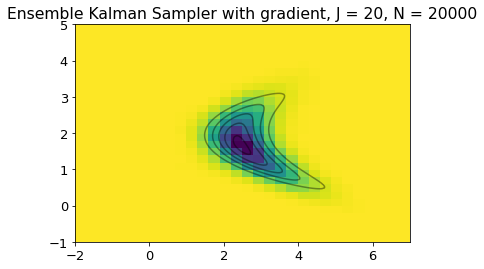

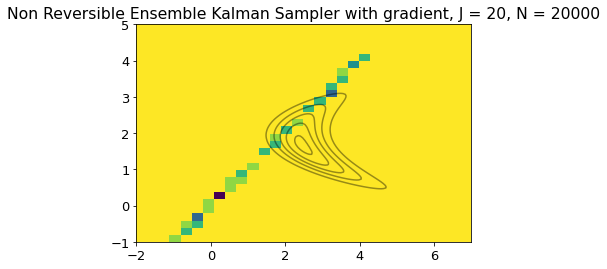

In [27]:
# plot results

N_burnin = 0#1000#int(N_sim/2)


binsx = np.linspace(xmin,xmax,31)
binsy = np.linspace(ymin,ymax,31)
#H1, yedges1, xedges1 = np.histogram2d(us_list_ULA[0,:,N_burnin:].flatten(),us_list_ULA[1,:,N_burnin:].flatten(), bins=[binsx,binsy])
#H2, yedges2, xedges2 = np.histogram2d(us_list_ALDI[0,:,N_burnin:].flatten(),us_list_ALDI[1,:,N_burnin:].flatten(), bins=[binsx,binsy])
H3, yedges3, xedges3 = np.histogram2d(us_list_ALDI2[0,:,N_burnin:].flatten(),us_list_ALDI2[1,:,N_burnin:].flatten(), bins=[binsx,binsy])
H4, yedges4, xedges4 = np.histogram2d(us_list_ALDINR[0,:,N_burnin:].flatten(),us_list_ALDINR[0,:,N_burnin:].flatten(), bins=[binsx,binsy])


"""
plt.figure()
plt.pcolormesh(yedges1, xedges1, H1.T, cmap=pl.cm.viridis_r); 
plt.xlim((xmin,xmax))
plt.ylim((ymin,ymax))
plt.contour(U0, U1, np.exp(-I(U)), 5, alpha=0.4, colors="black")
plt.title("Ensemble Langevin Sampler, J = "+str(J)+", N = "+str(N_sim))
"""
"""
plt.figure()
plt.pcolormesh(yedges2, xedges2, H2.T, cmap=pl.cm.viridis_r); 
plt.xlim((xmin,xmax))
plt.ylim((ymin,ymax))
plt.contour(U0, U1, np.exp(-I(U)), 5, alpha=0.4, colors="black")
plt.title("Ensemble Kalman Sampler without gradient, J = "+str(J)+", N = "+str(N_sim))
"""

plt.figure()
plt.pcolormesh(yedges3, xedges3, H3.T, cmap=pl.cm.viridis_r); 
plt.xlim((xmin,xmax))
plt.ylim((ymin,ymax))
plt.contour(U0, U1, np.exp(-I(U)), 5, alpha=0.4, colors="black")
plt.title("Ensemble Kalman Sampler with gradient, J = "+str(J)+", N = "+str(N_sim))

plt.figure()
plt.pcolormesh(yedges4, xedges4, H4.T, cmap=pl.cm.viridis_r); 
plt.xlim((xmin,xmax))
plt.ylim((ymin,ymax))
plt.contour(U0, U1, np.exp(-I(U)), 5, alpha=0.4, colors="black")
plt.title("Non Reversible Ensemble Kalman Sampler with gradient, J = "+str(J)+", N = "+str(N_sim))
